# Objetivo del proceso a realizar				
## Objetivos del desafío 1			
- Efectuar una limpieza del dataset provisto. Particularmente, deberá diseñar estrategias para lidiar con los datos perdidos en ciertas variables.		
- Realizar un análisis descriptivo de las principales variables.		
- Crear nuevas columnas a partir de las características dadas que puedan tener valor predictivo.		

### 1) Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re
%matplotlib inline

pd.set_option('display.float_format', lambda x: '%.3f' % x) # Evita la notacion cientifica
pd.set_option('display.max_columns', 500) # Ancho de cantidad de columnas
# pd.set_option('display.max_colwidth', None) #Ancho de lo que tiene dentro la columna

In [2]:
path = '~/Desktop/Data/properatti.csv'
data = pd.read_csv(path, sep = ",", index_col='Unnamed: 0')

In [3]:
df = data.copy()

### 2) Analisis General del Data Set

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 121220 entries, 0 to 121219
Data columns (total 25 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   operation                   121220 non-null  object 
 1   property_type               121220 non-null  object 
 2   place_name                  121197 non-null  object 
 3   place_with_parent_names     121220 non-null  object 
 4   country_name                121220 non-null  object 
 5   state_name                  121220 non-null  object 
 6   geonames_id                 102503 non-null  float64
 7   lat-lon                     69670 non-null   object 
 8   lat                         69670 non-null   float64
 9   lon                         69670 non-null   float64
 10  price                       100810 non-null  float64
 11  currency                    100809 non-null  object 
 12  price_aprox_local_currency  100810 non-null  float64
 13  price_aprox_us

Revisamos el porcentaje de nulos

In [5]:
df.isnull().sum()/df.shape[0]*100

operation                     0.000
property_type                 0.000
place_name                    0.019
place_with_parent_names       0.000
country_name                  0.000
state_name                    0.000
geonames_id                  15.441
lat-lon                      42.526
lat                          42.526
lon                          42.526
price                        16.837
currency                     16.838
price_aprox_local_currency   16.837
price_aprox_usd              16.837
surface_total_in_m2          32.443
surface_covered_in_m2        16.422
price_usd_per_m2             43.395
price_per_m2                 27.687
floor                        93.484
rooms                        60.906
expenses                     88.235
properati_url                 0.000
description                   0.002
title                         0.000
image_thumbnail               2.567
dtype: float64

Transformamos a category las variables currency state_name country_name place_with_parent_names place_name property_type operation.

Transformamos a string las variables title description properati_url


In [6]:
df.iloc[:,1:7]=df.iloc[:,1:7].astype('category')
df.iloc[:,22:25]=df.iloc[:,22:25].astype(str)
df['currency']=df.currency.astype('category')

In [7]:
df.dtypes

operation                       object
property_type                 category
place_name                    category
place_with_parent_names       category
country_name                  category
state_name                    category
geonames_id                   category
lat-lon                         object
lat                            float64
lon                            float64
price                          float64
currency                      category
price_aprox_local_currency     float64
price_aprox_usd                float64
surface_total_in_m2            float64
surface_covered_in_m2          float64
price_usd_per_m2               float64
price_per_m2                   float64
floor                          float64
rooms                          float64
expenses                       float64
properati_url                   object
description                     object
title                           object
image_thumbnail                 object
dtype: object

### 3) Analisis de duplicados

Vamos a ver si tenemos inmuebles duplicados en nuetro dataset.

Definimos que tenemos un duplicado si coinciden las filas "price", "place_name", "title", "surface_total_in_m2"

In [8]:
df.duplicated(['price','place_name','title','surface_total_in_m2']).any()

True

Nos muestra que tenemos duplicados, vamos a estudiarlos

In [9]:
duplicados_mask=df.duplicated(['price','place_name','title','surface_total_in_m2'], keep=False)


df[duplicados_mask].sort_values(['price','place_name','title','surface_total_in_m2'])[:20]


,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
47708,sell,apartment,Florida,|Argentina|Bs.As. G.B.A. Zona Norte|Vicente Ló...,Argentina,Bs.As. G.B.A. Zona Norte,3433908.000,"-34.535975,-58.478594",-34.536,-58.479,20000.000,USD,352890.000,20000.000,NaN,20.000,NaN,1000.000,NaN,3.000,NaN,http://www.properati.com.ar/198vn_venta_depart...,Corredor Responsable: Lucrecia Saulle - CSI 55...,VENTA COCHERA PLANTA BAJA DESC. VICENTE LOPEZ,https://thumbs4.properati.com/4/WOilGm5UnJ1yY0...
47715,sell,apartment,Florida,|Argentina|Bs.As. G.B.A. Zona Norte|Vicente Ló...,Argentina,Bs.As. G.B.A. Zona Norte,3433908.000,"-34.535975,-58.478594",-34.536,-58.479,20000.000,USD,352890.000,20000.000,NaN,20.000,NaN,1000.000,NaN,3.000,NaN,http://www.properati.com.ar/198vw_venta_depart...,Corredor Responsable: Lucrecia Saulle - CSI 55...,VENTA COCHERA PLANTA BAJA DESC. VICENTE LOPEZ,https://thumbs4.properati.com/4/RXmmPdghDy85Jc...
47717,sell,apartment,Florida,|Argentina|Bs.As. G.B.A. Zona Norte|Vicente Ló...,Argentina,Bs.As. G.B.A. Zona Norte,3433908.000,"-34.535975,-58.478594",-34.536,-58.479,20000.000,USD,352890.000,20000.000,NaN,20.000,NaN,1000.000,NaN,3.000,NaN,http://www.properati.com.ar/198vy_venta_depart...,Corredor Responsable: Lucrecia Saulle - CSI 55...,VENTA COCHERA PLANTA BAJA DESC. VICENTE LOPEZ,https://thumbs4.properati.com/4/RXmmPdghDy85Jc...
28938,sell,apartment,San Telmo,|Argentina|Capital Federal|San Telmo|,Argentina,Capital Federal,3428113.000,"-34.6234536,-58.3764477",-34.623,-58.376,22400.000,USD,395236.800,22400.000,13.000,0.000,1723.077,NaN,NaN,NaN,1800.000,http://www.properati.com.ar/17xm3_venta_depart...,"Departamento de 2 ambientes, con bajo mesada, ...",Departamento - San Telmo,https://thumbs4.properati.com/4/mvGoVviheZmfXv...
88036,sell,apartment,San Telmo,|Argentina|Capital Federal|San Telmo|,Argentina,Capital Federal,3428113.000,"-34.6234817427,-58.3764730084",-34.623,-58.376,22400.000,USD,395236.800,22400.000,13.000,NaN,1723.077,NaN,NaN,NaN,1800.000,http://www.properati.com.ar/1b6q5_venta_depart...,"Departamento de 2 ambientes, con bajo mesada, ...",Departamento - San Telmo,https://thumbs4.properati.com/0/MNoZTpXQpRO_rP...
48580,sell,house,Barrio Alto Camet,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,NaN,"-37.9541351,-57.5374449",-37.954,-57.537,27000.000,USD,476401.500,27000.000,310.000,30.000,87.097,900.000,NaN,2.000,NaN,http://www.properati.com.ar/19ado_venta_casa_b...,Dueño vende casa de 2 ambientes (1 dormitorio)...,Casa venta,https://thumbs4.properati.com/2/IVRHc8WDSxe45O...
48581,sell,house,Barrio Alto Camet,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,NaN,"-37.9541351,-57.5374449",-37.954,-57.537,27000.000,USD,476401.500,27000.000,310.000,30.000,87.097,900.000,NaN,2.000,NaN,http://www.properati.com.ar/19adp_venta_casa_b...,Dueño vende casa de 2 ambientes (1 dormitorio)...,Casa venta,https://thumbs4.properati.com/2/IVRHc8WDSxe45O...
48588,sell,house,Barrio Alto Camet,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,NaN,"-38.416097,-63.616672",-38.416,-63.617,27000.000,USD,476401.500,27000.000,310.000,30.000,87.097,900.000,NaN,2.000,NaN,http://www.properati.com.ar/19ae1_venta_casa_b...,Dueño vende casa de 2 ambientes (1 dormitorio)...,Casa venta,https://thumbs4.properati.com/3/eHvASCTC2qj_Ev...
94684,sell,store,Lanús,|Argentina|Bs.As. G.B.A. Zona Sur|Lanús|Lanús|,Argentina,Bs.As. G.B.A. Zona Sur,NaN,NaN,NaN,NaN,27000.000,USD,476401.500,27000.000,19.000,1.000,1421.053,27000.000,NaN,NaN,NaN,http://www.properati.com.ar/1bfyn_venta_local_...,Local Comercial de 3 x 6.50.-Gastos de escritu...,Local en Lanús Oeste,https://thumbs4.properati

Luego de observar el dataframe de duplicados, podemos comprobar que efectivamente lo son, asi que procedemos a dropearlos.

In [10]:
df = df.drop_duplicates(['price','place_name','title','surface_total_in_m2'])


Verificamos que todas las propiedades provistas estan para la venta, y ninguna en renta, con lo cual la columna 'operation' no nos aporta mucha informacion.

In [11]:
df.operation.unique()

array(['sell'], dtype=object)

Vamos a revisar los valores estadisticos de las variables numericas de nuestro Data set

In [12]:
cols=['price','price_aprox_local_currency','price_aprox_usd','surface_total_in_m2','surface_covered_in_m2','price_usd_per_m2','price_per_m2']
df[cols].describe()

,price,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2
count,94699.000,94699.000,94699.000,74106.000,91858.000,64887.000,82363.000
mean,465578.488,4287216.602,242977.506,242.941,137.460,2141.952,6772.532
std,2307937.712,7044238.337,399231.394,1739.620,759.461,2744.342,28822.614
min,0.000,0.000,0.000,0.000,0.000,0.600,1.510
25%,110000.000,1588005.000,90000.000,51.000,46.000,1200.000,1534.942
50%,185000.000,2579925.850,146217.000,88.000,77.000,1795.455,2200.000
75%,420000.000,4764015.000,270000.000,214.000,157.000,2481.481,3333.333
max,650000000.000,821271104.300,46545445.000,200000.000,187000.000,206333.333,3999999.960


Aca podemos observar algunos valores extraños en el data set:

* El valor minimo de superficie total, es 0.

* El valor minimo de venta es 0.

* El valor maximo de superficie llega a 20 hectareas


### 4) Analisis de columnas

**Analisis Descriptivo de las principales variables:**

Podemos separar a nuestras variables en 3 grandes grupos por su tipo:

Variables georeferenciales:

* geonames_id                  
* lat-lon                       
* lat                           
* lon                           

Variables relacionadas con el precio del inmueble: 

* price_per_m2: Es nuestra variable objetivo, es la que vamos a querer predecir en la siguiente etapa del trabajo, nos representa el precio por metro cuadrado del inmueble.VARIABLE CONTINUA

* price_usd_per_m2: Esta variable nos indica el valor en dolares por metro cuadrado del inmueble publicado.VARIABLE CONTINUA

* price: Esta variable nos indica el precio del inmueble expresado en la moneda "currency".VARIABLE CONTINUA

* currency: Esta variable nos indica la moneda en la que se publico el inmueble, puede valer (usd,ars,uyu,pen).VARIABLE CATEGORICA

Variables relacionadas con el tamaño del inmueble:

* surface_total_in_m2: Esta variable nos indica los metros cuadrados totales de la propiedad publicada.VARIABLE CONTINUA

* surface_covered_in_m2: Esta variable nos indica los metros cuadrados cubiertos de la propiedad publicada.VARIABLE CONTINUA

Variables que nos dan informacion sobre el lugar donde se encuentra la propiedad

* property_type: Nos indica el tipo de propiedad publicada (ph, apartment, house, store).VARIABLE CATEGORICA

* place_name: Nos indica el barrio(si es dentro de CABA) o localidad, de donde esta la propiedad publicada.VARIABLE CATEGORICA

* state_name: Nos indica la provincia en donde se encuentra la propiedad publicada.VARIABLE CATEGORICA

* place_with_parent_names: Es una combinacion de place_name y state_name, en algunos casos, con algunos datos mas sobre la ubicacion, como el partido. place_with_parent_names = |country_name|state_name|place_name|.VARIABLE CATEGORICA

Variables relacionadas con caracteristicas del inmueble:

* floor: Numero de piso en donde esta ubicado el inmueble(en caso de corresponder).VARIABLE CUALITATIVA ORDINAL

* rooms: Esta variable nos indica la cantidad de ambientes que posee el inmueble.VARIABLE CATEGORICA

* expenses: Valor de las expensas del inmueble (en caso de corresponder).VARIABLE CONTINUA

* description: Una breve descripcion sobre la propiedad en venta.

### 5) Análisis inicial de la distribución de los datos

In [13]:
#Para evitar problemas con los strings, convertimos todo el df en minuscula y eliminamos los ".".
df = df.applymap(lambda x: x.lower() if type(x) is str else x)

df = df.replace('\.',"",regex=True)


Droppeamos valores ilogicos, por ejemplo que un valor de superficie total sea menor que el de superficie cubierta, que alguna de las superficies valga 0, o que el precio de venta sea 0

In [14]:
sup_total_incorrecta = np.logical_or(df['surface_total_in_m2'] < df['surface_covered_in_m2'], df['surface_total_in_m2']==0)

df_sup_total_incorrecta=df[sup_total_incorrecta]
df_sup_total_incorrecta.shape

(1398, 25)

In [15]:
df.drop(index=df_sup_total_incorrecta.index, inplace=True)

In [16]:
df[sup_total_incorrecta]

<ipython-input-16-b1fafb12e45e>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df[sup_total_incorrecta]


,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail


In [17]:
precio_incorrecto = df[df.price == 0]
precio_incorrecto

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
9761,sell,house,córdoba,|argentina|córdoba|,argentina,córdoba,3860255.000,"45458426,-7567893099",4.546,-75.679,0.000,NaN,0.000,0.000,NaN,NaN,NaN,NaN,2.000,3.000,NaN,http://wwwproperaticomar/165i3_venta_casa_cord...,casa en venta de 2 dorm en armenia,se vende casa en el barrio el limonar,https://thumbs4properaticom/2/2hubkpzv0rywdaaj...


In [18]:
df.drop(index = precio_incorrecto.index ,inplace= True)

Dropeamos propiedades falsas

In [19]:
patron_falsas = re.compile(r'estas(\s)?propiedades(\s)?son(\s)?falsas')

encuentra_falsas = df.description.apply(lambda x: re.search(patron_falsas,str(x)))
falsas_mask=encuentra_falsas.notnull()
index_maldad=encuentra_falsas[falsas_mask].index

df = df.drop(index_maldad)

Dropeamos departamentos que tengan mas de 750 m2 (limite tomado a partir de publicaciones de zonaprop), y los que tengan menos de 18 m2(minimo permitido)

In [20]:
departamentos_fueradeumbral = \
df[np.logical_and(df.property_type=='apartment',np.logical_or(df.surface_total_in_m2>750, df.surface_total_in_m2<18))].index

In [21]:
df = df.drop(index =departamentos_fueradeumbral)

Dropeamos inmuebles que sean ventas de pozo, o para inversion, inmuebles que aun no fueron construidos, y por eso tienen un precio "promocionado"

In [22]:
patron_pozo = re.compile(r'pozo|inversion|financiacion|pre-venta|en(\s)?construccion|entrega|cuotas|emprendimiento|a(\s)?desarrollarse|proyecto')

encuentra_pozo = df.description.apply(lambda x: re.search(patron_pozo,str(x)))
                                      
pozo_mask=encuentra_pozo.notnull()

pozo = encuentra_pozo[pozo_mask].apply(lambda x: x.group())
print(df.shape)
df = df.drop(index = pozo.index)
print(df.shape)

patron_pozo = re.compile(r'pozo|inversion|financiacion|pre-venta|en(\s)?construccion|entrega|cuotas|emprendimiento|a(\s)?desarrollarse|proyecto')

encuentra_pozo = df.title.apply(lambda x: re.search(patron_pozo,str(x)))
                                      
pozo_mask=encuentra_pozo.notnull()

pozo = encuentra_pozo[pozo_mask].apply(lambda x: x.group())
print(df.shape)
df = df.drop(index = pozo.index)
print(df.shape)

(107839, 25)
(87535, 25)
(87535, 25)
(86869, 25)


In [23]:
df[df.place_name=='capital federal'].title[:5]

108    casa 180m² con 2 plantas en navarro, julián 29...
110    casa 744m² con 2 plantas en del valle iberluce...
115    casa 720m² con plantas en palma, diego 1800, a...
119    casa 200m² con cochera en barbosa, gerónimo 14...
121    casa 340m² con cochera en palma, diego 1300, a...
Name: title, dtype: object

In [24]:
place_names=list(df.place_name.unique())

In [25]:
df["PLACE NAME"]=df.place_name

df_capitalfederal_mal_cargado = df[df.place_name=='capital federal']

for place in place_names:
    patron_placenames = re.compile(str(place))
    encuentra_names = df_capitalfederal_mal_cargado.description.apply(lambda x: re.search(patron_placenames,str(x)))
    encuentra_names_mask = encuentra_names.notnull()
    names = encuentra_names[encuentra_names_mask].apply(lambda x: x.group())
    df.loc[names.index,'PLACE NAME']=names
    
for place in place_names:
    patron_placenames = re.compile(str(place))
    encuentra_names = df_capitalfederal_mal_cargado.title.apply(lambda x: re.search(patron_placenames,str(x)))
    encuentra_names_mask = encuentra_names.notnull()
    names = encuentra_names[encuentra_names_mask].apply(lambda x: x.group())
    df.loc[names.index,'PLACE NAME']=names


Eliminamos los pocos registros que no tenian informacion sobre su ubicacion y estaban mal ingresados.

In [26]:
df_mal_ingresados = df[df["PLACE NAME"]=='capital federal']
df_mal_ingresados.shape[0]
df_mal_infresados_index = df_mal_ingresados.index

In [27]:
df = df.drop(df_mal_infresados_index)

Revisamos para capital federal los valores.

In [28]:
df_capital = df[df.state_name=='capital federal']
df_capital['PLACE NAME'].unique()

array(['mataderos', 'liniers', 'belgrano', 'palermo soho', 'palermo',
       'flores', 'boedo', 'las cañitas', 'puerto madero', 'balvanera',
       'caballito', 'navarro', 'colegiales', 'floresta', 'barrio norte',
       'barracas', 'recoleta', 'chacarita', 'nuñez', 'almagro',
       'constitución', 'villa urquiza', 'villa crespo',
       'palermo hollywood', 'monserrat', 'pompeya', 'agronomía',
       'parque centenario', 'palermo chico', 'villa luro', 'villa devoto',
       'san telmo', 'parque avellaneda', 'boca', 'coghlan',
       'san cristobal', 'villa pueyrredón', 'velez sarsfield', 'abasto',
       'versalles', 'villa del parque', 'monte castro', 'retiro', 'nan',
       'parque patricios', 'saavedra', 'villa santa rita', 'carpintería',
       'congreso', 'san jose', 'centro / microcentro', 'once',
       'tribunales', 'paternal', 'parque chacabuco', 'catalinas',
       'san nicolás', 'corrientes', 'ituzaingó', 'córdoba', 'avellaneda',
       'villa general mitre', 'sarmiento', 

In [29]:
df_capital[df_capital['PLACE NAME']=='navarro'].title.values

array(['casa 180m² con 2 plantas en navarro, julián 2900, argentina, capital federal, por u$s 170000'],
      dtype=object)

In [30]:
#Mal cargado
df = df.drop(df[df['PLACE NAME']=='navarro'].index)

In [31]:
df_capital[df_capital['PLACE NAME']=='carpintería'].title.values

array(['departamento venta'], dtype=object)

In [32]:
#Mal cargado
df = df.drop(df[df['PLACE NAME']=='carpintería'].index)

In [33]:
#Mal cargado
df = df.drop(df[df['PLACE NAME']=='ituzaingó'].index)

In [34]:
barrio=df_capital[df_capital['PLACE NAME']=='córdoba']['description'].index

df_capital[df_capital['PLACE NAME']=='córdoba']['description'].values

df.loc[barrio,'PLACE NAME']='palermo'

In [35]:
df_capital[df_capital['PLACE NAME']=='rivadavia']


,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME
6952,sell,store,capital federal,|argentina|capital federal|,argentina,capital federal,3433955.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/15w56_venta_local_cap...,"local comercial a la calle , a 10 mts de avriv...",local a la calle en venta ciudad autonoma de b...,nan,rivadavia
10194,sell,apartment,capital federal,|argentina|capital federal|,argentina,capital federal,3433955.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.000,NaN,NaN,NaN,1.000,NaN,http://wwwproperaticomar/166o1_venta_departame...,"unicos monoambientes a estrenar, cocina integr...",departamento en venta ciudad autonoma de bueno...,https://thumbs4properaticom/8/_9yonhzolmvisb0o...,rivadavia
21365,sell,store,capital federal,|argentina|capital federal|,argentina,capital federal,3433955.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,66.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/17fbm_venta_local_cap...,"local a la calle a metros de rivadavia, de 66 ...",local a la calle en venta ciudad autonoma de b...,https://thumbs4properaticom/3/fs5gnj0imtcuuebs...,rivadavia
72115,sell,house,capital federal,|argentina|capital federal|,argentina,capital federal,3433955.000,"-346338215043,-584505999727",-34.634,-58.451,340000.000,usd,5999130.000,340000.000,NaN,127.000,NaN,2677.165,NaN,NaN,NaN,http://wwwproperaticomar/1alvl_venta_casa_capi...,"muy buen casa de 5 ambientes con cochera, pati...",casa - pchacabuco,https://thumbs4properaticom/3/9foevhz3q_osqigf...,rivadavia
72420,sell,apartment,capital federal,|argentina|capital federal|,argentina,capital federal,3433955.000,"-34608474032,-583818630313",-34.608,-58.382,94000.000,usd,1658583.000,94000.000,27.000,27.000,3481.481,3481.481,NaN,NaN,3000.000,http://wwwproperaticomar/1ambn_venta_departame...,"depto con vista a verde, deck y lago artificia...",av rivadavia al 1100- departamento - centro,https://thumbs4properaticom/2/naxus_oohrhqhmsj...,rivadavia


In [36]:
df.loc[[6952,72420],'PLACE NAME']='centro'
df.loc[72115,'PLACE NAME']='parquechacabuco'
df = df.drop([10194,21365])

In [37]:
barrio=df_capital[df_capital['PLACE NAME']=='olivos'].index
df.loc[barrio,'state_name']='bsas gba zona norte'

In [38]:
barrio = df_capital[df_capital['PLACE NAME']=='santiago del estero'].index
df.loc[barrio,'PLACE NAME']='constitucion'

In [39]:
barrio=df_capital[df_capital['PLACE NAME']=='chubut'].index
df.loc[barrio,'state_name']='bsas gba zona norte'

In [40]:
barrio=df_capital[df_capital['PLACE NAME']=='misiones'].index
df.loc[barrio,'PLACE NAME']='palermo'

In [41]:
barrio=df_capital[df_capital['PLACE NAME']=='lima'].index
df_capital[df_capital['PLACE NAME']=='lima'].title.values



array(['piso en venta ciudad autonoma de buenos aires / buenos aires (a004 3266)',
       'versailles: amplia vivienda de siete ambientes en terreno igualmente amplio con dos cocheras cubiertas y una descubierta en barrio residencial gran parque con pileta',
       'monoambiente - bsanta rita',
       'monoambiente divisible- bsanta rita',
       'departamento divisible - bsanta rita',
       'monoambiente divisible  - bsanta rita',
       'monoambiente divisible - bsanta rita',
       'departamento - villa gralmitre'], dtype=object)

In [42]:
df = df.drop(barrio[0])
df.loc[barrio[1],'PLACE NAME'] = 'versalles'   
df.loc[barrio[2:6],'PLACE NAME']='santarita'
df.loc[barrio[7],'PLACE NAME']='villageneralmitre'


In [43]:
barrio=df_capital[df_capital['PLACE NAME']=='haedo'].index
df.loc[barrio,'state_name']='bsas gba zona oeste'


In [44]:
barrio = df_capital[df_capital['PLACE NAME']=='campana'].index
df = df.drop(barrio)


In [45]:
barrio = df_capital[df_capital['PLACE NAME']=='el zorzal'].index
df.loc[barrio,'PLACE NAME'] = 'liniers'   


In [46]:
barrio = df_capital[df_capital['PLACE NAME']=='uspallata'].index
df.loc[barrio,'PLACE NAME'] = 'parquepatricios' 

In [47]:
barrio=df_capital[df_capital['PLACE NAME']=='tandil'].index
df.loc[barrio,'state_name']='bsas gba zona sur'

In [48]:
barrio=df_capital[df_capital['PLACE NAME']=='azul'].index
df.loc[barrio,'state_name']='bsas gba zona centro'

In [49]:
barrio=df_capital[df_capital['PLACE NAME']=='santa rosa'].index
df.loc[barrio,'state_name']='bsas gba zona norte'

In [50]:
#Mal cargado
df = df.drop(df[df['PLACE NAME']=='las calles'].index)

In [51]:
#Mal cargado
df = df.drop(df[df['PLACE NAME']=='pinto'].index)

In [52]:
df_capital[df_capital['PLACE NAME']=='centenario'].title.values

array(['río de janeiro 900- pcentenario', 'departamento en pcentenario',
       'departamento - pcentenario'], dtype=object)

In [53]:
barrio = df_capital[df_capital['PLACE NAME']=='centenario'].index
df.loc[barrio,'PLACE NAME'] = 'caballito' 

In [54]:
barrio=df_capital[df_capital['PLACE NAME']=='concordia'].index
df.loc[barrio,'PLACE NAME'] = 'villadelparque' 

In [55]:
barrio=df_capital[df_capital['PLACE NAME']=='delta'].index
df.loc[barrio,'PLACE NAME'] = 'parquechacabuco' 

In [56]:
barrio=df_capital[df_capital['PLACE NAME']=='puerto'].index
df.loc[barrio,'PLACE NAME'] = 'puertomadero' 

In [57]:
barrio=df_capital[df_capital['PLACE NAME']=='moreno'].index
df.loc[barrio,'PLACE NAME'] = 'parquechacabuco' 

In [58]:
barrio=df_capital[df_capital['PLACE NAME']=='tres arroyos'].index
df.loc[barrio,'PLACE NAME'] = 'villageneralmitre' 

In [59]:
barrio=df_capital[df_capital['PLACE NAME']=='la paz'].index
df.loc[barrio,'PLACE NAME'] = 'parquechacabuco' 

Separamos las columnas que consideramos tengan alguna relacion con el precio_per_m2 o nos puedan brindar informacion util 

In [60]:
cols_utiles_sin_price=['property_type','PLACE NAME','place_with_parent_names','state_name','currency'\
            ,'price_aprox_local_currency','price_aprox_usd','surface_total_in_m2','surface_covered_in_m2'\
            ,'price_usd_per_m2','price_per_m2','floor','rooms','expenses','description']

In [61]:
groupby_property_type=df.groupby('property_type')[cols_utiles_sin_price].median()
groupby_property_type

,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses
property_type,,,,,,,,,
apartment,2117340.000,120000.000,61.000,55.000,2148.289,2538.462,3.000,2.000,1800.000
house,4234680.000,240000.000,286.000,180.000,1041.667,1518.325,2.000,4.000,4800.000
ph,2117340.000,120000.000,98.000,75.000,1307.692,1714.286,2.000,3.000,500.000
store,3652411.500,207000.000,167.000,120.000,1580.000,1977.401,1.000,1.000,1111.000


Dado que 'price', depende del valor de currency, si esta en usd o en ars, vamos a calcularlos por separados, para no crear un bias.

In [62]:
groupby_property_type_price_usd=df[df.currency=='usd'].groupby('property_type')['price'].median()
groupby_property_type_price_ars=df[df.currency=='ars'].groupby('property_type')['price'].median()

groupby_property_type['price_usd']=groupby_property_type_price_usd
groupby_property_type['price_ars']=groupby_property_type_price_ars
groupby_property_type['cant de propiedades']=df.groupby('property_type')['operation'].count()

groupby_property_type

,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,price_usd,price_ars,cant de propiedades
property_type,,,,,,,,,,,,
apartment,2117340.000,120000.000,61.000,55.000,2148.289,2538.462,3.000,2.000,1800.000,129000.000,1361000.000,43969
house,4234680.000,240000.000,286.000,180.000,1041.667,1518.325,2.000,4.000,4800.000,250000.000,1400000.000,32957
ph,2117340.000,120000.000,98.000,75.000,1307.692,1714.286,2.000,3.000,500.000,125000.000,1035000.000,4878
store,3652411.500,207000.000,167.000,120.000,1580.000,1977.401,1.000,1.000,1111.000,230000.000,900000.000,3423


In [63]:
df_toplot=groupby_property_type.reset_index()

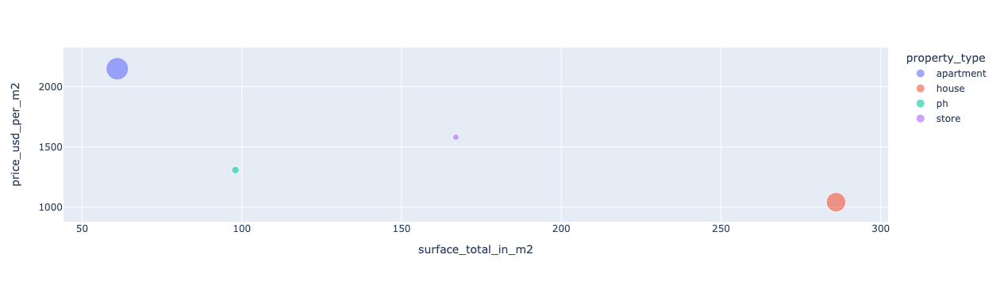

In [64]:
fig = px.scatter(data_frame = df_toplot, x = "surface_total_in_m2", y = "price_usd_per_m2",
                 size = "cant de propiedades", color = "property_type", opacity = 0.6)
fig.show()


Al agrupar las propiedades por su tipo, podemos realizar las siguientes observaciones:

*  Las casas son las propiedades que tienen el precio mas bajo en relacion a sus metros cuadrados.

*  Los departamentos son las propiedades que mayor valor por metro cuadrado tienen.

*  La mayoria de los inmuebles publicados son departamentos, seguidos por las casas.

In [65]:
groupby_provincia_price_usd=df[df.currency=='usd'].groupby('state_name')['price'].median()
groupby_provincia_price_ars=df[df.currency=='ars'].groupby('state_name')['price'].median()

groupby_provincia=df.groupby('state_name')[cols_utiles_sin_price].median()

groupby_provincia['price_usd']=groupby_provincia_price_usd
groupby_provincia['price_ars']=groupby_provincia_price_ars
groupby_provincia['cant de propiedades']=df.groupby('state_name')[cols_utiles_sin_price].count().property_type


groupby_provincia=groupby_provincia.sort_values('cant de propiedades',ascending=False)
groupby_provincia


,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,price_usd,price_ars,cant de propiedades
state_name,,,,,,,,,,,,
capital federal,2911342.500,165000.000,71.000,63.000,2405.063,2666.667,4.000,3.000,2143.000,165333.000,1709217.000,21176
bsas gba zona norte,4234680.000,240000.000,193.000,140.000,1583.333,1928.934,3.000,3.000,4000.000,245000.000,2283400.000,18968
bsas gba zona sur,2519634.600,142800.000,133.000,102.000,1408.249,1592.920,3.000,3.000,1500.000,145000.000,1020000.000,10860
córdoba,1830701.560,103754.800,90.000,100.000,1153.846,2750.000,1.000,3.000,1400.000,165000.000,1350000.000,8652
buenos aires costa atlántica,1764450.000,100000.000,75.000,69.000,1578.947,1702.128,4.000,3.000,1500.000,100000.000,1770000.000,8558
bsas gba zona oeste,2117340.000,120000.000,169.000,90.000,1153.846,1575.342,3.000,3.000,800.000,120000.000,750000.000,6778
santa fe,1499782.500,85000.000,70.000,62.000,1518.557,14000.000,3.000,3.000,800.000,129000.000,1300000.000,4968
buenos aires interior,2293785.000,130000.000,249.500,120.000,748.891,1375.000,3.000,4.000,1200.000,150000.000,1100000.000,1796
río negro,2823120.000,160000.000,175.000,125.000,1400.000,2441.667,4.000,4.000,600.000,180000.000,1100000.000,566


In [66]:
groupby_provincia_toplot=groupby_provincia.reset_index()

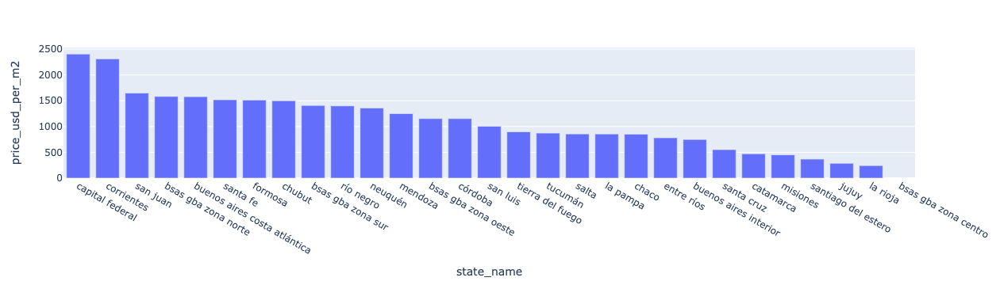

In [67]:
fig = px.bar(groupby_provincia_toplot, x="state_name", y="price_usd_per_m2",  barmode='stack')

fig.update_layout(
    hoverlabel=dict(
        bgcolor="white", 
        font_size=16, 
        font_family="Rockwell"
    )
)

fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'}) #Ordena manera decreciente


fig.show()

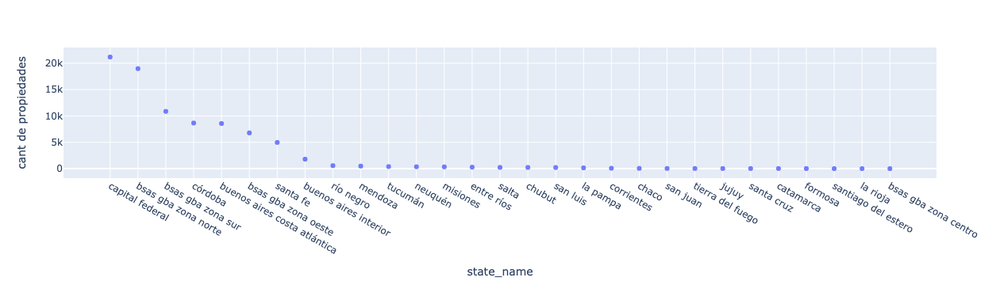

In [68]:
fig = px.scatter(data_frame = groupby_provincia_toplot, y = "cant de propiedades", x = "state_name",
                  opacity = 0.9)
fig.show()

Al agrupar las propiedades por provincia, podemos realizar las siguientes observaciones:

*  Las propiedades que se encuentran en capital federal, son las que tienen un precio por metro cuadrado en usd mas alto.

*  La mayor cantidad de propiedades en venta, se encuentran en capital federal.


### 6) Analisis de consistencia y calidad de los datos

## place_with_parent_names

place_with_parent_names = |country_name|state_name|place_name|, con lo cual, no nos da informacion extra, y es mas facil utilizar para los groupby sus columnas "hijas", con lo cual, la utilizaremos para completar "place_name" y "Provincia, que tiene algunos nulos y luego la descartaremos.


Vamos a comprobar si podemos completar place_name, con place_with_parent_names. Para esto, vamos a eliminar las filas donde haya NaN en place_name y comparar si es igual al anteultimo elemento de place_with_parent_names, al aplicarle un split(el ultimo es el pipe).

In [69]:
place_name_tester=df.place_with_parent_names.apply(lambda x: x.split('|')[-2])
place_name_tester

0               mataderos
1                la plata
2               mataderos
3                 liniers
4                  centro
               ...       
121214         san isidro
121215           belgrano
121216             beccar
121218        plaza colón
121219    capital federal
Name: place_with_parent_names, Length: 85227, dtype: object

In [70]:
place_name_null_mask = df.place_name.isnull()

In [71]:
(place_name_tester[~place_name_null_mask]==df.place_name[~place_name_null_mask]).all()

True

Comprobamos que podemos imputar el valor de place_name , a partir de la columna place_with_parent_names, asi que vamos a imputarlo, creando una nueva columna, que utilice la informacion de los registros anteriores

In [72]:
df.loc[place_name_null_mask,'PLACE NAME']=place_name_tester

df['PLACE NAME'].isnull().sum()

0

Nota: Esto ocurre para todos los casos salvo para cuando la propiedad esta radicada en mar del plata

In [73]:
df_mardelplata_centro=df[np.logical_and(df.state_name!='capital federal', df['PLACE NAME']=='centro')]

df.loc[df_mardelplata_centro.index,'PLACE NAME'] = 'mar del plata'

In [74]:
patron_microcentro = re.compile(r'centro')

encontra_microcentro = df['PLACE NAME'].apply(lambda x: re.match(patron_microcentro,str(x)))

encontra_microcentro_mask = encontra_microcentro.notnull()

index_microcentro=encontra_microcentro[encontra_microcentro_mask].index

df.loc[index_microcentro,'PLACE NAME']='centro/microcentro'

Si bien no hay valores np.NaN, podemos ver que hay una categoria 'nan', que nos quedo, son pocos valores, y todos corresponden a la misma ubicacion "fernandez"

In [75]:
df[df['PLACE NAME']=='nan']

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME
842,sell,store,capital federal,|argentina|capital federal|,argentina,capital federal,3433955.000,NaN,NaN,NaN,53000.000,usd,935158.500,53000.000,NaN,24.000,NaN,2208.333,NaN,NaN,NaN,http://wwwproperaticomar/15g7m_venta_local_bs-...,s e vende con rentalocal en galerã­a el angel ...,"local en fernandez, av juan s 1200, argentina,...",https://thumbs4properaticom/9/7phmidnppqsn8xnv...,nan
846,sell,house,capital federal,|argentina|capital federal|,argentina,capital federal,3433955.000,NaN,NaN,NaN,495000.000,usd,8734027.500,495000.000,371.000,300.000,1334.232,1650.000,NaN,NaN,NaN,http://wwwproperaticomar/15g84_venta_casa_bs-a...,excelente inmueble muy buena ubicacionhall de ...,"casa 371m² con 2 plantas en fernandez, av juan...",https://thumbs4properaticom/1/7swleaerxp14xfvb...,nan
4792,sell,store,capital federal,|argentina|capital federal|,argentina,capital federal,3433955.000,NaN,NaN,NaN,60000.000,usd,1058670.000,60000.000,NaN,35.000,NaN,1714.286,NaN,NaN,NaN,http://wwwproperaticomar/15nvq_venta_local_bs-...,local de 2 plantas en muy linda galerã­a estil...,"local con 2 plantas en fernandez, av juan s 20...",nan,nan
10720,sell,store,capital federal,|argentina|capital federal|,argentina,capital federal,3433955.000,NaN,NaN,NaN,50000.000,usd,882225.000,50000.000,22.000,22.000,2272.727,2272.727,NaN,NaN,NaN,http://wwwproperaticomar/168tn_venta_local_bs-...,venta local en galeria paseo del golfcon entre...,"local 22m² con 2 plantas en fernandez, av juan...",https://thumbs4properaticom/0/wwdqvn0fy9j9vmg5...,nan
16128,sell,house,capital federal,|argentina|capital federal|,argentina,capital federal,3433955.000,NaN,NaN,NaN,2700000.000,usd,47640150.000,2700000.000,3484.000,890.000,774.971,3033.708,NaN,NaN,NaN,http://wwwproperaticomar/16xp2_venta_casa_bs-a...,principales caracteristicas de la propiedad:la...,"casa 3484m² con cochera en fernandez, av juan ...",https://thumbs4properaticom/2/4wmupzfrhjgb6hbz...,nan
38472,sell,store,capital federal,|argentina|capital federal|,argentina,capital federal,3433955.000,NaN,NaN,NaN,1000000.000,usd,17644500.000,1000000.000,345.000,187.000,2898.551,5347.594,NaN,NaN,NaN,http://wwwproperaticomar/18l6t_venta_local_cap...,excelente ubicaciã³n comercial local a estrena...,"local 345m² con 3 plantas en fernandez, av jua...",https://thumbs4properaticom/8/6cihn3ojsnwoia4o...,nan
71357,sell,house,capital federal,|argentina|capital federal|,argentina,capital federal,3433955.000,"-346268126273,-585232401467",-34.627,-58.523,NaN,NaN,NaN,NaN,380.000,351.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1akut_venta_casa_capi...,"excel propiedad de 4 dorm, 3 c/pisos flotantes...",excelente casa 4 amb con fondo y pileta!!!,https://thumbs4properaticom/5/gwmk7vgb_gvnfyno...,nan
75769,sell,apartment,capital federal,|argentina|capital federal|,argentina,capital federal,3433955.000,"-346405417155,-584785251993",-34.641,-58.479,79800.000,usd,1408031.100,79800.000,44.000,44.000,1813.636,1813.636,NaN,NaN,1900.000,http://wwwproperaticomar/1aqou_venta_departame...,venta departamento de 2 ambientes en capital ...,departamento directorio al 3900,https://thumbs4properaticom/2/qaa54z1bl5ivcf-p...,nan
112424,sell,ph,capital federal,|argentina|capital federal|,argentina,capital federal,3433955.000,NaN,NaN,NaN,105000.000,usd,1852672.500,105000.000,NaN,68.000,NaN,1544.118,NaN,NaN,NaN,http://wwwproperaticomar/1c6x7_venta_ph_capita...,departamento tipo casa de 3 ambientes al contr...,"ph - 3 ambientes, con patio y 2 terrazas - sin...",https://thumbs4properaticom/2/rftbt8vr5nbvjdcx...,nan


In [76]:
fila_fernandez = df[df['PLACE NAME']=='nan'].index[:6]
df.loc[fila_fernandez,'PLACE NAME']='fernandez'

dropeamos los valores que no pudimos obtener informacion de donde eran

In [77]:
df = df.drop(df[df['PLACE NAME']=='nan'].index)
df[df['PLACE NAME']=='nan']

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME


## surface_covered_in_m2

Vamos a imputar los valores NaN de surface_covered_in_m2, con informacion que encontremos el la variable description y ponerlos en una nueva columna que llamaremos SUPERFICIE CUBIERTA EN M2

Vamos a imputar valores de surface_covered_in_m2, a partir de datos obtenidos de la columna description

Para lo que es superficie cubierta, utilizamos un criterio para acotar de 404.9m2 maximo(quantile 90), para lo que serian casos como grandes depositos y 65m2, como minimo(quantile 10)

In [78]:
df['SUPERFICIE CUBIERTA EN M2']=df.surface_covered_in_m2

surface_covered_in_m2_null_mask=df.surface_covered_in_m2.isna()
patron_superficie_cubierta = re.compile(r'(cub(:)?\d+(m²|m2))|((cubierta|cub)(de)?(\d+))((m²|m2))|\d+(m²|m2)(cub)')

encuentra_superficie_cubierta = df.loc[surface_covered_in_m2_null_mask,'description'].apply(lambda x: re.search(patron_superficie_cubierta,str(x)))

encuentra_superficie_cubierta_mask=encuentra_superficie_cubierta.notnull()

superficie_cubierta=encuentra_superficie_cubierta[encuentra_superficie_cubierta_mask].apply(lambda x: x.group())

patron_limpiame_sup_cubierta = re.compile(r'\d+')
limpiame_sup_cubierta = superficie_cubierta.apply(lambda x: re.search(patron_limpiame_sup_cubierta,str(x)))

superficie_cubierta_str=limpiame_sup_cubierta.apply(lambda x: x.group())

superficie_cubierta_int = superficie_cubierta_str.astype(int)

superficie_cubierta_int_acotado_mask = np.logical_and(superficie_cubierta_int < superficie_cubierta_int.quantile(0.9),superficie_cubierta_int > superficie_cubierta_int.quantile(0.1))

superficie_cubierta_int_acotado=superficie_cubierta_int[superficie_cubierta_int_acotado_mask]

In [79]:
df.loc[surface_covered_in_m2_null_mask,'SUPERFICIE CUBIERTA EN M2'] = superficie_cubierta_int_acotado

## surface_total_in_m2

Vamos a completar valores a partir de datos que aparecen en description, creando una nueva columna llamada SUPERFICIE TOTAL EN M2

Utilizamos como criterio para acotar, el valor maximo de superficie total de 700m2(q3), y como minimo 44m2

Elegimos acotar los valores obtenidos con Regex, para no generar un bias, a partir de datos erroneos que haya tomado el patron.

In [80]:
df['SUPERFICIE TOTAL EN M2']=df.surface_total_in_m2

surface_total_in_m2_null_mask=df.surface_total_in_m2.isna()

patron_superficie_total = re.compile(r'(sup(\s)?cub(:)?(\s)?\d+(m²|m2|mts2))|((cubierta|cub)(\s)?(de)?(\s)?(\d+))((m²|m2|mts2))|\d+(\s)?(m²|m2|mts2)(\s)?(cub)|\d+\d+?(m²|m2|mts2)')

encuentra_superficie_total = df.loc[surface_total_in_m2_null_mask,'description'].apply(lambda x: re.search(patron_superficie_total,str(x)))

encuentra_superficie_total_mask=encuentra_superficie_total.notnull()

superficie_total_y_cubierta=encuentra_superficie_total[encuentra_superficie_total_mask].apply(lambda x: x.group())

patron_cubierta = re.compile(r'cub')

valores_sup_cubierta=superficie_total_y_cubierta.apply(lambda x:re.search(patron_cubierta,str(x)))

superficie_total=superficie_total_y_cubierta[valores_sup_cubierta.isnull()]


superficie_total_sin_m2=(superficie_total.replace('(m²|m2|mts2)','', regex=True))

superficie_total_int = superficie_total_sin_m2.astype(int)
superficie_total_int_acotado_mask = np.logical_and(superficie_total_int < superficie_total_int.quantile(0.8), superficie_total_int > superficie_total_int.quantile(0.2))

superficie_total_int_acotado=superficie_total_int[superficie_total_int_acotado_mask]



In [81]:
df.loc[surface_total_in_m2_null_mask,'SUPERFICIE TOTAL EN M2'] = superficie_total_int_acotado


## Price

El precio price_usd_per_m2, coincide con price/surface_covered_in_m2, cuando currency ==usd, para esto nos vamos a crear una nueva columna llamada PRECIO USD POR M2

In [82]:
df_dolares = df[df.currency=='usd']

df['PRECIO USD POR M2']=df_dolares[['price','surface_total_in_m2']].apply(lambda x: 0 if x.surface_total_in_m2 == 0 else x.price/x.surface_total_in_m2, axis=1)


In [83]:
df[['PRECIO USD POR M2','price_usd_per_m2']].sample(10)

,PRECIO USD POR M2,price_usd_per_m2
1915,NaN,NaN
55465,2316.667,2316.667
118782,NaN,NaN
111193,113.225,113.225
47968,NaN,NaN
105203,1933.333,1933.333
34557,NaN,NaN
51641,959.752,959.752
102086,3560.000,3560.000
80098,NaN,NaN


In [84]:
df['PRECIO USD POR M2'].notnull().sum()

44788

In [85]:
df['price_usd_per_m2'].notnull().sum()

48896

Como PRECIO USD POR M2 es igual que price_usd_per_m2, vamos a imputar los valores que podamos de PRECIO USD POR M2 con price_usd_per_m2

In [86]:
PRECIO_USD_POR_M2_null = df['PRECIO USD POR M2'].isna()

df.loc[PRECIO_USD_POR_M2_null,'PRECIO USD POR M2'] = df.loc[PRECIO_USD_POR_M2_null,'price_usd_per_m2']

#### Los precios estan en distintas monedas.

In [87]:
df.currency.value_counts()

usd    66657
ars     7027
uyu        1
pen        1
Name: currency, dtype: int64

##### Primero, vamos a estudiar los casos donde currency vale pen y uyu

In [88]:
df_currency_uyu=df[df.currency=='uyu']
df_currency_uyu.description.values

array(['casa con calefacción central, mendoza, san roque, por $ 650000000'],
      dtype=object)

In [89]:
df_currency_uyu

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2
107390,sell,house,san roque,|argentina|mendoza|san roque|,argentina,mendoza,3836586.000,NaN,NaN,NaN,650000000.000,uyu,405477284.730,22980378.290,NaN,NaN,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1by0s_venta_casa_san-...,"casa con calefacción central, mendoza, san roq...",casa - san vicente,https://thumbs4properaticom/2/pa0rbudkrk6ggvfy...,san roque,NaN,NaN,NaN


In [90]:
#Dado que el valor esta en otra moneda y nos parece una suma ilogica el precio, vamos a dropearlo
df = df.drop(index = df_currency_uyu.index)


In [91]:
df[df.currency=='pen'].description.values

array(['ref: 56duplex en venta de 1 dormitorio con aproximadamente 50m2 c/u hay 3 departamentos en venta, todos con cocina, termotanque y calefactores '],
      dtype=object)

La descripcion que podemos encontrar, es un poco confusa sobre los precios que usariamos para imputar, ya que por ejemplo no nos queda claro en que tipo de moneda esta, por lo que optamos por dropear esta fila.

In [92]:
df[df.currency=='pen']

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2
50388,sell,apartment,capital federal,|argentina|capital federal|,argentina,bsas gba zona sur,3433955.000,NaN,NaN,NaN,950000.000,pen,5167162.350,292848.330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/19e90_venta_departame...,ref: 56duplex en venta de 1 dormitorio con apr...,duplex a la venta | liniers 1200 | tandil,https://thumbs4properaticom/8/_cbxayr_9pdysgqe...,tandil,NaN,50.000,NaN


In [93]:
df.drop(index = df[df.currency=='pen'].index, inplace=True)
df.reset_index(drop=True,inplace=True)

#### **Ahora vamos a comprobar si columnas como 'price_aprox_local_currency' ,'price_aprox_usd' ,'place_with_parent_names' ,tienen alguna utilidad para nosotros, o la informacion que nos dan, las tenemos contenidas en otras columnas**

## 'price_aprox_local_currency', 'price_aprox_usd',

In [94]:
df[['price_aprox_local_currency','price_aprox_usd','price','currency']].sample(5)

,price_aprox_local_currency,price_aprox_usd,price,currency
64703,1429204.500,81000.000,81000.000,usd
16156,2382007.500,135000.000,135000.000,usd
3705,1499782.500,85000.000,85000.000,usd
12601,1411560.000,80000.000,80000.000,usd
929,4411125.000,250000.000,250000.000,usd


Observando el dataset, vemos que price_aprox_local_currency(ars), se aproxima al valor de price, cuando currency esta en 'ars'

Tambien vemos que price_aprox_usd, coincide con el valor de price, cuando currency esta en 'usd'.


In [95]:
ars_mask = df.currency == 'ars'

df_ars=df[ars_mask]

rel = df_ars.price/df_ars.price_aprox_local_currency
relacion = rel.mean()
relacion

1.0099155770024748

*Observamos que la relacion entre price y price_aprox_local_currency, es "relacion"*


Nuestro objetivo, es obtener informacion nueva de price_aprox_local_currency y price_aprox_usd, para completar PRICE USD POR M2, price, price_per_m2

Veamos primero si nos son utiles estas columnas para lo que queremos hacer.

In [96]:
notnull_price_aprox_local_currency=df.price_aprox_local_currency.notnull()
notnull_price_aprox_usd=df.price_aprox_usd.notnull()
price_ars_usd = np.logical_or((df.currency == 'usd'),(df.currency == 'ars'))
null_price_ars_usd=df.price[price_ars_usd].isnull()


price_local_o_price_usd=np.logical_or(notnull_price_aprox_local_currency,notnull_price_aprox_usd)

null_price_notnull_price_local_o_price_usd=np.logical_and(price_local_o_price_usd,null_price_ars_usd)

null_price_notnull_price_local_o_price_usd.any()

False

Por lo tanto, comprobamos que **NO HAY** ningun valor no nulo en price_aprox_usd o price_aprox_local_currency, que podamos utilizar para imputar price, con currency 'ars' o 'usd'

Vamos a imputar los valores NaN de Price, con informacion que encontremos el la variable description y ponerlos en una nueva columna que llamaremos PRICE, dependiendo si son usd o pesos, tambien completaremos una nueva columna que llamaremos CURRENCY

#### Price en usd

Vamos a tomar como criterio de valor maximo de price en usd 265.000(q3), y un valor minimo de 95000(q1)

Dado que vamos a trabajar con Regex, vamos a eliminar los espacios del df, para simplificar los patrones de busqueda 

In [97]:
df = df.replace(" ","", regex=True)

In [98]:
df['PRICE']=df.price
df['CURRENCY']=df.currency

price_null_mask = df.price.isnull()

patron_price_usd = re.compile(r'u\$d\d+')

encuentra_price_usd = df.loc[price_null_mask,'title'].apply(lambda x: re.search(patron_price_usd,str(x)))
encuentra_price_usd_mask=encuentra_price_usd.notnull()

price_usd_str = encuentra_price_usd.loc[encuentra_price_usd_mask].apply(lambda x: x.group())

price_usd_clean = price_usd_str.apply(lambda x: x.split('u$d')[1])

price_usd_int = price_usd_clean.astype(int)

price_usd_int_acotado_mask = \
np.logical_and(price_usd_int < price_usd_int.quantile(0.75), price_usd_int > price_usd_int.quantile(0.25))

price_usd_int_acotado=price_usd_int[price_usd_int_acotado_mask]

df.loc[price_usd_int_acotado.index,'PRICE']=price_usd_int_acotado
df.loc[price_usd_int_acotado.index,'CURRENCY']='usd'


#### Price en ars

In [99]:
price_null_mask = df.price.isnull()

patron_price_ars = re.compile(r'\$\d+')

encuentra_price_ars = df.loc[price_null_mask,'title'].apply(lambda x: re.search(patron_price_ars,str(x)))
encuentra_price_ars_mask=encuentra_price_ars.notnull()

price_ars_str = encuentra_price_ars.loc[encuentra_price_ars_mask].apply(lambda x: x.group())


price_ars_clean = price_ars_str.apply(lambda x: x.split('$')[1])

price_ars_int = price_ars_clean.astype(int)

price_ars_int_acotado_mask = \
np.logical_and(price_ars_int < price_ars_int.quantile(0.75), price_ars_int > price_ars_int.quantile(0.25))

price_ars_int_acotado=price_ars_int[price_ars_int_acotado_mask]

df.loc[price_ars_int_acotado.index,'PRICE']=price_ars_int_acotado
df.loc[price_ars_int_acotado.index,'CURRENCY']='ars'


Ahora vamos a crear una nueva columna que se llame PRECIO USD, que sera el precio en usd del inmueble

In [100]:
df_usd = df[df['CURRENCY']=='usd']

df['PRECIO USD'] = df[['PRECIO USD POR M2','SUPERFICIE TOTAL EN M2']].apply(lambda x: x['PRECIO USD POR M2']*x['SUPERFICIE TOTAL EN M2'], axis=1)

df.loc[df_usd.index,'PRECIO USD'] = df.PRICE

## Depositos / Naves industriales

Vamos a clasificar un nuevo grupo, que seran aquellas propiedades que ofrezcan tambien un deposito, o que se traten de naves industriales.

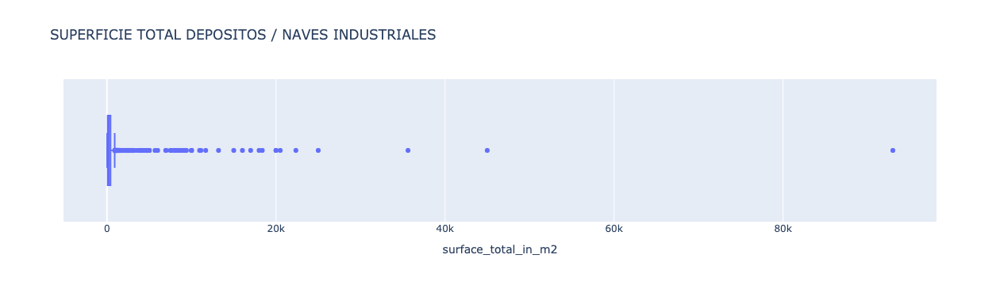

In [101]:
patron_deposito = re.compile(r'deposito|galpon|nave|industrial|hangar')

encuentra_deposito = df.description.apply(lambda x: re.search(patron_deposito, str(x)))


encuentra_deposito_mask = encuentra_deposito.notnull()

px.box(df[encuentra_deposito_mask], x='surface_total_in_m2', title= 'SUPERFICIE TOTAL DEPOSITOS / NAVES INDUSTRIALES')

In [102]:
df[encuentra_deposito_mask].shape[0]

3800

In [103]:
df['TIPO DE PROPIEDAD']=df.property_type

df.loc[encuentra_deposito_mask,'TIPO DE PROPIEDAD']='deposito'

## Duplex / Triplex

Creamos una nueva categoria de propiedades, los duplex.

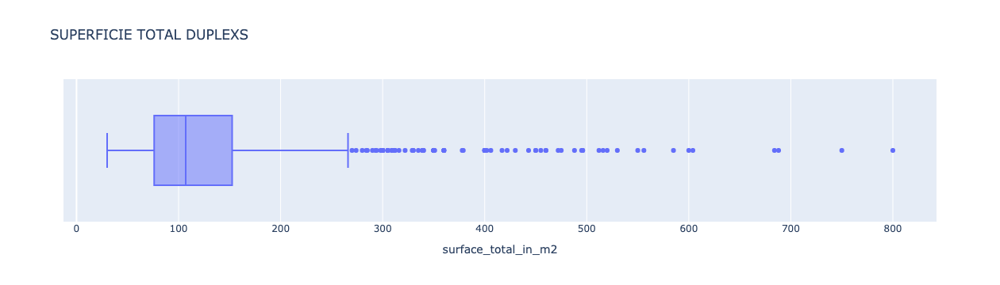

In [104]:
patron_duplex = re.compile(r'duplex|triplex')

encuentra_duplex = df.title.apply(lambda x: re.search(patron_duplex, str(x)))


encuentra_duplex_mask = encuentra_duplex.notnull()

px.box(df[encuentra_duplex_mask], x='surface_total_in_m2', title= 'SUPERFICIE TOTAL DUPLEXS')

In [105]:
df[encuentra_duplex_mask].shape

(2092, 33)

In [106]:

df.loc[encuentra_duplex_mask,'TIPO DE PROPIEDAD']='duplex/triplex'

### Piso / Penthouses

In [107]:
df_apartamento=df[df.property_type=='apartment']

patron_piso = re.compile(r'piso|semipiso')

depto_sup_mayor_200m2 = df[np.logical_and(np.logical_or(df.surface_total_in_m2>200, df.surface_covered_in_m2>200), df.property_type=='apartment')]

encuentra_piso = depto_sup_mayor_200m2.title.apply(lambda x: re.search(patron_piso, str(x)))


encuentra_piso_mask = encuentra_piso.notnull()

piso=encuentra_piso[encuentra_piso_mask].apply(lambda x: x.group())

patron_penthouse = re.compile(r'penthouse')

encuentra_pent = df[df.property_type=='apartment'].description.apply(lambda x: re.search(patron_penthouse, str(x)))

encuentra_pent_mask = encuentra_pent.notnull()

pent_index = df_apartamento.loc[encuentra_pent_mask].index
piso_index = piso.index

df.loc[pent_index,'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[piso_index,'TIPO DE PROPIEDAD']='piso/penthouse'


In [108]:
df_apartamento=df[df.property_type=='apartment']

patron_piso = re.compile(r'piso|semipiso')

depto_sup_mayor_200m2 = df[np.logical_and(np.logical_or(df.surface_total_in_m2>200, df.surface_covered_in_m2>200), df.property_type=='apartment')]

encuentra_piso = depto_sup_mayor_200m2.description.apply(lambda x: re.search(patron_piso, str(x)))


encuentra_piso_mask = encuentra_piso.notnull()

piso=encuentra_piso[encuentra_piso_mask].apply(lambda x: x.group())

patron_penthouse = re.compile(r'penthouse')

encuentra_pent = df[df.property_type=='apartment'].title.apply(lambda x: re.search(patron_penthouse, str(x)))

encuentra_pent_mask = encuentra_pent.notnull()

pent_index = df_apartamento.loc[encuentra_pent_mask].index
piso_index = piso.index

df.loc[pent_index,'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[piso_index,'TIPO DE PROPIEDAD']='piso/penthouse'

### 7) Analisis EDA

#### Outliers

Vamos a graficar algunas variables numericas a ver como esta distribuida nuestra data

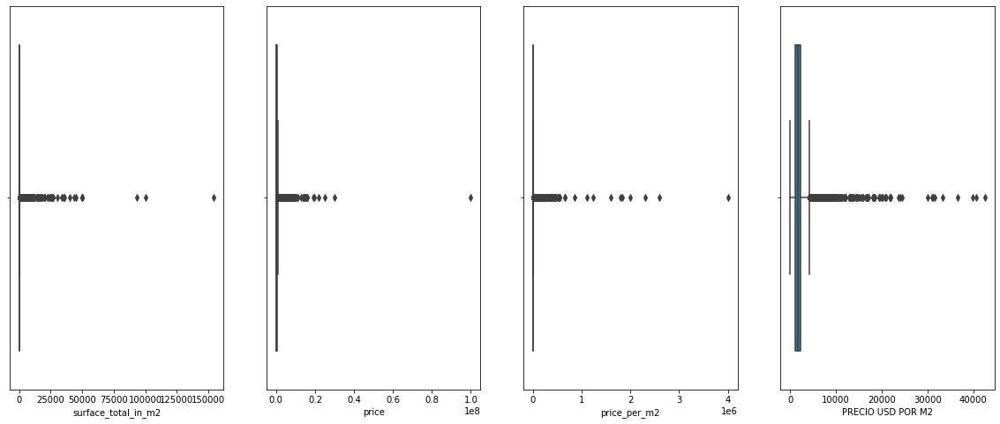

In [109]:
fig,ax = plt.subplots(ncols=4, figsize=(20,8))

sns.boxplot(data=df, x='surface_total_in_m2', ax=ax[0]) 
sns.boxplot(data=df, x='price', ax=ax[1]) 
sns.boxplot(data=df, x='price_per_m2', ax=ax[2]) 
sns.boxplot(data=df, x='PRECIO USD POR M2', ax=ax[3])

plt.show()

Dado que los ultimos 2 graficos son consecuencia de los primeros dos, vamos a trabajar con ellos.

## surface_total_in_m2

## Apartment

Vamos a buscar outliers a partir de place_name en departamentos de capital federal

In [110]:
pd.set_option('display.max_colwidth', None)

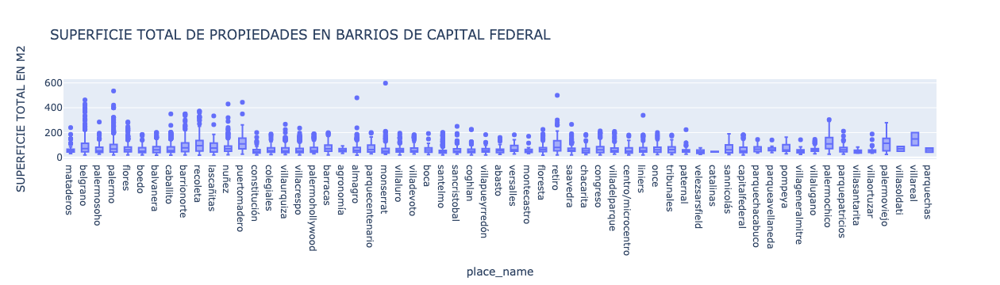

In [111]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='apartment')],\
             y = "SUPERFICIE TOTAL EN M2", x='place_name', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL')
fig.show()


### mataderos - Apartment

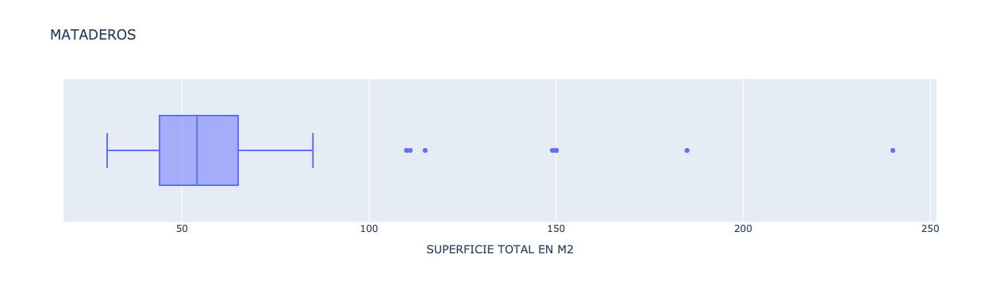

In [112]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='mataderos',df['TIPO DE PROPIEDAD']=='apartment')],\
             x = "SUPERFICIE TOTAL EN M2", title='MATADEROS')
fig.show()

In [113]:
df_apartamentos = df[df['TIPO DE PROPIEDAD']=='apartment']


mataderos_index=df_apartamentos[df_apartamentos['PLACE NAME']=='mataderos'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:7].index
df_apartamentos[df_apartamentos['PLACE NAME']=='mataderos'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:7]


,SUPERFICIE TOTAL EN M2,title,description
19270,240.000,avevapern5800,publicadoporcirculoinmobiliariasuratravesinmomap
57144,185.000,departamentotipoph,"departamentotipoph,estáenlaplantaalta1erpiso,estádesocupadoyenbuenestadosinexpensas,muycómodo,conbalcóncorridoentodoeldepartamentolivingcomedoralfrentecongranventanabalcón,1dormalfrenteyotroalcontrafrente,conbañolacocinacomedortienesalidaabalcónterrazaconlavaderoel2dopisoseconformaconundormitorioconbaño,unamplioplayroomconplacard,quepuedetransformarceenotrodormitorioparrillainternaconbarraysalidaabalcónamplioconhornodebarrobuenmantenimientogeneralcercanoaplaza,barriotranquilodecasas,próximoaavescalada"
43714,150.000,"3ambconterraza,parrillaysotano(estado100impecable)","codigo:114-577ubicadoen:araujo-publicadopor:ingeavillamilpropiedadeselprecioesdeusd180000nullunmerecido3ambtipocasaconterraza,parrillaysotanoelinmueblecuentaconlasiguientedistribucionenplantabaja:livingcomedorcocinaamplio,cocinacomedorseparadaconartefactodecocinaconhorno,alacenaybajomesada,toilleteysotanoenpriimerpisopiso2dormitorios(unode4x4maproxyotrode5x4maproxambosconplacardconinterior),bañocompleto,terrazaconlavaderoyparrillalasfotoslodicentodo,pocaantiguedad,bienmantenido,buenpreciovengayvealopublicadoatravésdemapaprop"
39700,150.000,casa4ambientes-mataderos,"excelentechalet,compuestodepatioyporchedeingreso,alfrenteconentradaindependientehaciaelpatiotrasero,living,dosdormitoriosamplios,bañocompleto,cocina,comedordiario,patio,lavaderograndeyterrazatodomuyluminosoinmuebleubicadoenelbarrionaon,adoscuadrasdelaavenidaemiliocastroydosdeavjuanbalberdidosplazasaunacalleydoscallerespectivamentesupermercadoscercanoscarrefouraunacalleycotoa4calles,comerciosvariosrubros,restaurantes,macdonals,estacionesdeservicio,etc"
74517,150.000,departamento-mataderos,"exclusivospisos4ambientesdecategoría!!dos(2)cocherasfijasycubiertastres(3)baños(1ensuite+1toiletederecepción)calefacciónporcalderapeisa(osimilar)conradiadoresentodoslosambientesparrillaindividualagasnaturalbalcóny/opatiode11x4,50y/oterrazade50m2totalesexcelenteubicación,próximoavemiliocastroyavjuanbalberdi-"
60066,149.000,"departamento4ambientescondep2balcones,todoalexterior-mataderos",departamentode4ambientesalfrente2balconesdobleingresohalllivingycomedordormitorioensuite2dormitoriosconplacardcocinaindependienteconcomedordiario2bañocompletotoilettedependenciadeserviciolavaderocubierto+bauleratodoalexterior!muyluminoso!muybuenaubicaciónsobreavjuanbautistaalberdizonacomercialycentrosdeestudiosinnumerablesmediosdetransporteenzonaparavisitarloorecibirmayorinformacióncomunícateconnosotrosal:o15-(whatsapp)aot4970ap394366
73455,115.000,departamento-mataderos,"ventadedepartamentoph3ambientescongarageenmataderosseingresaaunlivingcomedorde3,50x5,30mconmesada,mueblesdebajomesadayalacena,termotanqueypuertadeaccesoaunpatiode3,20x3mconpiletaparalavarporunhalldedistribuciónseaccedeaunescritoriode3,50x2mconplacardyparquetbañocompletoconbañeraarefaccionar,yaccesoa2dormitoriosde3,30x3,40conpisodeparquetyplacardyde4,20x3,40mconpisosdecerámicayentradaprincipal,puedeserunlivingyventanaltambiénalbalcóncorridoalfrenteterrazadeusocomúnenúltimopisode8,60x8,60conlavaderoencomúnde5x2,50menplantabajaseencuentraelgarageolocalde8,30x4,11avisolegal:importante:lasmedidas,imágenes,videos,superficies,preciosydemáscaracterísticasexpuestosenéstesitiosonaproximados,decarácterilustrativoypuedenmodificarsesinprevioavisopartedelasinmobiliarias"


In [114]:
df.loc[mataderos_index[3],'TIPO DE PROPIEDAD']='house'

In [115]:
df.loc[mataderos_index[1],'TIPO DE PROPIEDAD']='ph'

In [116]:
df.loc[mataderos_index[6],'TIPO DE PROPIEDAD']='ph'

### belgrano - Apartment

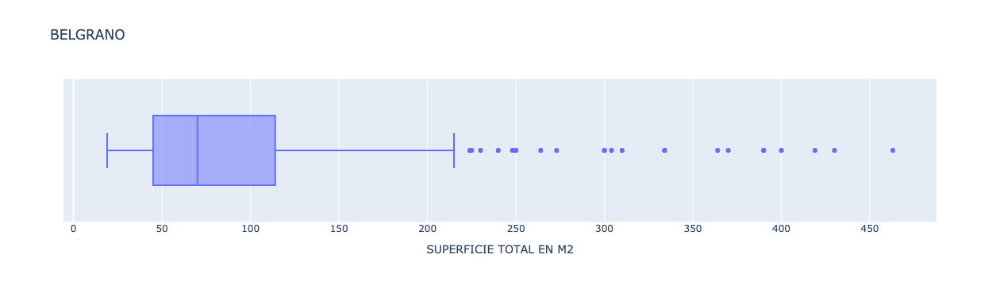

In [117]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='belgrano',df['TIPO DE PROPIEDAD']=='apartment')], x = "SUPERFICIE TOTAL EN M2", title='BELGRANO')
fig.show()

In [118]:
belgrano_index = df_apartamentos[df_apartamentos['PLACE NAME']=='belgrano']\
.sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title']][:18].index

df_apartamentos[df_apartamentos['PLACE NAME']=='belgrano'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:18]


,SUPERFICIE TOTAL EN M2,title,description
615,463.000,departamentoenventa,"ventadedepartamento4dormitoriosenbelgrano,capitalfederaltríplexaltísimoconexcelentevistalivingycomedor4dormitorios,todosensuite4bañoscompletostoilettelavaderoydependenciaterrazapropiade119m2totalmenterecicladoanuevo2cocherasfijasvigilancia24hsteslerpropiedadestel:(54-11)4781---teslerpropiedades"
41645,430.000,departamentoenventa,"excelentedepartamentoenventa/forumalcorta,catañedayjuramento/belgrano4dormitoriosensuitec/vestidor+dependenciadeservicio,toilettedormppalensuitec/vestidor,2dodormensuiteampliolivingcomedor,cómodofamilyroomy2balconesaterrazadossuperficiecubierta:330m2+balconaterrazado100m2superficietotal430m2incluye2cocherasy1baulera/lozaradianteycalefaccióncentralamenities:piletacubierta,piletadescubiertac/zonasdeniños,canchadeteniscubiertaycanchadetenisdescubierta,sum,sectordeparrillas,áreadejuegosinfantiles,fitnesscenterc/vestuariosysaunas,laundry,bauleras,grupoelectrógenosectorizado,internetinalambricoenáreascomunes,bicicleteros,vigilancia24hs--conectarpropiedades"
36023,419.000,belgrano/laimprenta7ambaptoprofdepcochera,"corredorresponsable:arielchampanier-cucicba4330contacto:alejandroguelman-mlsid#181273-547ambientesenbelgranoaptoprofesional,congranpatio,depósitoycocheradepartamentoubicadoenelcorazóndelaimprentabelgrano,capitalfederalsobreteodorogarcíaal1700,a2cuadrasdeavluismaríacampos,2deavdellibertadory1deavfedericolacrozeedificioconseguridadlas24horasaptooficinacomercialoconsultoriomédicolecorrespondeunespacioguardacocheenelsubsuelolaunidadseencuentraenlaplantabajacontrafrentedeledificioyposee419m2totalespropios,deloscuales200m2locomponen2patios(elmásamplioorientadoalpulmóndemanzanayelotro,máspequeño,interno)elinmueblecuentaconlivingcomedorycocina,queocupan100m2aproxjuntoalliving,unescritorioo5todormitoriode4,70mx3,73mconsupropiobañohacialapartetrasera,4dormitorios,casitodosconplacard,más2bañoscompletosademás,dependenciadeservicioo6todormitorioconsupropiobaño"
24670,400.000,belgranoexcelentedepartamentoenventade8ambientes,"excelentedepartamentoenventaentorredecategoríaconampliojardín,sum,gimnasio,piscinaclimatizada,juegosparaniñosunidadalfrentecon5dormitoriosensuiteyvestidorliving,comedor,escritorio,cocinacompletareciclada,comedordiariomuyamplio,lavaderodoscocherasfijas,vigilancialas24hs"
69783,390.000,4suitesescritorioyplayroombalconterrazaypiletapropia,"espectaculardepartamentotipocasaconbalcónterrazaypiletapropiagranrecepciondelivingycomedoryescritorioconsalidaabalconterraza4ampliosdormitoriosensuite(principalcongranbañoyvestidor)estarintimoconsalidaaterrazaconpiletapropiacomedordiarioycocinaconislalavadero2dependenciasdeservicioconsubañototalmenterecicladoaireacondicionadocentral3cocherasfijas+baulerasalondefiestasyseguridad24horaslasmedidas,superficiesyexpensasconsignadasenlapresentedescripciónsonaproximadas,asolotítuloorientativoynosonvinculanteslasmedidasysuperficiesrealessurgendeltítulorespectivofedericogalceranpropiedades"
69566,390.000,departamentoenbelgrano,"ventadepartamento6ambientesbelgranotorreaisensonmaximacategoriagranderecepciondeliving(9x5,5)consalidaabalconaterrazado,comedor(5x6)yescritorio(5x4,5)3dormitoriosensuite+estarintimoocuartodormitoriomastersuite(6x5)congranbañoyvestidor3bañoscompletos+toilettederecepcioncocinaycomedordiarioseparadolavadero2dependenciasdeservicioconbañocompleto2cocherasfijascanchadetennis,pileta,gimnasio,lavaderodeautos,seguridad24hrsexcelentevistaentodossusambientestotalmenterecicladolasmedidas,superficiesyexpensasconsignadasenlapresentedescripciónsonaproximadas,asolotítuloorientativoynosonvinculanteslasmedidasysuperficiesrealessurgendeltítulorespectivofedericogalceranpropiedades"
69646,370.000,3defebreroyzabala-torredemaximacategoriaconamenities,"torredemáximacategoríagranlivingconsalidaabalcónaterrazadocomedoryplayroom4dormitorios,principalensuite3bañoscompletos+toilettederecepcióncocinaycomedordiariolavaderodependenciasdeservicio2ascensoresprincipalesdeultimageneración+1deserviciolatorre

In [119]:
df.loc[belgrano_index[0],'TIPO DE PROPIEDAD']='duplex/triplex'

### palermo soho - Apartment

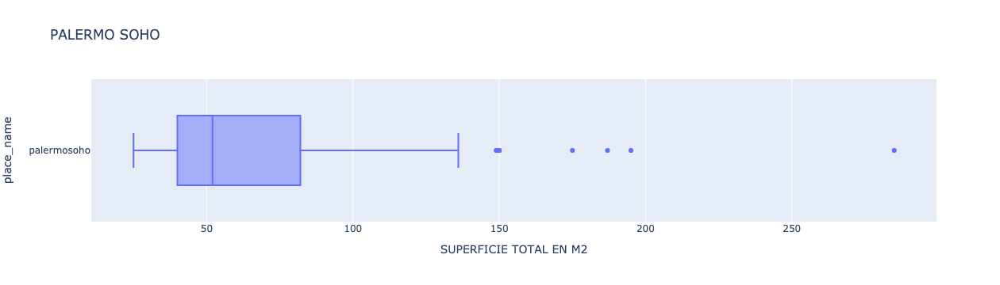

In [120]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='palermosoho',df['TIPO DE PROPIEDAD']=='apartment')],\
             x = "SUPERFICIE TOTAL EN M2", y='place_name', title='PALERMO SOHO')
fig.show()

In [121]:
palermosoho_index = df_apartamentos[df_apartamentos['PLACE NAME']=='palermosoho'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title']][:6].index

df_apartamentos[df_apartamentos['PLACE NAME']=='palermosoho'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:6]


,SUPERFICIE TOTAL EN M2,title,description
77332,285.000,departamentoventa,hermosadptodedosambientesmuyeconómico
76002,195.000,"departamentoenventaenpalermosoho,capitalfederal","codigo:1237-76ubicadoen:paraguay4700-publicadopor:desdemonajudithmorettielprecioesdeusd927000nullexcelente5/c/dependenciaambientesenedificiotorre,superluminoso,excelentesterminacionescategoríapremuinbaulerasoptativascocherasoptativaslasmedidasconsignadasnosonexáctas,tienenunfinmeramenteinformativo,novinculareslasmedidasysuperficiesrealessurgendeltítulodepropiedadelmontorealdeexpensassurgedeldetalledeladministradorlasimágenessonorientativasnosonexactasalapropiedadpublicadoatravésdemapaprop"
7338,187.000,semipisoenjuncalentreugartecheyrepublicaarabesiriaopcioncocheraybaulerau$s30000,"excelentesemipisoalfrenteconluzdemañanaenmuyestadodeconservacion(deepocacocinaybaños)-conseguridadlas24hs3dormitorios+escritorioconbiblioteca(principalensuite,yunbañocompletoparalosotros2dormitorios)-cocinaconcomedordiariolavaderoindependiente,dependenciadeservicio-calefaccionyaguacalientecentral(servicioscentrales)-ablanual$18944-"
40999,175.000,excelentedeptoentorreconterrazasparrillavista360unico!2cocherasybaulera,"excelentepisoentorrefullamenitiesvista360gradosexcelenteestadomastersuiteconvestidorybañopartimentadoducha,hidromasajescuartodebañoybachadobletodalasuitedaaunaterrazade30m2cocinatipoamericana(posibilidaddecerrarla)granlivingycomedortodoaventanalesyabalcóncorridosúperluminosoluzysoldemañanaydetardeterrazaprincipalorientaciónesteconlavaderoconcocinayparrillaprivadatoiletederecepciónespacioparabar,escritorioy/ooffice-cocheradobleentandenbaulerade10m2bajasexpensasa50metrosdeavsantafea100mtsdeavjuanbjusto(subtelinead,colectivos,tren,metrobus,etc-)enelmejorpuntodepalermohollywoodlatorrecuentacon2gym(unohechoanuevo)laudry,piscina,solariumde200metros,sumdescubiertoysumcubiertoseguridadlas24hscocherasdecortesía"
62695,150.000,paraguay4700,"latorresohoiiestáconstruidasobreunaampliafraccióndetierra,con50metrosdefrentesobrelacalleparaguay,yestáubicadaenelcosmopolitabarriodepalermo,quehasidoeláreademayorvalorizacióninmobiliariaenlaúltimadécadalatorreestálocalizadadentrodeestebarrioenunazonadenominadapalermosoho,endondeseconjuganunaricavidaurbanaconlasmásavanzadaspropuestasdediseñoenmodaydecoraciónyexperienciasgourmetsdeprimernivelellugarcuentaconunaexcelenteaccesibilidadyademásdisponedeunmuyvariadoequipamientoeducacional,comercial,recreativo,deportivoysanitarioadistanciapeatonaldelatorreademásdeestefuerteback-upurbano,sohoiitieneunacompletapropuestadeamenitiesdeúltimageneraciónparaquesushabitantespuedandesarrollarsuvidadelaformamásplacenterayconfortableposible"
10225,150.000,departamentoenpalermosohocongranbalcónterraza,codigo:3016-wp0141ubicadoen:malabia12219nopiso-publicadopor:waimanpropiedadeselprecioesdeusd340000nullhermosodepartamentorecicladoanuevocongranbalcónterrazaconparrilladormitorioprincipalensuiteconvestidorpublicadoatravésdemapaprop


In [122]:
df.loc[palermosoho_index[2],'TIPO DE PROPIEDAD']='piso/penthouse'

## Palermo - Apartment

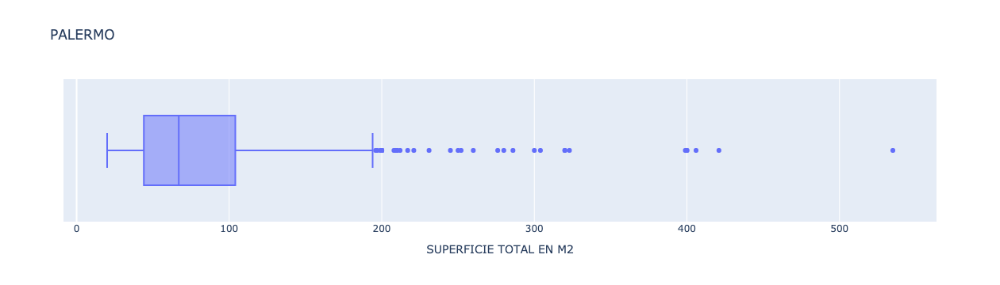

In [123]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='palermo',df['TIPO DE PROPIEDAD']=='apartment')],\
             x = "SUPERFICIE TOTAL EN M2", title='PALERMO')
fig.show()

In [124]:
palermo_index = df_apartamentos[df_apartamentos['PLACE NAME']=='palermo'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:25].index

df_apartamentos[df_apartamentos['PLACE NAME']=='palermo'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:25]


,SUPERFICIE TOTAL EN M2,title,description
54502,535.000,"ventadepartamentode5ambientescondependencias,2cocherasybauleraenpalermo","ventadepartamentode5ambientescondependencias,2cocherasybauleraenpalermoinmejorableubicación,sobregodoycruzentreseguíydellibertador,ametrosdeavdellibertadorylosbosquesdepalermopararefaccionaredificioantiguodecategoríagrandúplexde535m2entradadeserviciosúperluminosoampliarecepcióndelivingde11x6mtsycomedorcuatroampliosdormitoriosplayroomampliacocinacomedordiariolavaderodependenciascuatrobañoscompletosytoilettederecepciónterraza-jardínconquinchoyparrilladoscocherasbauleraimportante:estospreciosestanasujetosaaprobaciondelpropietario"
60306,421.000,latorremaslujosadepalermo!!!,"leparcpalermoexclusivo!excelentedepartamentode4dormitorioscondependenciatressonensuiteyunoconvestidortodosdeexcelentesmedidaslamejorymásprestigiosatorredepalermocuentaconpileta,gym,sauna,canchadetenis,salon,seguridad,amenitiesnuevos!!!solicitarcitaconanticipación!orwel1531211234"
82584,406.000,ventapalermo,"superficie:405,73m2características:excepcionalvistaajardinesyriomuyluminosolivingvistaplazayriocomedorvistaplazayrioescritoriovistaplazayrio4dormitorios(dosensuite)todosconvista3bañostoiletoffice–comedordiariococinalavadero2dependenciasdeserviciopalierprivadobalconbaulera2cocherasfijasseguridad24hsarefaccionar"
69801,400.000,torredecategoria-frentealrosedal-espectacularvista,"torrefrentealrosedalconespectacularvistaverdeyalriopalierprivadocon2ascensoresprincipalesgranrecepcióndelivingycomedoryescritorioconsalidaabalcónaterrazadoconvistaaavlibertadoryrosedal4ampliosdormitorios2ensuitey2ensemisuite(principalconvestidorygranbañococinaycomedordiariolavaderodependenciasdeservicioconsubaño3cocherasybauleraseguridad24horaslasmedidas,superficiesymontosdeexpensasconsignadasenlapresentedescripciónsonaproximadas,asolotítuloorientativoynosonvinculanteslasmedidasysuperficiesrealessurgendeltítulorespectivo,yelmontodeexpensasreal,delreciboemitidoporlaadministraciondelconsorciodecopropietariosquerigeelinmueblefedericogalceránpropiedades"
32996,400.000,ventapalermo,"superficie:369,86m2planta400,22m2propioscaracterísticas:vistaajardinesfrente–contrafrentemuyluminosoliving10x5comedor8x4,30escritorio4,50x6,604dormitorios+playroomo5todormitorio(2ensuite)3bañostoiletoffice–comedordiariococina2dependenciasdeserviciolavaderopalierprivadobalcónbaulera2cocherasfijasseguridad24hsmuybueno"
43029,399.000,dellibertador1700,"magníficapropiedad,degrancategoría,enesquina,conterrazarecicladototalmenteconexcelentesmaterialesymuchogustovistaabiertaaparqueampliopalierprivadoconacceso,atravésdepuertadoble,aunagranrecepciónapaisada,compuestaporliving,comedoryescritorioconsalidaabalcón,alfrentedeledificiotoilettederecepción,tresdormitorios,dosensuite,principalconbañoconjacuzziyduchavestidorysaunafamilydeexcelentesdimensiones,consalidaalbalcónterraza,tambiénmiraaunagradablepatiointernoconplantaselsectordelacocina,esexcelenteymuybienequipado,constadeungrancomedordiario-convistaaotropatio-enestemismoespacioseencuentraunaimportantebodegaademásconstadelavaderoydependenciadeservicioconbañodoscocherasfijasbauleravigilancia24hsljramosbrokersinmobiliarios||gastos-abl:$6431(expensasenero/2016)-expensascomunes:$28000(expensasmesdemayo)||medidas-balcón:3548m2-patio:3018m2-terraza:4958m2-total:48451m2-balcón:170x125m-cocina:50x40m-comedor:54x462m-comedordiario:80x32m-dormitorio3:45x35m-escritorio:54x382m-family:100x45m-living:782x54m-suite1:51x39m-suite2:45x35m"
60167,323.000,departamentoenpalermo,"vendido!leparcalcortacreoqueesodicetodounadelasmejorestorresdebuenosairesamenitiesenserio!pareceunhotel5estrellas!!!ubicaciónsuperprivilegiadayvistasalucinanteselrestohayqueverlo,lacalidad,diseño,amplitud,etcsolicitatuvisitacontiempoorwel15312112341531136668"
54467,320.000,venta5ambientes,"capitalbrokerspropiedades|o15-espectaculartriplexencerviñoysortiz:4dormitorios,unamastersuite,3baños,toilette,livingcomedorenorme,cocinacomedordiario(tipocasa),dependenciagrandeenlatercerplantatieneun

In [125]:
df.loc[palermo_index[7],'TIPO DE PROPIEDAD']='duplex/triplex'

In [126]:
df.loc[palermo_index[-5],'TIPO DE PROPIEDAD']='duplex/triplex'

In [127]:
df.loc[palermo_index[-3],'TIPO DE PROPIEDAD']='duplex/triplex'

In [128]:
df.loc[palermo_index[-2],'TIPO DE PROPIEDAD']='duplex/triplex'

## Barrio Norte - Apartment

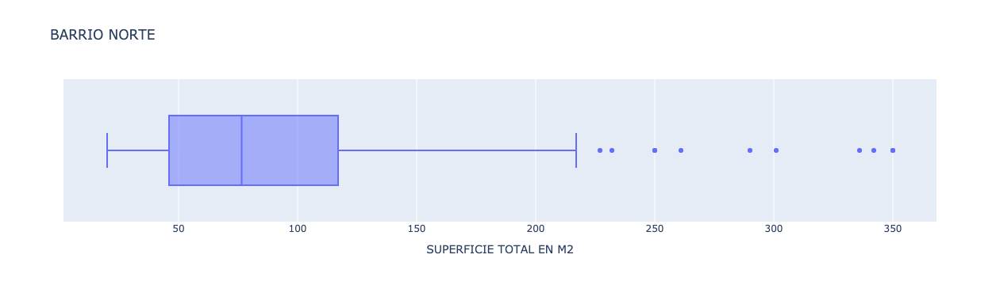

In [129]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='barrionorte',df['TIPO DE PROPIEDAD']=='apartment')],\
             x = "SUPERFICIE TOTAL EN M2", title='BARRIO NORTE')
fig.show()

In [130]:
barrionorte_index=df_apartamentos[df_apartamentos['PLACE NAME']=='barrionorte'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:9].index

df_apartamentos[df_apartamentos['PLACE NAME']=='barrionorte'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:9]


,SUPERFICIE TOTAL EN M2,title,description
12661,350.000,departamentoenventaubicadoenbarrionorte(iur0369_lp118265),"edificioconstruidodegrancategoría,ubicadofrenteaplazalibertadenlamismacuadradelteatrocoliseodepartamentode350mts,conunagranplantafuncionalymuybuenacirculacióningresoporpalierprivadoyaccesodeserviciocuentacon5ampliosdormitoriostodosconampliosplacares,tresdeellosensuiteydoscompartenampliobañohaciaelfrentetenemoselcomedor,living,estaryescritorio,todosellosconlaposibilidaddeintegrarlososepararlosporpuertascorredizasampliacocinaconuncomedordiariointegradodemuybuendiseñoeimpecableestadoeláreadeserviciocuentaconundormitoriocompletoyunlavaderoindependientehoyeneledificioseestánhaciendotareasdereacondicionamientoycambiodecañeríasdegas,eldepartamentofueunodelosmenosafectadosconlasperdidasyalabrevedadestarárestablecidoelserviciodegasnormalmenteexpensas$18000+aysaabl$3380"
18851,350.000,excelentedeptoenrecoleta,"ampliolivingycomedorendesnivelalfrenteconbalcn,saladeestar,toilettederecepcin,mastersuiteconjacuzziyvestidor,otros3dormitoriosensuitey1livingintimo,ampliacocinaconmesadedesayuno,cuartodelavado,lavadero,dependenciasdeservicioconbaocalefaccin,aireacondicionadoseguridad24hsporcircuitodeseguridadbalcon-comedor-baulera-cocina-comedordediario-dependenciadeservicio-dormitorioensuite-escritorio-hall-jardin-lavadero-living-livingcomedor-patio-terraza-toilette-vestidorpublicadopormaxplensoajepintoatravesinmomap"
28333,342.000,torrelibedinsky-barrionorte-grandbourg-5ambc/dependenciasycochera,"excelentedepartamento,ubicadoenlazonamaselegantedelaciudaddebuenosaires,enelemblematicoedificiolibedinskyeldepartamentoconstadeliving-comedorapaisadoconvistaalacopadelosarboles,conbalconaterrazadode180grados,megasuiteconvistaajardines,tresdormitorios(unodeelloshoyconvertidoenvestidor),dosbañosmascompletos,toiletteyplacardderecepcion,cocina,comedordiario,lavadero,dosdependenciasdeservicio(hoy,dependenciaysaladeplanchado)baulera,doscocherasfijascongaragistaexpensas$21000,(incluyeaysa)abl$4800"
44171,336.000,"edificiofariña,3suites2dep,3cocherasfijas","edificiodecategoría-construcciónfariña-excelenteplantaydistribución-livingabalcóncorridoalfrente-comedor-cocina-comedordiario-toilettederecepción-3dormitoriosensuitealíndísimopulmón,principalconvestidorlivingíntimo2dependenciasdeservicios,unadeellasesunposible4ºdormitorio-3cocherasfijas-vigilancia24hs"
9501,301.000,suipachaesquinajuncal,"torreenesquinaconvigilancialas24hspalierprivado,hall(2,30x2,30)living(7,20x6,40)comedor(5x4)escritorioo4todormitorio(3,70,2,20)3dormiotriode(4,20x3,404,5x3,10y4x3,10)2bañoscompletosytoilettederecepcióncocina,comedordiario,lavaderoy2dependenciaspatiode100m2servicioscentrales,calefacciónporlosaradiantecocheracongarajistamartínllauromat5468csi"
65650,290.000,departamento-palermochico,"enexcelentetorreaisenson,granparquearboladoenplantabajaconexcepcionalpiscinaclimatizadalapropiedadtienevistasexcepcionalesarioyciudadhalldeentradarecepciondelivingapaisadoconsalidaabalconaterrazado,comedoryescritoriotoilletetresdormitorios(suiteppalconvestidor)playroom(sepuedeconvertirenuncuartodormitorio)muybuensectordeserviciosde:grancocina,comedordiarioseparado,lavaderoy2habdeservicio3cocherasybaulerabap444388"
30899,261.000,ventabarrionorte,"superficies:260,82,m2propia192,76m2cubierto68,06m2descubiertoscaracteristicas:frenteantigüedad:35añoslivingcomedorescritorio4dormitorios1)suiteajardín2)ajardín3y4)apatio2bañosytoiletteoffice,cocina,lavaderodependenciadeserviciopalliersemiprivadoentradadeserviciobalcónbaulerajardinalfrenteypatiococheraespaciofijaseguridad24hsmuybueno"
53326,250.000,departamentoenventa3dormitoriosconpatio-barrionorte,"impecabledepartamentoenventa,tipocasa,conpatioespañolyjardínalfondosecomponede:living-comedorconsalidaajardín,jardínconparrillaymueblesdejardin,playroomycocinacompleta3dormitorios2bañoscompletosy1toiletteconsúltenos!loesperamos,en!!"
79965,250.000,departamentode4dormitoriosdegrancategoriamuyluminosoenexcelenteestado,barrionortearenales2200entreazcu

In [131]:
df.loc[barrionorte_index[2],'TIPO DE PROPIEDAD']='piso/penthouse'

### Villa Crespo - Apartment

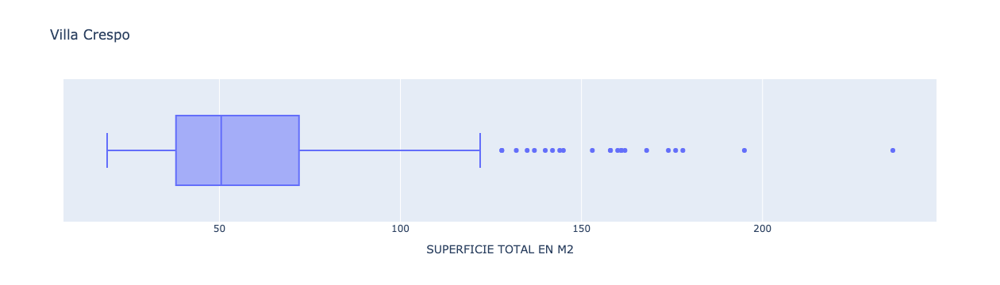

In [132]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='villacrespo',df['TIPO DE PROPIEDAD']=='apartment')],\
                 x = "SUPERFICIE TOTAL EN M2", title='Villa Crespo')
fig.show()

In [133]:
villacrespo_index=df_apartamentos[df_apartamentos['PLACE NAME']=='villacrespo'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:19].index


df_apartamentos[df_apartamentos['PLACE NAME']=='villacrespo'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:19]


,SUPERFICIE TOTAL EN M2,title,description
79388,236.000,"departamentodecategoría,alfrenteconbalcónsinexpensas","características:departamentodecategoría,4dormitorios,granlivingycomedorindependienteescritorio,cocinaconcomedordiariosdependenciadeservicioconbañopatiocubiertoconparrillalavaderobalcóncorridoalfrenteeledificiocuentaconascensorsinexpensasubicación:ubicadoenelbarriodevillacrespo,sobreavjuanbjusto,ametrosdelaestacióndelmetrobus""honoriopueyrredon""próximoa:-avcorrientes-subtelinea""b""-avsanmartinobservaciones:departamentoúnicoenlazonaaptoprofesional"
32961,195.000,departamentode4ambientesenventaenvillacrespo,"excelentesemipisode195mts2totales,muybienconservado,quenosbrinda3dormitoriosdosbañoscompletos,1toilettecocinaseparada,comedordiario,lavaderoindependientebiblioteca,todossusabertuasypiso(parquet)originalesyenperfectoestadoconstruccionsolidayconfiableenel2001serecicloanuevocañeriaseinstalacionelectrica,aligualquelasinstalacionesdecocinaybañosconunagradableestilomodernomuybuenaubicacioncercadecualquiertrasportepubliconotienecochera-bajasexpensas!!video:https://youtube/9y8hunlxpwm"
62536,178.000,departamento-villacrespo,excelentedepartamento4ambientesaestrenarconbalconesalfrentewhatsapp:1127723020
22707,176.000,departamentoenventa,"3ambientesenventaconjardin!!(76m2cubiertos+100m2descubiertos=176m2totales)enexcelenteubicaciona2cuadrasdeavsanmartin,a3cuadrasdeavhonoriopueyrredon,ya2cuadrasdeavjuanbjusto(metrobus)livingcomedorconsalidaagranjardinde100m2,2dormitoriosampliosconpisosdeparquet,cocinaconcomedordiarioylavaderoincorporado,1bañocompletojardinconparrillade10x10bajasexpensas!!!sucursalvillacresposucursalalmagro4862-dejaconstanciaquelosm2indicadossonaproximados,aligualquelasmedidasparcialesdelosambientes,yelvalorconsignadodeexpensasmensualesestásujetoaverificacióny/oajustesfotosdecarácternocontractual""--ebertolotti"
42040,174.000,departamentoenventa,"�excelentepisode4ambientescondependenciadeservicio�2entradas�160m2cubiertosy14m2en2balcones(1alfrenteyotroalcontra-frentecubierto)�granlivingcomedorde7mx4,7m�dormitorioensuiteconbañoc/hidromasaje�otrobañocompleto,toiletteybañodeservicio�ampliacocinacomedor�lavaderoindependiente�calefacciónyaireacondicionadocentral�launidadtiene3cocheras(2fijascubiertasy1descubierta)ycuentaconbaulera�a2cuadrasdeavcorrientesymalabia�centrocomercial�todoslosmediosdetransporteconsúltenosjumoinmobiliariatelf:48642299-48662655---jumoinmobiliaria"
22873,168.000,departamentoenventa,"ventadedepartamento5ambientesenvillacrespo,capitalfederalenmuybuenedificio,hermosodepartamento,conpatioybalcóncorrido,grancocina,comodos4dormitoriostodosconplacards,dependencia,amplioliving,bauleraunicoenzonaexcelenteubicación,aunacuadrasubtebestaciónmalabiasedejaconstanciaquelasmedidas,superficiesym2consignadossonaproximados,sujetosaverificacióny/oajusteelpreciodelinmueblepuedesermodificadosinprevioavisofotosdecarácternocontractualaccesibleadiscapacitadosley5115goldsteinpropiedadessrlavdacorrientes4666buenosaires,argentina--goldsteinpropiedadessrl"
83256,162.000,departamento-villacrespo,"unidadde3dormitoriosubicadaenel2dopisotresdormitorios,principalensuiteconvestidortoiletederecepcionunicolivingcurvovidirado"
20606,161.000,departamentode3ambientesenventaenvillacrespo,"departamentotipocasade3ambientescondependenciaporescaleraunidadconespaciosamplios,mucholugardeguardadoluminooenbuenestadoymuybienubicadobalconsobreortizterrazacercasubteyvariasdelineasdecolectivoporlacorrientes4599srl"
79638,161.000,departamentoenventa,"pisode4ambientescondependenciaycocheras,enventa,envillacrespo!inmejorableubicación,a2cuadrasdeavcorrientes(subteb)ya1cuadradeavscalabriniortiz!exclusivaunidadenquintopiso,constadecomodolivingcomedorenlconsalidaabalcóncorridoalfrente,dormitorioprincipalensuitealfrente,dosdormitoriosconplacardalcontrafrenteysalidaasegundobalcóncorridoconcerramiento,cocinacompletaconampliocomedordiario,toilettederecepción,bañocompletoydependenciadeservicioconbañodeserviciodoscocherasfijasycubiertasenpb+cocherapropiadec

In [134]:
df.loc[villacrespo_index[8],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villacrespo_index[-7],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villacrespo_index[-3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villacrespo_index[-1],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villacrespo_index[-8],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villacrespo_index[-4],'TIPO DE PROPIEDAD']='ph'
df.loc[villacrespo_index[-5],'TIPO DE PROPIEDAD']='duplex/triplex'

### Puerto Madero - Apartment

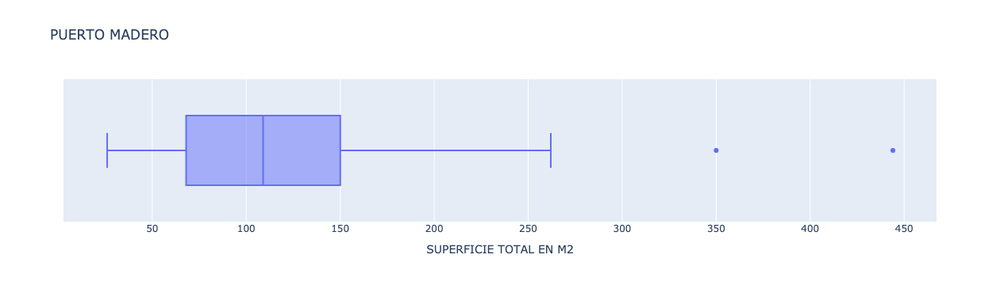

In [135]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='puertomadero'],\
                x = "SUPERFICIE TOTAL EN M2", title='PUERTO MADERO')
fig.show()

In [136]:
index_puertomadero=df_apartamentos[df_apartamentos['PLACE NAME']=='puertomadero'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2].index


df_apartamentos[df_apartamentos['PLACE NAME']=='puertomadero'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2]


,SUPERFICIE TOTAL EN M2,title,description
67515,444.000,puertomadero,"-increíbledepartamentoendúplexen2plantasconterrazapropiayparrillapb:palierprivado,toilette,granlivingcomedorconvistaatodaslasdireccionesybalcóncocinacomedorydependenciadeservicioposibilidaddehabitaciónensuite(4todormitorio)enpa:3habitacionesensuite,principalconbalcón,vistaalríoydoblebañoconhidromasajesimpactanteterrazacondeckbañoyparrilladoblecirculaciónabl13000nota:lainformaciongraficayescritacontenidaenelpresenteavisoesmeramenteatituloestimativoynoformapartedeningúntipodedocumentacióncontractuallasmedidasysuperficiesdefinitivassurgirándeltitulodepropiedaddelinmueblereferidoasimismolosimportesdetasas,serviciosyexpensasindicadosestánsujetosaverificaciónelvalordelinmuebleindicadoenelpresentepuedesermodificadosinprevioaviso"
4172,350.000,"torreelfaro-impresionantevistaalrío,tigreypuerto!!!-","superluminosoysoleado-grancategoría-living/comedor,toilette,balcónincorporadoconcerramiento,3suites,granbalcónenmastersuite,estar,dependencia,4cocherasfijas,seg24hs,amenitiesalarmadelaplantacerramientosdevidriosdobles"


In [137]:
df.loc[index_puertomadero[0],'TIPO DE PROPIEDAD']='duplex/triplex'

In [138]:
df.loc[index_puertomadero[1],'TIPO DE PROPIEDAD']='piso/penthouse'

### Nuñez - Apartment

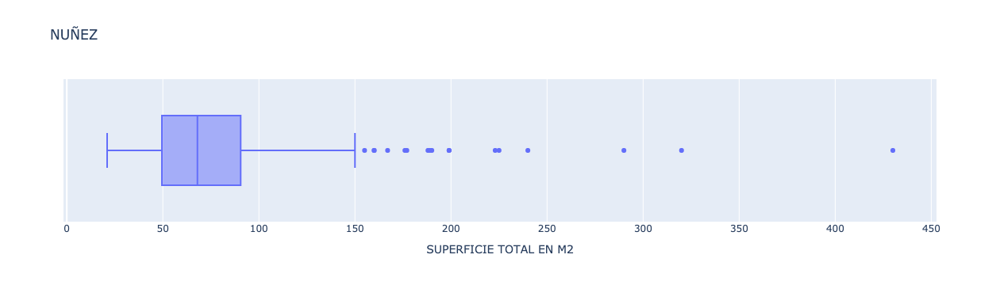

In [139]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='nuñez'],\
             x = "SUPERFICIE TOTAL EN M2", title='NUÑEZ')
fig.show()

In [140]:
nunez_index=df_apartamentos[df_apartamentos['PLACE NAME']=='nuñez'].\
                    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:14].index

df_apartamentos[df_apartamentos['PLACE NAME']=='nuñez'].\
                    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description','PRECIO USD']][:14]


,SUPERFICIE TOTAL EN M2,title,description,PRECIO USD
41644,430.000,departamentoenventa,"excelentedepartamentoenventa/forumalcorta,catañedayjuramento/belgranocuentacon4dormitoriosensuitec/vestidor+dependenciadeservicio,toiletteampliolivingcomedor,cómodofamilyroomy2balconesaterrazadossuperficiecubierta:330m2+balconaterrazado100m2superficietotal430m2incluye2cocherasy1baulera/lozaradianteycalefaccióncentralamenities:piletacubierta,piletadescubiertac/zonasdeniños,canchadeteniscubiertaycanchadetenisdescubierta,sum,sectordeparrillas,áreadejuegosinfantiles,fitnesscenterc/vestuariosysaunas,laundry,bauleras,grupoelectrógenosectorizado,internetinalambricoenáreascomunes,bicicleteros,vigilancia24hs--conectarpropiedades",2490000.000
44509,320.000,forumalcorta,"en320mts4dormitorios1ensuitedependenciadeserviciotoiletteampliobalconterrazade100mtstodoslosamenitiesúnicosqueofreceforumalcortaenunamanzanade13,000mts",2550000.000
51918,290.000,ventatorrechateauexcelenteesquineroconlamejorvistadelatorre,"esquineroaltoconlamejorvistadelatorretorrechateaulibertador,4dormitoriosensuite,lasuiteprincipalcongranvestidor,hidromasajeeldepartamentotienedependenciadeservicioconlavaderotiene2cocherasexcelentesamenitiescomoenunhotel5estrellasgym,peluquería,salóndefiestas,sum,saladejuegos,jauladegolf,spa,piletacubiertaydescubiertaparaelquequierevivirbienyconlacomodidadquechateaubrinda(*)paramasinformación:155095682086medidas,superficiesyexpensasconsignadasenlapresentesonaproximadas;yalsoloefectoorientativolosdatosdefinitivossonlosquesurgirándeltitulodelapropiedadydeloscomprobantesrespaldatorios",2500000.000
34337,240.000,casaenventa-caseros,"codigo:3746-c20ubicadoen:jjdeurquiza3968-publicadopor:mazorrapropiedadeselprecioesdeusd100000nullcasaenventatipophalfondoaptocréditosobreavenidajjdeurquiza,240m²totalesseencuentraa5'delageneralpaz,a500mtsdelsupermercadowalmart,900mtsdelcentrocomercialyvariaslíneasdecolectivocercanasentradaporpasilloindividual,cuentaconunpatioprincipalquedaingresoalapropiedadasuvezcuentaconlivingamplio,bañocompleto,trescómodashabitacionesycocinacomedortambiénposeeunsegundopatioenelfondoconaccesoalaterrazaenelmismo,seencuentraellavaderotechadoyotrahabitaciónquepuedeserutilizadacomodepósitopublicadoatravésdemapaprop",100000.000
41022,225.000,quantumbelliniesquinero3dormcondep,torredemaximacategoriaenobralasmedidassonaproximadasyalsoloefectoorientativolasmedidasrealessurgirándeltitulodepropiedadrespectivomatriculada:yaninajacobicpi6764continúesubúsquedaen,1250000.000
31266,223.000,avdellibertador7000-nuñez-capitalfederal,"excelentedepartamentoenunadelastorresmasexclusivasdelacapitalfederalelmismocuentaconunampliolivingcomedorconsalidaalbalcon,cocinacompletaconcomedordiario,dependenciadeservicio,lavadero,escritorioytresampliosdormitoriosdeloscualestodossonensuiteyelprincipaldegrandesdimensionesconampliovestidoreledificioposeeseguridad24hs,pileta,saladejuegos,gym,sauna,sum,2cocherasfijascubiertasyunabauleradignodever!!!fgkpropiedades",1650000.000
5782,199.000,"avdellibertador7000,departamentoenventa,4dormitorios,caba","ubicacion:eledificioseencuentrasobreavdellibertador,unadelasprincipalesvíasqueconectalaciudaddebuenosairesconzonanorteycaba,pordondepasannumerosaslineasdecolectivo/",625000.000
3858,199.000,"avdellibertador7000,departamentoenventa,5ambientes,caba","ubicacion:eledificioseencuentrasobreavdellibertador,unadelasprincipalesvíasqueconectalaciudaddebuenosairesconzonanorteycaba,pordondepasannumerosaslineasdecolectivo/",625000.000
83021,190.000,departamento-nuñez,"casatotalmenterecicladaa2cdrasdecabildo!!lotepropiode6x13(entrevtadeobligadoycuba)ptabaja:livcdorconpisosdeporcelanato,ampliacocinaycdordiario,officeodepservicio,toiletteygranpatiode22m2enptabajapalta;3d(ppalsuiteconvestidor),2dobñocpto,terraza:lavaderoygranterrazade50mconparrillaserviciosindividualestermotanqueypicosdegas:",360000.000
82483,189.000,magnificodepartamentode4ambenavlibertador!!!,"sobreavlibertador,magnificoentorno,vistamuyverdeymuyabiertapuraluzpisode4ambientes,3dorm

In [141]:
df.loc[nunez_index[3],'TIPO DE PROPIEDAD']='house'
df=df.drop(nunez_index[6])
df.loc[nunez_index[8],'TIPO DE PROPIEDAD']='house'
df.loc[nunez_index[-5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[nunez_index[-4],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[nunez_index[-3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[nunez_index[-2],'TIPO DE PROPIEDAD']='duplex/triplex'
df.loc[nunez_index[-1],'TIPO DE PROPIEDAD']='duplex/triplex'

### Constitucion - Apartment

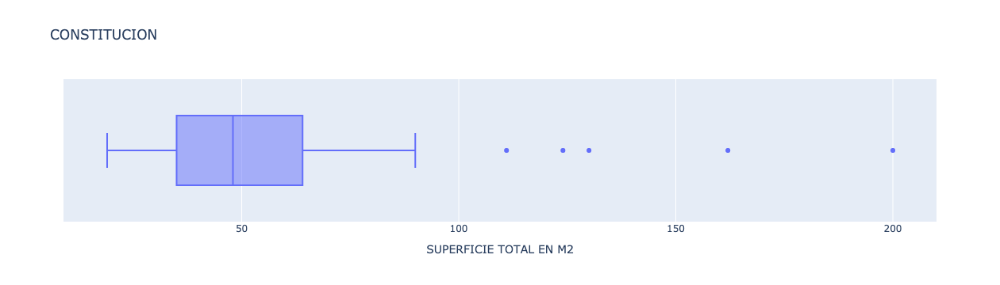

In [142]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='constitución'], x = "SUPERFICIE TOTAL EN M2", title='CONSTITUCION')
fig.show()

In [143]:
constitucion_index = df_apartamentos[df_apartamentos['PLACE NAME']=='constitución'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:5].index
df_apartamentos[df_apartamentos['PLACE NAME']=='constitución'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:5]


,SUPERFICIE TOTAL EN M2,title,description
8691,200.000,ventapisotipoph-de200m2-balcónalfrte-,"ventadepisotipoph(1ºpiso)u$s249000“conexcelenterenta”opcióndeventadel2ºy3ºpisototalmenterecicladospisosenphde200m2aprox2hallsderecepción10habitaciones-3bañoscompletos-1cocina-techosdedoblealturaconentrepisosyventilacionindependientepatio-balcóncorridoalacallesuperluminososestadodeledificio:muybuenoedificiode3pisosconentradaindependienteexcelentezonaturísticaydecrecimientoa1cuadraymediadeav9dejulio,cercaniauniversidad,4cuadrasdeplazasantelmo-8cuadrasdepuertomadero-porestayotraspropiedades:tambiéndeotrasexcelentespropiedadesconosinrentaenlasmejoreszonasdebsasllamardedomingoaviernesde10a21hs-srsaúl-tel11ycel/wsp1115mail:(ventacondicionadaalasolicituddelcotiacargodelpropietario)resgral2371-afipteléfonodelinea"
65007,162.000,departamento/ph-4ambientes-constitución,"ubicadosobrelacallecochabamba:entrelasdesaenzpeñayvirreycevallosapasosdelaavenidasanjuan,dondeseubicalalinea""e""desubtea200metrosdelaavenidaentrerios,dondeseencuentrannumerosaslineasdecolectivos,ycercanoalaterminaldelferrocarrilgeneralrocaantiguapropiedaddesarrolladaendosplantasy4unidadesunidadde4ambientesconentradaindependiente:accesoporescaleradepartamento/phde4ambientesdispuestaalfrentecuentaconlivingcomedoralfrente,cocina,bañocompleto,lavadero,tresdormitorios,habitacionenaltos,galeria,hallrecibidor,balconalfrenteyterrazapropiapisosdepinoteayaberturasoriginalessinexpensasmensuales!dimitrioinmobiliariaavmartingarcia560-carloscalvo691-20deseptiembre314-"
77920,130.000,"departamento130m²5ambientesconwashing-room,capitalfederal,constitución,poru$s269000","departamento5ambientes,muyluminosolivingcomedorcocinaseparada3dormitorioslavaderoindependientedependenciadeserviciohalldeentradadoblecirculaciónserviciosindividualescalefacciónporestufatirobalanceadopuertablindadapisosdepinoteabajasexpensasentradadeservicio-teléfono:--"
8711,124.000,piso4ambientesenventasantiagodelestero1300escomovivirenunacasaenaltura!!!,"amplioycómododepartamentode4ambientesensólidoedificiodenobleconstrucción,muybienconservadoyapasitosdelaavsanjuanidealparaquienesbuscanespacioycomodidadmuycercadetodoexcelenteubicaciónyconectividadconelrestodelaciudaddadalaproximidaddeavenidasconmuchosmediosdetransporte(subtelíneascye,estacióndetrenesconstituciónyvariaslíneasdecolectivos)son4ambientesdegenerosasdimensionesubicadoenun2°piso,enmuybuenestadocondetallesdebuengustoysofisticación(pintadohaceunaño)laplantaseencuentradesarrolladaen124m2(112m2cubiertos+12m2descubiertos)conpalierprivadoliving-comedor,alfrenteyconsalidaalbalcónconaireacondicionadoyunhogaragashermosohalldedistribuciónelcualpuedeserutilizadocomoescritorio,conotrohogardeidénticascaracterísticaseldepartamentocuentacontresdormitoriosdeampliasygenerosasdimensionesdosdormitoriosde4x3conplacardincorporado,unodeloscualestieneunbalcónaterrazadoenlaactualidadeltercerdormitorioesutilizadocomovestidorcocinaindependienteconlavaderoseparadoenimpecableestadobañoprincipaldegenerosasdimensionesytoiletteenelcuartopisohayunahabitacióndeservicioqueesutilizadacomobauleraeledificiocuentaconparrillaubicadaenlaterrazacomúnidealparaquienbuscaespacioaescasospasosdelcentrodelaciudadexcelenterelaciónprecio/calidadmuybuenaoportunidad!!aptocreditou$s145000gabrieltorrescorredorinmobiliariomatriculacucicba6581/1521574055"
13072,111.000,departamentoliving/comedor3dormitorio(s)1toilette(s)habitacióndeservicioalfrenteenesquinaantiguoluminosoenmuybuenestadoorientaciónnoroesteantigüedad56años,"deepocaenmuybuenestadoexcelentevista,muchaluz departamentoliving/comedor3dormitorio(s)1toilette(s)habitacióndeservicioalfrenteenesquinaantiguoluminosoenmuybuenestadoorientaciónnoroesteantigüedad56años"


In [144]:
df.loc[constitucion_index[0],'TIPO DE PROPIEDAD']='ph'
df.loc[constitucion_index[1],'TIPO DE PROPIEDAD']='ph'
df.loc[constitucion_index[3],'TIPO DE PROPIEDAD']='piso/penthouse'


### Colegiales - Apartment

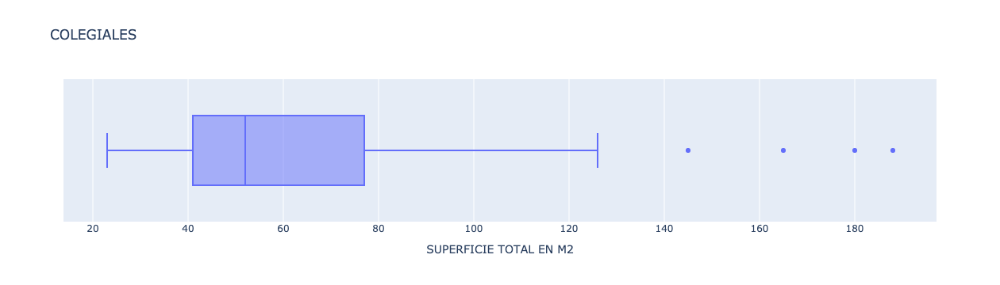

In [145]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='colegiales'],\
             x = "SUPERFICIE TOTAL EN M2", title='COLEGIALES')
fig.show()

In [146]:
colegiales_index =df_apartamentos[df_apartamentos['PLACE NAME']=='colegiales'].\
    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:4].index
df_apartamentos[df_apartamentos['PLACE NAME']=='colegiales'].\
    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:4]


,SUPERFICIE TOTAL EN M2,title,description
3373,188.000,departamentoenventa,"excelenteoportunidaddecompradedepartamentotriplexenplenocorazóndecolegialesventadetriplexenpalermo,-lostrespisosconstituyenunsólodepartamento�a"",tienelosaradianteenlostrespisos,calderaindependientededoblecircuitoparalosaradianteyserviciosanitariotienebauleraindividual,enel6topiso-dedicadaaldepartamento,terrazasemicubiertaconparrillaybalcónconparrillatreshabitaciones(habitaciónsuiteconbaño)yunadependenciadeserviciodosbañosyuntoiletteelvalordelaexpensasincluye(aprox9,500ars)baulera,cochera,cableeinternetmuyluminosocómodacocinaagasconhornoedificiode9a10añosconseguridaddecircuitocerradoporcámaraconectadaalserviciodecable--nexopropiedades"
47697,180.000,palpa2855-pbopcionalcochera,"porsubuenayestratégicaubicación,palpa2855cuentaconexcelentescondicionesparaconvertirseenunaprivilegiadacomunidadlas10unidadesfueronespecialmentepensadasporlosarquitectosparaalbergarcómodamenteasusresidentesen4niveles,10semipisostipocasaconampliasterrazasconparrillaenpalpa2855lacomodidadeslomásimportante;elcomplejocuentaconcocherasfjasoptativasconportónautomatizadoparaquelospropietariosyresidentestenganlatranquilidaddetenersuvehículoseguronadaenpalpa2855fuelibradoalazartieneundiseñoarquitectónicoconcuidadacalidadenlosdetallesdiseñomodernoydescontracturado,yelesmeroenlaeleccióndelosmaterialesmásnoblesparasuconstruccióndancomoresultadounapropuestaresidencialinmejorableposeeascensorconpuertasautomáticasaccesoalasviviendasporpatioprivadotodaslasunidadessecaracterizanporsusampliosventanales,luminosidadyventilacióncruzadaqueinvitanaunamejorcalidaddevidatotalmenteintegradasaunasuperfcieediliciadehermosaslíneas,todaslasresidenciasfuerondiseñadasparabrindarelmáximoconfort,creandoespaciosqueaprovechanlaluznaturalypermitendisfrutarunestilodevidaqueatesorarássiempre"
79619,165.000,departamentoenventa,"pisotipocasa4ambientesfrenteycontrafrente165m2impecabletodosoldobleentradadoblecirculacionespectacularlivingen""l""bañocompleto+toilettegrancocinacomedor5placardsserviciosindividualesterrazaalfrenteconrejapatiocontoldodealuminiolavaderoindependientepisosdeparquet3unidadesentotal,xescaleraexpensas:$850-entrejorgenewberyymaurecolegialesavisolegal:lasdescripcionesarquitectónicasyfuncionales,valoresdeexpensas,impuestosyservicios,fotosymedidasdeesteinmueblesonaproximadoslosdatosfueronproporcionadosporelpropietarioypuedennoestaractualizadosalahoradelavisualizacióndeesteavisoporlocualpuedenarrojarinexactitudesydiscordanciasconlasquesurgendeloslasfacturas,títulosyplanoslegalesdelinmuebleelinteresadodeberárealizarlasverificacionesrespectivaspreviamentealarealizacióndecualquieroperación,requiriendoporsíosusprofesionaleslascopiasnecesariasdeladocumentaciónquecorresponda*fichabrick=1013978*--brickpropiedades"
45938,145.000,departamentoenventa,"ventadedepartamento4ambientesencolegiales,capitalfederalcercadecentrocomercialdeavelcanozonadebaresrestomarketnumerosaslineasdecolectivoscercadetrenmitreestacioncolegialeszonaresidencialexcelenteunidad3dormitoriosbañocompletoytoilet-cocinaconmueblesdealtoybajamesadadoblecirculaciondentrodeldeptopatiojardinconparrillaexcelentevistadeldeptoajardinimpecableestadolavaderoindependienteplacardsentodoslosambientes--macordpropiedades"


In [147]:
df.loc[colegiales_index[0],'TIPO DE PROPIEDAD']='duplex/triplex'
df.loc[colegiales_index[1],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[colegiales_index[2],'TIPO DE PROPIEDAD']='piso/penthouse'

### Almagro - Apartment

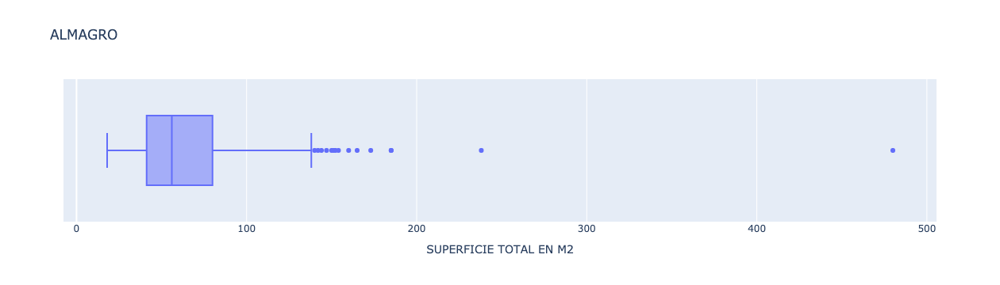

In [148]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='almagro'], x = "SUPERFICIE TOTAL EN M2", title='ALMAGRO')
fig.show()

In [149]:
almagro_index =df_apartamentos[df_apartamentos['PLACE NAME']=='almagro'].\
    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:13].index
df_apartamentos[df_apartamentos['PLACE NAME']=='almagro'].\
    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:13]


,SUPERFICIE TOTAL EN M2,title,description
77970,480.000,aranguren100//muyluminoso,"casa5ambientes,muyluminosapb:livingcomedorcocinaindependienteconcomedordiariodependenciadeserviciosbauleracocherafijaycubiertapatioconparrillatoilettepa:dormitorioprincipalensuite2dormitorioshiperluminososaireacondicionadofrio/calorcalefaccióncentralterrazabañocompletoconbañera-teléfono:--"
27803,238.000,"departamentoliving/comedor3dormitorio(s)1suiteconvest,2ensuite5baño(s)1toilette(s)habitacióndeservicio4cochera(s)alfrenteenesquinaexcelenteterrazaluminosoorientaciónnorteantigüedad6años","imperdibleterrazapropiaconsumyparrilladepartamentoliving/comedor3dormitorio(s)1suiteconvest,2ensuite5baño(s)1toilette(s)habitacióndeservicio4cochera(s)alfrenteenesquinaexcelenteterrazaluminosoorientaciónnorteantigüedad6años"
20310,185.000,ventadepartamento4ambientesalmagro,"unico!impecabledepartamentoconunpatiodecasi80m2pareceunacasayconlaseguridaddeunedificiounoasisenplenacapitaltotalmentesilenciososuperficiecubierta:105m2aproxsuperficiedescubierta:80m2aproxtotal:185m2aproxenormeliving-comedorde8mx3,5maproxdosespaciososdormitoriosde3,5mx3maproxcadauno-conplacardsembutidos-unodeellosconbalcóncubiertococinaanuevocomedordiariodosbañoscompletosanuevopatio-parrilla-sinedificiosallado-purosolampliolavaderoy/odepósitopisosdeparquetplastificadoscalefacciónporradiadoryaguacalientecentralesentradadeserviciofrescoyluminosolaentradadeledificiotienedoblepuerta:principalydeserviciotresascensoresexpensasaccesiblesubicadoenzonaestratégicadealmagrounparaísosobreavrivadavia-contrafrentea50metrosdelsubtetodaslaslíneasdecolectivosactualmenteseestapagandoexpensasextraordinariasyparaobrasymejoras,ypaga$3500(incluyeaguacalienteycalefaccióncentrales)"
18546,185.000,*nuevoprecio*departamentoenventaenalmagro3ambientes2baños105m2+patioc/parrilla80m2–rivadavia3500,"codigo:3410-178ubicadoen:rivadavia3500-publicadopor:vairapropiedadeselprecioesdeusd270000nulldepartamentoenventaenalmagro3ambientes2baños105m2+patioc/parrilla80m2–rivadavia3500unicoimpecabledepartamentode105m2conpatiodecasi80m2unacasaenlaseguridaddeunedificiounoasisenplenacapitaltotalmentesilencioso,suestadoesimpecablesuperficiecubierta:105m2superficiedescubierta:80m2total:185m2aproxenormeliving-comedorde8mx3,5mdosespaciososdormitoriosde3,5mx3maproxcadauno,conplacardsembutidos,unodeellosconbalcóncubiertococinaanuevo,comedordiariodosbañoscompletoshechosanuevopatiodecasi80m2conparrilla,sinedificiosallado,purosolampliolavaderoy/odepósitopisosdeparquetplastificadoscalefacciónporradiadoryaguacalientecentralesentradadeserviciofrescoyluminosolaentradadeledificiotienedoblepuerta:principalydeserviciotresascensoresexpensasaccesiblesubicadoenzonaestratégicadealmagrounparaísosobreavrivadavia,alcontrafrenteenpulmóndemanzanaa50metrosdelsubtetodaslaslíneasdecolectivosaptocréditocaracterísticas:localidad:capitalfederalbarrio:almagroambientes:4dormitorios:2baños:2estado:impecablesuperficiecubierta:105m2superficiedescubierta:80m2superficietotal:185m2ubicación:contrafrentepiso:2pisos:2aptoprofesional:síaptocrédito:sísinexpensasambientes:balcónbañoscocinacomedordiariodormitorioslavaderolivingcomedorpatioconjardínyparrillacomodidadesyamenities:aireacondicionadoascensorescalderatransportescercanos:colectivos:2,5,8,19,26,32,75,86,88,90,103,104,105,115,127,128,132,146,151,160,165,180subtes:castrobarros(líneaa),loria(líneaa)publicadoatravésdemapaprop"
62795,173.000,inmejorabledepto5ambc/depcocheraybaulera,"inmejorabledepartamento5ambientesenduplexc/dependenciacuentacon:pb:cocina-comedor,living-comedor,3habitaciones-2bañosybalcónampliopa:depencia,baulera,lavadero,bañoyhabitaciónosalaoplayroom-vistaincreiblealaciudad-espaciosmuyamplioscongranluminosidad-bajisimasexpensasenrelaciónalasdimensiones-elvalorincluye1cocheraampliaybauleraen1ersubsuelo-eledificiocuentacon4ascensores,1deservicioygrupoelectrógenoqueabastecetodoeledificio-excelenteubicaciónyaccesibilidadamediosdetransporteametrosdeavrivadavia-escriturableaptocrédito"
15596,165.000,departamentoenv

In [150]:
df.loc[almagro_index[0],'TIPO DE PROPIEDAD']='house'
df.loc[almagro_index[4],'TIPO DE PROPIEDAD']='duplex/triplex'
df.loc[almagro_index[5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[almagro_index[-6],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[almagro_index[-5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[almagro_index[-4],'TIPO DE PROPIEDAD']='ph'
df.loc[almagro_index[-2],'TIPO DE PROPIEDAD']='piso/penthouse'

### Monserrat - Apartment

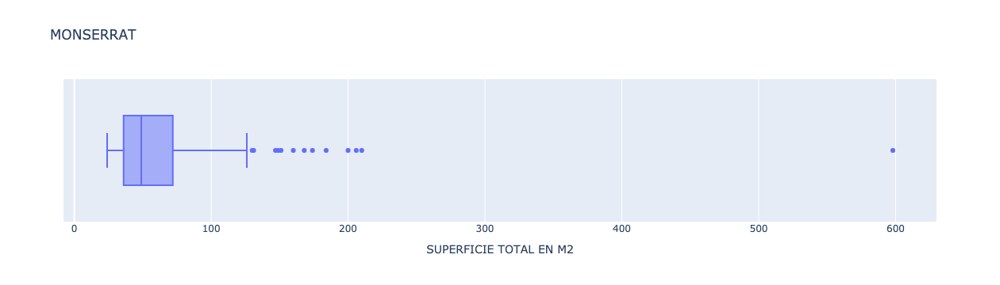

In [151]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='monserrat'], x = "SUPERFICIE TOTAL EN M2", title='MONSERRAT')
fig.show()

In [152]:
monserrat_index=df_apartamentos[df_apartamentos['PLACE NAME']=='monserrat'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:13].index

df_apartamentos[df_apartamentos['PLACE NAME']=='monserrat'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:13]

,SUPERFICIE TOTAL EN M2,title,description
34461,598.000,barrioprivado,"¿querésvivirrodeadodepaz,paisajesnaturalesyelmayorconfot?elprimerbarrioprivadodelaciudaddebalcarce,seencuentraubicadoalpiedelasierralabarrosa,cercanoalautodromojuanmanuelfangio,unodelospuntosmásimpactantesencuantoaloqueofreceelpaisajeserranoypróximoalosdistintoscircuitosdeactividadesculturalesydeportivasdisfrutedetodaslascomodidadesdelclubhouse,conlanaturalezadefondolaseguridadqueofreceunbarrioprivado,yunimportanteentornonatural,hacenquepuedaolvidarsedesuspreocupacionesyrelajarsedeverdadconsulteporlotesdisponibleslotesde598m2a1000m2conlacompradeunlotesebonificalaescriturayademásseobsequiandosbicicletasdemountainbikeconsultas:(04168rocío"
77976,210.000,muyluminoso//sanjose400,"departamento5ambientes,muyluminosolivingcomedorconbalcónfrancésalfrentecocinaindependienteconcomedordiario4dormitoriohiperluminososconampliosplacardscalefacciontirobalanceadohalldeentrada2bañoscompletosconbañeratoiletteaptoprofesional-teléfono:--"
29127,206.000,departamentoenventa,"ventadedepartamento6ambientesenmonserrat,capitalfederalampliodepartamento,adoscuadrasdelcongreso,aptoprofesional--mariaojedayasociados"
33410,200.000,espectacularpisode5ambientesenmonserrat,"sumacategamplioyluminosopisode5ambientesenmontserratpisodeestiloconpalierprivadohallderecepc,livingcomedorde6x4,escritorioytoilette4dormitoriosde4x5,4x4,3x4,4x4respectivamentedosbañoscompletos,cocinaconcomedordiariohabitaciondeservicioconbaño,lavadero,saladeplanchado,balconfrancescocheracubtaopcionala100mtsapocosmtsdeavbelgranoysanjosépróximosasubtesymetrobususd30000-consultasvíawhatsapp15-"
37882,184.000,departamentoantiguoconcochera,"setratadeundepartamentoantiguo,reciclado,deampliosambientespisosdepinotea,aberturasdeestilohalldeentrada,tresdormitoriosalfrente,bañocompleto,toilette,amplioliving,comedordediario,cocina,lavadero,dependenciayampliacocheraparadosautosenedificio153,02m2cubiertos,0,29decimetrosdebalcóny30,31m2cubiertosdeunidadcomplementariacochera"
61040,174.000,departamento-monserrat,"excelentesemipisode5ambientesalfrenteedificioantiguoestilo2patios2balconesmuybuenaubicación2entradasbarrio:monserrat-halldeentrada:300x300pisosenrobleeslavonialivingcomedor:700x450pisosenrobleeslavoniaaccesoa2balcónesalfrentecielorasosconmoldurasperimetralesartesanales2balcónes:de200x100cadauno,conbarandasenhierroforjadoartesanalcocina:equipadaconbajomesadayalacenasde200x300granventanalaterrazacomedordiario:350x400pisoscerámicossalidaapatiolateralpatiooterrazalateral:480x190baño:completoymuyamplio330x280conbañera,tododeestiloyenmármoldeépocahalldedistribución:764x100pisosflotantesdormitorio1:200x240placardyventanalatzalateralpisosenpinoteadormitorio2:400x350pisosenpinoteaplacardventanalalatzalateraldormitorio3:400x350conventanalalpatiodelcfrentepisosenpinoteaescritorio:200x200ventanalalaireluzhalldeaccesoapatio:350x130patio:alcontrafrente750x380conlavaderocubiertosuperficie:175m2totalesantigüedad:85añosservicios:individualesestado:muybuenoorientación:norte-observaciones:edificioantiguoestiloenbuenestadodeconservaciónsonpby6pisos,2deptosporpiso2entradas,2ascensoresexcelenteubicación:cercanoamtsde9dejulio,belgrano,independencia,entrerios,metrobus,subteseinnumerablesmediosdetransporte"
24424,168.000,hermosodepartamentoestiloracionalistaservicioscentrales,"setratadeunapropiedaddeampliosambientes,conexcelentedistribución,luminosoamplioliving,comedor,5dormitorios,tresbaños,cocinaconcomedordiario,lavadero"
32634,160.000,excelente5ambenedificioemblemático,"avdemayo1400enelemblemáticoedificioconocidocomo""lainmobiliaria"",construidoen1910porelarquitectoluigibroggi,seencuentraestehermosodepartamentoantiguo,recicladoconestiloybuengusto,porlosactualespropietariosenlaplantabajaposeeunpalierdedistribución,granlivingdeampliasdimensiones,comedorprincipal,escritorioosaladetv(antiguamentedormitorio),dormitorioprincipalycuartodevestir(antiguamentedormitorio)enelprimerpisoseencuentralacocinatotalmentehechaanuevo,conmesadadesilestoneyartefactosdepr

In [153]:
df.loc[monserrat_index[0]].description

'¿querésvivirrodeadodepaz,paisajesnaturalesyelmayorconfot?elprimerbarrioprivadodelaciudaddebalcarce,seencuentraubicadoalpiedelasierralabarrosa,cercanoalautodromojuanmanuelfangio,unodelospuntosmásimpactantesencuantoaloqueofreceelpaisajeserranoypróximoalosdistintoscircuitosdeactividadesculturalesydeportivasdisfrutedetodaslascomodidadesdelclubhouse,conlanaturalezadefondolaseguridadqueofreceunbarrioprivado,yunimportanteentornonatural,hacenquepuedaolvidarsedesuspreocupacionesyrelajarsedeverdadconsulteporlotesdisponibleslotesde598m2a1000m2conlacompradeunlotesebonificalaescriturayademásseobsequiandosbicicletasdemountainbikeconsultas:(04168rocío'

Se trata de un anuncio que incluye el conjunto de 4 unidades dentro de su precio.

In [154]:
df = df.drop(monserrat_index[0])

In [155]:
df.loc[monserrat_index[3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[monserrat_index[5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[monserrat_index[-5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[monserrat_index[-4],'TIPO DE PROPIEDAD']='ph'
df.loc[monserrat_index[-3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[monserrat_index[-2],'TIPO DE PROPIEDAD']='piso/penthouse'

### Villa Luro - Apartment

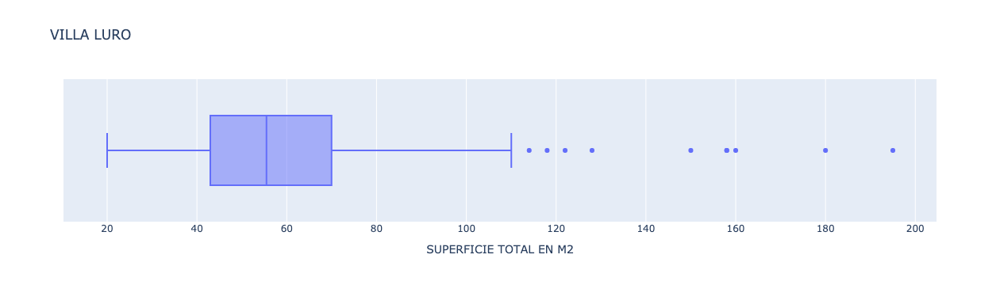

In [156]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='villaluro'], x = "SUPERFICIE TOTAL EN M2", title='VILLA LURO')
fig.show()

In [157]:
villaluro_index = df_apartamentos[df_apartamentos['PLACE NAME']=='villaluro'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:9].index
df_apartamentos[df_apartamentos['PLACE NAME']=='villaluro'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:9]


,SUPERFICIE TOTAL EN M2,title,description
71545,195.000,departamento-villaluro,"ventadedepartamento3ambientesconterrazaubicadoenelbarriodevillaluro,acassuso5570/75,ametrosdelaavrivadaviaydelboulevardramonlfalcon,delaautopista25demayo,delaccesooesteydelaautopistarichiericoncocheraopcionalu$s25000elpisodelhallprincipalserealizaradeporcelanatolosmurosexterioresdeledificioserealizaranenpinturareveardeprimeracalidad,endosotrestonosdiferenciandolasvolumentriasexistenteslostanquesdeaguaseencontraransobrelasalademaquinasyloscisternaenlaplantabajaconestructuradehormigonarmadoymamposteriadeladrillohuecoloscielorrasos,losmurosinterioresdelasmismas,lospalieresyelhalldeentradaserealizarandeyesotradicionalbalconconpasamanosdehierrooacerosegunelcriteriodelaconstructora,dichosbalcontendrapisodeporcelanatococinaconpisodeporcelanato,concocina,mesadasdegranitogrismarauotrasegundecisiondelaempresaconstructora,mueblesdecocinaenmelaminaadesignar,herrajesdeaceroyguardacantosdealuminioelaguacalienteseraprovistaporcalderacentralocalefonesindividualessegunseproyectebanoconpisosceramicosoporcelanatoentonosclarosconbanera,inodoro,bidet,vanitoryygriferiaslasventanasserandealuminiotipomodena2orotonda640,sinpersianaslospisosdelosdepartamentosserandeporcelanatoenelsecordelacocinayelrestodepisoflotantealigualqueeneldormitorioconzocaloscolorblancopintadoslaspuertasdeaccesoprincipalalosdepartamentosseranmazizasreforzada,elmarcoconesmaltesinteticosatinadolaspuertasinterioresdecadaunidadfuncionalseranplacaconmarcodechapacolorblancaslosherrajsserancolorsimilacerohabitacionconplacardconestantes,percherosycajonerasbocasdeiluminacioneneltecho,tomascorriente,tvyelporteroelectrico"
71539,180.000,departamento-villaluro,"ventadedepartamento3ambientesconterrazaubicadoenelbarriodevillaluro,acassuso5570/75,ametrosdelaavrivadaviaydelboulevardramonlfalcon,delaautopista25demayo,delaccesooesteydelaautopistarichiericoncocheraopcionalu$s25000elpisodelhallprincipalserealizaradeporcelanatolosmurosexterioresdeledificioserealizaranenpinturareveardeprimeracalidad,endosotrestonosdiferenciandolasvolumentriasexistenteslostanquesdeaguaseencontraransobrelasalademaquinasyloscisternaenlaplantabajaconestructuradehormigonarmadoymamposteriadeladrillohuecoloscielorrasos,losmurosinterioresdelasmismas,lospalieresyelhalldeentradaserealizarandeyesotradicionalbalconconpasamanosdehierrooacerosegunelcriteriodelaconstructora,dichosbalcontendrapisodeporcelanatococinaconpisodeporcelanato,concocina,mesadasdegranitogrismarauotrasegundecisiondelaempresaconstructora,mueblesdecocinaenmelaminaadesignar,herrajesdeaceroyguardacantosdealuminioelaguacalienteseraprovistaporcalderacentralocalefonesindividualessegunseproyectebanoconpisosceramicosoporcelanatoentonosclarosconbanera,inodoro,bidet,vanitoryygriferiaslasventanasserandealuminiotipomodena2orotonda640,sinpersianaslospisosdelosdepartamentosserandeporcelanatoenelsecordelacocinayelrestodepisoflotantealigualqueeneldormitorioconzocaloscolorblancopintadoslaspuertasdeaccesoprincipalalosdepartamentosseranmazizasreforzada,elmarcoconesmaltesinteticosatinadolaspuertasinterioresdecadaunidadfuncionalseranplacaconmarcodechapacolorblancaslosherrajsserancolorsimilacerohabitacionconplacardconestantes,percherosycajonerasbocasdeiluminacioneneltecho,tomascorriente,tvyelporteroelectrico"
71296,160.000,departamento-villaluro,"ventadedepartamentotresambientesubicadoenlazonadevillaluromuybuenaluminosidadconbalcóndeampliasdimensionesconpisodedeckcocinaamobladaenaltosybajosbuenacapacidaddealmacenamientopisodeporcelanatorusticohabitacionesconplacardembutidoconpisoflotanteambasconventilacionnaturalcomedorconpisosflotantesdeprimeracategoría,buenacapacidaddealmacenamientolivingcomedorconvistaalbalcónpisoflotantesaladejuegosbañocompletocongriferiamonocomandodeprimeracalidad"
55381,158.000,"4ambientes,2baños,cocinaindependiente,balcónaterrazadoyterrazapropia","departamentoenventade4ambientesentercerpisoalfrentevillaluro-capitalfederalaestrenarde20644m2totalesa5cuadrasdeplazalosandesyelboulev

In [158]:
df.loc[villaluro_index[-1],'TIPO DE PROPIEDAD']='house'

### Villa Devoto - Apartment

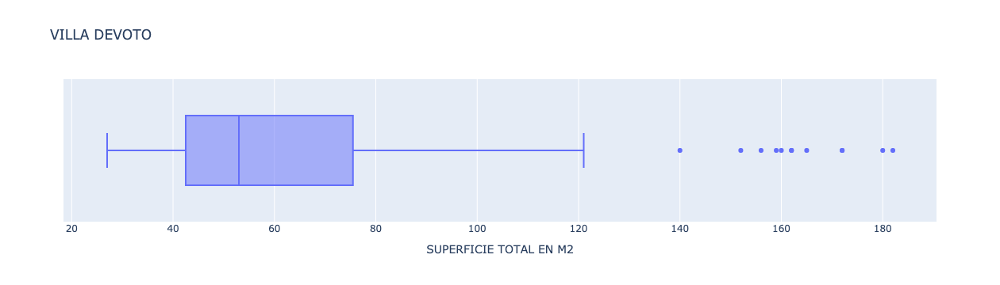

In [159]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='villadevoto'], x = "SUPERFICIE TOTAL EN M2", title='VILLA DEVOTO')
fig.show()

In [160]:
devoto_index =df_apartamentos[df_apartamentos['PLACE NAME']=='villadevoto'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:10].index
df_apartamentos[df_apartamentos['PLACE NAME']=='villadevoto'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:10]


,SUPERFICIE TOTAL EN M2,title,description
61074,182.000,piso4ambcocheradoble,"pisodecategoria-enzonaresidencial-edificioenesquina(de5pisossolamente)lograndoquetodoslosambientesseanexternos(tipotorre)perode5pisos-palierprivadohallentrada-ampliolivingcomedorapaisado(pisosdemaderatarugadoplastificado)salidabalconterrazade20m2concerramientoyairesplitfriocalor)-doblecirculacion-3dormitorios(1ensuitede4,6x4+vestidor+bañocompletoconjacuzzi)-bañocompleto-toilderecepcion-cocinasuperequipada-comedordiario-lavaderocubiertoconbalconparatenderropa-dependenciadeservicioconbañodeservicio-calefaccionporductoconcalederaindividualesfriocalor-cortinasbarrio-puertasblindadaslaprincipalcomoladeservicio-cocheradobleensubsuelocubiertaybaulera-terrazacomundeledifcio-edificioredeadodejardina2cuadrasdelaestaciondevotoydeavbeiro-claudioparrapropiedadescasacentral:avfleming2698-martíneztelefono:(rotativas)sucursal:ibera5089-pb1(1431)villaurquizatelefono:/1941"
80849,180.000,"semipiso4ambientes,cochera180m2","semipiso4ambientesalfrentereciclado,excelenteestadoconstade:livingconbalcon,comedor,cocinaconcomedordiario,lavadero,dependenciaybaodeservicio,toilettederecepcion,2baoscompletos(1suite),tresdormitoriosconplacardyconsalidaaunbalconencadauno2ascensoresprincipales(1paracadadepartamentodelpiso)yunadeservicioentradaprincipalydeserviciococherafijaensubsuelogrupoelectrgeno,vigilancialosfinesdesemanade10a20hs180m2totales+cocherapublicadoporjosepintimallipropiedadesatravesinmomap"
70675,172.000,departamento-villadevoto,"ventadedepartamento4ambientesenvilladevotoexcelentepisode4ambientesenzonaprivilegiadadevilladevotoentradaporpalierprivadoalivingcomedorde700x335conampliobalcontienetoilettederecepcionluminosacocinade600x160ampliasuitede350x340convestidorybañocompletosegundodormitoriode310x280conplacard(posibildaddeintegrarallivingcomedor)tercerdormitoriode405x260conplacardgranterrazade50m2conparrila,pergola,mesadayposibilidaddeinstalarunamicropiscinaaccesodirectoyprivadoconascensory/oescaleradetallesdegrancategoriacañeriastermofusioncongarantiahalldeentradaconblindexysistemadevigilanciaconcamarasdeseguridadpuertasdemaderadeprimeracalidadconcontramarcodeterminacioncerramientosconvidriodobletermopanelconexionparasplitentodoslosambientesconcañeriadecobreinstaladacalefaccionconcalderaindividualporpisoradiantesectorizadogriferiafvconcierreceramicoenbañosymonocomandoencocinaplacaresconinterioresdepisoatechomueblesdecocinacompletosymesadadegranitoetc1\tlasmedidasindicadassonaproximadasyalsoloefectoorientativo,lasmedidasrealessurgirándeltítulodepropiedadrespectivo2\tlaventadeesteinmuebleestásujetaalatramitacióndelcódigodetransferenciadeinmuebles(coti),deconformidadconlanormativavigente(resafip2371/08,2439/08yccs),porpartedelpropietario3\telpreciodelinmueblepuedesermodificadosinprevioaviso4\tfotosdecarácternocontractual5\telvalordelasexpensas,encasodetener,estásujetoaverificacióny/oajustes"
70286,172.000,departamentoenvilladevoto,"ventadedepartamento4ambientesenvilladevotoexcelentepisode4ambientesenzonaprivilegiadadevilladevotoentradaporpalierprivadoalivingcomedorde700x335conampliobalcontienetoilettederecepcionluminosacocinade600x160ampliasuitede350x340convestidorybañocompletosegundodormitoriode310x280conplacard(posibildaddeintegrarallivingcomedor)tercerdormitoriode405x260conplacardgranterrazade50m2conparrila,pergola,mesadayposibilidaddeinstalarunamicropiscinaaccesodirectoyprivadoconascensory/oescaleradetallesdegrancategoriacañeriastermofusioncongarantiahalldeentradaconblindexysistemadevigilanciaconcamarasdeseguridadpuertasdemaderadeprimeracalidadconcontramarcodeterminacioncerramientosconvidriodobletermopanelconexionparasplitentodoslosambientesconcañeriadecobreinstaladacalefaccionconcalderaindividualporpisoradiantesectorizadogriferiafvconcierreceramicoenbañosymonocomandoencocinaplacaresconinterioresdepisoatechomueblesdecocinacompletosymesadadegranitoetc1\tlasmedidasindicadassonaproximadasyalsoloefectoorientativo,lasmedidasrealessurgirándeltítulodepropiedadrespectivo2\tl

In [161]:
df.loc[devoto_index[0],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[1],'TIPO DE PROPIEDAD']='piso/penthouse'
df = df.drop(devoto_index[2])
df.loc[devoto_index[3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[4],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[-4],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[-3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[-2],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[-1],'TIPO DE PROPIEDAD']='piso/penthouse'

### Palermo Chico - Apartment

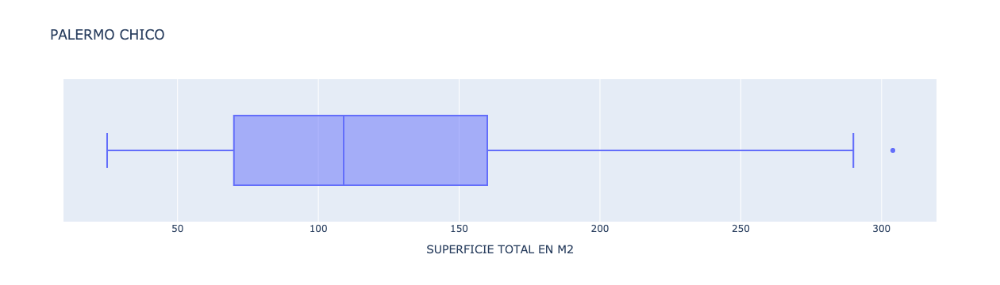

In [162]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='palermochico'], x = "SUPERFICIE TOTAL EN M2", title='PALERMO CHICO')
fig.show()

In [163]:
df_apartamentos[df_apartamentos['PLACE NAME']=='palermochico'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]


,SUPERFICIE TOTAL EN M2,title,description
13993,304.000,departamentoedificioedificiolanusselivingcomedor4dormitorio(s)3suiteconvest3baño(s)habitacióndeservicio2cochera(s)alfrentedegrancategoriaenmuybuenestadoorientaciónesteantigüedad50años,departamentoedificioedificiolanusselivingcomedor4dormitorio(s)3suiteconvest3baño(s)habitacióndeservicio2cochera(s)alfrentedegrancategoriaenmuybuenestadoorientaciónesteantigüedad50años


### Villa del Parque - Apartment

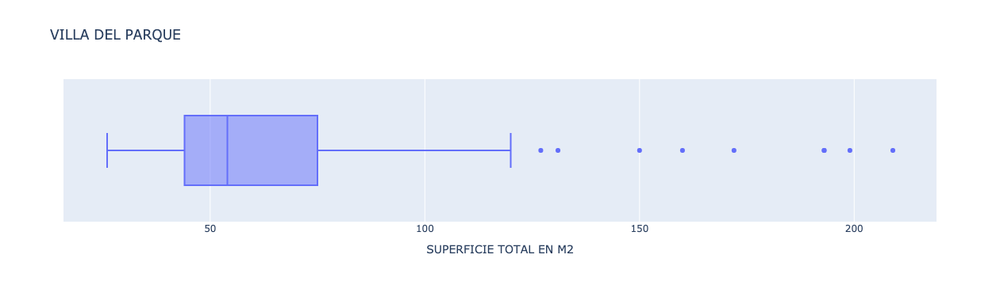

In [164]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='villadelparque'], x = "SUPERFICIE TOTAL EN M2", title='VILLA DEL PARQUE')
fig.show()

In [165]:
villadelparque_index = df_apartamentos[df_apartamentos['PLACE NAME']=='villadelparque']\
.sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:8].index
df_apartamentos[df_apartamentos['PLACE NAME']=='villadelparque']\
.sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:8]


,SUPERFICIE TOTAL EN M2,title,description
4598,209.000,departamentoenventa,"ventadetreiplexhermoso,alfrenteconentradaindependiente,entradaparadosautospb:escritorio(conentradaindependiente)living,bañoconducha,comedor,cocinaconbarradesayunadora,mueblesaltosybajos,lavadero,patioconparrillasegundaplanta:4dormitorios,conplacards,dosalfrenteconsalidaabalcon,2bañoscompletostercerlanta:playroomtodoanuevo,unchiche,cañosdegua,gas,electricidad,deprimeracalidadconconfortsinexpensasamplio,funcional,luminoso,muyventilado,superficiecubierta151,78,desucbierta4739,semicubierta484,balcon450,superficietotal208,51sedejaconstanciaquelasmedidas,superficiesym2consignadossonaproximados,sujetosaverificacióny/oajusteelpreciodelinmueblepuedesermodificadosinprevioavisofotosdecarácternocontractuallasunidadespublicadasestansujetasadisponibilidadgoldsteinpropiedadessrlactuasolamenteencarácterdecomercializadoradelosinmueblesofrecidosgoldsteinpropiedadessrlavdacorrientes4666buenosaires,--goldsteinpropiedadessrl"
79976,199.000,departamentos3dormitoriosc/dep,"###edifdoblefrente,seg24hscochimpecable!!!!###granrecepcionde72m2,escritorio,comedorsuiteconvestidor,2dormensemisuiteconjacuzzi,todoslosbañosenmármostravertino,esplendidacocinatodobarujell,anuevo,impecable,doblehorno,comdiario,garnlavadero(exdepend)playroombalcóncorrido(verfotodeledificio),pisosdetarugado,tododeexcelentecalidadlistoparausar,nohayquehacerlenadacocherafija,baulera,salóndeusosmúltiples"
49161,193.000,pisode193m2cocheraybaulera,"pisoconcocheraybauleraimportantepisodegrancategoríaenexcelenteubicación,nazarreynazca(a2cuadrasdelaestaciónvilladelparque)muyluminosoyenexcelenteestado!ampliolivingcomedorenlde850x370+350x320consalidaabalcónalfrentede866x1convistaabierta,placardderecepción,5dormitorios(principal:360x320ensuiteconvestidorybañoconjacuzzi,dorm2:350x320,dorm3:4x220,dorm4:280x240,dorm5:360x2,todosconplacard),bañocompletoconyacuzziensuite+otrobañocompleto+otrobañoconducha+toilettederecepción+un5ºbaño,hallde10x1,cocinasuperampliade6x2conanafe+hornoempotrado,comedordiario510x340,otrobalcónalcontrafrenteabiertoapulmón,lavaderoindependientecocherafijaycubierta,bauleratriplecirculación,palierprivado,entradaprincipalydeservicio,pisosdemoqueteentodalaunidadcalefacciónporlosaindividualporcaldera,aguacalienteindividualportermotanqueventau$s350000****filippopropiedades********"
49150,193.000,6ambientes193m2/cocheraybaulera,"6ambientesconcocheraybauleraimportantepisodegrancategoríaenexcelenteubicación,nazarreynazca(a2cuadrasdelaestaciónvilladelparque)muyluminosoyenexcelenteestado!ampliolivingcomedorenlde850x370+350x320consalidaabalcónalfrentede866x1convistaabierta,placardderecepción,5dormitorios(principal:360x320ensuiteconvestidorybañoconjacuzzi,dorm2:350x320,dorm3:4x220,dorm4:280x240,dorm5:360x2,todosconplacard),bañocompletoconyacuzziensuite+otrobañocompleto+otrobañoconducha+toilettederecepción+un5ºbaño,hallde10x1,cocinasuperampliade6x2conanafe+hornoempotrado,comedordiario510x340,otrobalcónalcontrafrenteabiertoapulmón,lavaderoindependientecocherafijaycubierta,bauleratriplecirculación,palierprivado,entradaprincipalydeservicio,pisosdemoqueteentodalaunidadcalefacciónporlosaindividualporcaldera,aguacalienteindividualportermotanque****filippopropiedades************"
36613,172.000,departamentoenventa,"ventaduplex4ambientes+dependencia+garage+fondo*alfrente*sinexpensas**ampliolivingcomedorcona/a*cocinasemi-integrada*3dormitoriostodoscona/ayconplacard*patiode6x4,33*cochera*dependenciaconbaño*2bañosy1toillette***losaradiante***##excelentepropiedad##*muybuenaubicación**a2cuadrasdeavnazca**a2cuadrasdeavalvarezjonte**colectivos:24,63,84,109,110,113,124,133,134,135*-setomapropiedadenpartedepago-consulteporhipotecaprivadalasmedidassonatituloinformativo,lasmedidasrealesfiguranenplanovisitánuestrapáginawebyfanpagetellíneasrotativas--cimaspropiedades"
17244,160.000,departamentode4ambientesentresplantas,"entradaindependiente,haciaabajogarajeprivadocubiertode10x5hasta2autoslavadero,patiode4x5mtsyparrillahaciaarribaconpo

In [166]:
df.loc[villadelparque_index[0],'TIPO DE PROPIEDAD']='duplex/triplex'
df.loc[villadelparque_index[2],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villadelparque_index[3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villadelparque_index[4],'TIPO DE PROPIEDAD']='duplex/triplex'
df.loc[villadelparque_index[-2],'TIPO DE PROPIEDAD']='piso/penthouse'

### Centro/Microcentro - Apartment

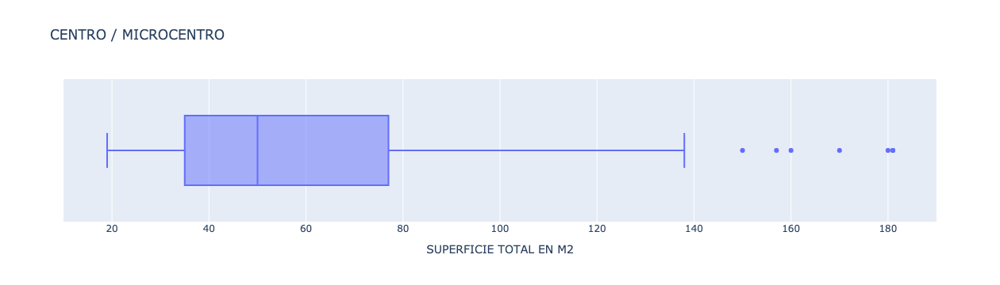

In [167]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='centro/microcentro'], x = "SUPERFICIE TOTAL EN M2", title='CENTRO / MICROCENTRO')
fig.show()

In [168]:
df_apartamentos[df_apartamentos['PLACE NAME']=='centro/microcentro'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2]


,SUPERFICIE TOTAL EN M2,title,description
77179,181.000,departamento-microcentro,"sup7ºa:32,6m2sup7ºb:32,4m2sup7ºc:32,4m2sup7ºd:39m2sup2ºg:45m2suptotal:181,4m2expensas$1500cadadeptoexcelenteoporunidadparainversoresy/oblanqueoenedificio“aestrenar”,unodelos“gremios”vende5unidadesdedeptosaunvalorcosto,…irrepetible!!!noselopierda!!!lossábadossepuedeverentrelas11y18hscontactaral156-445-6020"
49627,181.000,departamento-microcentro,"sup7ºa:32,6m2sup7ºb:32,4m2sup7ºc:32,4m2sup7ºd:39m2sup2ºg:45m2suptotal:181,4m2expensas$1500cadadeptoexcelenteoporunidadparainversoresy/oblanqueoenedificio“aestrenar”,unodelos“gremios”vende5unidadesdedeptosaunvalorcosto,…irrepetible!!!noselopierda!!!lossábadossepuedeverentrelas11y18hscontactaral156-445-6020"


### Villa Lugano - Apartment

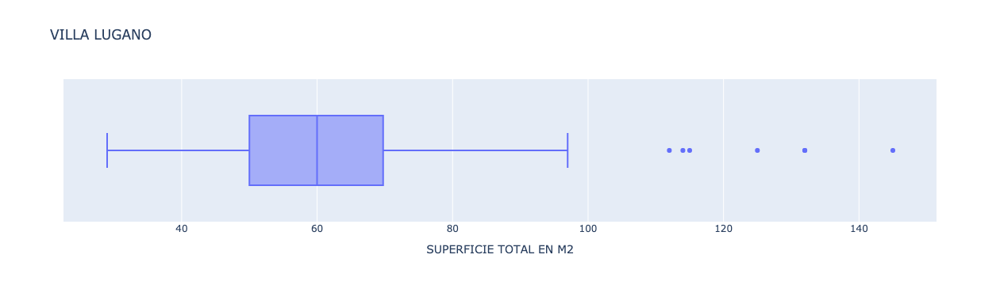

In [169]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='villalugano'], x = "SUPERFICIE TOTAL EN M2", title='VILLA LUGANO')
fig.show()

In [170]:
lugano_index = df_apartamentos[df_apartamentos['PLACE NAME']=='villalugano']\
.sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:6].index
df_apartamentos[df_apartamentos['PLACE NAME']=='villalugano']\
.sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:6]


,SUPERFICIE TOTAL EN M2,title,description
45273,145.000,excelentepsosavriestra,"excelentepisosobreavriestraycafayatelivingcomedor6x4conpisosdemarmolbotichinicocina3,50x3,50conpisosporcelanato3dormitorios(3x3,50)(3x3,50)(3,50x3,50)pisosflotantes3baosdormitorioppalconvestidorde5,50x2,50hidromasajelavadero2x2balconcorridopuertablindadaen1erpisodeledificioquinchocomunpublicadoporcarlosvazquezehijoinmobatravesinmomap"
55814,132.000,semipisoespectacular3amb,"semipisode4ambenelcomplejofranova!!!comosiestaríasenuncountryencabacercaatodoslospuntosdeaccesoyavenidaspasan2premetrosenfrenteestánhaciendolaobradelavillaolímpicaylovaahacercrecermuchomásaun!!!eldepartamentoestaimpecable,cuentaconunampliolivingcomedorycocinasemi-integrada,dosdormitorioscondosbañossoncompletosy1bañodeserviciodespensaapartetienedosbalconessemiterrazaconvistaespectacularabiertatodoslosambientesventilanalexteriorconlocualessuperluminoso!!lacocheraseencuentraensubsueloyeslamejor!!!expensas:$1300-abl:verplano:https://googl/ss2o0ivervídeo:https://googl/eqaiuavernuestrapublicación:http://googl/46njpyteperdisteeldelatorre4?notelopierdaseste!!!cifarelli|constructora-inmobiliariamn6199lunesaviernesde10a13y15a19|sábados10a13códigodelapropiedad:cap243458lasmedidassonaproximadasqueressabermassobrenosotros?miraestevideosobrenuestrafilosofíadetrabajo!https://googl/d6kvn8"
56427,132.000,departamento-villalugano,"ventasemipisode4ambientesenluganocapitalfederalsituadoenelcomplejofranova!!!comosiestaríasenuncountryencabacercaatodoslospuntosdeaccesoyavenidaspasan2premetrosenfrenteestánhaciendolaobradelavillaolímpicaylovaahacercrecermuchomásaun!!!eldepartamentoestaimpecable,cuentaconunampliolivingcomedorycocinasemi-integrada,dosdormitoriosunidos(sepuedenseparardenuevo,condosbañosquesoncompletosyunahabitaciónmásdeservicioconelbañocompletoapartetienedosbalconessemiterrazaconvistaespectacularabiertatodoslosambientesventilanalexteriorconlocualessuperluminoso!!lacocheraseencuentraensubsueloexpensas:$1700-verplano:https://googl/rgjnsxvervídeo:https://googl/wb8av4vernuestrapublicación:https://googl/xyudmxcifarelli|constructora-inmobiliariamn6199lunesaviernesde10a13y15a19|sábados10a13códigodelapropiedad:cap443062lasmedidassonaproximadasqueressabermassobrenosotros?miraestevideosobrenuestrafilosofíadetrabajo!https://googl/d6kvn8"
78923,125.000,departamento-villalugano,"departamento125m²conpavimento,capitalfederal,villalugano,poru$s195000"
19432,115.000,dpto4ambsinexpensasvriachueloaccininmobiliaria,"excelentedptode4ambcon3dorm,conplacard,livingcomedor,cocinacomedor,baoconaltebao,patioconparrillayterrazaconquincho2pisoxescmuyluminoso,vistaabierta,imperdiblesinexpensasaptocreditobancarioaccininmobiliariapuedeverunpaseoenelsiguientelinkyoutubehttps://youtube/xbvc4gw_zhqpublicadoporaccininmobiliariaatravesinmomap"
55449,114.000,"3ambientescondosbaños,dosbalconesde114m2","hermososemipisode3ambenelcomplejofranovacomosiestaríasenuncountryencabacercaatodoslospuntosdeaccesoyavenidaspasan2premetrosenfrenteestánhaciendolaobradelavillaolimpicaylovaahacercrecermuchomásaun!eldepartamentoestaimpecable,cuentaconunampliolivingcomedorycocinaconlavadero,dosdormitorios(unoensuiteyconvestidor)losdosbañossoncompletosapartetienedosbalconessemiterrazaconvistaespectacularabiertatodoslosambientesventilanalexteriorconlocualessuperluminoso!losdormitoriosdanaljardindelcomplejolacocheraseencuentraensubsueloyeslamejor!verplano:https://googl/dmcy1ivervideo:https://googl/uf5va9notelopierdas!!!cifarelli|constructora-inmobiliariamn6199lunesaviernesde10a13y15a19|sábados10a13códigodelapropiedad:cap201862lasmedidassonaproximadasqueressabermassobrenosotros?miraestevideosobrenuestrafilosofíadetrabajo!https://googl/d6kvn8"


In [171]:
df.loc[lugano_index[0],'TIPO DE PROPIEDAD']='piso/penthouse'
df=df.drop(lugano_index[1])
df.loc[lugano_index[2],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[lugano_index[-1],'TIPO DE PROPIEDAD']='piso/penthouse'

Ahora, vamos a revisar con un describe los valores que nos quedaron 

In [172]:
df_departamentos_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='apartment')]
df_departamentos_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,1914.000,8317.000,4728.000,14341.000,12468.000,11501.000,14425.000,14382.000
mean,8.900,2.664,3011.643,69.347,74.160,2718.058,264325.016,202911.910
std,60.728,1.245,3043.165,135.037,45.260,1199.545,498629.742,191428.779
min,1.000,1.000,1.000,1.000,18.000,69.239,24300.000,5103.610
25%,2.000,2.000,1300.000,38.000,42.000,2069.767,100100.000,99000.000
50%,4.000,3.000,2000.000,54.000,60.000,2500.000,148000.000,143000.000
75%,7.000,4.000,3600.000,82.000,91.000,3054.545,250000.000,235000.000
max,2103.000,12.000,54240.000,9152.000,535.000,40720.406,14756597.000,3100000.000


In [173]:
#Lo minimo de un departamento son 27m2.
sup_min_mal_cargada=df_departamentos_caba[np.logical_or(df_departamentos_caba['SUPERFICIE CUBIERTA EN M2']<27,df_departamentos_caba['SUPERFICIE TOTAL EN M2']<27)].index
df_departamentos_caba[np.logical_or(df_departamentos_caba['SUPERFICIE CUBIERTA EN M2']<27,df_departamentos_caba['SUPERFICIE TOTAL EN M2']<27)]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
879,sell,apartment,recoleta,|argentina|capitalfederal|recoleta|,argentina,capitalfederal,3429595.000,"-345940974,-583911079",-34.594,-58.391,95000.000,usd,1676227.500,95000.000,40.000,25.000,2375.000,3800.000,NaN,1.000,NaN,http://wwwproperaticomar/15hg1_venta_departamento_recoleta_terraza_luminoso_subte-linea-d_achaval-cornejo_edw,"monoambienteconterrazaenexcelenteubicacion,muyluminosokitchenetybañosinduchaaptoprofesional",juncal16001°d,https://thumbs4properaticom/9/jp9zu0omiighhytcq8ghkjgqz6e=/trim/198x0/smart/filters:strip_icc()/staticsumapropcom/3947/445596/files/4382137jpg,recoleta,25.000,40.000,2375.000,95000.000,usd,95000.000,apartment
1273,sell,apartment,almagro,|argentina|capitalfederal|almagro|,argentina,capitalfederal,3436397.000,"-3460596848,-5842522812",-34.606,-58.425,NaN,NaN,NaN,NaN,22.000,NaN,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/15jf7_venta_departamento_almagro_peron_4151_patio_subte-linea-b_subte-linea-a_vanina-lopez-servicios-inmobiliarios,excelentemonoambienteaptoprofesionalidealconsultorioporsuestratégicaubicaciónfrentealhospitalitalianobañocompletoconvanitorypatiopisosflotantestermotanqueyanafeeléctricosexpensasincluyenagua,u$d70000-departamentoenventa-perón4151,https://thumbs4properaticom/6/ldcfsobcvoxiy4o5tl4kmhfn7m0=/trim/198x0/smart/filters:strip_icc()/armaixoncom/img/properties/extra_large_5894a3600e8f7jpg,almagro,NaN,22.000,NaN,NaN,NaN,NaN,apartment
1615,sell,apartment,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-3454615402,-5846242142",-34.546,-58.462,NaN,NaN,NaN,NaN,26.000,26.000,NaN,NaN,NaN,1.000,NaN,http://wwwproperaticomar/15k3s_venta_departamento_belgrano_3-de-febrero_3567_placard_oscar-pereno-propiedades,"segundopisoporescaleracocinaconbarradivisoria,calefacciónindividual,habitaciónconplacard",u$d72000-departamentoenventa-3defebrero3567,https://thumbs4properaticom/5/ebrv7k3ka7vbttjrtb1lcetxpnw=/trim/198x0/smart/filters:strip_icc()/armaixoncom/img/properties/extra_large_5850079a36459jpg,belgrano,26.000,26.000,NaN,NaN,NaN,NaN,apartment
1952,sell,apartment,sannicolás,|argentina|capitalfederal|sannicolás|,argentina,capitalfederal,6693229.000,"-3460410309,-5838792801",-34.604,-58.388,NaN,NaN,NaN,NaN,23.000,23.000,NaN,NaN,NaN,1.000,NaN,http://wwwproperaticomar/15klg_venta_departamento_san-nicolas_corrientes-y-parana_luminoso_subte-linea-d_subte-linea-b_subte-linea-a_ignacio-frias-propiedades,"1ambientecocinaindependientecompletapisosderobledeeslavonia,muybuenestadoentrepisonovenopisohall:2,61x1,90ambiente:4,70x3aysa:$380abl:$130informaciónadicional:luminosidad:luminoso",u$d53000-departamentoenventa-corrientesyparaná0,https://thumbs4properaticom/6/ged5rigseszvnf1eu1o4n1gzhy8=/trim/198x0/smart/filters:strip_icc()/armaixoncom/img/properties/extra_large_57f810b95ccb3jpg,sannicolás,23.000,23.000,NaN,NaN,NaN,NaN,apartment
1953,sell,apartment,capitalfederal,|argentina|capitalfederal|,argentina,capitalfederal,3433955.000,"-346027692653,-583683154331",-34.603,-58.368,NaN,NaN,NaN,NaN,30.000,25.000,NaN,NaN,15.000,NaN,NaN,http://wwwproperaticomar/15klj_venta_departamento_capital-federal_corrientes-av-_1_patio_luminoso_subte-linea-d_subte-linea-b_subte-linea-a_ignacio-frias-propiedades,1ambienteconpatioserviciosindividualesinformaciónadicional:luminosidad:pocoluminoso,u$d55000-departamentoenventa-corrientes16000,https://thumbs4properaticom/8/rrtq7xn6v75io0i2cfqvsrtlx8u=/trim/198x0/smart/filters:strip_icc()/armaixoncom/img/properties/extra_large_57f810c99f0afjpg,corrientes,25.000,30.000,NaN,NaN,NaN,NaN,apartment
...,...,...,...,...,...,...,...

In [174]:
df = df.drop(sup_min_mal_cargada)

In [175]:
df_departamentos_caba.sort_values('SUPERFICIE CUBIERTA EN M2',ascending=False)[:10]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
42072,sell,apartment,montecastro,|argentina|capitalfederal|montecastro|,argentina,capitalfederal,3430596.000,"-34618411,-58497949",-34.618,-58.498,138000.000,usd,2434941.000,138000.000,NaN,9152.000,NaN,15.079,3.000,4.000,NaN,http://wwwproperaticomar/19r6g_venta_departamento_monte-castro_balcon_luminoso_apto-credito-hipotecario_re-max-uno-iv,"corredorresponsable:unobienesraicessrl-cucicba4993contacto:albertofarías-mlsid#420951004-1ecelentedepartamento,4ambientesamplios,muyluminosoyaireado,conbalcónenmuybuenestadoaptocrédito",excelentedeptode4ambienesmuyluminoso,https://thumbs4properaticom/3/9cbq2o2xogfyup320dh9s_bye8a=/trim/198x0/smart/filters:strip_icc()/remaxcomar/userimages/42/l_50e7466e1b9c4efba19cc63eb13a17fe_ilistjpg,montecastro,9152.000,NaN,NaN,138000.000,usd,138000.000,apartment
48014,sell,apartment,palermo,|argentina|capitalfederal|palermo|,argentina,capitalfederal,3430234.000,"-34588259,-58409503",-34.588,-58.410,220000.000,usd,3881790.000,220000.000,NaN,7029.000,NaN,31.299,6.000,4.000,NaN,http://wwwproperaticomar/1aa1j_venta_departamento_palermo_balcon_lavadero_luminoso_subte-linea-d_re-max-capital,"corredorresponsable:cristianarnalponti-cucicba3570contacto:luzbotta-mlsid#221095-94setratadeundepartamentoenlaesquinadecoroneldiazyarenales,altoluminoso,solbalcón,livingcomedorycuartoprincipalalfrentedosbañoscompletos,ydoscuartosmás,cocinaconlugarparadesayunadorylavaderosevendeconmueblesbuenos,electrodomésticos,todocompletoparatenerunarentadeaproximadamentedólares1400comovieneteniendohastaahoraopciónsinmueblesdólares210000cercadelparquelasheras,santafé,todoslosmediossubtes,colectivosaptoprofesional",4ambientesfrentealaltopalermoc/osinmuebles,https://thumbs4properaticom/6/gbchroems94d8pwtg5hw7i_eu_y=/trim/198x0/smart/filters:strip_icc()/remaxcomar/userimages/42/l_660d4dd379334b8dba98ea377f576d08_ilistjpg,palermo,7029.000,NaN,NaN,220000.000,usd,220000.000,apartment
77363,sell,apartment,floresta,|argentina|capitalfederal|floresta|,argentina,capitalfederal,3433910.000,"-346317378902,-584794281617",-34.632,-58.479,108000.000,usd,1905606.000,108000.000,NaN,6534.000,NaN,16.529,5.000,4.000,NaN,http://wwwproperaticomar/1c2kh_venta_departamento_floresta_flores-venancio-gral-_3700_balcon_garage_placard_re-max-parque,"corredorresponsable:hernanperrone-cucicba2792contacto:claudiacollini-mlsid#151096-123departamento4ambientes,livingcomedorconbalcon,cocinacomedordiarioconlavadavero,bañocompleto,3dormitoriosconplacardmuyventidoymuchaluzmuchosmediosdetransporte,a1cuadraderivadavia,estacióndeffccestacíonflorestabajasexpensas",departamento4ambientescocinaseparadamuchaluz,https://thumbs4properaticom/2/0zhir2ib1oz4mtryyei0vbgxlm4=/trim/198x0/smart/filters:strip_icc()/remaxcomar/userimages/42/l_977d493191c24a26882ab90e20bc4c3d_ilistjpg,floresta,6534.000,NaN,NaN,108000.000,usd,108000.000,apartment
80540,sell,apartment,flores,|argentina|capitalfederal|flores|,argentina,capitalfederal,3433918.000,"-34630699,-58472579",-34.631,-58.473,129000.000,usd,2276140.500,129000.000,NaN,6062.000,NaN,21.280,8.000,2.000,NaN,http://wwwproperaticomar/1c9im_venta_departamento_flores_balcon_patio_luminoso_garage_subte-linea-a_re-max-juntos,"corredorresponsable:ramiroelkadi-cucicba6534contacto:fernandoferraro-mlsid#420791007-20lindodptode2ambientesconampliobalcóncorridoubicadoenhelguera,entrelaavenidarivadaviayyerbalamediacuadrademasde10lineasdecolectivos,adoscuadrasdelaestacióndesubtesanpedritoeldptoconstadehalldeentrada,cocina,livingcomedor,bañocompleeto,dormitoriopatiointernoyampliobalcóncorridoalfrentedptomuyluminoso",dpto2ambientescona

In [176]:
#Segun zonaprop, la maxima dimension de un departamento es de 750m2
sup_max_mal_cargada=df_departamentos_caba[df_departamentos_caba['SUPERFICIE CUBIERTA EN M2'] > 750].index 

In [177]:
df = df.drop(sup_max_mal_cargada)

In [178]:
#Vamos a dropear todo piso superior al 56, medida de Alvear Tower, la torre mas alta de caba.
piso_mal_cargado=df[df['floor'] > 56].index
df.sort_values('floor',ascending=False)[:20]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
29036,sell,house,nogoyá,|argentina|entreríos|nogoyá|,argentina,entreríos,3430412.000,"-323977301,-597901354",-32.398,-59.790,NaN,NaN,NaN,NaN,276.000,167.000,NaN,NaN,3150.000,5.000,NaN,http://wwwproperaticomar/18o8m_venta_casa_nogoya_caseros-1132_lavadero_patio_inmobiliaria-segura,"ampliacasaconlocalenplenocentroaunacuadradeplazalibertadenunacallemuytransitadaqueconstade:localcomercialconbañoydepositocasaconlocal,3dormitorios,baño,living,cocinacomedor,lavadero,churrasqueraypatio(congasnaturalyinstalaciondeaguacaliente--inmobiliariasegura",casaenventa,https://thumbs4properaticom/5/03iwlqtkvn9oygc_eorutlzetnk=/trim/198x0/smart/filters:strip_icc()/xintelwebcom/upload/nog1589_2jpg%3f1501533831,nogoyá,167.000,276.000,NaN,NaN,NaN,NaN,deposito
45215,sell,house,villarosa,|argentina|bsasgbazonanorte|pilar|villarosa|,argentina,bsasgbazonanorte,3427377.000,"-34411636,-58843031",-34.412,-58.843,690000.000,usd,12174705.000,690000.000,NaN,508.000,NaN,1358.268,2177.000,5.000,NaN,http://wwwproperaticomar/19zbi_venta_casa_villa-rosa_balcon_suite_hidromasaje_lavadero_parrilla_piscina_vestidor_luminoso_dependencias_garage_placard_aire-acondicionado_re-max-uno-iii,"corredorresponsable:unobienesraicessrl-cmcpsi5821contacto:gracieladelvallemonteros-mlsid#420681005-196descripcion:magnificacasadesarrolladaen2plantas,livingconhogar,mueblesbajosconcajonerasaloscostadosdelhogaryenotrosambientesdelacasa,todoshechosamedida,comedor,estarconmuebleempotradoyplacardderecepciónpisosdeporcelanato,iluminaciónconledsimportantepuertacorredizademaderaqueseparaelcomedordelcomedordiarioelcomedordiarioposeeunmuebleamedidadeparedaparedparaguardadoyespacioparatvexcelentecocinaconcajonesconfrenotelescópico,artefactosariston,2hornosempotrados,unoagas,otroeléctricograncantidaddealacenasparaguardadobreakfastespaciopara3heladeras,lavavajillasdespensadependenciadeservicioconbañolavaderocondoblebacha,2calderas,1termotanqueyespacioparacolocaruntercerodobletablero,unoparapaotroparapbvidrioslaminadosdoblesentodalapropiedad,persianasautomatizadasmastersuiteampliayluminosaconvestidorybalcón,bañoconduchaescocesayjacuzzi,mesadasdemármoldosjuniorsuite,unoconestaryplayroomenentrepisoydosbalconesescritoriocuartodormitorioescaleraconmármolymadera9airesacondicionadoscalefacciónporradiadoresgaleríaconparrilladeaceroinoxidableyartefactodecocinapiletade12x5condesbordeinfinito,riegoartificialgaragecubpara3o4autos,espaciodescubiertoparaautostenderexcelenteestadoseescuchanpropuestas!!!",ventacasalapraderapilar,https://thumbs4properaticom/9/u7vsfygtfm7_ht81txch5dxnlqq=/trim/198x0/smart/filters:strip_icc()/remaxcomar/userimages/42/l_fd9051c9c6aa4dae9af3fd4ba75b7539_ilistjpg,villarosa,508.000,NaN,NaN,690000.000,usd,690000.000,house
47353,sell,apartment,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-34574659,-58473337",-34.575,-58.473,390000.000,usd,6881355.000,390000.000,NaN,133.000,NaN,2932.331,2103.000,4.000,NaN,http://wwwproperaticomar/1a8gs_venta_departamento_belgrano_balcon_baulera_suite_gimnasio_jardin_lavadero_patio_piscina_sum_luminoso_sauna_dependencias_garage_amenities_subte-linea-b_apto-credito-hipotecario_re-max-central,"corredorresponsable:gustavoguastello-cucicba869contacto:carlavinograd-mlsid#42024***paraunarespuestainmediatacomunicarseconelagentepormailocelular***deptode4ambientescondependencia,cocheraybaulerabañocompletopara2ºy3ºcuarto2dacocheraoptativa:u$d25000aptoprofesionalnoesaptocreditoescrituración:em2mesesaproxesun1erpiso(conpatiointernopropio)de4pisosenuncomplejohermosodeviviendasmedidas:living:710x370balcon,coci

In [179]:
df = df.drop(piso_mal_cargado)

In [180]:
precio_usd_m2_mal_cargado=df_departamentos_caba.sort_values('PRECIO USD POR M2',ascending=False)[:20]\
                        [['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','PLACE NAME','title','description']].index

df_departamentos_caba.sort_values('PRECIO USD POR M2',ascending=False)[:20]\
                                [['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','PLACE NAME','rooms','title','description']]

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,PLACE NAME,rooms,title,description
41839,40720.406,2809708.000,69.000,flores,NaN,departamentoenventa,"ventadedepartamento3ambientesenflores,capitalfederalubicadoenavgaonaentrecaracasyafbufanoellotetieneunasuperficiede8,72mdefrentex30,86mdeprofundidadeledificiocuentacon14pisos,dedepartamentode1,2y3ambientesaptoprofesionaly/oviviendaavenidascercanas:juanbjusto,avellaneda,rivadavia,nazcayboyacaseencuentracercadeplazairlandayzonascomercialesconlibrerias,bares,restaurantes,colegiosvariedaddelineasdecolectivoscerca,asicomotambiénsubtesymetrobus--grupozetainmobiliaria"
41840,39899.595,1476285.000,37.000,flores,NaN,departamentoenventa,"ventadedepartamento3ambientesenflores,capitalfederalubicadoenavgaonaentrecaracasyafbufanoellotetieneunasuperficiede8,72mdefrentex30,86mdeprofundidadeledificiocuentacon14pisos,dedepartamentode1,2y3ambientesaptoprofesionaly/oviviendaavenidascercanas:juanbjusto,avellaneda,rivadavia,nazcayboyacaseencuentracercadeplazairlandayzonascomercialesconlibrerias,bares,restaurantes,colegiosvariedaddelineasdecolectivoscerca,asicomotambiénsubtesymetrobus--grupozetainmobiliaria"
18943,31250.000,1250000.000,40.000,centro/microcentro,2.000,excelente2ambftec/cocherafijaaptoprof,"excelente2ambfteexcelentevistaverdehallentradaconpisosporcelanattoitalianolivingcomedorconbcnfcespisosmaderaplastificadosaacf/ccocinacompletatotalmenteanuevoespacioparalavarropasbaocompletoconmamparaanuevodormitorioconplacard,aac,pisosdemaderaplastificadoscombinadosconporcelanattoitalianoexcelenteluzysolcocherafijavigilanciadignodeveraptoprofesional,opcionconmueblesdeoficinaconsultefacilidadespublicadoporpmpropiedadesatravesinmomap"
18953,17021.277,800000.000,47.000,villadevoto,1.000,monoambientes,publicadoporramospropiedadesatravesinmomap
19267,16666.667,800000.000,48.000,mataderos,3.000,dueovendedto3ambencapital,publicadopormarcelorealatravesinmomap
18839,13881.818,610800.000,44.000,nuñez,1.000,espectacularvistaalriopiso12-posesininmediata,"ambientesampliosdivisiblesdesde41m2a45m2conbalcntodosalexteriorsuper-luminosos-impresionantevistalrioenlospisosaltos-dosascensoresparaochopasajeros-amenities:piscinaconsolariumcondeckdemadera,parrilla,laundry,sum,etc-visiteunidadmodelo!!!!-posesionyescrituracioninmediata!!!!!publicadopornitinmobiliariaatravesinmomap"
77524,13066.667,980000.000,75.000,balvanera,2.000,departamentoventa,"espectaculardepartamentode2ambientesgrandes(45metroscuadrados)alcontrafrenteconbalcónaterrazadoytechadovistaabiertaapatiointernoorientaciónsurtodoluzysoledificiode15añosdeantiguedadaptoprofesionallivingcomedorconpisosdeparquetdormitorioconplacardypisosdeparquetbañoscompletoimpecableestadoubicadoa2cuadrasavrivadavia,subtelínea""a""ymultipleslineasdecolectivosedificiodecategoria(4deptosporpiso),bajasexpensas,ubicadofrentealaplaza1ºdemayocuentaconencargadotodoeldiayvigilancianocturna"
18952,12842.105,732000.000,57.000,caballito,2.000,departamentoaestrenar,"*puertasinterioresdeambientesconmarcodechapayhojatipoplacaacabadocedroosimilar*artefactosdebaocompletostiporocaosimilar-griteradebaosycocinatipofv,hidrometosimilar*aguacalientedeprovisincentralportermotanquesdealtarecuperacinagas*equipossplitdeaireacondicionadofro-calorentodaslasunidades*balconesconpisoscermicosybarandametlicacoloraceronatural*mueblesdecocinabajomesadasyalacenasenmelaminatipomacizaosimilar,conherrajesdebronceplatilincluyeestantesdeguardado,cajoneraconcorrederametlicayespacioporta-horno*herrajesenpuertasdebronceplatil*anafeelctricode2y4hornallasempotradoenmesadadegranito*cocinasybaoscontomadeventilacin*tableroelctricoindividualprovistodedisyuntortiposicaosimilaryllavestrmicastiposicaosimilarporcircuitodiferenciado*solarium,piscinaysum,conpisodeckdemaderatipopecomosimilarypisoantitrmicosegneldiseo*excelentecalidaddeconstruccinyterminacionesunidadesdisponiblesposesionenero2015publicadopormrinmueblesatravesinmomap"
74500,12083.333,2900000.000,240.000,belgrano,NaN,departamento-belgrano,"departamento240m²concloaca,cap

Es un poco ilogico los primeros 3 valores donde departamentos de 2/3 ambientes en flores o microcentro, tengan esos precios usd por m2

De zonaprop, vemos que un monoambiente en VillaDevoto, lo mas caro que esta es de usd 330.000, y para mataderos 150.000usd, un monoambiente en nunez cuesta 7800 usd/m2, lo mismo para balvanera y caballito, los precios son inferiores de mercado, estan mal cargados.

De zonaprop, un departamento de las mismas dimensiones en belgrano, maximo cuesta us 1.500.000, lo mismo para villaurquiza, el precio es demasiado elevado.

El valor de la propiedad en Recoleta, segun zonaprop, esta en 430.000 usd

In [181]:
df = df.drop(precio_usd_m2_mal_cargado[:11])

## House

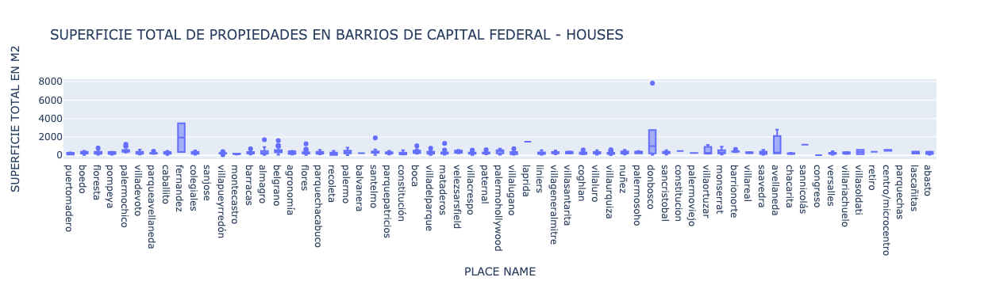

In [182]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')],\
             y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - HOUSES')
fig.show()

In [183]:
df_house = df[df['TIPO DE PROPIEDAD']=='house']


### Floresta - house

In [184]:
floresta_index = df_house[df_house['PLACE NAME']=='floresta'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1].index

df_house[df_house['PLACE NAME']=='floresta'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]

,SUPERFICIE TOTAL EN M2,title,description
28613,800.000,ventacasaenrumenco4amb,"hermosacasaenventaenelexclusivobarrioderumencobarriolaslomascuentaconunterrenode800m2ubicacióneste-oeste,240m2cubiertos,3dormitorios1ensuiteconvestidor,losaradiante,doblevidriodecarpinteríadepvc,equipodeaireacondicionadofrio/calorenliving2bañoscompletos,2toilette,unoadentroyotroengalería,ampliofondocomún,soldetardeenjardínygaleria"


In [185]:
df.loc[floresta_index,'SUPERFICIE TOTAL EN M2']=240

### Palermochico - house

In [186]:
palermochico_index = df_house[df_house['PLACE NAME']=='palermochico'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:3].index
df_house[df_house['PLACE NAME']=='palermochico'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:3]


,SUPERFICIE TOTAL EN M2,title,description
53337,1200.000,casa-palermochico,"excepcionalcasaenventaenbarrioparqueexcepcionalresidenciaenunaubicacióndeexcelenciaenbarrioparque(ombúal3000,frentealaembajadasuiza)construccióndegrancalidad(mármolesitalianosencargadosespecialmenteparalapropiedad)lote261m2(10x26,10m)superficiecubierta:1100m2lacasaestádesarrolladaen:-subsuelodecocheras(para3autosconplatogiratorio),salademáquinas,taller,2cuartosdeservicioensuitequeventilanaunpatiointerno,lavadero,áreadeplanchadoypuertasblindadadeaccesoalaplantabaja;-plantabaja:importantehalldeentradacon2puertasdoblesrealizadasporebanistaselpisodelhalldeentradaesdemármolconunbellísimodibujodeunarosadelosvientos,quefuerealizadoconpequeñostrozosdemármoldediferentestonosycolores,traídosespecialmentedemilángranrecepción,conampliosventanaleshaciaelfrenteyhaciaelcontrafrentepisosdemármolescultóricoimportantechimeneaenmarcadaenparedesrecubiertasdemármollascolumnasdemármolfuerontraídastambiénespecialmentedemilán(soncilindroscortadosenmitadesyencastradosenuntrabajoúnico)sobreelcomedorunaimpactantepirámidevidriada,réplicadelmuseopompidoudepariscomedoríntimo,toilettederecepciónrevestidoíntegramenteenmármol(pisoyparedes)impactanteescaleracentralaérea(sinapoyos),cuyosescalonessondemármolblancoconunabellísimabaranda,rcplicadelaherreríadelpalacioversailleseláreadeservicioestaconformadoporantecocina,office,cocinaconisla,muyequipada,2anafes,3hornos(unodeellosavapor)ycómodasmesadasdesilestone-primerpiso:muyampliohall,granlivingíntimoconbibliotecayescritorio,conbalcónhaciaelfrenteysalidaaunpatioenelcontrafrentetoilettedormitorioensuitehaciaelcontrafrente-segundopiso:sectorprivadode2dormitorios,elprincipal(mastersuite)convestidorybañodegrantamañosectorizadoconjacuzzidoblerevestidoenmármolrosaduchafinlandesaotrodormitorioensuiteconbalcónperimetralhaciaelpulmóndelacasa-tercerpiso:granplayroomconsalidaabalcónaterrazado,frentealaembajadadesuizatoilettecompartimentadocuartodormitorioensuiteconbalcón-cuartopiso:granquinchoconparrillaseparadadelambiente,pisosdequebrachoytechoconvigasdemaderaalavista;jacuzzipara8personasenunambienteseparadoenlamismaplantaterrazamuyampliaconmuylindasvistasalríolaresidenciaposeeascensorrevestidoennogalquerecorretodaslasplantas,consistemadeseguridadencasodecortedeluzmontacargas(dummwaiter)paraalimentosdesdelacocinahastael4topisopuertasblindadas,todoslosbañosrevestidosenmármol;calefaccióncentralporlosaradiantesectorizadaaireacondicionadocentralmarcadaikin(sectorizado)yairesindividualescortinaseléctricaslucesdomotizadas,cámarasdeseguridad4tanquesdeaguade500lcadaunobombapresurizadaexcepcionalcasaenventaenbarrioparqueestamosesperandosuconsulta,equipodeyespropiedades"
10331,1000.000,casaestilofrances,"importantecasadeestilofrancés-jardínconpiletadenatación-impecableestado-recicladaafull-casa:plantabaja:livingycomedoryescritorio,toilette,ascensor,comedordiario,cocina/office,lavadero,garage2autos,jardínconpileta1erpiso:livingíntimo,4dormitorios(2suitesy2semisuites),baulera2dopiso:granplayroom,toilette,quinchoconparrillaycomedor,5todormitorio(suite),2dependenciasconbaño,terrazasótano:salademáquinasyzonadeguardadocasaequipadaconpersianaseléctricasenplantabajaascensorneumático"
34235,1000.000,imponentecasaenbarrioparque!!!,"importanteresidenciaubicadaenbarrioparquelapropiedadfueconstruidaporlaembajadadecanadápararesidenciadelamismalosplanosymaterialesfuerontraídosdecanadáplantas:subsuelo,plantabaja,primerpiso,segundopisoyterrazasuperficieconstruida:1000m²servicios:aireacondicionadocentralcarrier,frío/calorpiletadenatación,ascensor,centraltelefónicadistribucióndepb:hall,escalinataaprimerpiso,escritorio(conchimenea),toilette,living(conchimenea),comedor(conchimenea),office,breakfast,cocina,lavadero,garajepara2autos(dentrodelaresidencia),más2cocherasenelexterior,bañodeservicioarranquedeescaleradeserviciojardín:conpiletaconfiltroycalefactor,cuartoparaguardarherramientasdeljardínprimerpiso:livingíntimo,mastersuiteconvestidorychimenea,bañocompartimentado,suitejunior,d

Se tratan de casos particulares de casas de muy alto nivel, vamos a dropearlas, ya que no son comunes.

In [187]:
df = df.drop(palermochico_index)

### Parque Avellaneda - house

In [188]:
df[df['PLACE NAME']=='parqueavellaneda'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]

,SUPERFICIE TOTAL EN M2,title,description
36909,447.000,casaenventa,"ventadecasa7ambientesomasenparqueavellaneda,capitalfederalmuybuenaubicacióna2cuadrasdeavjuanbalberdi,3deavdirectorio,1deavbruixhermosacasaconunparquehermosoypiscina,quincho,unacuchaexcelenteparasumascotaconuncanilexcelentedistribuciónenpb:constadehalldeentradaconplacardderecepción,ampliolivingcomedorluminoso,cocinacondoblecirculaciónyseparadaconcomedordiario,bañocompleto,cocheraparadosautosconlaescalerahaciaelsótano,lavaderoindependiente,dependenciadeservicioconbañocompletoyunhermosojardínconmuchoverdeconpiletaen1°pisoestánlas5habitacionesampliasconplacarescompletosyairesacondicionadosyescritorioconlos2bañosrestantescalefacción:porcalderavivaenunlugardiferenteenlacapitalfederalesunacasaexcelenteparaunafamilianumerosaalbariño102caba011/011--nirobrokers"


### Villa Pueyrredon - house

In [189]:
pueyrredon_index_max=df_house[df_house['PLACE NAME']=='villapueyrredón'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2].index

pueyrredon_index_min = pueyrredon_index_max=df_house[df_house['PLACE NAME']=='villapueyrredón'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2')[['SUPERFICIE TOTAL EN M2','title','description']][:40].index


# df[df['PLACE NAME']=='villapueyrredón'].\
#                 sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2]

df_house[df_house['PLACE NAME']=='villapueyrredón'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2')[['SUPERFICIE TOTAL EN M2','title','description']][:1]


,SUPERFICIE TOTAL EN M2,title,description
15617,70.000,casaenventa,"ventadecasatipotriplex3ambientesenvillapueyrredón,capitalfederalnoaptocreditocasatipotriplexde3ambientesenvillapueyrredonseaccedeporunaescaleraaltriplex,dondeseencuentralacocinaintegradaalliving/comedorytieneunbañocompartimentadoporescalerasevaalprimerpiso,queesunambientede250x2m,tipoescritorio,conunbañoconduchaysalidaaunaterrazade15m2enelsegundopiso,tienedosdormitoriosqueestánseparadosmedianteunaarcada--efegepropiedades"


In [190]:
#No queda claro si es un departamento, o una casa, o ambos.
df = df.drop(pueyrredon_index_max[0])
df.loc[pueyrredon_index_min[0],'TIPO DE PROPIEDAD']='duplex/triplex'

### Barracas - house

In [191]:
barracas_index = df_house[df_house['PLACE NAME']=='barracas'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2].index
df_house[df_house['PLACE NAME']=='barracas'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description','TIPO DE PROPIEDAD']][:2]

,SUPERFICIE TOTAL EN M2,title,description,TIPO DE PROPIEDAD
5328,710.000,excelenteedificioenblock::idealinversiónparasubdividir,"excelenteedificioenblockconstituidopor4deptos,todosconentradaindependiente,yunampliolocalenesquinacondosdormitoriosidealinversiónparasubdividiryreciclarendeptosdeunoodosambientes,tipophsinexpensasubicadaeneldistritodeldiseñodelazonasur,esidealparavenderconcréditoshipotecarios,yaqueposeenunatasadeinterésprivilegiadaeledificioseencuentraa7cuadrasdelaautopistaquecomunicaconelmetrobusdela9dejulioya5cuadrasdelaavvelezsarfieldrvbrokercontacto://15-",house
7284,580.000,avregimientosdepatriicios::casade5ambconlocalde170m2enpb,"casaenventayalquilerde580m2enlaplantabajaposeeunlocalde170m2cubiertos,condosbaños,entradadeautoypatioenelprimerpiso,unaviviendaconliving-comedor,cocinaconcomedordiario,4dormitorios,2bañosytoilettederecepciónporúltimo,enlaterrazaposeeunamplioquinchoconparrillalapropiedadseencentraareciclarsepuedenhacervariasreformas,entreellascrear3pisosdeplantaslibresyunapbdecocheras,obienmantenerlaestructuraactualrvbrokercontacto://15-",house


Ambos son casos especiales, uno es un edificio, y el otro es una casa que tambien tiene un local

In [192]:
df = df.drop(barracas_index)

### Almagro - house

In [193]:
almagro_index=df_house[df_house['PLACE NAME']=='almagro'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1].index

df_house[df_house['PLACE NAME']=='almagro'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]

,SUPERFICIE TOTAL EN M2,title,description
13485,1700.000,casaenventa,"ventadecasa8ambientesenalmagro,capitalfederalloteparaconstruir12pisosconstruir3176metroscuadrados,losdosprimerospisostodalasuperficiedellotefrente16mfondo50,34m-paraconstruirenalturaoalguninstitutoocolegiofos4lasmedidasydatossonatítuloinformativo,lasrealessurgirándelostítuloscorrespondienteselpresenteanuncioessoloatítuloinformativo,pueslaventadedichoinmuebleestásupeditadaaqueelpropietariotrámiteantelaafipelcoti--bettatispropiedades"


tiene problemas de papeles esta propiedad

In [194]:
df = df.drop(almagro_index[0])

### Belgrano - house


In [195]:
belgrano_index = df_house[df_house['PLACE NAME']=='belgrano'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:3].index
df_house[df_house['PLACE NAME']=='belgrano'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:3]

,SUPERFICIE TOTAL EN M2,title,description
22017,1600.000,11deseptiembre1500,"excelentecasadeestilo,absolutamenterefaccionadaconlosmejoresmaterialessobreunterrenode833ycon1600metroscubiertosconstruidosencuatroplantascondosentrepisos,cocheracubiertaensubsuelopara8vehículospb:halldeentrada,living,comedor,escritorio,play-room,toiletteycocina1ºpiso:livingintimo,4habitacionesensuitec/vestentrepiso:1habitaciónensuiteconvestidor2ºpiso:play-room,parrillainterna,bañoyterrazaconpiletade4x2segundoentrepiso:gym3ºpiso:2habitacionesconunbañosubsuelogarajepara8autos,cavadevinosybauleralacasacuentacon3habdeserviciocondosbañosylavadero,salademaquinasyespacioenelsubsueloparaelcuartodeseguridadjardínconparrillaascensoratodoslospisosclimatizadorfrío/calorentodalacasaimportantesistemadeseguridad"
33728,1070.000,virreydelpino3500,"casainglesaestilotudor,deprincipiosde1900completamenterestauradaporestudiocampsytiscorniaaproximadamente870m2cubiertosenterrenopropiode770m2doscocherasfijas(o4espaciosguardacoches)actualmentedeusoresidencialcompletamenterecicladaensuinteriorporsuimportantepresenciaesidealparausocomercialoinstitucional:centrodesalud,escueladenegocios,edificiosinstitucionales,embajadas,etclaventadeesteinmuebleestásujetaalatramitacióndelcódigodetransferenciadeinmuebles(coti),deconformidadconlanormativavigente(resafip2371/08,2439/08yccs)porpartedelpropietario"
10343,1050.000,impactantecasaestiloinglés,"impactantecasaestiloingléseninmejorableubicación!(zonadeembajadas!!)-frentede20mtsrecicladaafullporimportanteestudiodearquitecturamanteniendolacalidadymaterialesdelaépoca!!-superluminosaysoleadaentodossusambientes-absolutamenteimpecablecomoaestrenar:idealresidenciadeembajador-casaen3plantasysubsuelo:-pb:-livingycomedor,toilette,cocina,comedordiarioyestar,bañoparapileta,2dependenciasconbaño,lavadero,patioconparrilla,jardínconpileta,entradadeservicio-1erpiso:-escritorio,3suites(mastersuite),2semisuites,2balconesterraza-2dopiso:-gym,granplayroom,baño,ampliaterraza,parrilla-subsuelo:-gransectordebauleraysalademáquinas,cochera4autos-cocinaequipadaconcocinaaristongrandecon6hornallasagasyhornoagas;campanadeaceroinoxidableelescritoriopuedeconvertirseen6todormitorioyelbañodeunadelassuitespuedesacarsehaciahalldeescalerappalcasaequipadaconrejasdeseguridadentodaslaspuertasyventanas"


In [196]:
df.loc[belgrano_index[1],'SUPERFICIE TOTAL EN M2']=870

### Flores - house


In [197]:
flores_index = df_house[df_house['PLACE NAME']=='flores'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:4].index
df_house[df_house['PLACE NAME']=='flores'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:4]

,SUPERFICIE TOTAL EN M2,title,description
57888,1251.000,casa-flores,"ventaexcelentecasa7ambientespb:estarcomedor,cocinacomedordiario,dependenciadeservisioc/baño,patioconparque,pileta,garajeyquinchoen1°piso,5dormitorios(principalensuiteconhidro-masaje)yvestidormássegundobañocompleto,sauna,conkitchenettesubsuelo:playroomquincho:concocinapropiaparrillaybañocompleto(todorecicladoanuevo)lacasaseencuentraenexcelenteestado,aptocreditobancarioconsultar"
9203,676.000,casaenventa,"ventadecasa6ambientesenfloresmagnificaresidenciaen3plantassobreunicolotede8,66x63pb:enormelcc/hogaragas-leña-toilettederecepciongrancocinacom-quinchojardindeinviernoc/parrilladobleacontinuacionmagnificofondolibrede35mtsc/añosaarboleda-pérgolagranescritorioosuitec/vistaafondo1erpiso:2ampliosdormitoriosc/placardmastersuitec/vestidorybañoc/doblebachaescritorioss:garagepasante4autos-accesoporrampaafondoplayroom-depciasdeservicio-baulerabañosssistemaalarmacentralentodoelperimetro-calefaccionctralmatrcmcplmno768cucicbano6481tel:+54(11)tel:+54(11)imessage:tp://--faustinopaez"
41856,610.000,casaenventa,"ventadecasa3ambientescontallerenflores,capitalfederal866x51superficiecubierta610m2,1piso3ambientes(100m2),pbcochera,taller400m2,superficietotalaconstruir694m2--grupozetainmobiliaria"
7648,580.000,sevendecasadecategoríade580m2cubiertoscondepartamentoenpbindependiente,"sevendeesplendidacasaenfloressobrelacalledoloresal700,lamismacuentaenlaplantabajaconunampliodepartamentode2ambientestotalmenteindependientemedidas:dormitorio1:3,8x3,2dormitorio2:4,5x3,3dormitorio3:5,2x2,6dormitorio4:3,6x3,0living:10,0x5,5comedordiario:6,5x2,7cocina:5,5x2,7lacasaseencuentrasobreunlotepropiode8,66x62,50metrosconstruidaendosplantasmásunaterceraqueesunplayroomde850x5contoilettess:departamentode2ambientesconlivingcomedorconcocinaintegrada,bañocompletoydormitoriopodemosencontrarunampliogaragepara3o4autosconsalidaalparqueelcualposeeunapiletayunquinchoconbañototalmenteindependienteconparrilladependenciadeservicioconbañocompletolavadero15metrosdeparquepb:amplioliving,sectordeescritorio,comedordeeventos,hermosacocinaconbarradesayunadorayespacioparadesayunadorconhornoempotrado,bajomesadayalacena,salidaalparqueatravésdeunaescalerapreciosa,bañocompletoyunahabitacióndeservicioyescaleracaracolqueconectaalgaragepa:dormitorioprincipalconvestidorpropioybañocompletoconyacuziensuite,hally2habitacionesmasconplacardyunbañoconyacuzzieneltecho,vidriado,tipopirámide,quepermiteelpasodelaluzentodalacasaseguridad:puertaspentágono,cámarasdeseguridadmonitoreandotodaslasentradas,rejasenpuertasyventanasportónautomáticocalefacciónyrefrigeracióncentralporconductosaptacrédito!consultequeseescuchanofertas!sepodríatomarenpartedepagopropiedaddeinterés!matriculado:marceloghiocpi270cel15-"


In [198]:
#La casa tambien incluye un departamento dentro
df = df.drop(flores_index[3])

### Don Bosco - house

In [199]:
donbosco_index = df_house[df_house['PLACE NAME']=='donbosco'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1].index

df_house[df_house['PLACE NAME']=='donbosco'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]


,SUPERFICIE TOTAL EN M2,title,description
8379,7832.000,"casa7832m²condependenciasendonbosco3400,argentina,capitalfederal,poru$s8500000",sobre7832m2deloteexisten4111m2cubiertasdesarrolladosendistintosedificiossiendolacasaprincipalsolamentede1246m2cubiertosdesarrolladoendosplantasconlomasaltoencalidadconstructivadeinstalacionesymaterialestambiã©nhaydosedificacionesconstruidasenel2012unadeellasesunspaconpiletacubiertaclimatizadaconunsubsuelodesaladejuegosyentretenimientolaotraedificaciã³nesunedificiodebibliotecadesarrolladaen4pisossiendodosdeellosdossubsuelosyunaplantabajayunprimerpisotodosconlamismasuperficielasuperficiecubiertadelspaylabibliotecaesde2446m2elrestodelosmetroscubiertosesquinchovestuariossalademaquinas(varias)porlascaracterã­sticasdeesteinmueblesepuedesubdividirenmã­nimo4sectoresyesposiblelograraunmasdependiendodelapropuestadeviviendaquesepropongaalamunicipalidaddesanisidro


In [200]:
df.loc[donbosco_index,'SUPERFICIE TOTAL EN M2']=1246

### San Telmo - house

In [201]:
otl_santelmo=df_house[df_house['PLACE NAME']=='santelmo'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:2]


otl_santelmo_min=df_house[df_house['PLACE NAME']=='santelmo'].\
sort_values('SUPERFICIE TOTAL EN M2')[['SUPERFICIE TOTAL EN M2','title','description']][:2]
otl_santelmo_min

,SUPERFICIE TOTAL EN M2,title,description
2693,45.000,u$d78000-tipocasaphenventa-peru1200,"còmodoph,2ambientes-bajasexpensas-cercanoahistòricaferiadesantelmo-impecableestado"
41010,167.000,casaenterrenopropioconlocalcomercialygarage,"casaconlocal,garage,terrazaaccesiblebañocompleto,patiodependencia,enterrenopropiolotede831x1836"


Es un caso muy particular de propiedad, vamos a dropearlo

In [202]:
df = df.drop(otl_santelmo.index[0])

In [203]:
df.loc[otl_santelmo_min.index[0],'TIPO DE PROPIEDAD']='ph'

### Boca - house

In [204]:
otl_boca=df_house[df_house['PLACE NAME']=='boca'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_boca

,SUPERFICIE TOTAL EN M2,title,description
41292,1038.000,casaantiguasobrelotepropio,"amtsdelaavalmirantebrownydepedrodemendoza,seencuentraesteinmuebledeedificaciónantiguade3plantas,sobrelotepropiodeampliasdimensiones14,20defrentex54,83porsucostadoizqx52,12sobresucostadoder,yfondode14,24conunmartillode1,96x379,superficietotal751m2,edificadaen2plantas,compuestode4unidadesfuncionalesactualmente:doslocales,unode116,40m2totales,yelsegundode175,91m2,masdosufenlaplantaprimeraconentradacomún,losmismossondosdepartamentoantiguosarefaccionar,unode3habitaciones,hall,cocina,bañoyterrazaenlamismaplantamasotraenunaterceraplantayelotroposee4habitaciones,hall,cocina,bañoyterrazaenlamismaplanta,masotraenunaterceraplantaelinmuebleseencuentrasubdivididoen5unidadesfuncionales-"


In [205]:
#Tiene varios locales esta propiedad

df= df.drop(otl_boca.index)

### Villa del Parque - house

In [206]:
otl_villadelparque=df_house[df_house['PLACE NAME']=='villadelparque'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_villadelparque

,SUPERFICIE TOTAL EN M2,title,description
52693,775.000,"espectacularcasaenventa,enbarriosantarita,villadelparque","casaenventaenbarriosantarita,villadelparqueespectacularcasaterrenoúnico!!desarrolladaen3plantas,condepartamentoindependiente:2cocinas,6dormitorios,4bañoscompletosjardínconpileta,quinchoyparrillagaragepara3autosdobleentradaplantabaja:(departamentointerno,actualmenteutilizadocomooficina)-living-cocinaconcomedordiario-2dormitorios-bañoactualmenteutilizadocomooficina-hallyescalerainternaalprimerpiso(deusocomún)-patioconpérgola,quinchoyparrilla-jardínconpiletade650mx4m,profunda,conmotorparallenadoydesagote-bañocompletoparausodevestuario-garagepara3autos(2espacioscubiertosy1espaciodescubierto)primerpiso(entradaprincipal)-livingcomedor,-saladevideos/música(estaríntimo)-cocinaenormeconcomedordiario,-toilettederecepciónsegundopiso:-4dormitorios,todosconbalcónterrazay2conbañoensuitey3erbañocompleto,todosconhidromasaje+calefacciónxlosaradiantey3hogaresagas+materialesdeconstruccióndeprimerísimacalidad+puertasyportónpentágono+portónlevadizoyrejas,ambosacontrolremoto+rejasentodaslasaberturas+airesacondicionados+alarmaestamosesperandotuconsulta!contactanos!elequipodeyespropiedades"


### Mataderos - house

In [207]:
otl_mataderos=df_house[df_house['PLACE NAME']=='mataderos'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:2]
otl_mataderos

,SUPERFICIE TOTAL EN M2,title,description
83370,1300.000,casa-mataderos,"importanteresidenciade1300m2totalessobrelotede20x40mtrsgarage3ó4autoscocina-comedorgranliving-comedoren""l""4dormitoriosampliossuite+mastersuitecondoblevestidor+sauna+hidro+kitchinetyescritoriofondolibre+pileta+doblequinchovidriadosalóndefiestade100m2totalmenteequipadoconbarra,bañoysaladedja11/2cuadradelcentrocomercialavjuanbautistaalberdi!!excelentezonaycomodidades!!-seescuchanpropuestasporpermutaomenorvalor-"
73599,575.000,casa-mataderos,"ventacasaenmataderos3ambientescongarajecasasobrelotepropiode:8,66x42,72mfrenteconaccesoacocheracubiertaconrejaslivingcomedor:8x4,20mconpisosdemármolyventanalalfrente,muyluminosoaccesoacocinaporarcadadecorativacocinacomedor:4,50x4mconmesadaenu,conmueblesdebajomesadayalacena,anafeyhornoempotrado,lugarparaheladerayparaunamesagrande,ventanasqueorientanalpatioyparquebrindandomuybuenailuminaciónnaturallapropiedadtienedoblecirculaciónentrelacocinaylosdormitoriosyellivinghalldedistribución1°baño:2x2,20completoconvanitory,hidromasaje,mamparayrevestimientoenpisosyparedesdecerámica1°dormitorio:3,50x4malfombrado,ventanalalfrente,placardenmaderadecedro,airesplit2°dormitorio:4x3mconplacardigualalanterior,ventanaalparquegalería:4x8,66cubiertaconpisosdemosaico,accesodesdelacocinajardín:8,66x18conquincho,piletaydependenciapileta:5x3,30mdefibra,completaconfiltro,bombaquincho:8,66x4mconlahabitacióndeservicioybañoterraza:detodalasuperficiedelapropiedadlavadero:4x3menlaterraza,completoparacomunicarseyvisitar,fjlujánpropiedades40añosdeexperienciaytrayectoriaavisolegal:importante:lasmedidas,imágenes,videos,superficies,preciosydemáscaracterísticasexpuestosenéstesitiosonaproximados,decarácterilustrativoypuedenmodificarsesinprevioavisopartedelasinmobiliariasfjlujánpropiedades/"


In [208]:
#El primer caso es muy raro, vamos a dropearlo.
df = df.drop(otl_mataderos.index[0])

### Villa Crespo - house

In [209]:
otl_crespo=df_house[df_house['PLACE NAME']=='villacrespo'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_crespo

,SUPERFICIE TOTAL EN M2,title,description
55633,565.000,excelentecasaeninmejorableubicación,"excelentecasaeninmejorableubicaciónmedidasdelterreno:8,50mtsx25mtssuperficiedelterreno:212m²superficiecubierta:495m2superficietotal:565m2plantabaja:escritorio,toilettederecepción,cocinaconmueblesbajomesadayalacena,ampliocomedordiarioalfrentegranlivingcondoblealturaycomedorconpisosdemaderalamismaposeesalidaalpatioconparrillaplantaalta1:dormitorioprincipalalcontrafrenteconsalidaabalcón,poseevestidorybañoensuitesegundodormitorioytercerdormitorioconampliosplacardsylosdosconbañoensuiteplantaalta2:playroom,bañocompleto,saladelectura,altilloysalidaaunaampliaterrazadetallesdecategoría:aberturasdemaderavidriorepartido,calefacciónyaireacondicionadocentral,ascensor,alarmamonitoreadasubsuelo:cocheracubiertaparacuatroautos,ampliabaulera,gimnasio,bañocompletodependenciadeservicio,bañodeservicio,bodegaysalademaquinasexcelentezonaycuadra,cercaníaalparquecentenario,atrescuadrasdeavscalabriniortizyacincocuadrasdelsubtelineab,pologastronómicoycomercialimportante**lasmedidasysuperficiesexpuestassurgendelainformaciónsuministradaporelpropietario****cotientramite**"


In [210]:
df.loc[otl_crespo.index,'SUPERFICIE TOTAL EN M2']=495

### Paternal - house

In [211]:
otl_paternal=df_house[df_house['PLACE NAME']=='paternal'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_paternal

,SUPERFICIE TOTAL EN M2,title,description
10923,612.000,casade4ambientesenventaenpaternal,"excelenteloteparaedificar,salen1636metrosvendibles,ametrosdejuanbjusto"


In [212]:
df = df.drop(otl_paternal.index[0])

### Villa lugano - house

In [213]:
otl_lugano=df_house[df_house['PLACE NAME']=='villalugano'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_lugano

,SUPERFICIE TOTAL EN M2,title,description
15609,723.000,casaenventa,"ventadecasa3ambientesenvillalugano,capitalfederalexcelentecasacondetallesdecategoríaenlotede10mx7255mconunaestéticamodernayunaconstrucciónsolida,estahermosacasacuentaconungranlivingcomedor,cocinaseparadaconcomedordiario,quincho,patioconparrillayfondode51mconarboladoyparquizadoenlaplantaalta,poseedosdormitoriosampliosconbañoyvestidorensuitampliohallintimotodoenperfectoestado!!!!cuentaademasconunaexcelenteoportunidaddeampliación,yaquetieneplanosaprobadospara2dormitoriosyunbañomas,enlaplantaalta,sobreelgaragepasantehoyendiadescubierto!noaptocreditodebanco!!!!nodudeenconsultar!!!medidasysuperficiesexpuestassonaproximadas,losdatosdefinitivossurgirándeltítulodepropiedadelvalorconsignadodeexpensasmensualesestásujetoaverificacióny/oajustes---mpinmuebles"


Es un caso particular, vamos a dropearlo.

In [214]:
df = df.drop(otl_lugano.index)

### Coglhan - house

In [215]:
otl_coghlan=df_house[df_house['PLACE NAME']=='coghlan'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_coghlan

,SUPERFICIE TOTAL EN M2,title,description
83489,588.000,casasobrelotede866x40,"casadecategoriasobrelotepropiode866x40,importantejardín(8,66x17)cocheracubiertaconportónautomático,dosdependenciasconbañocompleto,granlivingcomedor,toilete,ampliosdormitoriosconplacares,posibilidadesdeampliar,excelenteestructuralosdatos,medidasydemáscircunstanciassonmeramenteorientativosyestánsujetosarevisióny/overificaciónelpreciodelinmueblepuedesermodificadosinprevioaviso"


In [216]:
#Se trata de una casa muy grande, es un caso especial

df = df.drop(otl_coghlan.index)

### Villa Urquiza - house

In [217]:
otl_urquiza=df_house[df_house['PLACE NAME']=='villaurquiza'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:3]
otl_urquiza

,SUPERFICIE TOTAL EN M2,title,description
84829,613.000,casa-villaurquiza,"unacasaexcepcionalenelcorazóndevillaurquizasobrelotedobledetallesdecalidadylujoentodalapropiedadpisosymesadasdemármolitalianosimportadosespecialmenteaireacondicionadocentralfriocalorentodalasuperficiecalefaccionporairecentralsistemaautomatizadodeiluminaciónprogramadodediferentesambientacionessistemadeaudioempotradoenlivingyrecepcionchimeneapiscinaclimatizadade3,75por10conampliovestuarioybañocompletoquinchocerradoconcapacidadpara30personasde9,50mx5melquinchotienesuparrillaycocina,hogaryairesacondicionadospropiosbañosprincipalesconhidromasajesaguacalienteportermotanque,dostermosdealtarecuperacióndegrancapacidadautomatizacióndepersianasaltillodeimpresionantedimensionesconexcelentesplacaresdeguardadoseguridadmonitoreada24horasconalarmasysensoresycámarasdealtacalidadabl$8500-observaciones:lassuperficiesymedidasexpresadassonaproximadasyseexponenalsóloefectoorientativoynosonvinculantes,lasdefinitivassurgirándelaescrituray/oplanosaprobadosdelapropiedadelmontodeexpensasreal,delreciboemitidoporlaadministracióndelconsorciodecopropietariosquerigeelinmueblelapresenteofertadeventaestácondicionadaalaobtencióndelcotiporpartedelpropietario(resolafip2371)"
9782,500.000,"reservado-casasobrelotepropiode8,66x37,53","casade4ambientesconjardín,quinchoconparrillayterraza-lotepropiode8,66x37,53-posibilidaddeconstruirdtosenterrazayderealizarviviendamultifamiliar-muybuenaconstrucción-granlivingcomedor-escritorio-3baños-cocinacomedor-lavaderoindependiente-superluminosa-reservado!delapaz1970consúltenos:"
85027,500.000,casa-villaurquiza,"casade4ambientesconjardín,quinchoconparrillayterraza-lotepropiode8,66x37,53-posibilidaddeconstruirdtosenterrazayderealizarviviendamultifamiliar-muybuenaconstrucción-granlivingcomedor-escritorio-3baños-cocinacomedor-lavaderoindependiente-superluminosa-reservado!ciudaddelapaz1970consúltenos:"


In [218]:
#El primer valor, es un caso particular, y dsp el otro, esta duplicado

df = df.drop(otl_urquiza.index[:2])

### Barrio Norte - house

In [219]:
otl_norte=df_house[df_house['PLACE NAME']=='barrionorte'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_norte

,SUPERFICIE TOTAL EN M2,title,description
53693,650.000,edificoenventabarrionorte,edificioenventabarrionorteplanchetadisponible


In [220]:
#Se trata de un edificio entero
df=df.drop(otl_norte.index)

In [221]:
df_casas_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')]
df_casas_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,1.000,498.000,4.000,1222.000,952.000,817.000,1251.000,1249.000
mean,2.000,4.799,4525.250,236.901,315.019,1607.954,473839.648,473371.017
std,NaN,1.715,4445.914,295.863,242.203,930.570,509389.741,509215.213
min,2.000,1.000,1.000,1.000,28.000,190.000,63000.000,63000.000
25%,2.000,4.000,1500.250,130.000,182.000,1065.217,240000.000,240000.000
50%,2.000,5.000,4050.000,200.000,266.000,1423.358,350000.000,350000.000
75%,2.000,6.000,7075.000,298.750,392.500,1937.500,500000.000,500000.000
max,2.000,12.000,10000.000,8175.000,3484.000,12121.212,8500000.000,8500000.000


In [222]:
muchos_m2_cubiertos=df_casas_caba.sort_values('SUPERFICIE CUBIERTA EN M2', ascending=False)[:7].index
df_casas_caba.sort_values('SUPERFICIE CUBIERTA EN M2', ascending=False)[:7]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
42326,sell,house,liniers,|argentina|capitalfederal|liniers|,argentina,capitalfederal,3431333.000,"-34642482,-58528451",-34.642,-58.528,165000.000,usd,2911342.500,165000.000,NaN,8175.000,NaN,20.183,NaN,4.000,NaN,http://wwwproperaticomar/19rpq_venta_casa_liniers_lavadero_patio_toilette_garage_placard_re-max-total-v,"corredorresponsable:jorgesalafia-cucicba5666contacto:germánbasso-mlsid#420211152-20ventacasa4amblotepropio,enlinierssobrecolectoradegralpaz,concochera,livingde6x3,cocinade6x3,patiode28m2,lavadero,habitaciónppalde3x3mconplacardsegundahabit2,50x3,30m3erahabitaciónde2x3mconplacardbañoytoiletederecepciónfácilaccesoagralpazyautopista,cercanaamediosdetransporte**lasmedidassonaproximadas",ventacasa4ambc/cocheraenliniers,https://thumbs4properaticom/5/fkqbchzwceg_vmhpa-kkqe167z4=/trim/198x0/smart/filters:strip_icc()/remaxcomar/userimages/42/l_c7a1c7b7031a4bac827c23892150cf0c_ilistjpg,liniers,8175.000,NaN,NaN,165000.000,usd,165000.000,house
8379,sell,house,capitalfederal,|argentina|capitalfederal|,argentina,capitalfederal,3433955.000,NaN,NaN,NaN,8500000.000,usd,149978250.000,8500000.000,7832.000,4111.000,1085.291,2067.623,NaN,NaN,NaN,http://wwwproperaticomar/16bc5_venta_casa_bs-as-g-b-a-zona-norte_don-bosco_3400_piscina_quincho_luminoso_ramos-l-j-lomas-de-san-isidro,sobre7832m2deloteexisten4111m2cubiertasdesarrolladosendistintosedificiossiendolacasaprincipalsolamentede1246m2cubiertosdesarrolladoendosplantasconlomasaltoencalidadconstructivadeinstalacionesymaterialestambiã©nhaydosedificacionesconstruidasenel2012unadeellasesunspaconpiletacubiertaclimatizadaconunsubsuelodesaladejuegosyentretenimientolaotraedificaciã³nesunedificiodebibliotecadesarrolladaen4pisossiendodosdeellosdossubsuelosyunaplantabajayunprimerpisotodosconlamismasuperficielasuperficiecubiertadelspaylabibliotecaesde2446m2elrestodelosmetroscubiertosesquinchovestuariossalademaquinas(varias)porlascaracterã­sticasdeesteinmueblesepuedesubdividirenmã­nimo4sectoresyesposiblelograraunmasdependiendodelapropuestadeviviendaquesepropongaalamunicipalidaddesanisidro,"casa7832m²condependenciasendonbosco3400,argentina,capitalfederal,poru$s8500000",https://thumbs4properaticom/1/fb2o-_wzdybtoh7rt2astxx9h5q=/trim/198x0/smart/filters:strip_icc()/sistemadixoncom/get/img_properatiphp%3fc=2703078&n=0&w=800&h=600,donbosco,4111.000,1246.000,1085.291,8500000.000,usd,8500000.000,house
22017,sell,house,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-345639863,-584466546",-34.564,-58.447,NaN,NaN,NaN,NaN,1600.000,1600.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/180qv_venta_casa_belgrano_baulera_suite_gimnasio_jardin_lavadero_parrilla_piscina_terraza_toilette_vestidor_garage_subte-linea-d_achaval-cornejo_edw,"excelentecasadeestilo,absolutamenterefaccionadaconlosmejoresmaterialessobreunterrenode833ycon1600metroscubiertosconstruidosencuatroplantascondosentrepisos,cocheracubiertaensubsuelopara8vehículospb:halldeentrada,living,comedor,escritorio,play-room,toiletteycocina1ºpiso:livingintimo,4habitacionesensuitec/vestentrepiso:1habitaciónensuiteconvestidor2ºpiso:play-room,parrillainterna,bañoyterrazaconpiletade4x2segundoentrepiso:gym3ºpiso:2habitacionesconunbañosubsuelogarajepara8autos,cavadevinosybauleralacasacuentacon3habdeserviciocondosbañosylavadero,salademaquinasyespacioenelsubsueloparaelcuartodeseguridadjardínconparrillaascensoratodoslospisosclimatizadorfrío/calorentodalacasaimportantesistemadeseguridad",11deseptiembre1500,https://thumbs4properaticom/2/fyxzhd0iv9wqmgsy0vgei7ulmq8=/trim/198x0/smart/filters:strip_icc()/staticsumapro

Una superficie cubierta de 8000m2 para una casa, es muy extraño,asi como tambien un valor de superficie total inferior a superficie cubierta

In [223]:
df = df.drop(muchos_m2_cubiertos[:4])


In [224]:
# Vamos a poner un minimo de 20m2 cubiertos para casas.
pocos_m2_cubiertos=df_casas_caba[df_casas_caba['SUPERFICIE CUBIERTA EN M2'] < 20].index
df_casas_caba[df_casas_caba['SUPERFICIE CUBIERTA EN M2'] < 20]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
6029,sell,house,villadevoto,|argentina|capitalfederal|villadevoto|,argentina,capitalfederal,3427451.000,"-346113787,-585014969",-34.611,-58.501,220000.000,usd,3881790.000,220000.000,NaN,1.000,NaN,220000.000,NaN,NaN,NaN,http://wwwproperaticomar/160ub_venta_casa_villa-devoto_baulera_lavadero_parrilla_quincho_terraza_vista_placard_estudio-uno-juridico-inmobiliario,plantabajalivingcomedorpisoceramicoc/placardderecepcionc/ventanaalfrentea/acocinamueblescompletos–pisoceramicohornoempotradoyanafec/bauleraampliadormitorioprincipalpisoparquet-c/placard-c/ventanaalftebañocompletopisoceramicoplantaaltadormitorioc/ventanaaterrazac/placardp/t-a/apisoceramicobañocompletoc/ventilacionpropia-pisoceramicolavaderoc/bachaytermotanquequinchoc/parrillac/ampliabaulera-c/salidaaterrazaterrazadetodalasuperficieconvistaalfrente,marcossastre4100casade3ambientesalfrentesobrelotede422x1445,https://thumbs4properaticom/3/qjo5ij35pbeubkui5vyuqrhbx6g=/trim/198x0/smart/filters:strip_icc()/staticsumapropcom/12005/568013/files/5613555jpg,villadevoto,1.000,NaN,NaN,220000.000,usd,220000.000,house
6035,sell,house,villasantarita,|argentina|capitalfederal|villasantarita|,argentina,capitalfederal,6693230.000,"-34613523,-584908717",-34.614,-58.491,240000.000,usd,4234680.000,240000.000,NaN,1.000,NaN,240000.000,NaN,NaN,NaN,http://wwwproperaticomar/160ux_venta_casa_villa-santa-rita_balcon_baulera_patio_terraza_vista_garage_placard_estudio-uno-juridico-inmobiliario,garageenpb-c/bauleraybañoprimerpisoporescaleraliving-pisogranitoc/salidaabalconcocina-mueblescompletos–pisogranitoconsalidaapatioampliohalldedistribuciondormitorioc/salidaalbalcon-pisoparquetdormitorioc/vistaaotropatio-pisoparquetdormitorioc/vistaalpatio-pisoparquet–c/placardescritorio-pisoparquet–c/placardbañocompletoterrazadetodalasuperficiec/cuartoauxiliar,pjetokio2000-casade4ambientesconescritorios/lote866x1628,https://thumbs4properaticom/4/2v4brxqjkxm7llb8crdlo0v3ecq=/trim/198x0/smart/filters:strip_icc()/staticsumapropcom/12005/568040/files/5613997jpg,villasantarita,1.000,NaN,NaN,240000.000,usd,240000.000,house
17155,sell,house,villadelparque,|argentina|capitalfederal|villadelparque|,argentina,capitalfederal,3427455.000,"-346075704,-584953795",-34.608,-58.495,380000.000,usd,6704910.000,380000.000,259.000,1.000,1467.181,380000.000,NaN,NaN,NaN,http://wwwproperaticomar/17j9m_venta_casa_villa-del-parque_lavadero_dependencias_garage_l-e-group,"casalotepropio,3ambientesconlocalalfrentecuentacondependencia,3baños,2dormitorios,lavadero,cocinaycocheraenplantabajalocalc/oficinafondolibremedidasdelterreno780x3385mtsvalordeventadolares380000matriculados:alejandrolutzkycpi4263rosaelenafortincmcpsi6071tel+5411//",ventacasa-villadelparque-marcossastre3500,https://thumbs4properaticom/4/ohcdlknqndjslnlq-fr12pzpu-8=/trim/198x0/smart/filters:strip_icc()/staticsumapropcom/12484/593405/files/5985733jpg,villadelparque,1.000,259.000,1467.181,380000.000,usd,380000.000,house
24568,sell,house,villalugano,|argentina|capitalfederal|villalugano|,argentina,capitalfederal,3427408.000,"-34679962,-584685505",-34.680,-58.469,225000.000,usd,3970012.500,225000.000,NaN,1.000,NaN,225000.000,NaN,NaN,NaN,http://wwwproperaticomar/189ld_venta_casa_villa-lugano_subte-premetro_nico-propiedades_e34,"casaparadosfamilias,congalpónidealtallerdecosturaamplioterreno",casaenventaenvillaluganoparadosfamilias,https://thumbs4properaticom/2/9caloskpmchalzpot6wvgwpc-ay=/trim/198x0/smart/filters:strip_icc()/staticsumapropcom/2324/570500/files/5648333jpg,villalugano,1.000,NaN,NaN,225000.000,usd,225000.000,house
24569,sell,house,villalugan

In [225]:
df = df.drop(pocos_m2_cubiertos)

In [226]:
muy_barata=df_casas_caba.sort_values('PRECIO USD POR M2')[:7].index
df_casas_caba.sort_values('PRECIO USD POR M2')[:7]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
37222,sell,house,capitalfederal,|argentina|capitalfederal|,argentina,capitalfederal,3433955.000,NaN,NaN,NaN,95000.000,usd,1676227.500,95000.000,500.000,NaN,190.000,NaN,NaN,NaN,NaN,http://wwwproperaticomar/19e8c_venta_casa_capital-federal_lavadero_quincho_garage_www-inmobiliariadelgado-com-ar,"ref:32enventacasacéntricade3dormitorios,conrecibidor,comedor,cocina,quincho/lavaderoyunpequeñogalpónenelfondodellote-asímismoposeeungarageseparadodelacasa,enlalineamunicipalacabaderealizarseeltechoylacolocacióndebabetasparaevitarlasfiltracionesdeagua",casaenventa|3dormitorios|loberia-centro,https://thumbs4properaticom/6/fzbsdpeqqbwq4mnvlpipat--t-m=/trim/198x0/smart/filters:strip_icc()/wwwinmobiliariadelgadocomar/exportacao/fotos/522jpg%3f1497443268,centro/microcentro,NaN,500.000,190.000,95000.000,usd,95000.000,house
7685,sell,house,boca,|argentina|capitalfederal|boca|,argentina,capitalfederal,3436004.000,"-346344961,-583631337",-34.634,-58.363,135000.000,usd,2382007.500,135000.000,525.000,525.000,257.143,257.143,NaN,NaN,NaN,http://wwwproperaticomar/1686m_venta_casa_boca_grupo-lamadrid-constructora-inmobiliaria_euz,"casaenlotepropiode844defrentepor3637defondoubicadoeneldistritodelasartesinmueblede2plantas,resultandoelmismoidealparainversoresoviviendamásrentalaconstruccióndeplantabajaestodorealizadaenmaterialylaplantaaltaenmaterial,maderaychapatieneampliolocalde670por750m2enelfondoposee2patiosampliosydosdepartamentosde2habitacionesconbañoindependientealgunossectoressonareciclar,siendoigualmentehabitableslafachadafuerestauradaaproximadamentehace5añoscódigodeplaneamientourbano:r2blll2actualmenteposee6rentas",casamultifamiliarenlaboca,https://thumbs4properaticom/1/obijtl5acmc-ieupn8pydkvwliw=/trim/198x0/smart/filters:strip_icc()/staticsumapropcom/2851/573446/files/5688401jpg,boca,525.000,525.000,257.143,135000.000,usd,135000.000,house
10067,sell,house,caballito,|argentina|capitalfederal|caballito|,argentina,capitalfederal,3435874.000,"-34624673,-584302634",-34.625,-58.430,130000.000,usd,2293785.000,130000.000,450.000,100.000,288.889,1300.000,NaN,4.000,NaN,http://wwwproperaticomar/16p65_venta_casa_caballito_subte-linea-e_inmobiliaria-diez,"casacontresdormitoriosy1baño,ampliococinalivingcomedor,sobrelotede15x30,zonatranquila,buenentorno,callesinsalida-",mardelaspampasampliacasa,https://thumbs4properaticom/5/tvgkileon4x_nxs3kwsnnqptcdy=/trim/198x0/smart/filters:strip_icc()/inmokey-medias3-website-sa-east-1amazonawscom/properties/0/9/p-187509-100217030633-990167jpg,caballito,100.000,450.000,288.889,130000.000,usd,130000.000,house
16368,sell,house,sannicolás,|argentina|capitalfederal|sannicolás|,argentina,capitalfederal,6693229.000,"-346042126,-583894037",-34.604,-58.389,350000.000,usd,6175575.000,350000.000,1159.000,440.000,301.984,795.455,NaN,NaN,NaN,http://wwwproperaticomar/17ftc_venta_casa_san-nicolas_balcon_lavadero_piscina_toilette_vestidor_subte-linea-d_subte-linea-b_subte-linea-a_daniel-zunino-propiedades,"codigo:2563-cas-mon1500ubicadoen:montevideon°1500-publicadopor:danielzuninopropiedadeselprecioesdeusd350000nullimportantepropiedadalaventaenbellavista,enlacallemontevideon°1500,entrecaprerayrichieri,lacasaconstade:entradadeauto,parqueadelante,pacocina,halldeentrada,living,comedor,dosbañoscompletos,lavadero,contoilette,playroomodormitorio,pacincodormitorios,unoensuitte,convestidor,ysalidaalbalcón,bañodobleconantebaño,hornodebarro,parrila,pileta,ygalpón,cuentacontodoslosserviciosyriegoporaspercionpublicadoatravésdemapaprop",importantepropiedadalaventaenbellavista,https://thumbs4properaticom/3/qiufghbfbwa3seyvlnvyxp8

In [227]:
df = df.drop(muy_barata[:1])
#Demasiado bajo el valor de la propiedad mas barata

In [228]:
demasiado_cara = df_casas_caba.sort_values('PRECIO USD', ascending = False)[:7].index
df_casas_caba.sort_values('PRECIO USD', ascending = False)[:7]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
8379,sell,house,capitalfederal,|argentina|capitalfederal|,argentina,capitalfederal,3433955.000,NaN,NaN,NaN,8500000.000,usd,149978250.000,8500000.000,7832.000,4111.000,1085.291,2067.623,NaN,NaN,NaN,http://wwwproperaticomar/16bc5_venta_casa_bs-as-g-b-a-zona-norte_don-bosco_3400_piscina_quincho_luminoso_ramos-l-j-lomas-de-san-isidro,sobre7832m2deloteexisten4111m2cubiertasdesarrolladosendistintosedificiossiendolacasaprincipalsolamentede1246m2cubiertosdesarrolladoendosplantasconlomasaltoencalidadconstructivadeinstalacionesymaterialestambiã©nhaydosedificacionesconstruidasenel2012unadeellasesunspaconpiletacubiertaclimatizadaconunsubsuelodesaladejuegosyentretenimientolaotraedificaciã³nesunedificiodebibliotecadesarrolladaen4pisossiendodosdeellosdossubsuelosyunaplantabajayunprimerpisotodosconlamismasuperficielasuperficiecubiertadelspaylabibliotecaesde2446m2elrestodelosmetroscubiertosesquinchovestuariossalademaquinas(varias)porlascaracterã­sticasdeesteinmueblesepuedesubdividirenmã­nimo4sectoresyesposiblelograraunmasdependiendodelapropuestadeviviendaquesepropongaalamunicipalidaddesanisidro,"casa7832m²condependenciasendonbosco3400,argentina,capitalfederal,poru$s8500000",https://thumbs4properaticom/1/fb2o-_wzdybtoh7rt2astxx9h5q=/trim/198x0/smart/filters:strip_icc()/sistemadixoncom/get/img_properatiphp%3fc=2703078&n=0&w=800&h=600,donbosco,4111.000,1246.000,1085.291,8500000.000,usd,8500000.000,house
42945,sell,house,palermochico,|argentina|capitalfederal|palermo|palermochico|,argentina,capitalfederal,NaN,"-3457933,-583995855",-34.579,-58.400,6200000.000,usd,109395900.000,6200000.000,NaN,970.000,NaN,6391.753,NaN,NaN,NaN,http://wwwproperaticomar/19tna_venta_casa_palermo-chico_balcon_suite_jardin_lavadero_parrilla_piscina_toilette_vista_dependencias_garage_impecable_placard_aire-acondicionado_l-j-ramos_g89,"edificiodeestiloanglo-americanoconladrilloalavista,ymansardaenelúltimopiso,edificadoenesquinaconstadetrespisosposeedosescaleras,unaprincipalyotradeservicio,yademás,poseeascensorelaccesoesporlacallejuezestrada,antecedidoporjardín,protegidoporrejasbajasantesdeingresarasuinterior,seencuentraunporcheflanqueadopordosimportantescolumnaselhalldeentradaesdegrantamañoyallíconvergen,atravésdepuertascorredizas,elescritorioconchimeneayboiserieylagranrecepción,compuestaporunlivingconchimeneaygrandesventanalesacontinuación,sehallaunenormecomedorvaledestacarqueenelhalltambiénseencuentraunplacarddevisitasyuntoiletteeljardín,degranprivacidad,constadeunapiscinayalcostadoseencuentrantresarcadasespejadasquelograndargranprofundidadaesteespacioademásenlaplantabaja,seencuentraelsectordelacocina,laqueconsta,además,deoffice,lacocinayuncálidocomedordiarioconsalidaaljardín,yellavaderoacontinuación,encontramosungaragecubiertoparadosautosydoscocherasmás,descubiertasenelprimerpiso,sehallaunasaladeestar,conchimeneaybalcónsusparedesposeenbibliotecasquelascubrentotalmenteacontinuacióndeésta;hayundormitorio,ensuite,conplacardenelhalldedistribucióndeestaplantahaydosplacardseldormitorioprincipal,degrandimensión,poseechimenea,convistaaljardínyenunsectordeéstehayunbow-windowelbañoesensuite,compartimentado,ydegrantamañolosotrosdosdormitoriosdeestaplanta,convistaalacallesevilla,compartenunbañoconduchayyacuzziambosposeenplacards,unodeellosdeparedaparedenlaterceraplanta,seencuentraunagransaladeestar,dondesedesarrollandossectoresindependientesdestinadosacineyactividadeslúdicasatravésdepuertascorredizas,desdeestasala,seingresaalsectordelaparrilladondeseubicaunacavaenotrosectordeestaplanta,seencuentrandosdependenciasdeservicio,conunbañoyunlivingintimocabedestaca

In [229]:
# El valor mas caro, es un edificio, no una casa
df = df.drop(demasiado_cara[1])


## PH

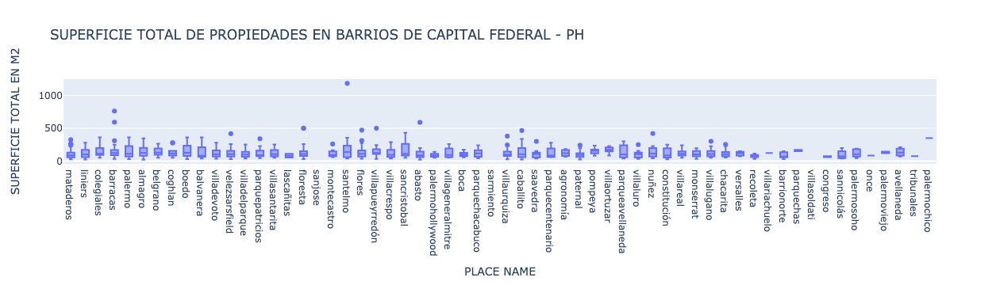

In [230]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='ph')],\
             y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - PH')
fig.show()

In [231]:
df_ph = df[df['TIPO DE PROPIEDAD']=='ph']

### Mataderos - PH

In [232]:
otl_mataderos=df_ph[df_ph['PLACE NAME']=='mataderos'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:5]
otl_mataderos[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
419,326.000,245000.000,hermosacasaenventaenmataderos,"espectacularphalfrenteenplantabaja,ubicadoenlazonademataderossobrelotede10mx35mtipocasaconentradaindependientesinexpensas!jardinalfondoconmicro-climaypiscinariñon100%luminosoequipamiento:3habitacionesexcelentelivingdiariogarajeconportonde2,40mx3m(capacidadparadosautos)quinchoconparrillalavaderojardindeinviernoexcelentesdetallesdecategoría:*revestimientoenmadera*frentedeladrillosalavista*ambientesamplios*todaslasventanasequipadasconrejasespectacular,paranodejardever!"
57168,260.000,290000.000,phmataderosexcelenteoportunidadpara2familias,"oportunidadpara2familiaspropiedadconjuntayalaveztotalmenteseparadaseindependientes,sevendenjuntasoenformaseparadaenpbundepartamentode3ambientes,dosdormitorios,livingcomedor,cocinaindependiente,patioconlavaderoyfondolibrepropioenpadepartamentomuycómodo1erpiso,balcónalfrentedetodoelancholote,con2dormenprimerpiso,baño,cocinacomedordiario,salidaabalcónterrazadelfondo,conlavadero,yescaleraqueconectacondptoenplantasuperioren2daplantaundormitorioconbañoyluegounespaciotipoplayroom-quinchooelusoquesequieradestinar,conparrillacerrada,barraventanaconpuertabalcónhaciagranbalcón,hayunhornodebarroallítodoenbuenestadogeneralyfuncionando"
21579,260.000,130000.000,phalfondo7ambientes-mataderos-guamini2400,6habitacionescocina2bañosterrazac/preparadoparaconstruirrecicladoanuevo
19407,260.000,180000.000,ph7ambconfondo,"phen2plantasconfondoyparrilla,7ambientes,3baos,comedor,lavaderoyampliacocinacomedorde40m2,fondode110m2y2baulerasy/otaller,excelenteubicaciona3cuadrasdeavevaperony5deavdirectoriopublicadoporsoaynosatravesinmomap"
13963,250.000,200000.000,"excelente5ambientescongge,3baños,patio,terraza,quincho,200m2cubiertos","excelente5ambientescongge,3baños,cocinacomedor,jardin,patio,terraza,quincho,200m2cubiertosavisopublicadoporpixelinmobiliario(serviciodepáginaswebparainmobiliarias)"


In [233]:
# Con el primer valor, no queda claro si es un ph o una casa, vamos a dropearlo
df = df.drop(otl_mataderos.index[:1])


### Barracas - PH

In [234]:
otl_barracas=df_ph[df_ph['PLACE NAME']=='barracas'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_barracas[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
45586,762.000,1250000.000,phenventa,"son11departamentos/estudiosenblock¡¡todosalquiladosconexcelentesgarantiayrentas!!!tienenelplanodesubdivisionaprobadoporlamunicipalidadperonoloinscribieronenelregistrodelapropiedaddeinmuebleparapagarmenosabl)solofaltariahacerelreglamentodecopropiedadeinscribirloson6dptosde2ambconterrazayparrilla,1dptode3amb,4dptosde2ambsinterraza,(unodeellosenprimerpisoporescalera)son530m2cubiertos+72m2depatios+160m2deterrazalotede815x5055--mosquerapropiedades"
17095,593.000,350000.000,phde6ambientesconterrazayentradaindependiente,"phde6ambientesconterrazayentradaindependienteenplantaalta,alfrentecon261m2cubiertosy332m2descubiertosorientaciónesteynorte,solyluzhall,estar-comedor,5dormitorios(2conbañoconbañeraensuite),toilette,2cocinas,lavadero,galeríasysótanotechosdedoblealtura,pisosdepinoteaydetallesconstructivosoriginales"
3432,310.000,250000.000,ph4ambientescondependencia2patiosyterraza,"hermosophconentradaindependiente2patios2terrazasparrilla,cocinaysanitariosaterminarmuyluminoso"


In [235]:
# Los 2 ph mas grandes, son casos muy particulares, vamos a dropearlos, ya que es poco usual un inmueble de esas caracteristicas.

df = df.drop(otl_barracas.index[:2])

### Coghlan - PH

In [236]:
otl_coghlan=df_ph[df_ph['PLACE NAME']=='coghlan'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:2]
otl_coghlan[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
55568,280.000,319000.000,ph-coghlan,"phalfrenteenpbsinexpensas,entradaindependiente,cocherapropiacubierta,granterraza+patioanivel,cocinaconampliocomedor,livingcomedorconpisosdeparquet,dosampliosdormitoriosconimpotantesplacares+dependenciaenelcircuitodellosdormitoriosquepuedeseruntercerdormitorio(2placres)gransotanoquepuedeserunplayroom,dobleentradalosdatos,medidasydemáscircunstanciassonmeramenteorientativosyestánsujetosarevisióny/overificaciónelpreciodelinmueblepuedesermodificadosinprevioaviso"
15589,276.000,350000.000,phenventa,"importantephapulmóndemanzanaalnoroeste,conunacocheradobledosbaulerasyterrazas1ºplanta:halldeentrada,granlivingcomedoraterraza,toilette,cocina,comedordiario,lavadero,despensa2ºplanta:4dormitorios(1ensuite),2bañoscompletosterraza3ºplanta:azoteaydependenciadeservicio--feracancellieripropiedades"


### Velez Sardfield - PH

In [237]:
otl_velezsardfield=df_ph[df_ph['PLACE NAME']=='velezsarsfield'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:2]
otl_velezsardfield[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
82575,417.000,365000.000,phenvelezsarsfield,"elinmuebleesunaphdetresunidadesfuncionaleslaufnº1seubicaenplantabajaytieneaccesoindividualporelnºdepuerta4855cedeservidumbredepasoafavordelasufnº2y3paralaatenciónymantenimientodeltanquedebombayelectrobombaporelnº4857,seaccedealasunidadesnº2(“a”)ynº3(“b”)deplantaaltalastresufhacenusodeunespacioguardacochesalfrentedelinmueble,concapacidadparatrescocheslapropiedadconstadecocina-livingde3,5mx8,5m,habitaciónde3,5mx3,5m,lavaderode1,5mx2,2m,ante-bañode1mx2m,bañoconbañerade2mx2m,habitaciónde5mx5m,livingde3mx3m,alfondounpatioconjardínyunahabitaciónalfinaldelmismode3mx3mtodoseencuentraenbuenestadodeusoyconservación,evidenciándosehumedadenelcentrodelacocina-livingyenelpasilloquedaalpatioposeeunasuperficietotal,segúntítulo,de417,05m2,porcentual42enteros59centésimos,quesecomponedesuperficiecubierta133,51m2,superficiesemicubierta26,15m2ysuperficiedescubierta257,39m2seguinosenfacebook:inmobiliariagustavodallenogareóhttps://(copiáypegáellink)rematejudicial"
27953,260.000,300000.000,redesanmartin4527vélezsphpb4ambu$300000aptoprof,"ultimopreciou$300000oportunidad,con70m2deparqueaptoprofesionalhermosophmuyluminosode4ambientes,alcontrafrentesinexpensasorientaciónnortesuperficietotalde260m²,cubiertade170m²ydescubiertade90m²3dormitoriosy2baños,unocompletoyuntoilettepisosdeparquetantigüedad12añosbauleradetallesdecategoríasólo2unidadesenellote,entradaindependiente2plantaspb:salaconjardíndeinvierno,cocinaintegrada,living-comedor,toilette,salidaaljardínde70m²(opcióndehacerpiscina)pa:2dormitoriosconplacardconvistaaljardín,bañocompletoyotrodormitorioamplio(posibilidaddeagregarun4ºdormitoriooagregarunbañoensuite),conplacard,ysalidaabalcón-terrazade20m²colectivos:25,34,47,85,99,106,107,114,166,172,181ventasujetaalaobtencióndelcotiporpartedelpropietariolasreservassetomanexclusivamenteenlainmobiliariaconelmatriculado-matriculacpi6099"


In [238]:
# Vamos a dropear este caso particular de ph enorme para lo que es la zona y los valores promedio de m2 de ph.
df = df.drop(otl_velezsardfield.index[:1])


### Parque Patricios - PH

In [239]:
otl_parquepatricios=df_ph[df_ph['PLACE NAME']=='parquepatricios'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:2]
otl_parquepatricios[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
26192,340.000,176000.000,ideal2familiasretasadaoportunidadnoselopierdaaptocreditoentradaindependiente1piso,"oportunidad,noselopierda,propiedadubicadaenbariiocomercialametrosdelsubtehymetrobusdepompeyaposee4d9rmitorios,todosalfrente,conbalcon,cocinainstalada,baulera,lavaderocubierto,livingcomedoryestarpatioyterrazaenesquinamuyluminosaexcelenteparaoficinaotallerescuchoofertasaptocreditonoselopierda,avisopublicadoporpixelinmobiliario(serviciodepáginaswebparainmobiliarias)"
35119,230.000,NaN,"venta-ph4amb,c/cochera,patioyterraza-pquepatricios","codigo:1717-522ubicadoen:cátulocastillo2300-publicadopor:saenzgroupelprecioesdeusd1nullventa-phtipocasac/entradaindependiente,de4amblapropiedadcuentacon3dormitorios,cocina,living-comedor,bañocompletomástoilette,cocheracubierta,patioyterrazac/quinchoa1cuadradeavbrasilcercaníaconmetrobuspublicadoatravésdemapaprop"


In [240]:
# Vamos a dropear este caso particular de ph enorme para lo que es la zona y los valores promedio de m2 de ph.

df=df.drop(otl_parquepatricios.index[:1])

### Floresta - PH

In [241]:
otl_floresta=df_ph[df_ph['PLACE NAME']=='floresta'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_floresta[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
30214,500.000,280000.000,floresta-oportunidad-edificio-hotelen2plantascon12,"edificio-hotelen2plantascon12departamentosconbaoycocina,c/uopcionconrentasincontrato$25000enelradiodelapropiedad,haynumerososcentrosdeenseanzadediversosniveles,centrosdesalud,buenaacividadcomercialyvehicular,supermercados,comisariacercana,hospitales,altaconcentracinhumanayvehicular,pmes,cercanoavenidadirectorio,numerosareddemicrosycolectivoshaciadistintospuntosdelaciudadydelconurbano,serviciosaguacorrientedesagecloacalgasnaturalluzpavimentocaractersticasgeneralescantidadplantas(2)estadodelinmueble(regular)frentedelterreno(mts)(766)largodelterreno(mts)(20)luminosidad(luminoso)orientacin(n)cantidadplantas(2)estadodelinmueble(regular)frentedelterreno(mts)(766)largodelterreno(mts)(20)luminosidad(luminoso)orientacin(n)consultar:movil:11-5-938-1273mvil:11-5-1047563lneafija44323514,mail:publicadoporcarlosalbertonoucheatravesinmomap"
31537,500.000,280000.000,"floresta-oportunidad-edificio-hotelen2plantascon12departamentosconbañoycocinacadaunoopcionconrentasincontrato$25000,","codigo:07ubicadoen:josebonifacio3100,caba,-publicadopor:carlosalbertonouche,elprecioesdeusd280000nulledificio-hotelen2plantascon12departamentosconbañoycocina,c/uopcionconrentasincontrato$25000enelradiodelapropiedad,haynumerososcentrosdeenseñanzadediversosniveles,centrosdesalud,buenaacividadcomercialyvehicular,supermercados,comisariacercana,hospitales,altaconcentraciònhumanayvehicular,pmes,cercanoavenidadirectorio,numerosareddemicrosycolectivoshaciadistintospuntosdelaciudadydelconurbano,serviciosaguacorrientedesagüecloacalgasnaturalluzpavimentocaracterísticasgeneralescantidadplantas(2)estadodelinmueble(regular)frentedelterreno(mts)(766)largodelterreno(mts)(20)luminosidad(luminoso)orientación(n)consultar:movil:11-5-938-1273mòvil:11-5-1047563lìneafija44323514,mail:publicadoatravésdemapaprop"
37984,260.000,280000.000,phenventa,operacion:ventatipodepropiedad:phambientes:6localidad:capitalfederalbarrio:floresta--theunionpropiedades


In [242]:
# Vamos a dropear los 2 valores, que son duplicados y refieren a un hotel.

df=df.drop(otl_floresta.index[:2])

### Montecastro - PH

In [243]:
otl_montecastro=df_ph[df_ph['PLACE NAME']=='montecastro'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:2]
otl_montecastro[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
16504,260.000,230000.000,phenventa,"ventadephpisounico4ambientesenmontecastro,capitalfederalplantabaja:accesoagarajeprimerpiso:living�comedorc/pisodecementoalisado;cocinaseparadaconbarradesayunadora;1bañoscompleto;dormitorioprincipalensuiteydossecundariosconpisosdeplacasdemaderas(pisosdeincienso)yplacard;patioconpisodedecksegundopisoterrazac/quinchoyparrillarecicladofaltareciclargaraje,comoasitambieneltercerdormitorioydetallesderevestimientosengeneral--difinipropiedades"
23958,165.000,214900.000,excelentephmontecastroc/terraza,"excelentephtipocasamuybuenaubicacion,aunacuadradeaválvarezjonteylopedevegasinexpensasestadoimpecable,todoalfrente2dormitoriosensuite,escritorio,amplioplayroom,bañoconhidromasaje,livingcomedor,cocinacomedor,lavaderoindependiente,yampliaterrazaluminosapropiedad,realizadaconmaterialesdeprimeracalidaddesarrolladoen3plantas1erplanta:ampliolivingcondobleventanalalfrenteycontrafrente,aireacondicionadosplitfríocalorpisomaderaentarugadococinacomedorcompletaconmueblesbajoysobremesadaconbodegayspar,cocinaaceroinoxidablelongvieyventanaldevidriorepartidopisoscerámicosdormitorioensemisuiteconplacaresdoblesconbaulera,ventanalalfrente,bañocompletoconbañeraconhidromasajeypisodemaderaentarugado2daplanta:desdeellivingseaccedemedianteunapintorescaescalerarevestidaenmaderaviraroapasillodedistribuciónconventanalypuertaventanadevidriorepartido:dormitorioensuiteconbañocompletoconbañera,pisosmaderaentarugadoventanal,amplioplacardconbaulerayaireacondicionadosplitfríocalorampliaterrazaalfrentecuartodelavaderoindependienteconsectordeplanchadoporescaleraexteriorhaciala3planta:(posibilidaddeintegrarlaescaleraalinteriordelacasa)playroomcondobleventanaldevidriorepartido(posibilidadde3dormitorio)yseparadounescritorioconhermososventanalesaireacondicionadosplitfríocalorcotientrámitemarceloschenkercucicbamatn°6415"


In [244]:
# Vamos a dropear este ph, ya que se trata de un caso particular

df=df.drop(otl_montecastro.index[:1])

### Flores - PH

In [245]:
otl_flores=df_ph[df_ph['PLACE NAME']=='flores'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:4]
otl_flores[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
52904,471.000,280000.000,"ph6ambc/patio,terrazaycochera-","departamentotipophde6ambientesenelbarriodefloresampliolivingconpisodeparquet,comedorconpisosdecerámica,dormitoriosconpisosdepinoteayparquetroble,cocinacomedordiario,2baños,lavaderoensótano,patio,parque,quinchoyterraza-medidas:superficiesótano:903m2plantabaja:33023m2planta1erpiso:6145m2ablcochera:$4183-ablph:$642-aysa:$573-losvaloresdeimpuestos,abl,expensas,etc,indicadosenesteavisoestánsujetosaverificacióny/orevisiónelpreciodelinmueblepuedesermodificadosinprevioavisotodainformaciónesasóloefectoorientativolasmedidasrealessurgirándeltítulodepropiedadrespectivo"
38008,313.000,315000.000,phenventa,"ventadeph4ambientesenflores,capitalfederalimpecableph+localde3dormitoriosconposibilidaddeconstruirenplantaalta(posee2terrazasyespacioaereo)seingresaporungarage,quetambienpuedeserunlocalalacalle,luegosepasaaunaampliagaleriaqueconectaalos3dormitorios,cocinaconcomedordiario,lavaderoybañocompletoposeeentradaindependienteespacioaereoquepermiteconstruirmasmetroscubiertoslaunidadseencuentraenbuenestadodeconservaciongeneralcuentacon2terrazaspropiasyunpatioconuncuartodeherramientasexcelenteoportunidad!sedejaconstanciaquelasmedidas,superficiesym2consignadossonaproximados,sujetosaverificacióny/oajusteelpreciodelinmueblepuedesermodificadosinprevioavisofotosdecarácternocontractualgoldsteinpropiedadessrlavdacorrientes4666buenosaires,argentina--goldsteinpropiedadessrl"
53506,275.000,395000.000,excelentephenflores3dormgranterrazaconquincho,"phenprimerpisoconescaleradetresdormitoriosmasquinchoexcelentephenprimerpisoporescaleraremodeladoanuevoenelaño2008enellímitedelosbarriosdevillacrespo,caballitoyelbarriodeflores,amediacuadradeplazairlandagranterrazaconquinchodependenciadeserviciomuybiencomunicadoporavenidasytransportepúblicoapocascuadrasdelaavenidajuanbjustoydelaavenidaavellanedaparagentequebuscaunoasisenlaciudadconsultamosteestamosesperando!!elequipodeyespropiedades"
22401,272.000,285000.000,ph5ambientesalfrenteentradaindependienteconterrazaenventaflores,"directorioymembrillar:phpisoúnicodeestiloalfrenteconentradaindependientesinexpensasescalerademármoldecarrara,hallderecepción,livingcomedorconhogarysalidaabalcóncorrido4dormitoriospisosdeparquetypinoteabañocompletobañodeserviciococinacomedordiariolavaderoindependientehabitacióndeservicioenaltosgranterrazaconquinchoyparrilla272m2totales"


In [246]:
# Vamos a dropear este ph, ya que se trata de un caso particular

df=df.drop(otl_flores.index[:1])

### Villa Pueyrredon - PH

In [247]:
otl_pueyrredon=df_ph[df_ph['PLACE NAME']=='villapueyrredón'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:4]
otl_pueyrredon[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
7755,500.000,700000.000,"depto5amb+casa7amb,cocherapara6autos","setratadedospropiedadesenuna:-->-->entrandoporeledificiotenemosenlaplantabajaundepartamentode5ambconpatio,elmismoposeeampliohalldeentrada,bañocompleto,grancocinacomedor,2ampliosdormitoriosconplacardempotrado,un3erdormitorioensuitey4tahabitaciónoescritoriocontoilette,lavaderoydependenciadeservicio;-->-->alaotrapropiedadde7ambóposibilidaddeampliar,seingresademaneraindependiente,lamismaactualmenteestáadaptadacomosaladeestudioygrabacióndemúsica,seingresaporungaragepara6autos,enlaplantabajahay2ampliassalas+3habitaciones(actualmenteestudiosdeediciónygrabación),patiocuertoydescubierto,3baños(paradiscapacitados,damasycaballeros),quinchocubiertoconparrila,livingyterraza;ellivingdelaplantabajatieneunaescaleraquellevaalprimerpisodondeencontramosungrandepósito,cocina,comedor,cuartoconsalidaabalcón,bañocompletoy2habitacionesmuygrandeseldepartamentoylacasatienentodoslosserviciosdemaneraindependiente,porloquesepodríanalquilarporseparadotodoseencuentraenexcelenteestado,muyluminoso,amplio,aireado!!propiedadmuyinteresante,dignadevisitar!bajasexpensas:$5000aproximadamenteporambaspropiedades-"
80434,244.000,450000.000,cochera-jardin-quincho-parrilla-impecable,"excelentepropiedadenimportantecomplejo,amtsdeavsmdelcarril,nazca,constituyentes,avdelosincas,impecablepb:entradacocheradescubiertayentradaprincipal,living-comedorde7x4ytoilette,cocinaycomedordiarioajardinesde4x2,50x4,50,lavaderocubiertode2,30x1,60,terrazade4x3yjardínde12x4,quinchocubiertoc/parrilla,mesadademármolybachade4x3,50pa:dormitorioprincipalensuitec/placardacallede3,50x3,2ºdormitorioc/placardacallede2,30x4ybalcónfrancés,3ºdormitoriocontrafrenteajardinesc/placardde3,50x4,dosbañoscompletos,2ºplanta:playroom,6,60x4x2,50,idealcuartodetv,gym,espaciomultiuso,todoenexcelenteestadodemantenimiento,pisosdemaderamacizatarugadayplastificada,cerámicaencocina,bañosyplayroom,calderaindividualporradiadores,termotanque,hidroneumático,excelentesdetalles,listaparaocuparcentraldealarmasconmonitoreoyantipanicoporreflectoresysirenascentralizadocucicbamatnº419"
3457,201.000,291000.000,villapueyrredon-ph2dorm+escrit-excelenteestado-s/expensas,"phenprimerpisoporescalera-excelenteestadorecicladoanuevohace7años-sinexpensascocinade3,50x1,60totalmenteequipadaconamoblamientoscompletosdeprimeracalidad,cocinadeaceroinoxidablepisodecementode3,50x3,20pisoentablonadolivingde4,00x3,40pisoentablonadopasillodedistribucionde5,80x1,00dormitorioprincipalde3,20x4,30convestidor,pisoentablonadoya/asplitdormitoriode3,40x3conplacardpisoentablonadoya/asplitescritoriode1,50x2,20pisoentablonadobaño1de1,50x3,20completobaño2de1,40x2,70completotoiletede1,00x2,00granbalconterrazade8,40x5,80conparrillaterrazade8,60x8,40lavaderode3,60x1,40recicladoanuevohace7añosincluyendoinstelectricaycañeriassupcubierta=80m2supdescub=120m2nopagaexpensaslasmedidas,superficiesyexpensasconsignadasenlapresentesonaproximadasynoresultanvinculanteslosdatosdefinitivossonlosquesurgendeltitulodepropiedadfrancisconigro15-likepropiedades"
70860,185.000,225000.000,ph-villapueyrredon,"espectacular3ambientes,masescritorio,dependenciadeservicioconbaño,patioyterrazadetodalasuperficieúnicoenel1ºpisoconentradaindependientedesarrolladoenunasolaplantacañeríasdegasyaguaanuevo,bombapresurizadora,cableadoactualizadotérmicaydiyuntorposibilidaddeampliaciónenlaterrazaexcelenteubicación,ametrosdeavsalvadormariadelcarrilconmúltipleslineasdecolectivoplanoenfotos1\tlasmedidasindicadassonaproximadasyalsoloefectoorientativo,lasmedidasrealessurgirándeltítulodepropiedadrespectivo2\tlaventadeesteinmuebleestásujetaalatramitacióndelcódigodetransferenciadeinmuebles(coti),deconformidadconlanormativavigente(resafip2371/08,2439/08yccs),porpartedelpropietario3\telpreciodelinmueblepuedesermodificadosinprevioaviso4\tfotosdecarácternocontractual5\telvalordelasexpensas,encasodetener,estásujetoaverificacióny/oajustes"


In [248]:
# Vamos a dropear este valor, ya que es un aglomerado de varios tipos de propiedades.

df=df.drop(otl_pueyrredon.index[:1])

### Abasto - PH

In [249]:
otl_abasto=df_ph[df_ph['PLACE NAME']=='abasto'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:4]
otl_abasto[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
63542,590.000,510000.000,ventacasade7ambientesenabasto,"importantephconentradaindependienteantiguo,recicladoanuevotechosaltosconmolduraspisosdepinoteagranvitreauxentechodelaúltimaplantaquesevisualizadesdelasplantasinferioresaptoprofesionalmuyluminosoescalerasinternasyexternasacadaplanta1erpiso:toilettederecepciónrecepciónde4x6livingde6x450cocinade4x4concomedordiarioyvistaalfrentepatioalcontrafrentede9x5502dopiso:suitealcontrafrentede550x4convestidorybañocompleto+escritoriode4x250ambosconvistaalpatiotraseroysalidaaterraza2dodormitoriode3x5alfrente3erdormitoriode4x350alfrente(ambosconunvestidorenmediodecadauno)2dobañocompleto3erpiso:quinchode7x450concocinayhogardeleñoscontirajepropioconsalidaaterrazade450x9depósitoobaulerade2x2gimnasiode350x7alfrenteconbañocompletoymuybuenespacioparacolocarsaunaojacuzzisótano:toilettemás1bañoconduchadormitorioensuiteconbañocompletode450x4conespacioparaarmarunvestidorplayroomosaladejuegosde850x5lavaderogranbauleraaguacalienteporcalderaindividualcalefacciónporradiadoresentodoslosambientes"
6335,200.000,254900.000,impecablephrecicladoenabasto,"sarmiento3200phenabastorecicladoanuevo!!excelenteprimerpisoporescalera,detallesoriginalesmuybienconservados,cincodormitoriosmuyampliosydependenciadeservicio,grancocinaabiertaacomedordiario,cuatrobaños,dosdeelloscompletosydosampliostoilttesmuchosdelosambientestienenaccesoaunpatiointerno,loqueledaalapropiedadunaexcelenteluznaturalgranbalconenelfrente,ypisosoriginalesdepinoteayceramicosidealparavivienda,residenciaparaestudiantesoestudiodedanzasoclasesdeteatrootallerdepinturavariaslineasdecolectivoscirculanporlacuadraserviciosindividualesexpensasmensuales$1600yabl$180"
3778,160.000,160000.000,phenventa,"4ambientesconpatioyterrazaalfrente,enventa,enabasto!!63m2cubiertos+97m2descubiertos(63m2cubiertos+13m2descubiertosporescritura)primerpisoporescalera,livingcomedor,3dormitoriosconpisosdeparquetysalidaalbalcóncorridode6x1,bañocompleto,cocinacompletaconsalidaalpatiode7m2yaccesoagranterrazade84m2concuartodeherramientascañeriasdegashechasanuevoytanquedeaguapropio!sucursalalmagro()sucursalvcrespo()dejaconstanciaquelosm2indicadossonaproximados,aligualquelasmedidasparcialesdelosambientes,yelvalorconsignadodeexpensasmensualesestásujetoaverificacióny/oajustes""fotosdecarácternocontractual--ebertolotti"
22038,141.000,129000.000,"phconterraza,sinexpensas","excelenteubicación,corazóndelabasto,(3cuadrasdelshopping)todoslosmediosdetransportebañorecienreciclado,luminoso,silenciosoingresoporescaleraterrazapropiaconparrilla,cocinagrande,habitaciónybañodeservicio,cómodosplacaresfinanciaciónendolaresporpartedelpropietariovisitalo!!!"


In [250]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_abasto.index[:1])

### Villa Urquiza - PH

In [251]:
otl_urquiza=df_ph[df_ph['PLACE NAME']=='villaurquiza'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:4]
otl_urquiza[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
53472,380.000,497000.000,granphenpb-villaurquiza,"parainversióndealtarentabilidadgranphenplantabaja--------------------------------------------------------------------------------------------------------------ventaenblockdeunconjuntonosubdividiblede8unidadesdentrodegrancasonaenph(hayotracasaarribaconentradaindependiente)nohayexpensastiene380m2(310cuby70mdepatios)enplantabajayhasidorecicladaen8apartcompletos,(4sonduplex)quecomparten3grandespatios,parrilla,muchasplantas,solyluzinmejorableubicación:ametrosdelcorredorverdededonado,delcbcuba-dragoydeavsmonroeycongreso,cercaníaaestacionestrenysubte,numerosaslíneasdecolectivosyvíasrápidasentodasdireccionesadmitiríaotrosdestinosperotalcualestáesespecialmenteadecuadaparaelalojamientotemporariodeuniversitariosrentabilidadmínimaestimada7,5%tendríafácilseparaciónenviviendapropiayotras4obien5unidadespararentasevendeporfinalizacióndelasucesión"
14477,245.000,240000.000,ventaph/casa/cochera/local/vurquiza/reciclar,"corredorresponsable:unobienesraicessrl-cucicba4993contacto:marianobentivenga-mlsid#420491028-146setratadeunphtipocasaenplatabaja,concoheraylocalalfrenteasolo15mtrsdeavdelosincasy100mtrsdeavtriunviratocercanoatodaslaslineasdecolectivosysubteseingresaporellocalquecuentaconuntoiletederecepiónhaciaelfondo3dormitorios(medidas:4x4mtrs-4x36mtrs-35x250mtrs)ingresandoporcochera,seaccedeaunsalónde11x4mtrs,conunacocina(antiguamentepatiodescubierto),siguiendoencontramosunpatioconbañoyporultimoalfondounsalónde11x8mtrslapropiedadcuentacon245m2totalesgranespacioparahacermodificaciónyrefaccionesagustoidealparainversiónconrentahastaelmesdemayode2017de$25000mensualesaptoprofesonal-vivendafamiliar-consultoriosmedicos"
4849,236.000,270000.000,phenventa,"ventadepartamentotipoph4ambientesvillaurquizaphconentradaindependientede236m2condependencia,terraza,galeríayjardínpropioconstadeliving-comedor,3ampliosdormitorios,cocinaindependientedecómodasdimensionesconalacenaymueblesbajomesadaleporepropiedadesleporepropiedadessacuit:33-60234274-9cucicbamatrículanº931(sucursalescaballito-palermo-centro)avisolegal:lasdescripcionesarquitectónicasyfuncionales,valoresdeexpensas,impuestosyservicios,fotosymedidasdeesteinmueblesonaproximadoslosdatosfueronproporcionadosporelpropietarioypuedennoestaractualizadosalahoradelavisualizacióndeesteavisoporlocualpuedenarrojarinexactitudesydiscordanciasconlasquesurgendeloslasfacturas,títulosyplanoslegalesdelinmuebleelinteresadodeberárealizarlasverificacionesrespectivaspreviamentealarealizacióndecualquieroperación,requiriendoporsíosusprofesionaleslascopiasnecesariasdeladocumentaciónquecorrespondaventasupeditadaalcumplimientoporpartedelpropietariodelosrequisitosdelaresolucióngeneralnº2371delaafip(pedidodecoti)--leporepropiedades"
72637,230.000,275000.000,phenventavillaurquiza5ambientesgarajepatioterraza,"codigo:973-612337ubicadoen:valdenegro3273-publicadopor:m&cpropiedadeselprecioesdeusd275000nullvillaurquiza-valdenegroentretamborinieiberá-phdesarrolladoendosplantas,alfrenteconentradatotalmenteindependiente,cochera,livingcomedor,cocinacomedor3dormitorios(unosensuite)dependenciadeservicio,patio,terrazaparrilla-desde1988-lamejortasación,lamejorventa,siempreconm&cpropiedadespublicadoatravésdemapaprop"


In [252]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_urquiza[:1].index)

### Caballito - PH

In [253]:
otl_caballito=df_ph[df_ph['PLACE NAME']=='caballito'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:4]
otl_caballito[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
17249,466.000,300000.000,granphenprimerpisoconentradaindependiente,"granazoteaygarageolocalalacalleenplantabajaaptohoteleríaenelprimerpiso:alfrentehayunaampliasaladoble,apaisadaconsalidaabalcóncorrido,conuntoiletteorientandoalaireyluz:escritorioyunasegundagransaladoble,cocinarecientementerecicladahaciaelfondosesucedenotrastreshabitacionesyunbañocompletoenlaazotea:otrasdoshabitacionesyunbañogranterrazadescubiertade170m²enplantabaja:garageoposiblelocalalacalleensótano:salade5x4superficies(segúntítulo):sótano:21,70m²plantabaja:29,50m²-superpuestas:3,12primerpiso:195,32m²(cubierta:163,48m²;semicubierta:28,30m²ybalcón:3,54m²)azotea:216,68m²(cubierta:47,57m²ydescubierta:169,11m²)superficietotal:46632m²importante:elphcomparteconotras7unidades(todasellasenlaplantabaja)ungranlotede8,66x60estaunidadposeeel40,51%deldominio"
33533,336.000,590000.000,"imponnetephdeestiloconcocheradoble,terrazayquinchoemitreyhualfin","vermasimagenesen360gradosenhttps://googl/photos/erkd5knjerje8jns9importantepropiedadconstruídaenelaño1918,ubicadafrentealbarrioinglésametrosdeavenidapedrogoyenaconentradaindependienteconstade324m2distribuídosentresniveles:enpbespacioparatresautomóviles,halldedistribución,escritorioalacalle,livingcomedor,cocinatotalmenteequipadaconcomedordiarioyprofusióndemueblesdemuybuenacalidadlavaderoindependiente,dependenciadeservicioypatioen1erpiso,accediendoporunaimportanteescaleradeestilo,halladedistribución,3dormitoriosconplacards,pisosderobledeeslavonia,bañocompletosconbañeraehidromasajeseaccedeaterrazapropiadeimportantesdimensionesyunquinchocubiertoconparrillatotalmenteequipadoybañocomplementarioconentrepisodetallesdecategoríatotalmenterecicladaanuevohace15añosimpecableestadoconsultasvíawhatsapp15-"
84005,324.000,410000.000,phventa,"nicolásrepetto1600,espectaculartriplexapareadojardínconquinchoyparrilla200m2caballiton,ciudadautónomadebuenosairesincreíbletriplexphapareadoenelcorazóndecaballiton,sobrecalleresidencialnicolásrepettoatrescuadrasdehonoriopueyrredónsobreterrenode47mdeprofundidady866mdeanchotipologíadecasasenespejosobrefrentedelote866yentresnivelesretirodelíneadefrenteconespacioparacocheracubiertayaccesoengaleríaenplantadeacceso:hallderecepción,saladeestar,comedorytoilettederecepcióncocinacomedor,habitacióndeservicio,bañodeservicioylavaderoenplantaalta:suiteajardínconvestidor,dosdormitoriosalfrenteysegundobañocompletoenaltillo:espaciodebohardillacomoplayrromofamilyroomamplioyconventanalalfrenteconstrucciónestiloalpinomurosenladrillovisto,revoquepintado,techosdetejayestructurademaderaelinteriordestacaporsustechosinclinadosconelentablonadodemadera,correasycabiosvistosimpresionantecocinahaciajardínconmesadaenvolventeycómodoespacioparacomedordiariohabitacióndeservicioconbañodeservicioylavaderoenconexiónconterrenopropioespectacularterrenode28mtsdefondoparquizadoyconsenderodelosetasenelfinaldelterreno,inmensoquinchopara25personascongranparrillayventanalesaljardíncuartodeherramientasyalmacéndeguardadodejardineríaidealfamiliaparadisfrutardeunterrenoúnicoenlaciudad"
18432,320.000,332000.000,caballitoph5ambientesconbalconyterraza,"hermosophsobreavsanmartín,cercanoalcidcampeadoryaavjbjusto,coninnumerablesmediosdetransportedistribuidosen1ªpisoydosterrazassinexpensasseingresaporescaleraal1ºpiso:halldedistribucióncongranventanal,doblecirculacióndormitorioconventanaalfrente,livingcomedorconsalidaabalcón,2ºdormitorioy3ºdormitoriomuyampliosconsalidaagaleríalateral,2bañoscompletoshechosanuevo,cocinacompletaconcomedordiario,lavaderoenel2ºy3ºpisodosampliasterrazas,lavaderoycuartodeherramientastodalaunidadposeepisodepinotea,doblealturaexcelenteiluminaciónaptocréditohipotecariodignodesuccid,drnrepetto1447,/4582-nsultesedejaconstanciaquelasmedidas,superficiesym2consignadossonaproximadoselpreciodelinmueblepuedesermodificadosinprevioaviso,lasfotosdecarácternocontractual"


In [254]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_caballito[:1].index)

### Saavedra - PH

In [255]:
otl_saavedra=df_ph[df_ph['PLACE NAME']=='saavedra'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_saavedra[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
23413,300.000,470000.000,casade5ambientesconcochera,"excelentedúplexenexcelenteubicaciónplantabaja,cocheraparatresautos,lavadero,dependenciadeservicioconbaño,patioplantaprimeraamplioliving-comedor,toilette,ampliacocinacomedor,balcónalcontrafrenteplantasegundadormitorioprincipalensuiteconvestidor,2dormitorios,bañocompletoplantatercerabohardillaoplayroom,pequeñaterrazaplantaintermedialindofondoconpatioyjardin,parrillacalefacciónporestufasdetirobalanceadoentodoslosambienteshogaragasenlivingtodoslosservicios,tvporcable,internetsedejaconstanciaquelasmedidas(tantototalescomoparciales),superficies,m2yproporcionesindicadasenelpresentesonaproximadasysujetasaverificación,variacióny/oajustelasexpensaspuedensufrirvariacionesbienvendeameliaclaro"
22949,152.000,245000.000,phenventa,"ventadedepartamento4ambientesensaavedra,phalfrente,aptoprofesional,sinexpensas,entradaindividual,muyluminoso,pisosdeparquet,flotante,ceramicos,livingcomedor,3dormitorios,hall,bañocompleto,cocina,comedordiario,lavadero,balconsemicubierto,ampliaterrazapropiaconparrillaadicionales:aireacondicionado2,placaecosol,termotanque,llavestermicasoportunidad,excelentezonamuytranquila,cercadeaccesoscomopanamericana,gralpaz,etcdignodeversuconsultaesbienvenidarcmpropiedadesgustavorombola11hernánmartíncarbonecucicbamat5493--rcmpropiedades"
41148,143.000,169900.000,ventadedepartamentoensaavedra,"ph2pisoporescalerac/entradaindependientec/comedorlavaderoindependientepatio,terrazapropiamuyluminoso!!areciclar!!**nopagaexpensas**bienvendeameliaclaroavcabildo36884702-"


In [256]:
df.loc[otl_saavedra.index[:1],'TIPO DE PROPIEDAD']='duplex/triplex'

### Paternal - PH

In [257]:
otl_paternal=df_ph[df_ph['PLACE NAME']=='paternal'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_paternal[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
28504,242.000,350000.000,phenventa,"phde5ambientesenpaternal,capitalfederal-terrazayquinchococheraimportantephconentradaindependienteen2plantas,espaciopara2coches,livingcomedor,4dormitorios,5baños(2completos),terrazayquinchosupercieplantabajatotalporescritura:123,81,supercieplantaazoteatotal:11774=totalypropiadelaunidadde24155m2sedejaconstanciaquelosm2sonaproximados,aligualquelasmedidasparcialesdelosambientes,yelvalorconsignadodelasexpensasmensualesestasujetoaverificaciony/oajustes,elpreciodelinmueblepuedesermodificadosinprevioavisofotosdecaracternocontractuallasunidadespublicadasestansujetasadisponibilidadgoldsteinpropiedadessrlactuasolamenteencarácterdecomercializadoradelosinmueblesofrecidosgoldsteinpropiedadessrlavdacorrientes4666buenosaires,--goldsteinpropiedadessrl"
38477,195.000,290000.000,excelenteph5ambrecicladoanuevo-(1ºpxesc),"phde5amb-pisounicoconentradaindependiente,sinexpensas-todorecicladoanuevo-(1ºxescalera)m/b/estado-quinchoc/cerramientoparrilla,cocinaytoilette-granlinving-comedorenl,cocinacomedordiariointegradoalliving(artefactosmarcaaristonyjonshon),balconc/vistaalacalle,4dormitorios(1suite)todosconampliosplacares,4baños,escritorio-patioluminosolavaderoconinstalaciónparalavarropaspisosdeporcelanatoyparquetelinmueblecuentaconaireacondicionado/split,estufastirobalanceadoinmejorableubicación:amtsdeavjuanbjustoyestacióndemetrobusboyaca""dignodever"""
34253,189.000,150000.000,paysandú2200paternalph5ambu$150000,"phde5ambientesareciclar,alfrentesuperficietotalde189m²,cubiertade180m²ydescubiertade9m²2unidadesindependientesporescaleraunidad1ºpiso:ampliocomedor,balcóncorrido,bañocompleto,cocinaydosdormitoriosalfrente81m2cubiertos9m2descubiertosunidad2ºpiso:2dormitorioscocinapequeñabañoantiguaterrazasubdivididaytransformadaenlivingoquinchocontechodemaderayterrazasemi-cubiertacontoldorebatiblealfrente70m2cubiertosy20m2semi-cubiertoestasdosunidadesestánenunasolaescriturasinexpensaspisosdecerámicosantigüedad70años4unidadesenellotecolectivos:34,42,47,109,110,112,166ventasujetaalaobtencióndelcotiporpartedelpropietariolasreservassetomanexclusivamenteenlainmobiliariaconelmatriculado-matriculacpi6099"


In [258]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_paternal[:1].index)

### Villa Luro - PH

In [259]:
otl_luro=df_ph[df_ph['PLACE NAME']=='villaluro'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_luro[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
53161,250.000,285000.000,ph5ambientesvirgilioal300,"excelentephde6ambientesalfrenteconentradaindependientedesarrolladoen2plantasplantabajahalldeentradaampliolivingycomedorconpisostarugados,escritorioquepuedeserundormitorio,ampliacocinaconcomedordiarioymueblescompletoshermosopatioandaluzytoilettederecepcion,enlasegundaplanta4dormitoriosmuyampliosybañocompleto,dormitorioprincipalconsalidaabalconyenlaultimaplantahermosaterrazaygranquincho,todoenmuybuenestado,elphesidealparafamilianumerosa,excelenteestadoymuyluminosodetallesdecategoriaa2cuadrasdeavjuanbjusto1cuadradeavlopedevegay2cuadrasdeavrivadavia,salidasrapidasparacualquierpuntodelaciudadcercadevariosmediosdetransportes"
55921,157.000,215000.000,ph4ambentradaíndeppatioy2tzas,"phconentradaindependienteenventaenvillaluroencapitalfederalespectacularpropiedadrecicladahacesolamente1añoymedio,listaparamudarse!estáademásenunaexcelenteubicacióncercadevariostransportesydefácilaccesoaautopistalapropiedadsedistribuyeendosplantaspb:ingresoconentradaindependienteallivingcomedor,cocinaseparadaconcomedordiario,doshabitacionesampliasconplacardybañocompleto,tambiénhayunpatioconparrillaconespacioverde1p:habitaciónsuperampliaconplacard,otrobañocompleto,escritorio,lavaderocubiertoydosterrazassinexpensas!!!esunaexcelenteoportunidaddemudarteynotenerquehacerlenada!!verplano:plantabaja:https://googl/al1ts7plantaalta:https://googl/1le9kfvervideo:https://googl/tbyuqcverpublicación:https://googl/sli4bacifarelli|constructora-inmobiliariamn6199lunesaviernesde10a13y15a19|sábados10a13códigodelapropiedad:cph296267lasmedidassonaproximadasqueressabermassobrenosotros?miraestevideosobrenuestrafilosofíadetrabajo!https://googl/d6kvn8"
55912,157.000,215000.000,ph4ambientesconentradaindependienteterrazas,"phconentradaindependienteenventaenvillaluroencapitalfederalespectacularpropiedadrecicladahacesolamente1añoymedio,listaparamudarse!estáademásenunaexcelenteubicacióncercadevariostransportesydefácilaccesoaautopistalapropiedadsedistribuyeendosplantaspb:ingresoconentradaindependienteallivingcomedor,cocinaseparadaconcomedordiario,doshabitacionesampliasconplacardybañocompleto,tambiénhayunpatioconparrillaconespacioverde1p:habitaciónsuperampliaconplacard,otrobañocompleto,escritorio,lavaderocubiertoydosterrazassinexpensas!!!esunaexcelenteoportunidaddemudarteynotenerquehacerlenada!!verplano:plantabaja:https://googl/al1ts7plantaalta:https://googl/1le9kfvervideo:https://googl/tbyuqcverpublicación:https://googl/sli4bacifarelli|constructora-inmobiliariamn6199lunesaviernesde10a13y15a19|sábados10a13códigodelapropiedad:cph295258lasmedidassonaproximadasqueressabermassobrenosotros?miraestevideosobrenuestrafilosofíadetrabajo!https://googl/d6kvn8"


In [260]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_luro[:1].index)

### Nuñez - PH

In [261]:
otl_nunez=df_ph[df_ph['PLACE NAME']=='nuñez'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_nunez[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
34793,420.000,980000.000,phventa,"sevendeenblokcompleto8unidadesplantabajade2amby3ambientes,conterrazaarefaccionartodolasunidadesestanarefaccionarodemolerzonanuñezcuba4600cabapreciouss980000lote13x33defondoantiguedad50añosventaporoficinainmobiliaria"
34513,230.000,580000.000,ibera1800(excelenteyamplioph),"phalacalleconentradaindependiente,cocheraparatresautos,jardín,quinchoconparrilla,granterraza"
12357,200.000,260000.000,excelentephenlomejordenuñez,"nuñez:excelentephenesquina,aunacuadradecabildoseguridadenlacuadra,livingycomedor,star,cocina,cuatrodormitorios,dosbaños,estudio,taller,lavaderoindependiente,muchaluz,hermosaterrazade57m2conparrillaespacioaereode26m2"


In [262]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_nunez[:1].index)

### Villa Lugano - PH

In [263]:
otl_lugano=df_ph[df_ph['PLACE NAME']=='villalugano'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_lugano[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
29097,301.000,235000.000,phenventa,"villalugano:lote866x3469,superficie301m2,zonificacióne3,fot3,m2vendibles904,facilidadesdepago!!!!masinfomarcelamontegrandeestudioinmobiliariocarloscalvo3915tel:whatsapp:153---marcelamontegrandepropiedades"
47066,225.000,170000.000,phfte4ambmuybuenestadoyubicacion,"sevendephfrentetipocasaubicadoenlaciudadautónomadebuenosaires,desarrolladalapartehabitacionalporcompletoenlaplantabaja,estandoéstacompuestapor3dormitorios,cocina-comedor,ampliasaladeestar,bañoypatioconlavaderotambiénseencuentraunlocalalacallequepuedeserutilizadocomococheracabedestacarquetodalaplantaaltayaceunacómodaterrazamuybienubicadaa100mtsdelaplazasudamérica,avcruzya300mtsdelcentrocomercialdechilavertentradaindividualnotieneespacioscomunes,porendenopagaexpensasinmobiliariapennacchio///avvelezsarsfield1157,cdad"
25566,170.000,210000.000,ventade3deptosde2y3ambientesphenblockvillalugano,"excelenteoportunidadidealinversorpararenta,son3unidadesenphsinexpensasenplantabaja2ambalfrenteconpatioy3ambalcontrafrenteconpatioyfondolibreenplantaalta3ambconbconterrazaypatioconsultenos"


In [264]:
# Vamos a dropear este valor, ya que es un lote

df = df.drop(otl_lugano[:1].index)

### Chacarita - PH

In [265]:
otl_chacarita=df_ph[df_ph['PLACE NAME']=='chacarita'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_chacarita[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
82950,254.000,390000.000,ph-chacarita,"bellisimophalfrente,4ambientes+garageoconsultorio,aptoprofesional,entradaindependienteporelfrenteydeservicio;elphfueconstruidoendoblealturalacualledaunagranluminosidadentodoslosambientes,conmaterialesdeprimeracalidadysuestadoesimpecablemetrostotales255m2,cubiertos189m2plantabaja:living+comedor,cocinacongrandespensa,toillete,cochera,consultorioprimerpiso:tresdormitoriosunoensuiteconvestidorconexcelentevistaymuybuenasdimensiones,masotrobañosegundopiso:lavadero,habitacióndeserviciooplayroomconbañoysalidaaunaespectacularterrazaconparrillaexcelentezonacercadelsubtebimperdible!!!!-avisopublicadoporsumaprop|gestióninmobiliariasimple"
22914,230.000,347000.000,phenventa,"ventadeph4ambconterrazarecicladoanuevo1erpisoporescaleraconentradaindependienteyterrazapropiacañosdeluz,aguaygasanuevoaberturasenmaderaoriginalesrestaurados,pisosdepinoteaanuevos,graníticosycalcáreosengalería;escalerayentradaenmármol,techosdebovedilla,vitreauxenvestíbuloyampliaterrazaaptocrételéfono:47727333--nexopropiedades"
17901,140.000,188000.000,phaggiornado3ambientespatioyquincho,"livingcomedor,2dormitorios,patio,quinchoen2dopisoinstalacionessanitariasejecutadasanuevohace10años120m2excelenteestadoasemprogpsresponsablegracielameza"


### San Telmo - PH

In [266]:
otl_santelmo=df_ph[df_ph['PLACE NAME']=='santelmo'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:1]

otl_santelmo[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
80400,1183.000,1290000.000,libertad1200,"inmuebleconstruidoenph,actualmenteutilizadocomohostel(hi),sedesarrollaentresplantas+subsueloparedesdeladrilloalavistayestructurasdehierrolasplantasbalconeanaunpintorescopatiocentralterrazapropiaconsolariumeledificiocuentaconascensor-elestadodeconservaciónesbuenototaldedormitoriosdoce(12)totaldebaños(14)estar(10)actualmenteenusootrossectoresrecepción,patio,cocina,terrazaconsolariumsuperficiesegúnplanomunicipal:(exp12105/98)superficieterreno:456,42m2(15,21mx30,11m)-superficieexistente:1183,21m2superficieaconstruir211,65m2||medidas-fondo:3011m2-frente:1521m2"


Es un caso muy particular, donde el inmueble es un hostel de muy grandes dimensiones.

In [267]:
df = df.drop(otl_santelmo.index)

In [268]:
df_ph_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='ph')]
df_ph_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,115.000,968.000,149.000,1409.000,1077.000,1035.000,1485.000,1484.000
mean,2.304,3.610,916.584,88.268,122.690,1665.642,185295.960,184410.748
std,2.340,1.329,836.185,52.149,70.680,575.165,101979.017,98752.885
min,1.000,1.000,1.000,1.000,22.000,151.371,45000.000,15591.260
25%,1.000,3.000,300.000,54.000,70.000,1222.876,120000.000,120000.000
50%,1.000,3.000,600.000,76.000,105.000,1611.842,159000.000,159000.000
75%,3.000,4.000,1400.000,110.000,160.000,2044.786,225000.000,225000.000
max,16.000,12.000,4600.000,373.000,430.000,3630.435,1185000.000,995000.000


In [269]:
muchos_pisos_ph = df_ph_caba[df_ph_caba.floor > 6].index
df_ph_caba.sort_values('floor', ascending=False)[:10]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
27599,sell,ph,palermo,|argentina|capitalfederal|palermo|,argentina,capitalfederal,3430234.000,"-34588935,-58432096",-34.589,-58.432,165000.000,usd,2911342.500,165000.000,NaN,20.000,NaN,8250.000,16.000,3.000,NaN,http://wwwproperaticomar/18j9k_venta_ph_palermo_patio_terraza_aire-acondicionado_re-max-parque,"corredorresponsable:hernanperrone-cucicba2792contacto:patriciaspoliansky-mlsid#151149-17phenventaenpalermode2ambyel3ºseriaelpatiocubierto2ampliosambientes,elcuartoprincipaltieneentradadirectaalbaño,tambiensepuedeaccederalmismo,desdeelpatioelmismoestacubiertoconuntechodemaderapequeñaterrazasobresuperficiedelacocinayelbañotienecocinacompleta,mueblesobreybajomesada,calefonestufaaireacondicionadotodoenbuenestadonopagaexpensas!!!setratadeuncomplejodephsconentradaypasillosmuycuidadosa2cuadrasdecordobaygazconcercadelcentrocomercialdeavcordobacolectivos:26,36,39,92,99,106,109,128,140,151,160,168teinvitoaconocerlo!","phenpalermo,sinexpensas!!!",https://thumbs4properaticom/8/soxj2fxpbp5fokw7nywo_kj4ysy=/trim/198x0/smart/filters:strip_icc()/remaxcomar/userimages/42/l_e3616d8551fc4b36b5034ab9ed7c1068_ilistjpg,palermo,20.000,NaN,NaN,165000.000,usd,165000.000,ph
32801,sell,ph,caballito,|argentina|capitalfederal|caballito|,argentina,capitalfederal,3435874.000,"-34629006,-58431408",-34.629,-58.431,130000.000,usd,2293785.000,130000.000,NaN,44.000,NaN,2954.545,14.000,4.000,NaN,http://wwwproperaticomar/190iu_venta_ph_caballito_lavadero_patio_luminoso_placard_subte-linea-e_re-max-ra-iacute-ces,"corredorresponsable:juancarlostreco-cucicba4037contacto:lilianaperez-mlsid#420221005-299excelentephenplantabajalaunidadconstadetres/cuatroambientesconpatiotechadoylavaderoindependienteseingresaalapropiedadporampliopasillocomúndondeconvergentodaslasunidadesestedepartamento/ph,seencuentraenelsectormediodeestelargopasillocomunpatiocerradocontechodepolicarbonatoconorientaciónnorte,loquelebrindaluznaturalpermanenteatodoslocambienteslos3dormitoriosohabitacinesdeestaunidad,tienensalidaalpatiomencionado,concelosiasdehierro,ypuertasventanasdepisoatechoconvidriosrepartidosseconservoladoblealturadelostechos,locualhacequelosambientesenveranoseanmuyfrescoshayunsoloymuyamplioplacardenunodelosambientes,bañocompletoconbañera,revestimientodeceramicasenpisotparedes,yventanadeventilaciónnaturalhaciaelsegundopatiolavaderoenestecasococinacompletaconcocinaagas,ampliamesadadegranito,mueblesenmaderalustradabajomesada,revestimientoceramicodecalidad,pisoceramicosegundopatioalqueseaccededesdeunadelashabitaciones,queenestecasoseutilizacomolavadero,dondeseencuentrainstaladouncalefondemuybuenacalidad,ylasinstalacionesdellavarropasestanperfectamenteadecuadas,conuncerramientoparaconservarenbuenestadomuybajasexpensastansolo$800totaldeunidadesenplantabaja22elcomplejotienedosingresosindivudualesparaplantabajayprimerpiso",excelentephenpbaptocredito-aptoprofesional,https://thumbs4properaticom/6/mw7adxyoq8ihneop9ar8noujikk=/trim/198x0/smart/filters:strip_icc()/remaxcomar/userimages/42/l_26c76770dbe44c28af7f2382c97a7064_ilistjpg,caballito,44.000,NaN,NaN,130000.000,usd,130000.000,ph
16618,sell,ph,almagro,|argentina|capitalfederal|almagro|,argentina,capitalfederal,3436397.000,"-34600779,-58415586",-34.601,-58.416,163000.000,usd,2876053.500,163000.000,NaN,20.000,NaN,8150.000,9.000,4.000,NaN,http://wwwproperaticomar/17h14_venta_ph_almagro_luminoso_subte-linea-b_re-max-ayres-ii,"corredorresponsable:danielacosta-cucicba2406contacto:perlachervin-mlsid#420151005-279antiguophenventade4ambientes,baño,cocina,galería,totalmentereciclado,enprimerpisoporescalerason85mtstotales,delos

In [270]:
#Vamos a dropear los ph que tienen valores raros de cantidad de pisos, y poner un maximo de hasta 6 pisos

df = df.drop(muchos_pisos_ph)

In [271]:
# Vamos a tomar como parametro el quantile 20, como minimo de superficie cubierta.

q2=df_ph_caba['SUPERFICIE CUBIERTA EN M2'].quantile(.2)

superficie_cubierta_mal_ph = df[df['SUPERFICIE CUBIERTA EN M2'] < q2].index

df = df.drop(superficie_cubierta_mal_ph)

In [272]:
# Vamos a dropear todos los valores donde sup cub sea superior a sup total

superficie_total_mal_ph = df_ph_caba[df_ph_caba['SUPERFICIE CUBIERTA EN M2'] > df_ph_caba['SUPERFICIE TOTAL EN M2']].index

df = df.drop(superficie_total_mal_ph)

In [273]:
index_ph_precio_m2=df[np.logical_and(df['TIPO DE PROPIEDAD']=='ph',df['PRECIO USD POR M2']<500)].index

df_ph_caba.sort_values('PRECIO USD POR M2')[:10]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
79006,sell,ph,villacrespo,|argentina|capitalfederal|villacrespo|,argentina,capitalfederal,3427458.000,NaN,NaN,NaN,278000.000,ars,275099.980,15591.260,103.000,82.000,151.371,3390.244,NaN,NaN,400.000,http://wwwproperaticomar/1c6d3_venta_ph_villa-crespo_terraza_toilette_luminoso_zommer-negocios-inmobiliarios_gkc,"hermosoph,muybienubicadoyenexcelenteestado4ambientes,3dormitorios,1bañoy1toiletteterrazaconparrilamovibleexpensasde400$aproxqueincluyenaysaylimpiezaymantenimientodepartescomunesobservaciones:lassuperficiesymedidasexpresadassonaproximadasyseexponenalsóloefectoorientativoynosonvinculantes,lasdefinitivassurgirándelaescrituray/oplanosaprobadosdelapropiedadelmontodeexpensasreal,delreciboemitidoporlaadministracióndelconsorciodecopropietariosquerigeelinmueblelapresenteofertadeventaestácondicionadaalaobtencióndelcotiporpartedelpropietario(resolafip2371)",ph-villacrespo,https://thumbs4properaticom/3/5czgr8bsnoqlxerigik9v8ke6e4=/trim/198x0/smart/filters:strip_icc()/tbcns3-accelerateamazonawscom/pictures/71242867844895275300446140192513418363743852310607173136735056032365424922327jpg,villacrespo,82.000,103.000,151.371,278000.000,ars,15591.260,ph
56192,sell,ph,capitalfederal,|argentina|capitalfederal|,argentina,capitalfederal,3433955.000,"-346434315988,-584749152869",-34.643,-58.475,95000.000,usd,1676227.500,95000.000,211.000,88.000,450.237,1079.545,NaN,NaN,NaN,http://wwwproperaticomar/1aqzd_venta_ph_capital-federal_laguna_1000_lavadero_parrilla_patio_terraza_toilette_luminoso_cifarelli-constructora-inmobiliaria_gff,"phenventade3ambientescondospatiosyterrazapropiaenparqueavellanedapropiedadconentradaindependienterecicladaanuevosuperluminosa!!cuentaconampliolivingcomedor,concocinasemi-integrada,toilettederecepción,doshabitacionesconvistaalospatios,elsegundopatiotieneparrillalavaderoindependienteyterrazapropiadetodalapropiedadcubiertaconuncuartopequeñooportunidad!verplano:https://googl/es516svervideo:https://googl/uprlsyvernuestrapublicación:https://googl/cvnx4ucifarelli|constructora-inmobiliariamn6199lunesaviernesde10a13y15a19|sábados10a13códigodelapropiedad:cph334337lasmedidassonaproximadasqueressabermassobrenosotros?miraestevideosobrenuestrafilosofíadetrabajo!https://googl/d6kvn8",ph3ambientescon2patioyterrazapropia,https://thumbs4properaticom/6/qdonujmtvmi03lcikqrurdpn0wq=/trim/198x0/smart/filters:strip_icc()/tbcns3-accelerateamazonawscom/pictures/20721461987511202454118215559988842209078870714513860042191905332830281556941jpg,avellaneda,88.000,211.000,450.237,95000.000,usd,95000.000,ph
36727,sell,ph,almagro,|argentina|capitalfederal|almagro|,argentina,capitalfederal,3436397.000,"-346142052423,-584134833035",-34.614,-58.413,138000.000,usd,2434941.000,138000.000,295.000,153.000,467.797,901.961,NaN,4.000,NaN,http://wwwproperaticomar/19co6_venta_ph_almagro_moreno-3322_patio_luminoso_subte-linea-a_loria-inmobiliaria,"ventadedepartamento4ambientesenalmagro,capitalfederaldepartamentotipoph4ambientes-conentradaindependiente-elphestáensub-suelo:154m2aprox-areciclarporcompleto-estadomuymalo-noaptocrédito-idealprofesionales-con2baños-2dormitorios-ademáseldepartamentocuentaconunpatio(originalmente)queseencuentracubiertoactualmenteyseusacomogalpónde100m2aprox(elgalpónestáenmuybuenestado)-solamente3unidadesenelconsorcio-portítulosson197m2+elpatio-total290m2aprox-excelenteubicacióncercanoasubtea-avenidasrivadaviaybelgrano-lasmedidassonaefectoorientativo,lasrealessurgendeltítulocorrespondiente-loria/--loriainmobiliaria",phenventa,https://thumbs4properaticom/5/uhgiqd-zwlszjwbi94h_rzs5wlc=/trim/198x0/smart/filters:strip_ic

In [274]:
df.loc[index_ph_precio_m2[:1],'TIPO DE PROPIEDAD']='apartment'

Los precios de los ph por m2, inician en 500 usd/m2, vamos a dropear los precios inferiores

In [275]:
df = df.drop(index_ph_precio_m2)

## Deposito

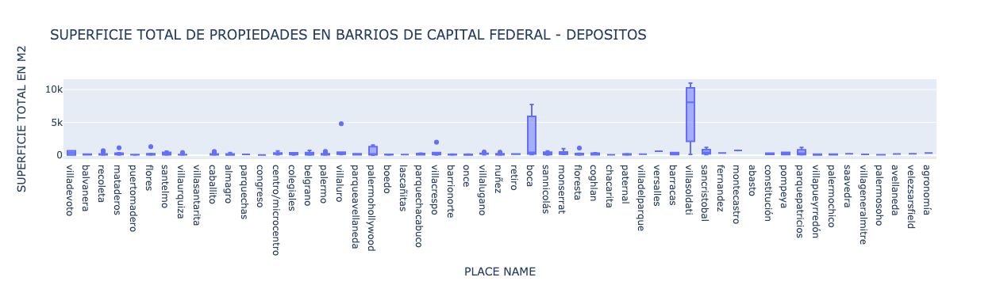

In [276]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='deposito')]\
             ,y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - DEPOSITOS')

fig.show()

In [277]:
df_deposito = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='deposito')]


In [278]:
otl_villaluro=df_deposito[df_deposito['PLACE NAME']=='villaluro'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]

otl_villaluro[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
48890,4800.000,4000000.000,plantaindustrialde3500m2salidaa3calles,"capitalfederal,villaluro-código0292plantaindustrialde4800m2cubiertos,sobrefraccióndeterrenoirregularde3825m2totales(5terrenos)consalidaa3callesgalpónparabólicode800m2(20mx40m)altura8m,otrosgalponesdelosaydechapaen3plantas,de5a6mdealturaestacionamientocubierto,variosvestuariosybañosarefaccionar,portóndeentradaparacontainers,másde1000m2deoficinasen3plantas,redhidrófuga,muybuenospisosaptosupermercadodeprimeralínea(nohayenlazona),depósitosuotrosrubrosubicadoametrosdeavjuanbjustoy100mdeautopistapmorenozonificación:r2bii,fot:1,2opciónventa"
16511,460.000,345000.000,phenventa,"ventadedepositoenvillaluro,capitalfederalsetratadeundeposito/localde310metroscuadradoscubiertosmas150descubiertoscuentaconunaentradaparavehículosyunaentradapeatonalunasuperficiede50metroscuadradosdeoficinay2bañosidealparasupermercadochino!!esunaunidadfuncionalubicadaenlaplantabaja(noeslotepropio)zonificacionr2b2setomapropiedadenpartedepago!!!contacto:diegoramos+-1878hernanmartincarbonematcucicba5493--rcmpropiedades"
21261,270.000,275000.000,"calderondelabarca300,casaenesquinarecjclar,venta",excelenteesquinacasaantiguaparareciclarodemoler!!!lotepropiode270m2totalmenteaprovechables!!!!zonagastronomicapornaturaleza!!!sepuedeconstruirlocalesymonoambientes!!!idealempresaconstructoraoparticular!!!valelapenaverloconmuchopotencial!!!avisopublicadoporpixelinmobiliario(serviciodepáginaswebparainmobiliarias)


In [279]:
# Es un caso particular de una planta industrial muy grande, voy a dropearlo.

df = df.drop(otl_villaluro[:1].index)

In [280]:
df_deposito_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='deposito')]
df_deposito_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,36.000,194.000,53.000,359.000,285.000,258.000,370.000,357.000
mean,4.889,3.603,3177.792,243.067,319.091,2281.050,537066.057,418878.530
std,3.336,1.916,3231.910,754.417,935.834,1631.967,1007351.183,739197.888
min,1.000,1.000,1.000,48.000,26.000,13.797,19900.000,7571.290
25%,3.000,3.000,1400.000,70.500,79.000,1280.193,165000.000,160000.000
50%,4.000,3.000,2300.000,112.000,145.000,2005.072,254500.000,245000.000
75%,6.000,4.000,3500.000,206.500,270.000,2889.821,489750.000,430000.000
max,16.000,18.000,19000.000,10958.000,10958.000,13698.630,8500000.000,8500000.000


In [281]:
superficie_cubierta_mal_deposito=df_deposito_caba[df_deposito_caba['SUPERFICIE CUBIERTA EN M2']>df_deposito_caba['SUPERFICIE TOTAL EN M2']].index

df = df.drop(superficie_cubierta_mal_deposito)

In [282]:
# Podemos observar que el valor minimo de superficie total, es inferior al de superficie cubierta, por los NaN Values, no porque hay un inmueble que tiene sup cubierta mayor a total

df_deposito_caba.sort_values('SUPERFICIE TOTAL EN M2')[:5][['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','title','PRECIO USD POR M2']]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,title,PRECIO USD POR M2
8959,NaN,26.000,departamentoenventa,3423.077
56847,NaN,37.000,avcabildo2800,2918.919
55773,NaN,40.000,departamento-mataderos,2100.000
54768,NaN,43.000,departamentoenventa,3604.651
34884,48.000,48.000,torreastor-beruti3300-pisoaltisimovistaabiertaterminadoyamoblado,6458.333


In [283]:
deposito_index =df_deposito_caba.sort_values('expenses')[:5][['expenses','SUPERFICIE TOTAL EN M2','title','PRECIO USD POR M2']].index

df_deposito_caba.sort_values('expenses')[:5][['expenses','SUPERFICIE TOTAL EN M2','title','PRECIO USD POR M2']]

,expenses,SUPERFICIE TOTAL EN M2,title,PRECIO USD POR M2
51636,1.000,10958.000,excelentenaveindustrialde10960m2sobreterrenode18151m2,775.689
49470,1.000,7722.000,ventaconrentaespectaculardepósitopremium,1036.001
546,300.000,76.000,departamentoenventa,NaN
9141,400.000,135.000,phenventa,1481.481
60963,500.000,214.000,local-santelmo,981.308


Estos valores de expensas, son erroneos, vamos a imputarle np.NaN, para que no nos hagan ruido

In [284]:
df.loc[deposito_index[:2],'expenses']=np.NaN

In [285]:
deposito_index=df_deposito_caba.sort_values('PRECIO USD POR M2')[:5][['SUPERFICIE TOTAL EN M2','title','PRECIO USD POR M2','PRECIO USD']].index

df_deposito_caba.sort_values('PRECIO USD POR M2')[:5][['SUPERFICIE TOTAL EN M2','title','PRECIO USD POR M2','PRECIO USD']]

,SUPERFICIE TOTAL EN M2,title,PRECIO USD POR M2,PRECIO USD
49517,8053.000,naveindustrial-villasoldati,13.797,111111.000
21374,365.000,importantelocalensubsueloconentradaindependienteenalquiler,39.950,14581.750
84571,60.000,departamentoenventaenbalvanera3ambientes60m2–jujuy300,126.188,7571.290
19276,500.000,echeandia6600,500.000,250000.000
18834,208.000,casalotepropioaestrenar,528.846,110000.000


In [286]:
# Los primeros 3 indices, tienen valores muy bajos, segun simulaciones en ZonaProp

df = df.drop(deposito_index[:3])

In [287]:
deposito_index2=df_deposito_caba.sort_values('PRECIO USD', ascending = False)[:5]\
[['SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','title','PLACE NAME','PRECIO USD',"TIPO DE PROPIEDAD"]].index

df_deposito_caba.sort_values('PRECIO USD', ascending = False)[:5]\
[['SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','title','PLACE NAME','PRECIO USD',"TIPO DE PROPIEDAD"]]

,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,title,PLACE NAME,PRECIO USD,TIPO DE PROPIEDAD
51636,10958.000,10958.000,excelentenaveindustrialde10960m2sobreterrenode18151m2,villasoldati,8500000.000,deposito
49470,7722.000,7722.000,ventaconrentaespectaculardepósitopremium,boca,8000000.000,deposito
48933,NaN,4550.000,importanteedificiocomercial/industrialamtsdeavcorrientesyavpueyrredón,once,5000000.000,deposito
50078,1556.000,NaN,local-palermohollywood,palermohollywood,3500000.000,deposito
50087,1556.000,NaN,casa-palermohollywood,palermohollywood,3500000.000,deposito


In [288]:
# Son precios acordes segun zona prop, pero el 2do y el tercer index, son duplicados

df = df.drop(deposito_index2[1])

## Store

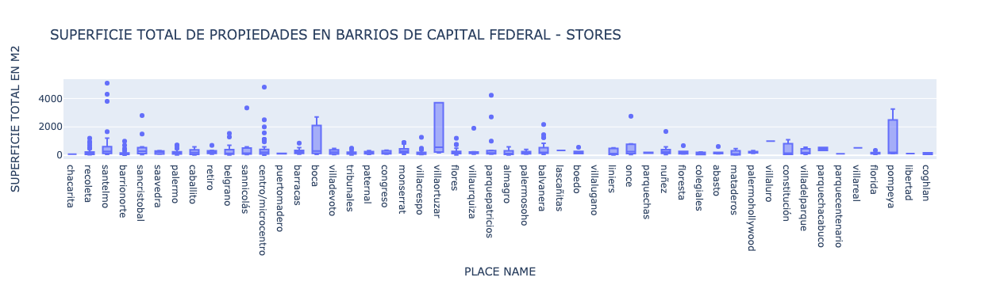

In [289]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')], y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - STORES')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q3(75) + 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [290]:
store_outliers = ['recoleta','santelmo', 'barrionorte','sancristobal','palermo','retiro','belgrano','sannicolás','centro/microcentro', 'barracas', 'tribunales',
                 'montserrat','villacrespo','flores','villaurquiza','parquepatricios','balvanera','boedo','once','nuñez','floresta','abasto','florida']

df_stores = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')]

for outliers in store_outliers:
    q1 = df_stores[df_stores['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.25)
    q3 = df_stores[df_stores['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_store_sup_max = df_stores[np.logical_and(df_stores['PLACE NAME']==outliers, df_stores['SUPERFICIE TOTAL EN M2'] > q3 + 1.5 * RIC)].index
    
    df = df.drop(index_outlier_store_sup_max)


In [291]:
df_stores_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')]
df_stores_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,1.000,21.000,119.000,555.000,596.000,515.000,591.000,588.000
mean,4.000,2.429,3487.790,247.582,226.577,2779.141,591510.393,507312.220
std,NaN,2.908,3613.697,397.610,315.693,2162.183,1181197.123,585588.549
min,4.000,1.000,1.000,48.000,12.000,96.696,25000.000,5608.360
25%,4.000,1.000,1000.000,89.000,84.000,1500.000,202500.000,203750.000
50%,4.000,1.000,2800.000,144.000,146.500,2229.299,350000.000,347500.000
75%,4.000,2.000,4900.000,258.000,260.000,3446.340,600000.000,600000.000
max,4.000,10.000,18069.000,3700.000,3700.000,22000.000,19267560.000,6500000.000


In [292]:
store_index_expenses=df_stores_caba.sort_values('expenses')[:20].index

df_stores_caba.sort_values('expenses')[['expenses','SUPERFICIE TOTAL EN M2','title','PRECIO USD POR M2','PRECIO USD']][:20]

# Ya que suponemos el valor de 1 es algo simbolico, vamos a imputarles nan a los 12 primeros valores de expenses

df.loc[store_index_expenses[:12],'expenses']=np.NaN

In [293]:
df_stores_caba.sort_values('SUPERFICIE TOTAL EN M2')[['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD']][:4]


,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD
49369,NaN,12.000,2083.333,25000.000
82938,NaN,16.000,1875.000,30000.000
83012,NaN,18.000,1777.778,32000.000
58407,NaN,18.000,1500.000,27000.000


In [294]:
# Podemos ver que hay varios NaN, en la superficie cubierta, y es por esto que tiene un valor inferior min a sup total, pero los valores de superficie total son muy bajos

# Suponemos un valor de Superficie total minimo de 30m2

store_index_sup_muy_chica = df_stores_caba[df_stores_caba['SUPERFICIE TOTAL EN M2'] < 30 ].index
df = df.drop(store_index_sup_muy_chica)


store_index_sup_mal_cargada = df_stores_caba[df_stores_caba['SUPERFICIE CUBIERTA EN M2'] > df_stores_caba['SUPERFICIE TOTAL EN M2']].index
df = df.drop(store_index_sup_mal_cargada)

In [295]:

df_stores_caba.sort_values('PRECIO USD',ascending = False)[:3][['SUPERFICIE TOTAL EN M2','title','PRECIO USD POR M2','PRECIO USD','PLACE NAME']]

,SUPERFICIE TOTAL EN M2,title,PRECIO USD POR M2,PRECIO USD,PLACE NAME
50003,3700.000,excelentepropiedadde3700m2amtstriunvirato,1756.757,6500000.000,villaortuzar
50199,3700.000,importantepropiedad3700m2aptav/destinos,1486.486,5500000.000,villaortuzar
24407,1000.000,"localnuevoaestrenar,1000metros,esquinaventa",3950.000,3950000.000,villaluro


Son logicos los precios

### Duplex/Triplex 

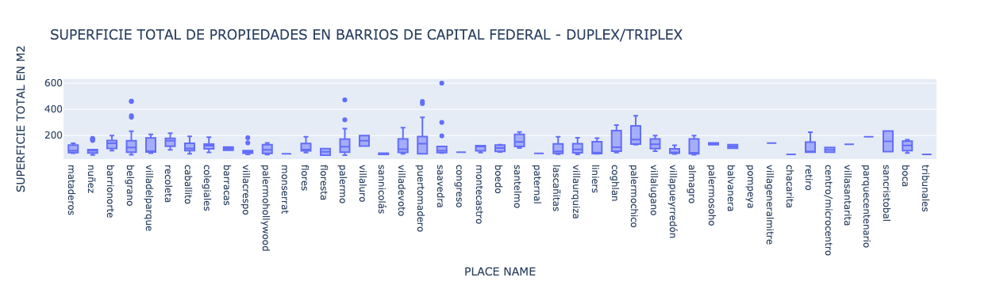

In [296]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='duplex/triplex')], y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - DUPLEX/TRIPLEX')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q3(75) + 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [297]:
duplex_outliers = ['nuñez','belgrano','villacrespo','palermo','puertomadero','saavedra']

df_duplex= df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='duplex/triplex')]

for outliers in duplex_outliers:
    q1 = df_duplex[df_duplex['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.25)
    q3 = df_duplex[df_duplex['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_duplex_sup_max = df_duplex[np.logical_and(df_duplex['PLACE NAME']==outliers, df_duplex['SUPERFICIE TOTAL EN M2'] > q3 + 1.5 * RIC)].index
    
    df = df.drop(index_outlier_duplex_sup_max)


In [298]:
df_duplex=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='duplex/triplex')]
df_duplex.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,42.000,244.000,73.000,372.000,293.000,280.000,386.000,386.000
mean,5.571,3.311,4164.384,101.933,114.549,2642.840,349255.303,303431.587
std,4.379,1.166,3220.089,47.713,52.663,1020.009,605842.670,233171.598
min,1.000,1.000,10.000,48.000,50.000,250.000,23000.000,23000.000
25%,2.000,2.000,1900.000,64.750,72.000,1979.762,175000.000,175000.000
50%,4.500,3.000,3000.000,88.000,99.000,2451.989,240000.000,240000.000
75%,8.750,4.000,6000.000,129.000,146.000,2989.473,357500.000,350000.000
max,15.000,8.000,17000.000,290.000,350.000,6944.444,9435376.000,2300000.000


In [299]:
duplex_index_expenses = df_duplex.sort_values('expenses')[:4].index
df_duplex.sort_values('expenses')[['expenses','SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']][:4]



,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
24391,10.000,80.000,130.000,NaN,NaN,ventaduplexaestrenar
53806,300.000,150.000,150.000,1653.333,248000.000,departamentoventa3ambientesbarrionorteduplexalavtaexcelenteestado!!!!
55491,400.000,56.000,NaN,NaN,185000.000,departamentoenduplexconterraza
79003,600.000,99.000,115.000,3295.652,379000.000,3ambientesenduplexconterrazapropiaamobladoexcelenteubicaciónprimerpisoporescalera


In [300]:
# Vamos a dropear el primer indice, que no nos dice , y 10 es un valor muy bajo

df = df.drop(duplex_index_expenses[:1])

In [301]:
df_duplex.sort_values('PRECIO USD', ascending = False)\
        [['expenses','SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']][:5]


,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
31387,NaN,290.000,350.000,6571.429,2300000.000,venta-impresionanteduplexconterrazayparrilla-barrioparque
4875,NaN,252.000,252.000,6944.444,1750000.000,excelentetriplexmuyaltoconvistaaríoyalnorte
9609,NaN,265.000,NaN,NaN,1600000.000,triplexamobladodelujoenmolinosfaenabuilding
33526,NaN,239.000,339.000,4100.295,1390000.000,espectacularresidenciaenduplexconlasmejoresvistasdelyachtclub
60190,17000.000,128.000,190.000,6578.947,1250000.000,duplexenventa3ambientespuertomadero


Segun simulaciones en zonaprop son valores logicos los de PRECIO USD y PRECIO USD POR M2

## Piso/Penthouse

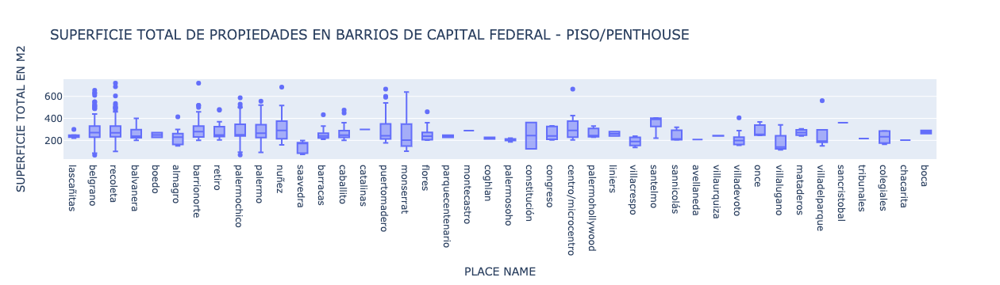

In [302]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')],\
             y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - PISO/PENTHOUSE')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [303]:
piso_outliers = ['lascañitas','belgrano','recoleta','almagro','barrionorte','retiro','palermochico','palermo','nuñez','barracas','caballito','puertomadero','flores',
                  'centro/microcentro','villadevoto','villadelparque']

df_piso = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')]

for outliers in store_outliers:
    q1 = df_piso[df_piso['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.25)
    q3 = df_piso[df_piso['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_piso_sup_max = df_piso[np.logical_and(df_piso['PLACE NAME']==outliers, df_piso['SUPERFICIE TOTAL EN M2'] > q3 + 1.5 * RIC)].index
    index_outlier_piso_sup_min = df_piso[np.logical_and(df_piso['PLACE NAME']==outliers, df_piso['SUPERFICIE TOTAL EN M2'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_piso_sup_max)
    df = df.drop(index_outlier_piso_sup_min)



In [304]:
df_piso_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')]
df_piso_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,68.000,529.000,301.000,819.000,759.000,687.000,784.000,784.000
mean,4.559,5.268,12316.711,480.424,273.648,3517.867,969906.957,968055.091
std,3.491,1.725,8196.969,6527.613,81.843,2306.444,828591.429,828933.994
min,1.000,1.000,1.000,48.000,68.000,268.470,70000.000,70000.000
25%,1.000,4.000,6590.000,199.000,220.000,2168.917,495000.000,493750.000
50%,4.000,5.000,11800.000,234.000,250.000,2931.193,740000.000,740000.000
75%,7.000,6.000,16000.000,294.000,313.000,4305.378,1200000.000,1200000.000
max,14.000,17.000,70000.000,187000.000,666.000,20731.707,8500000.000,8500000.000


In [305]:
piso_index_ambientes = df_piso_caba.sort_values('rooms', ascending = False)[:10].index
df_piso_caba.sort_values('rooms', ascending = False)[['rooms','SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','description']][:10]



,rooms,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,description
37759,17.000,359.000,NaN,NaN,1700000.000,pisodecategoríaenventaenrecoleta,"corredorresponsable:laurahzarate-cucicba6602contacto:anaspeier-mlsid#420591028-14departamentodecategoríacondetallesdelujoenlamejorzonaderecoletamuyluminosoyconvistaabierta,cuentacon2vestidores,bar,variosdormitoriosybañoscompletosposeehabitaciónseparadadechauffeurenotropisodeledificioydosdormitoriosdeserviciosconbañocompletoenunazonaseparadaseingresaporelpalierprivadoaunagaleríaquedaaccesoalliving:pisosderobledeeslovenia,chimeneademármolcarrarayverdealpesaladerechaseencuentraunabibliotecaconsuchimeneademármoldealabastroyporunapuertaocultaseaccedeaunestarconbarestesectortieneuncomedor,unabodegaytoilettehaydosdormitoriosyunbañoluego:unaampliacocinayunsectordeservicio,conlavadero,bañoydosdormitoriosdeservicioenunsectorseparadoseencuentreeldormitorioprincipalcondosvestidoresybañoensuiteenestesectorhayunbañocompleto,yuncuartodehuéspedesensuiteconterraza"
13769,14.000,320.000,400.000,837.500,335000.000,"14habitaciones,5bañostodoen320mts","setratadeunapropiedaddesarrolladatodoenel3erpisoenunainmejorablezonadesantelmo,todoalfrenteson14habitaciones,5bañosy80mtsdepatio-todorecicladoyenexcelenteestado-"
9764,12.000,363.000,366.000,3278.689,1200000.000,arroyoyesmeralda:oficina/viviendafrancesunico!!!frentehotelsofitel,"-excelentepisode375menedificiofrancésdegrancategoría-aptoprofesional-frentealhotelsofitel-pisosedificio:4-imponenteentradaaledificiocongranescaleracircularenmármol(seveenlasfotos)actualmenteseencuentraacondicionadoparaoficina(ultima:agenciadepublicidad)sinalterarlosdetallespropiosdelaconstrucción-todaslasconexionesycableadosconinstalacióninterna,luminariasembutidasypisosalfombrados,resultandounespacioprolijoyordenado-calefaccióncentraldesdelapropiaunidadporradiadores-aireacondicionadoindividual,entodoslosambientes-aysa(agua)incluidaenexpensas(aguacaliente:calefon)-encargadode8a20hs-2ascensoresdescripcióndesusambientes:•saladereunionesfrente(haciaarroyo)•oficinafrente/directoro2puestosdetrabajo•recepción/3puestosdetrabajo•oficinachicaaaireyluzpara1puestodetrabajo•oficinagrandeapatioexterior1/4puestosdetrabajo•oficinagrande1apatioexterior/3puestosdetrabajo•oficinagrande2apatioexterior2/3puestosdetrabajo•oficinagrande3apatioexteriorcontra-frente,ensuiteconbañocompleto/directorohasta4puestosdetrabajo•granoficinadivididaendosporvidrio/durlock7puestosdetrabajo•oficinapasilloaentrepiso/1puestodetrabajo(actualmentesaladecomputación/scanner/otros•oficina1enentrepriso/2puestosdetrabajo•oficina2enentrepiso/2puestosdetrabajo•archivoenentrepiso•archivoenpasilloconectoracocina/comedorconlasalagrande•cocina/comedordiario•cuartodearchivoen5topiso,aprox4x3(originalmentecuartodechoferconáreadebaños)•baulerajaulaensótanoedificio6x3•1toilettey3bañosenlaplantaprincipal•1bañoenelentrepiso•elentrepisonoesalgoganadoalaalturadelaplantaprincipalsinoquesetratadeunaplantasuperior(contechomásbajos)originaldeledificionotienecochera,peropuedenalquilarseenfrente"
26502,12.000,417.000,417.000,2997.602,1250000.000,arenales2100increíbleduplexestilofránces,"impecableedificiofrancéssondospisoscomunicadosporunamagnificaescaleraderobleantiguaelpiso4constaderecepción,toilette,gransaladeestarconchimeneademármolfrancesagranlivingyimportantecomedorseparadoporpuertascorredizasantecocinaparaguardadodevajillazonadedormitoriosconimportantedormitorioensuiteconvestidorygranventanalalpulmóndemanzana,yotrodormitorioconsubañohallintimoquedaalagranescalerayenelpisosuperiorundormitorioensuiteydosdormitoriosensemisuiteimportanteestarsuperluminosograncocinayespaciosocomedordiarioydependenciadeservicioenelultimopisoescalerasdemármolhacialagranterrazaestadoimpecablelaventadeesteinmuebleestásujetaalatramitacióndelcódigodetransferenciadeinmuebles(coti),deconformidadconlanormativavigente(resafip2371/08,2439/08yccs)porpartedelpropietario"
33006,12.000,320.000,320.000,2171.875,695000.000,mtdealvear-libertad320m2

In [306]:
# El primer index, no podemos comprobar si realmente tiene 17 ambientes, asi que vamos a dropearlo, ya que no nos dice mucho

df = df.drop(piso_index_ambientes[:1])

df.loc[piso_index_ambientes[6],'TIPO DE PROPIEDAD']='duplex/triplex'

# Se trata de un hotel y no un piso
df = df.drop(piso_index_ambientes[9])


In [307]:
piso_index_expensas = df_piso_caba.sort_values('expenses')[:10].index
df_piso_caba.sort_values('expenses')[['expenses','SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','description']][:10]


,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,description
63002,1.000,214.000,214.000,7476.636,1600000.000,renoiriisolpisoaltocondoscocheras,"renoiriiexcelentedto4ambdeppisoaltovistapanoramicaconsulte!situarpropiedadestulugar""sucursalpuertomaderoaimépainé1641tel+5411sucursalzonanortedrtomasanchorena693lalucila,vicentelopez,pciabsastel+1870"
55379,1.000,230.000,280.000,1000.000,280000.000,piso5ambientes-mataderos,ventapiso5ambientesavemiliocastroliniersbarrionaonsobreavenida!!!excelentepisode5ambientesalfrentedepartamentoen2dopisoporescaleraampliolivingcomedorconventilaciónnaturalalfrentemediantebalcónsobreavemiliocastropisosencerámicoscolornaturalydetallesdeyeseríaeiluminaciónampliacocinacomedorseparadaequipadaconmueblesaltosybajosamedidagrancapacidaddeguardadomesadadegranitocondoblebachadeaceroinxidableventilaciónnaturalalexteriordetallesenterminacioneseiluminación4dormitoriosampliosconluznaturalmuyluminososplacardembutidos2bañoscompletosrevestidosencerámicosdecalidadygriferíade1ramarcapatioaterrazadoamplioquinchoestilorústicoconparrillamuyluminosoampliaterrazaconmedidasdeltotaldelapropiedadcuentacondetallesdecategoriaentodossusambientesmuybiendistribuidosconampliosventanalespropiedadtotalmenterecicladaanuevomuyfuncionalmercaderiaaltamenterecomendableenexcelenteestadonordepropiedades/4490esperamossucontacto!!!
58620,1.000,380.000,400.000,1000.000,400000.000,oficinaenventasantelmo,"excelentepropiedadde400m2en3plantasidealusocomercialmuybuenestadodetallesdecategoríacondoblecirculaciónapliosalóndeusosmúltiples,recepciónydespachoenplantabaja1°piso:7despachos,bañoycocina2°piso:plantalibreconvistasysalidaalbalcónterraza,bañoycocina4equipadocongrupoelectrógenopropiolasmedidassonaproximadasatituloinformativolassuperficiesrealessurgirándeltitulodepropiedaddelinmuebleelpresenteanuncioessoloatituloinformativo,laventadedichoinmuebleestasupeditadaaqueelpropietariotramiteantelaafipelcoti"
61537,1.000,214.000,214.000,6542.056,1400000.000,renoirii-pisoaltosolcondoscocheras,"renoirii-solpisoalto-condoscocherastresdormitoriosensuite,granlivingcomedorconexcelentevistacocinacomedoráreadelavaderoyserviciosevisitaconentrevistapreviasituarpropiedadestulugar""sucursalpuertomaderoaimépainé1641tel+5411sucursalzonanortedrtomasanchorena693lalucila,vicentelopez,pciabsastel+1870"
59061,1.000,290.000,380.000,NaN,NaN,unicodepartamentoconterrazaenchateaulibertador,"espectaculardepartamentoentorrechateaulibertador290m2cubiertosmás90descubiertosdeterrazaúnicadoscocherasgranlivingcomedorconpisosdemármolysalidaagranterrazadescubiertaconlasmejoresvistasalrioylaciudadtresampliosdormitoriosensuiteplayroomysaladetvdependenciadeserviciococinacompletaconcomedordiariotorrechateaucontodoslosamenitiesmáximacategoría¿necesitásvenderparacomprar?teayudamosaencontrartupróximapropiedadtwhatsapp15-queunainmobiliaria""lasmedidas,superficiesyvaloresdeestafichasonaproximadasyatítuloinformativoúnicamente"
61547,1.000,214.000,214.000,7009.346,1500000.000,renoiriisolcondoscocherasaestrenar,"renoirii-sol-pisoalto-doscocherasexcelentedto4ambdeppisoaltovistapanoramicasevisitaconentrevistaprevia!situarpropiedadestulugar""sucursalpuertomaderoaimépainé1641tel+5411sucursalzonanortedrtomasanchorena693lalucila,vicentelopez,pciabsastel+1870"
48579,1.000,364.000,364.000,9615.385,3500000.000,torremirabilia-5ambientes-palermo,"torremirabiliapalermopalierprivadoydeserviciohallderecepcionlivingcomedor1270x690escritorio420x305comedordiario420x350balcon4x170suite390x490,convestidor,bañocompleto2dormitoriosensuite305x320escritoriofamilyroom305x690cocinabreakfast620x405despensalavaderoindependientedependenciadeservicio385x220cocherasfijas(4)ybaulerasamenities:-granparquede9000m2-espectacularvistaalrioyciudad-piscinasclimatizadasparaadultosyniños-solarium-piscinasemicubiertaclimatizadaehidromasaje-áreadejuegosinfantiles-bar-resto-minimarket-fitnesscenter-gimnasio-salónderelax-quinchoconparrilla-circuitoaeróbico-microcine-puttinggreen-bicicleteros-salones

In [308]:
# Los 8 primeros valores de expensas estan mal imputados, vamos a cargarles NaN values.

df.loc[piso_index_expensas[:8],'expenses']=np.NaN

In [309]:
piso_index_sup_cubierta = df_piso_caba.sort_values('SUPERFICIE CUBIERTA EN M2', ascending = False)[:10].index
df_piso_caba.sort_values('SUPERFICIE CUBIERTA EN M2', ascending = False)[['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','description']][:10]


,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,description
56218,187000.000,NaN,NaN,600000.000,excelentepisoenbarrionorte,"barrionorteexcelentesemipisoalfrentebalcóncorridosuperficie187metrostodoslosambientesmuyluminososysoleados-palierprivado4dormitorios-c/dependenciaservicio-4bañosrecepciónycomedor,cocinaconcomedordiarioylavaderococherafijaygranbaulerasercioscentralesedificioconentradadecortesíaexpensasincluyeaysayvigilancia$11000-"
33326,3330.000,NaN,NaN,70000.000,ventadepartamento2ambaptocredito-almagro-,"corredorresponsable:jorgesalafia-cucicba5666contacto:andreabutty-mlsid#420211115-47departamentode2ambientesrecienpintado,lateralluminoso-livingcomedorconpisosdeparquetydetalledeluzdifusaeneltecho;dormitorioluminosoconplacardypequeñoespaciodeguardado(guardilla/vestidor),bañoycocinaenbuenestado,deepocaexpensasmayo$1250-hipolitoirigoyenesquinamazaproximoamediosdetransporteyzonacomercialesaptocreditomartilleroresponsablejorgesalafiacucicba5666"
47225,2949.000,NaN,NaN,76900.000,monoambienteconcocinaamericanaenbelgranor,"corredorresponsable:jorgesalafia-cucicba5666contacto:karenorille-mlsid#420211178-7monoambienteubicadoenelbarriodebelgranor,esinternoyluminoso,convistaalafrente,ubicadoenuntercerpisoson29,45mt2porescrituralacocinaesintegradaybañoconduchalospisossondeparquetplastificadoytieneplacardesaptocredito(conplanosyreglamentodecopropiedad)elestadogeneralesexcelenteidealinversoreslasexpensassonde$1800aproximadasmediosdetransporte:colectivos19,67,76,107,113,114,133,151,etcsubtelineada8cuadrasfcmitreestbelgranora4cuadras"
34762,655.000,NaN,NaN,2499000.000,vendepisobarrancasbelgrano8ambpiletapropia,"corredorresponsable:ricardodemichelli-cucicba1104contacto:nidiayomayusamartinez-mlsid#341132-343vendehermosopenthouseduplexdecategoriaenbarrancasdebelgrano,excelenteubicaciónhermosavista!!enplantabaja:palierprivado,dosascensores,amplioyluminosolivingcomedorconexcelentevistayhogar,pisosdemármol,toiletderecepción,ampliacocinaconespacioparacomedordiarioylavadero,dependenciadeserviciooescritorio,4dormitoriosampliosyluminosos,elprincipalensuite,2bañoscompletos,poreldiseñodeldepartamentoydisposicióndelosdormitorios,podríanrediseñarse4dormitoriosensuiteeldormitorioprincipalesmuyamplioyluminosotieneunimponentevestidor,ampliobañocompleto,4placaresadicionalesdentrodeldormitorio,doblecirculaciónlospisosdelosdormitoriossondeparque,lacalefaccióncentralenplantaaltajardíndeinvierno,playroomconentrepiso,hogar,pileta,ampliaterrazacondeck,parrillaydependenciadeservicioeldepartamentofuereciclado,todaslasaberturassoncondoblevidrioyventanalesparalelosherméticos,lospisossondemármolenellivingcomedorylaescalerareciénpulidoyelparquetestaplastificado,lasparedesreciénpintadaslistoparahabitarlapropiedadcuentacon2cocherasybauleraeledificiocuentaconseguridadlas24horasenlazonadelascocheras,encargadoeneledificiocolectivos:15,29,42,44,55,60,63,64,65,80,107,113,114,118trenes:belgranoc(mitre)"
48414,639.000,639.000,624.413,399000.000,moreno1500,"ventapetithotelenbloqueenmonserrat**areciclar**antiguopetithotel,areciclardesarrolladoen4plantas,de101m2paralaprimeraplanta,93m2paralasegunda,92m2paralaterceray87m2paralaultimaplantadandountotalde373m2pisosdepinotea,mármoldecarrara,techosde3,35dealturasinexpensas//códigodeplaneamientourbanoe1//inmejorableubicacion,proximoaimportantesavenidascomo,avdemayo,9dejulioyavbelgranosubteylineasdecolectivositenesquevenderparacomprarlexintoneslainmobiliariaporexcelenciaencompra/ventasimultaneacomunícateal//tasacionesprofesionaleslasmedidas,superficiesyvaloresdeestafichasonaproximadasyatítuloinformativoúnicamente"
25448,623.000,NaN,NaN,420000.000,hotel/pensionenbalvaneraaptocredito,corredorresponsable:luisromangarcia-cucicba4040contacto:jorgestein-mlsid#420111090-60-hoteldepasajerosenzonadegranmovimiento-ubicadoenelprimerpiso-20habitaciones-5habitacionesconbañosprivados-4bañosgenerales-2balconesalfrente-335m2cubiertos-posibilidaddeconstruirmashabitacionesenlaterraza-terrazade281m2-los2balconesde7m2t

In [310]:
df.loc[piso_index_sup_cubierta[:1],['SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2']]=187

df = df.drop(piso_index_sup_cubierta[1])


In [311]:
df_piso_caba.sort_values('PRECIO USD POR M2', ascending = False)\
[['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','description']][:10]


,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,description
33003,410.000,410.000,20731.707,8500000.000,leparcalcorta-pisomuyaltode410m2con2cocheras,contacto:martinpinus15-excelentisimapropiedaddeprimeracategoríaentorreleparcalcorta2cocherasexcelenteconstrucciónylosmejoresamenities
18940,200.000,220.000,20000.000,4400000.000,excelentepiso220m2c/dep2cocherasfijas,excelentepiso220m2palierprivadolivingycomedorsalidaabalcnsemiaterrazadotoilyplacardderecepcinsosdemaderaplastificadoscombinadosconmarmoltrravertinoentradadeserviciograncocinacomedoranafeyhornoempotradoprofusiondemueblesdecocinalavaderoydepdeservicio4dormitorios(2ensuiteppalconhidromasajeyvestidor)todoslosdormitoriosconplacardbaocompletotodosconpisosdemaderaplastificados2cocherasfijasconentradaconportonautomticogranbaulerajaulaexcelenteestadoconsultefinanciacinpublicadoporpmpropiedadesatravesinmomap
33002,410.000,410.000,19512.195,8000000.000,leparcalcorta-pisomuyaltode410m2con2cocheras,contacto:martinpinus15-excelentisimapropiedaddeprimeracategoríaentorreleparcalcorta2cocherasexcelenteconstrucciónylosmejoresamenities
33000,300.000,320.000,17187.500,5500000.000,leparcalcorta-pisode320m2con2cocheras,contacto:martinpinus15-excelentisimapropiedaddeprimeracategoríaentorreleparcalcorta2cocheras300m2cubiertosy20m2descubiertosexcelenteconstrucciónylosmejoresamenities
9972,200.000,211.000,12796.209,2700000.000,leparcalcorta-pisode211m²con2cocheras,contacto:rominataccari15contacto:martinpinus15-leparcfigueroaalcorta-torrealcortavistanorte-pisomediano211m2-200m2cubiertos-4ambientes-4habitacionesconbañopropio-bañodevisitas-2cocheras-baulera
41190,250.000,250.000,12000.000,3000000.000,venta:semipisodegrancategoríaeimportantesterminacionesentorredemáximacategoría!!,"livingycomedoryestaroescritorio,balcón,toilette,3dormitorios(3suites),dependencias,2cocherasfijas,seg24hs,amenitiesmuybuenavistaverdeapulmóndecasasantigüedad:11añosorientaciónestesuperficietotal:250m2palierprivadocon2ascensoreshall2x2living8x5,50estaroescritorio5,50x4balcónaterrazado4x1,60comedor5,50x3,80conpuertascorredizasabalcónfrancéstoilette1erdormitorio4,50x3,80(suiteconhidroyduchacompartimentadoyvestidor)abalcónaterrazado4,50x1,202dodormitorio4x3,80(suite)abalcónfrancés3erdormitorio4x3,80(suite)abalcónfrancéscocina7,50x4conmesaparacomedordiariolavaderoindependiente1dependenciagrande4x3para2personas,conbuenbañodeserviciodoblecirculaciónpuertadeservicioapalierprivadoconascensor2cocherasfijas1baulerahabitaciónnrodepisos:12tipodepiso:parquetmarqueteadoentodalacasa3ascensorescalefacciónporairecentraldelaplantaporcalderetaindividualaguacaliente:termotanqueindividualaireacondcentraldelpisoseguridad24hs/porterovisorgrupoelectrógenoexpensas:abl:amenities:piletaclimatizada,jardín,juegosparaniños,gym,sumtodosloscerramientostienenvidriosdobleslevantapersianaseléctricosendormitoriostodoslosartefactosdecocinasonariston"
39663,400.000,400.000,11000.000,4400000.000,leparcdemaria4500-pisoaltisimorecicladovistaalriocon3cocheras,"contactoleonelmoiguer15***torreleparcpalermo******excelentisimopisoaltisimovistaalrio***todoreciclado***detallesdeprimeracategoría3cocheras3dormitoriosensuite(elppal2baños,1conjacuzzi)vestidor2dependenciasdeserviciocuentacongranrecepción,living,comedorapaisado,playroombalcónaterrazadotoillettederecepciónampliacocinaequipadayamobladacomedordiariolavaderoseparadotodoslosamenities(canchadetenis,paddle,squash,sum,piscinaclimatizada,saunaehidromasajes,estacionamientodecortesía,seguridad24hs,grupoelectrógeno,saladejuegos)"
36396,377.000,377.000,10875.332,4100000.000,leparcdemaria4500-pisoaltisimorecicladovistaalriocon3cocheras,"***torreleparcpalermo******excelentisimopisoaltovistaalrio***todoreciclado***detallesdeprimeracategoría3cocheras3dormitoriosensuite(elppal2baños,1conjacuzzi)vestidor2dependenciasdeserviciocuentacongranrecepción,living,comedorapaisado,playroombalcónaterrazadotoillettederecepciónampliacocinaequipadayamobladacomedordiariolavaderoseparadotodoslosamenities(c

Los precios son logicos, al simularlos en Zona Prop.

## Price

#### APARTAMENTOS - USD

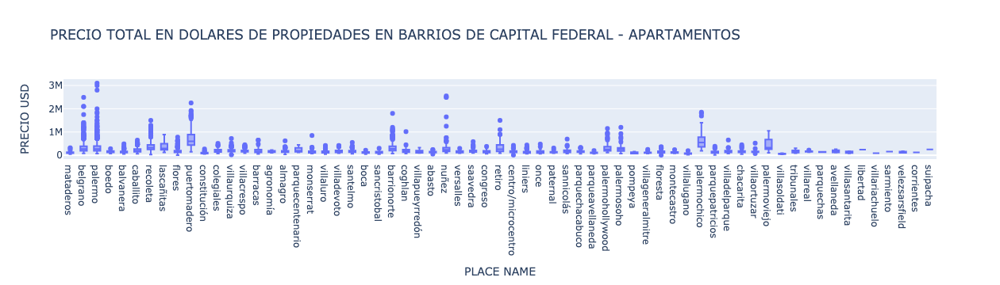

In [312]:
df_departamento_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='apartment')]

fig = px.box(df_departamento_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - APARTAMENTOS')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [313]:
precio_outliers_departamentos = ['mataderos','belgrano','palermo','boedo','balvanera','caballito','recoleta','flores','puertomadero','constitución','colegiales','villaurquiza',
                 'villacrespo','barracas','almagro','monserrat','villaluro','villadevoto','santelmo','boca','sancristobal','barrionorte','coghlan','abasto',
                 'nuñez','versalles','saavedra','congreso','retiro','centro/microcentro','liniers','once','paternal','sannicolás','parquechacabuco','parqueavellaneda',
                 'palermohollywood','palermosoho','villageneralmitre','floresta','montecastro','villalugano','palermochico','parquepatricios','villadelparque',
                 'chacarita','villaortuzar','villareal']


for outliers in precio_outliers_departamentos:
    q1 = df_departamento_capitalfederal[df_departamento_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_departamento_capitalfederal[df_departamento_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_ap_max = df_departamento_capitalfederal[np.logical_and(df_departamento_capitalfederal['PLACE NAME']==outliers, df_departamento_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_ap_min = df_departamento_capitalfederal[np.logical_and(df_departamento_capitalfederal['PLACE NAME']==outliers, df_departamento_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_ap_max)
    df = df.drop(index_outlier_ap_min)
    


In [314]:
df_departamento_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='apartment')]
df_departamento_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,1209.000,5083.000,2856.000,8030.000,7123.000,6489.000,8367.000,8350.000
mean,5.157,3.260,3633.934,84.727,91.544,2712.958,293455.579,241891.708
std,4.930,1.007,3094.334,35.727,40.058,1079.098,534735.117,161713.238
min,1.000,1.000,1.000,48.000,27.000,69.382,24300.000,6730.040
25%,2.000,3.000,1800.000,59.000,62.000,2017.544,140000.000,139000.000
50%,4.000,3.000,2900.000,74.000,80.000,2500.000,195000.000,190000.000
75%,7.000,4.000,4500.000,100.000,111.000,3098.592,295000.000,290000.000
max,55.000,12.000,54240.000,419.000,419.000,9620.351,14756597.000,1500000.000


In [315]:
df_departamento_capitalfederal.sort_values('SUPERFICIE TOTAL EN M2')\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']][:5]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
72740,NaN,27.000,2218.519,59900.000,departamento-flores
76291,NaN,27.000,2814.815,76000.000,departamento-palermosoho
75664,NaN,27.000,2740.741,74000.000,departamento-monserrat
54251,NaN,27.000,4407.407,119000.000,departamento-barrionorte
82979,NaN,27.000,2851.852,77000.000,departamento-belgrano


In [316]:

df_departamento_capitalfederal.sort_values('PRECIO USD')\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']][:10]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
41381,67.000,97.000,69.382,6730.040,3ambientesampliosenimpecableestadoconpatio1ºporescaleraenventaenflores
11007,76.000,82.000,122.426,10038.970,excelentedptode4ambcoch/baulera/parquepatriciosaptocrédito
18828,60.000,60.000,405.000,24300.000,sevendedpto4ambbarriopiedrabuena
30137,NaN,154.000,187.498,28874.750,departamentoventa
42428,49.000,NaN,NaN,39000.000,ventadpto3ambenvillasoldati
19071,NaN,NaN,NaN,40000.000,excelente2ambienteconmuybuenprecio!!!
66747,NaN,27.000,1600.000,43200.000,departamento-scristobal
20827,70.000,70.000,642.857,45000.000,departamentoventa
19065,50.000,50.000,900.000,45000.000,dpto3ambsavio
27422,NaN,NaN,NaN,45000.000,departamentoenluganoiyii


In [317]:
# De simulacion en la pagina ZonaProps, tomamos un precio minimo de 42.000 usd para un departamento en caba.

index_mal_precio_usd_m2 = df_departamento_capitalfederal[df_departamento_capitalfederal['PRECIO USD'] < 42000].index


df = df.drop(index_mal_precio_usd_m2)

In [318]:
# Sobre el valor de las expensas, dropeamos los valores inferiores al quantil del 5%

q_expensas_caba=df_departamento_capitalfederal.expenses.quantile(0.05)

index_expensas_mal_cargadas=df_departamento_capitalfederal[df_departamento_capitalfederal.expenses < q_expensas_caba].index

df = df.drop(index_expensas_mal_cargadas)

#### Houses - usd

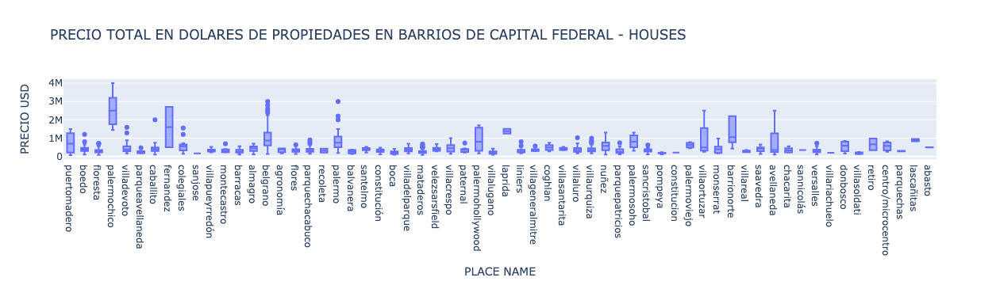

In [319]:
df_houses_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')]
fig = px.box(df_houses_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - HOUSES')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [320]:
precio_outliers_casas_caba = ['boedo','floresta','villadevoto','parqueavellaneda','caballito','colegiales','montecastro','belgrano','flores','parquechacabuco',
                         'palermo','mataderos','paternal','liniers','villageneralmitre','villaluro','villaurquiza','parquepatricios','sancristobal']


for outliers in precio_outliers_casas_caba:
    q1 = df_houses_capitalfederal[df_houses_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_houses_capitalfederal[df_houses_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_h_max = df_houses_capitalfederal[np.logical_and(df_houses_capitalfederal['PLACE NAME']==outliers, df_houses_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_h_min = df_houses_capitalfederal[np.logical_and(df_houses_capitalfederal['PLACE NAME']==outliers, df_houses_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_h_max)
    df = df.drop(index_outlier_h_min)
    


In [321]:
df_houses_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')]
df_houses_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,1.000,411.000,4.000,1091.000,897.000,776.000,1121.000,1119.000
mean,2.000,4.681,4525.250,232.793,310.550,1571.565,444674.844,444099.643
std,NaN,1.534,4445.914,130.058,236.095,891.685,390472.473,389931.700
min,2.000,1.000,1.000,48.000,48.000,257.143,70000.000,70000.000
25%,2.000,4.000,1500.250,140.000,184.000,1050.868,240000.000,240000.000
50%,2.000,5.000,4050.000,200.000,260.000,1395.032,349000.000,349000.000
75%,2.000,5.000,7075.000,293.000,380.000,1894.737,490000.000,490000.000
max,2.000,11.000,10000.000,1015.000,3484.000,12121.212,4000000.000,4000000.000


nota : El valor minimo de pisos en casas es 2, debido a los NaN

In [322]:
index_precio_mal_ingresad=df_houses_capitalfederal.sort_values('PRECIO USD',ascending = False)[:4].index

df_houses_capitalfederal.sort_values('PRECIO USD',ascending = False)[:4]\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','description','PLACE NAME']]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,description,PLACE NAME
4180,330.000,330.000,12121.212,4000000.000,casamodernadedoblefrenteenimpecableestado,"planosdeimportanteestudiodearquitecturacasamodernaen3plantas:livingycomedor,estar,toilette,cocinaconcomedordiario,patio,1dependenciaconbaño,jardínconpiletayparrilla,garage1erpiso:playroom,escritorio2dopiso:3suites,terraza",palermochico
15392,500.000,600.000,5333.333,3200000.000,barrioparque:espectacularcasaconpiletasobreombú,"espectacularcasaenunadelascallesmáslindasdebarrioparque(ombú)lotede340m2lafachadadelacasatieneretirosobreelfrente,pudiendoestacionarunautoencocheracubiertayotroendescubiertaenlaplantaencontramos:halldeentradatoilettederecepciónlivingenlconsalidaalexteriorcomedordegrandesdimensionessobreelfrentedelacasacocinarecicladaconcomedordiario,tambiénconsalidaafueraespectacularjardínconparrillaypiletaclimatizadademuybuenasmedidasenelprimerpisoencontramosunampliohalldedistribucióny4dormitorios,2deellosensuitey1escritorioconsubañoenelsegundopiso,mastersuitedegrandesproporcionesalfrenteconventanal,doblevestidorybañogranplayroomconvistaaljardín,gimnasioytoiletteeneltercerpiso,lavadero,2dormitoriosdeservicio,bañoyterrazadeexcelentesmedidaslacasaestarecicladaíntegramenteanuevohacepocosaños(incluyendocañeríaseinstalacióneléctrica)tieneascensoratodoslospisospisoradianteeléctricocontermostatoregulableparacadaambientemuyluminosaespectacular!",palermochico
52643,530.000,530.000,6037.736,3200000.000,importantecasaenbarrioparque,"casaenbarrioparqueconjardín,parrillaypileta,todorodeadodeverdeenpbseencuentraelhalldeentrada,comedoralfrente,importantelivingenlconvistaaljardín,toilettederecepción,cocinaconcomedordiarioconsalidaaljardín,jardínconparrillaypiletaclimatizadacocheracubiertaydescubiertaprimerpiso:granhalldedistribución,4dormitorios(2ensuiteydosensemisuite)yunescritorioconbaño(puedeserun5todormitorio)segundopiso:mastersuitealfrentecondosvestidores,granplayroomalcontrafrenteconvistaaljardín,gimnasioybañotercerpiso:lavaderocon2dependencias,bañoyterrazacañeríaseinstalacióneléctricaanuevo-ascensorhastalaterraza-pisoradianteeléctricocontermostatoregulableporambientes–(*)paramasinformación:011-154-168-2086/011-155-095-5025""lasmedidas,superficiesyexpensasconsignadasenlapresentesonaproximadas;yalsoloefectoorientativolosdatosdefinitivossonlosquesurgirándeltitulodelapropiedadydeloscomprobantesrespaldatorios",palermochico
20143,527.000,527.000,6072.106,3200000.000,ombu2900,"excelentecasadeestiloclásicoconpileta,jardínyparrillaconstruidasobreunlotede339metrosplantabaja,granrecepcióndelivingycomedorconsalidaagaleríayjardín,toilettederecepcomodacocinac/comedordiarioconsalidaaljardínexpectacularjardin,comodagaleria,piletaclimatizadatodorodeadodeverdecocheracubiertaparadosautosprimerpiso,halldedistribucióny4dormitorios(2ensuite)yunescritorioconsubañosegundopiso,granmastersuitealfrenteconventanales,dosvestidoresybañogranplay-roomalcontrafrenteverde,gimnasioytoilettetercerpisodosdependenciasconsubaño,granlavadero,yampliaterrazalacasahasidointegramenterecicladaconexcelentesmateriales,poseeascensorparatodoslospisospisoradiantecontermostatoregulableindividualparacadaambiente",palermochico


In [323]:
# El primer index, tiene un valor un 50% mas elevado a las simulaciones en zonaprop, vamos a droppearlo.

df = df.drop(index_precio_mal_ingresad[0])


### PH - usd

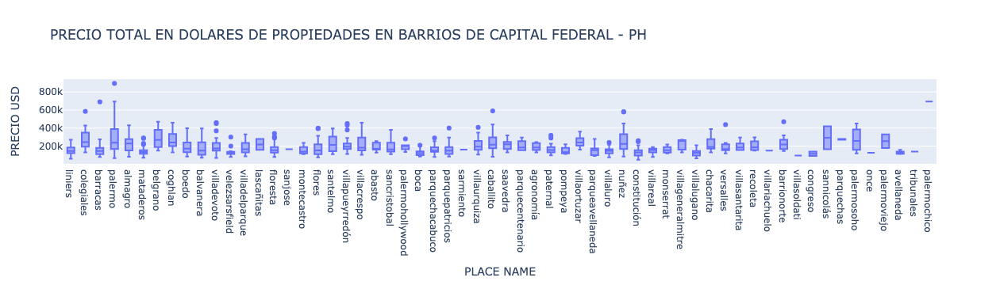

In [324]:
df_ph_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='ph')]
fig = px.box(df_ph_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - PH')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [325]:
precio_outliers_ph_caba = ['colegiales','barracas','palermo','mataderos','villadevoto','velezsarsfield','floresta','flores','villapueyrredón','palermohollywood',
                           'boca','parquechacabuco','parquepatricios','villaurquiza','caballito','paternal','villaluro','nuñez','constitución','versalles','barrionorte']


for outliers in precio_outliers_ph_caba:
    q1 = df_ph_capitalfederal[df_ph_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_ph_capitalfederal[df_ph_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_ph_max = df_ph_capitalfederal[np.logical_and(df_ph_capitalfederal['PLACE NAME']==outliers, df_ph_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_ph_min = df_ph_capitalfederal[np.logical_and(df_ph_capitalfederal['PLACE NAME']==outliers, df_ph_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_ph_max)
    df = df.drop(index_outlier_ph_min)
    


In [326]:
df_ph_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='ph')]
df_ph_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,81.000,725.000,115.000,1088.000,904.000,874.000,1165.000,1164.000
mean,1.889,3.724,979.861,98.354,130.244,1628.094,190929.099,190030.807
std,1.332,1.123,886.098,44.621,67.491,567.280,92500.805,87875.010
min,1.000,1.000,1.000,48.000,23.000,500.000,50000.000,50000.000
25%,1.000,3.000,400.000,65.000,78.000,1181.610,130000.000,130000.000
50%,1.000,4.000,700.000,86.000,111.000,1550.509,165000.000,165000.000
75%,2.000,4.000,1500.000,120.000,161.250,2000.000,229500.000,229125.000
max,6.000,9.000,4600.000,360.000,430.000,3630.435,1185000.000,695000.000


In [327]:
# Sobre el valor de las expensas, dropeamos los valores inferiores al quantil del 10%

q_expensas_caba=df_ph_capitalfederal.expenses.quantile(0.10)

index_expensas_mal_cargadas=df_ph_capitalfederal[df_ph_capitalfederal.expenses < q_expensas_caba].index

df = df.drop(index_expensas_mal_cargadas)

#### Stores - usd

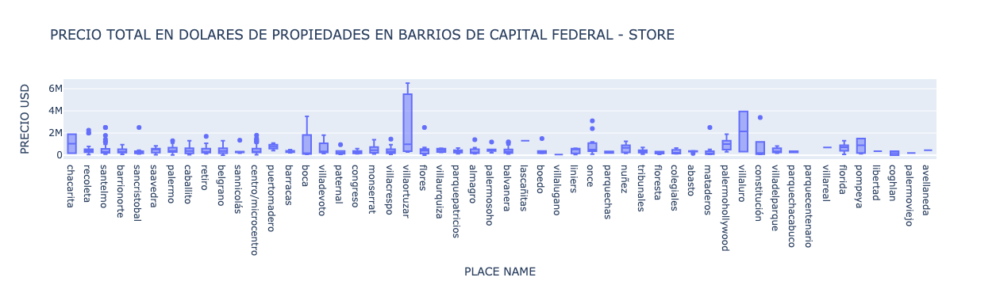

In [328]:
df_stores_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')]

fig = px.box(df_stores_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - STORE')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [329]:
precio_outliers_store_caba = ['recoleta','santelmo','sancristobal','palermo','retiro','sannicolás','centro/microcentro','paternal','villacrespo','flores',
                              'almagro','palermosoho','balvanera','boedo','once','mataderos','constitución']


for outliers in precio_outliers_store_caba:
    q1 = df_stores_capitalfederal[df_stores_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_stores_capitalfederal[df_stores_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_store_max = df_stores_capitalfederal[np.logical_and(df_stores_capitalfederal['PLACE NAME']==outliers, df_stores_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_store_min = df_stores_capitalfederal[np.logical_and(df_stores_capitalfederal['PLACE NAME']==outliers, df_stores_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_store_max)
    df = df.drop(index_outlier_store_min)
    


In [330]:
df_stores_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')]
df_stores_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,1.000,20.000,98.000,525.000,555.000,475.000,543.000,540.000
mean,4.000,2.500,3862.367,224.947,216.605,2720.632,503274.737,444781.648
std,NaN,2.965,3412.629,366.818,309.911,2119.928,870853.289,499494.259
min,4.000,1.000,400.000,48.000,30.000,96.696,28500.000,5608.360
25%,4.000,1.000,1271.500,86.000,88.000,1455.416,209500.000,209750.000
50%,4.000,1.000,3000.000,140.000,141.000,2198.582,330000.000,330000.000
75%,4.000,2.250,5000.000,240.000,248.000,3281.322,550000.000,546250.000
max,4.000,10.000,17500.000,3700.000,3700.000,22000.000,12581296.000,6500000.000


In [331]:
df_stores_capitalfederal.sort_values('PRECIO USD')[:10]\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
47595,58.000,58.000,96.696,5608.360,excelentelocalenventaconrentaenflores
71112,70.000,70.000,128.191,8973.380,ventafondodecomercioencoghlan
71099,70.000,70.000,128.191,8973.380,ventafondodecomercioenbelgrano
75361,230.000,270.000,105.556,28500.000,ventafondodecomercioenlascañitas
4611,300.000,300.000,116.667,35000.000,localenventa
49114,NaN,NaN,NaN,45000.000,fondodecomercio-saavedra
68630,NaN,30.000,1500.000,45000.000,localenzonacomercial1rajunta
12823,NaN,NaN,NaN,48000.000,localc/fondodecomercioenlugano1y2
13476,60.000,60.000,825.000,49500.000,econmicoslocalesengaleraenliniers
61740,NaN,NaN,NaN,52000.000,localsobreavsantafe


In [332]:
# Precio minimo de store, 45000 usd

index_precio_usd_mal=df_stores_capitalfederal[df_stores_capitalfederal['PRECIO USD'] < 45000].index 

df = df.drop(index_precio_usd_mal)

### Depositos - usd

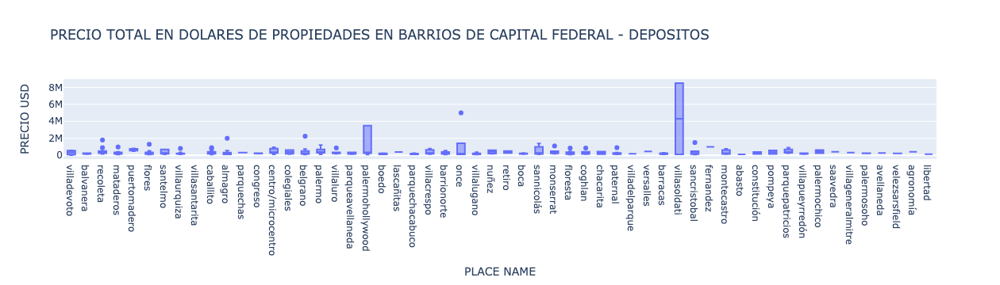

In [333]:
df_depositos_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='deposito')]
fig = px.box(df_depositos_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - DEPOSITOS')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [334]:
precio_outliers_depositos_caba = ['recoleta','mataderos','flores','villaurquiza','almagro','belgrano','villaluro','once','monserrat','floresta','paternal','sancristobal']


for outliers in precio_outliers_depositos_caba:
    q1 = df_depositos_capitalfederal[df_depositos_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_depositos_capitalfederal[df_depositos_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_depo_max = df_depositos_capitalfederal[np.logical_and(df_depositos_capitalfederal['PLACE NAME']==outliers, df_depositos_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_depo_min = df_depositos_capitalfederal[np.logical_and(df_depositos_capitalfederal['PLACE NAME']==outliers, df_depositos_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_depo_max)
    df = df.drop(index_outlier_depo_min)
    


In [335]:
df_depositos_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='deposito')]
df_depositos_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,36.000,191.000,48.000,341.000,270.000,244.000,351.000,338.000
mean,4.889,3.581,3410.396,192.830,249.407,2272.446,481690.399,355832.459
std,3.336,1.920,3298.513,604.603,693.110,1452.584,907205.442,552259.875
min,1.000,1.000,300.000,48.000,26.000,500.000,19900.000,19900.000
25%,3.000,3.000,1750.000,70.000,77.250,1303.261,164000.000,159250.000
50%,4.000,3.000,2500.000,107.000,140.000,2031.442,245000.000,239999.000
75%,6.000,4.000,3850.000,187.000,231.000,2892.409,425000.000,405125.000
max,16.000,18.000,19000.000,10958.000,10958.000,9750.000,8500000.000,8500000.000


In [397]:
index_depositos_m2 = df_depositos_capitalfederal.sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3].index

df_depositos_capitalfederal.sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
51636,sell,store,villasoldati,|argentina|capitalfederal|villasoldati|,argentina,capitalfederal,3427366.000,"-346601221702,-584302513174",-34.660,-58.430,8500000.000,usd,149978250.000,8500000.000,10958.000,10958.000,775.689,775.689,NaN,NaN,NaN,http://wwwproperaticomar/1ahu2_venta_local_villa-soldati_rivera-indarte-av-_3500_ana-simeone-inmuebles-corporativos_gcu,"caba-villasoldati-código0146excelentenaveindustriallapropiedadabarcadoslotesdeterrenoqueenconjuntoposeenunasuperficietotalde18151,41m2,sobreelcualhayconstruidos10960m2dedepósitosdistribuidosenunanavede5000m2con7metrosdealturaparedesdeladrilloytechodechapaacanalada,conunespaciocentraldondeseencuentranlasáreasdeservicioydeoficinasquellegahastaelfrenteconunasuperficiede1600m2aproximadamente;separadosporunacalleinternaseencuentranlosotros5000m2cubiertosaproximadamentedistribuidosenvariasnavesantiguascontechosdechapaalgunasyotrasdefibrocemento,conbajaalturatodoelprediotienereddeincendioconhidrantesyrociadores,lospisosestánenbuenestadogeneralyalasnavesnecesitanalgunostrabajosdemantenimiento,poseepotenciaeléctricainstaladaconuntransformadorde500mega-vatioszonificaciónindustrial",excelentenaveindustrialde10960m2sobreterrenode18151m2,https://thumbs4properaticom/3/y-tfapyirsm_0_bk_juqzcr-nwc=/trim/198x0/smart/filters:strip_icc()/tbcns3-accelerateamazonawscom/water_pics/70076221889746560551029497762513403676411628445635885507926481858403768189681jpg,villasoldati,10958.000,10958.000,775.689,8500000.000,usd,8500000.000,deposito
14002,sell,house,villacrespo,|argentina|capitalfederal|villacrespo|,argentina,capitalfederal,3427458.000,"-346019154,-584443228",-34.602,-58.444,NaN,NaN,NaN,NaN,1991.000,1240.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1774k_venta_casa_villa-crespo_suite_parrilla_patio_piscina_quincho_sum_terraza_vestidor_dependencias_aire-acondicionado_subte-linea-b_migliorisi-propiedades_cy0,"excelentepropiedaddoblefrentecasacongalponde600m2inmejorableestadodetallesdesumacalidad,ascensorcalderacentralyademasequiposdeaireacondicionadofriocalorindividuales4dormitoriosenplantaaltaconvestidorensuitedependenciasdeserviciopatio,quinchoconparrillayterrazaconpiletadenatacioncasade640m2cubiertos+patioyterraza600m2degalponconopcionaadosarotrogalpon",casade5ambientesenventaenvillacrespo,https://thumbs4properaticom/6/yueu85uo9nubxz_kctu1yo9b77i=/trim/198x0/smart/filters:strip_icc()/staticsumapropcom/2171/585514/files/5891545jpg,villacrespo,1240.000,1991.000,NaN,NaN,NaN,NaN,deposito
50078,sell,store,palermohollywood,|argentina|capitalfederal|palermo|palermohollywood|,argentina,capitalfederal,NaN,"-345834449283,-584373002989",-34.583,-58.437,3500000.000,usd,61755750.000,3500000.000,1556.000,NaN,2249.357,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1aeip_venta_local_palermo-hollywood_honduras_5700_balcon_patio_sotano_terraza_luminoso_electrogeno_belga-inmobiliaria_gdd,"excepcionaledificiotipoindustrial-granpropiedad-ideallocal-oportunidadinversores-inmejorableubicaciónenpalermoconfachadahistóricasótano:2depósitos-grupoelectrógeno-montacargaspb:grandeslocalesparausocomercial-patiosoleadopb1:4oficinas(1consalidaabalcón)-ampliosalónpa:granterrazasoleadaconexcelentevista18bañosdistribuidosenlapropiedadsuperficie:1556m2construidoszonificación:r2b1dimensiones:17,32x41,39distritoaudiovisualubicación:honduras5700(entrebonplandyangeljcarranza)visitarsoloacompañadoconpersonaldelafirmasolicitarvisitaalóal",local-palermohollywood,https://thumbs4properaticom/6/safbjqvwz4v5i_3vwrvxdfiqxxw=/trim/198x0/smart/filters:strip_icc()/tbcns3-accelerateamazonawscom/pictures/724877218834

In [398]:
# Vamos a dropear la nave industrial, ya que es un caso especial y poco comun, con dimensiones muy grandes.

df = df.drop(index_depositos_m2[0])

#### Duplex/Triplex - usd

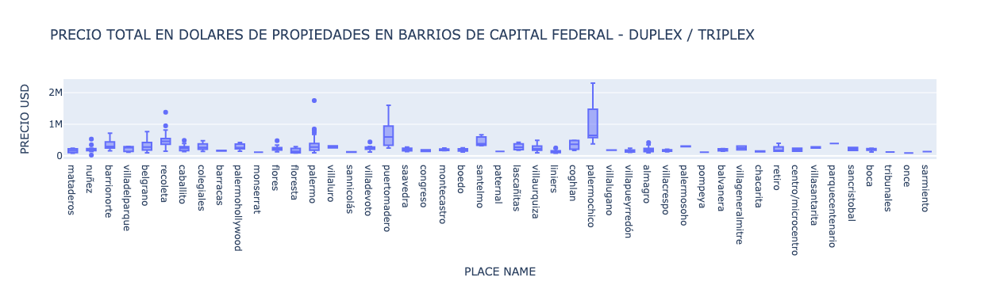

In [336]:
df_duplex_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='duplex/triplex')]
fig = px.box(df_duplex_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - DUPLEX / TRIPLEX')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [337]:
precio_outliers_duplex_caba = ['nuñez','recoleta','caballito','flores','palermo','villadevoto','liniers','almagro']


for outliers in precio_outliers_duplex_caba:
    q1 = df_duplex_capitalfederal[df_duplex_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_duplex_capitalfederal[df_duplex_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_duplex_max = df_duplex_capitalfederal[np.logical_and(df_duplex_capitalfederal['PLACE NAME']==outliers, df_duplex_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_duplex_min = df_duplex_capitalfederal[np.logical_and(df_duplex_capitalfederal['PLACE NAME']==outliers, df_duplex_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_duplex_max)
    df = df.drop(index_outlier_duplex_min)
    


In [338]:
df_duplex_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='duplex/triplex')]
df_duplex_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,42.000,238.000,68.000,357.000,278.000,267.000,370.000,370.000
mean,5.571,3.277,4046.912,99.641,111.748,2611.252,340604.181,292798.899
std,4.379,1.158,3047.801,45.565,51.092,944.075,611724.974,216907.699
min,1.000,1.000,300.000,48.000,50.000,900.000,82000.000,82000.000
25%,2.000,2.000,1897.500,64.000,71.000,1975.397,175000.000,175000.000
50%,4.500,3.000,3000.000,85.000,98.000,2451.923,235000.000,235000.000
75%,8.750,4.000,6000.000,129.000,143.750,2946.239,339000.000,335000.000
max,15.000,8.000,17000.000,290.000,350.000,6611.111,9435376.000,2300000.000


#### Piso/Penthouses - usd

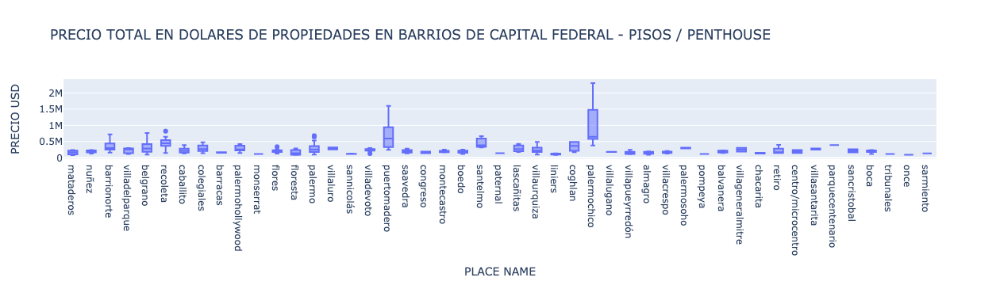

In [339]:
df_pisos_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')]
fig = px.box(df_duplex_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - PISOS / PENTHOUSE')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [340]:
precio_outliers_pisos_caba = ['recoleta','flores','palermo']


for outliers in precio_outliers_pisos_caba:
    q1 = df_pisos_capitalfederal[df_pisos_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_pisos_capitalfederal[df_pisos_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_pisos_max = df_pisos_capitalfederal[np.logical_and(df_pisos_capitalfederal['PLACE NAME']==outliers, df_pisos_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_pisos_min = df_pisos_capitalfederal[np.logical_and(df_pisos_capitalfederal['PLACE NAME']==outliers, df_pisos_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_pisos_max)
    df = df.drop(index_outlier_pisos_min)
    


In [341]:
df_pisos_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')]
df_pisos_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,66.000,514.000,292.000,801.000,747.000,674.000,766.000,766.000
mean,4.515,5.222,12627.801,245.911,272.185,3445.701,942006.598,940111.216
std,3.425,1.606,8049.777,126.290,81.432,2245.485,799662.402,799959.463
min,1.000,1.000,850.000,48.000,68.000,268.470,76900.000,76900.000
25%,1.250,4.000,7000.000,198.000,220.000,2148.946,490000.000,490000.000
50%,4.000,5.000,12000.000,231.000,250.000,2913.921,735000.000,732500.000
75%,6.750,6.000,16000.000,290.000,310.000,4218.216,1190000.000,1190000.000
max,14.000,14.000,70000.000,2949.000,666.000,20731.707,8500000.000,8500000.000


In [342]:
index_sup_cuv = df_pisos_capitalfederal.sort_values('SUPERFICIE CUBIERTA EN M2',ascending = False)[:5].index
df_pisos_capitalfederal.sort_values('SUPERFICIE CUBIERTA EN M2',ascending = False)[:5]\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
47225,2949.000,NaN,NaN,76900.000,monoambienteconcocinaamericanaenbelgranor
34762,655.000,NaN,NaN,2499000.000,vendepisobarrancasbelgrano8ambpiletapropia
48414,639.000,639.000,624.413,399000.000,moreno1500
43326,611.000,666.000,NaN,NaN,eylepetrona300
11223,600.000,600.000,7500.000,4500000.000,torrerenoirii-pisode600m²vistaalrio7ambcon4cocheras


In [343]:
# Dropeo el primer indice, ya que el valor de sup cuv esta mal ingresado.

df = df.drop(index_sup_cuv[0])

### Correlacion entre variables

**Vamos a seguir trabajando solo con capital federal y sus barrios**

##### CORRELACION EN APARTAMENTOS UBICADOS EN CAPITAL FEDERAL

In [344]:
sanjose=df[np.logical_and(df['place_name']=='capitalfederal',df['PLACE NAME']=='sanjose')].index
df.loc[sanjose,'place_name']='sanjose'


In [345]:
suipacha=df[np.logical_and(df['place_name']=='capitalfederal',df['PLACE NAME']=='suipacha')].index
df.loc[suipacha,'PLACE NAME']='monserrat'

In [346]:
lima=df[np.logical_and(df['place_name']=='capitalfederal',df['PLACE NAME']=='lima')].index
df.loc[lima,'PLACE NAME']='santarita'

In [347]:
laprida = df[np.logical_and(df['place_name']=='capitalfederal',df['PLACE NAME']=='laprida')].index
df.loc[laprida[0],'PLACE NAME']='recoleta'
df = df.drop(laprida[1])

In [348]:
florida=df[np.logical_and(df['place_name']=='capitalfederal',df['PLACE NAME']=='florida')].index
df.loc[florida,'state_name']='bsasgbazonanorte'


In [349]:
sanjos=df[np.logical_and(df['place_name']=='sanjose',df['PLACE NAME']=='sanjose')].index
df.loc[sanjos[:2],'state_name']='bsasgbazonasur'

### Variables Cuantitativas y Categoricas

Creamos la variable ZONAS COMUNALES, donde vamos a categorizar los distintos barrios de capital por las comunas donde se encuentran

In [399]:
comunas_dict={
'constitucion':'ZONA ESTE COMUNAL',
'catalinas':'ZONA ESTE COMUNAL',
'libertad':'ZONA ESTE COMUNAL',
'retiro':'ZONA ESTE COMUNAL',
'sannicolás':'ZONA ESTE COMUNAL',
'puertomadero':'ZONA ESTE COMUNAL',
'santelmo':'ZONA ESTE COMUNAL',
'montserrat':'ZONA ESTE COMUNAL',
'monserrat':'ZONA ESTE COMUNAL',
'constitución':'ZONA ESTE COMUNAL',
'centro/microcentro':'ZONA ESTE COMUNAL',
'centro':'ZONA ESTE COMUNAL',
'tribunales':'ZONA ESTE COMUNAL',
'sannicolás':'ZONA ESTE COMUNAL',
'recoleta':'ZONA ESTE COMUNAL',
'barrionorte':'ZONA ESTE COMUNAL',
'billinghurst':'ZONA ESTE COMUNAL',
'balvanera':'ZONA ESTE COMUNAL',
'sancristobal':'ZONA ESTE COMUNAL',
'abasto':'ZONA ESTE COMUNAL',
'congreso':'ZONA ESTE COMUNAL',
'sarmiento':'ZONA ESTE COMUNAL',
'once':'ZONA ESTE COMUNAL',
'fernandez':'ZONA ESTE COMUNAL',
'corrientes':'ZONA ESTE COMUNAL',
'boca':"ZONA SUR COMUNAL",
'barracas':"ZONA SUR COMUNAL",
'parquepatricios':"ZONA SUR COMUNAL",
'pompeya':"ZONA SUR COMUNAL",
'catalinas':"ZONA SUR COMUNAL",
'almagro':"ZONA CENTRO COMUNAL",
'boedo':"ZONA CENTRO COMUNAL",
'donbosco':"ZONA CENTRO COMUNAL",
'caballito':"ZONA CENTRO COMUNAL",
'parquecentenario':"ZONA CENTRO COMUNAL",
'flores':"ZONA CENTRO COMUNAL",
'parquechacabuco':"ZONA CENTRO COMUNAL",
'rivadavia':"ZONA CENTRO COMUNAL",
'villasoldati':"ZONA SUR COMUNAL",
'villariachuelo':"ZONA SUR COMUNAL",
'villalugano':"ZONA SUR COMUNAL",
'liniers':"ZONA OESTE COMUNAL",
'mataderos':"ZONA OESTE COMUNAL",
'parqueavellaneda':"ZONA OESTE COMUNAL",
'avellaneda':"ZONA OESTE COMUNAL",
'villareal':"ZONA OESTE COMUNAL",
'montecastro':"ZONA OESTE COMUNAL", 
'versalles':"ZONA OESTE COMUNAL", 
'floresta':"ZONA OESTE COMUNAL", 
'velezsarsfield':"ZONA OESTE COMUNAL",
'villaluro':"ZONA OESTE COMUNAL",
'villageneralmitre':"ZONA OESTE COMUNAL", 
'villadevoto':"ZONA OESTE COMUNAL", 
'villadelparque':"ZONA OESTE COMUNAL",
'villasantarita':"ZONA OESTE COMUNAL",
'santarita':"ZONA OESTE COMUNAL",
'coghlan':"ZONA NORTE COMUNAL",
'saavedra':"ZONA NORTE COMUNAL",
'villaurquiza':"ZONA NORTE COMUNAL",
'villapueyrredón':"ZONA NORTE COMUNAL",
'nuñez':"ZONA NORTE COMUNAL",
'belgrano':"ZONA NORTE COMUNAL",
'colegiales':"ZONA NORTE COMUNAL",
'palermo':"ZONA NORTE COMUNAL",
'lasheras':"ZONA NORTE COMUNAL",
'palermochico':"ZONA NORTE COMUNAL",
'palermohollywood':"ZONA NORTE COMUNAL",
'palermoviejo':"ZONA NORTE COMUNAL",
'palermosoho':"ZONA NORTE COMUNAL",
'lascañitas':"ZONA NORTE COMUNAL",
'chacarita':"ZONA NORTE COMUNAL",
'villacrespo':"ZONA NORTE COMUNAL",
'paternal':"ZONA NORTE COMUNAL",
'villaortuzar':"ZONA NORTE COMUNAL",
'agronomía':"ZONA NORTE COMUNAL",
'parquechas':"ZONA NORTE COMUNAL",
}


# comunas 12 13 14 15 grupo norte
# comunas 9, 10 y 11 grupo oeste
# comunas 8 y 4 grupo sur
# comunas 1, 2 y 3 grupo este
# comunas 5,6 y 7 grupo centro


df_capitalfederal = df.loc[df.state_name=='capitalfederal']
zonas_comunas_serie = df_capitalfederal['PLACE NAME'].replace(comunas_dict)
df['ZONAS COMUNALES']=zonas_comunas_serie

In [400]:
# comunas_dict={
# 'constitucion':'comuna1',
# 'catalinas':'comuna1',
# 'libertad':'comuna1',
# 'retiro':'comuna1',
# 'sannicolás':'comuna1',
# 'puertomadero':'comuna1',
# 'santelmo':'comuna1',
# 'montserrat':'comuna1',
# 'monserrat':'comuna1',
# 'constitución':'comuna1',
# 'centro/microcentro':'comuna1',
# 'centro':'comuna1',
# 'tribunales':'comuna1',
# 'sannicolás':'comuna1',
# 'recoleta':"comuna2",
# 'barrionorte':'comuna2',
# 'billinghurst':"comuna2",
# 'balvanera':"comuna3",
# 'sancristobal':"comuna3",
# 'abasto':"comuna3",
# 'congreso':"comuna3",
# 'sarmiento':'comuna3',
# 'once':"comuna3",
# 'fernandez':'comuna3',
# 'corrientes':'comuna3',
# 'boca':"comuna4",
# 'barracas':"comuna4",
# 'parquepatricios':"comuna4",
# 'pompeya':"comuna4",
# 'catalinas':"comuna4",
# 'almagro':"comuna5",
# 'boedo':"comuna5",
# 'donbosco':'comuna5',
# 'caballito':"comuna6",
# 'parquecentenario':'comuna6',
# 'flores':"comuna7",
# 'parquechacabuco':"comuna7",
# 'rivadavia':"comuna7",
# 'villasoldati':"comuna8",
# 'villariachuelo':"comuna8",
# 'villalugano':"comuna8",
# 'liniers':"comuna9",
# 'mataderos':"comuna9",
# 'parqueavellaneda':"comuna9",
# 'avellaneda':"comuna9",
# 'villareal':"comuna10",
# 'montecastro':"comuna10", 
# 'versalles':"comuna10", 
# 'floresta':"comuna10", 
# 'velezsarsfield':"comuna10",
# 'villaluro':"comuna10",
# 'villageneralmitre':"comuna11", 
# 'villadevoto':"comuna11", 
# 'villadelparque':"comuna11",
# 'villasantarita':"comuna11",
# 'santarita':'comuna11',
# 'coghlan':"comuna12",
# 'saavedra':"comuna12",
# 'villaurquiza':"comuna12",
# 'villapueyrredón':"comuna12",
# 'nuñez':"comuna13",
# 'belgrano':"comuna13",
# 'colegiales':"comuna13",
# 'palermo':"comuna14",
# 'lasheras':'comuna14',
# 'palermochico':"comuna14",
# 'palermohollywood':"comuna14",
# 'palermoviejo':"comuna14",
# 'palermosoho':'comuna14',
# 'lascañitas':"comuna14",
# 'chacarita':"comuna15",
# 'villacrespo':"comuna15",
# 'paternal':"comuna15",
# 'villaortuzar':"comuna15",
# 'agronomía':"comuna15",
# 'parquechas':"comuna15",
# }


# # juntamos comuna 8 y 4 (comunas lado sur)
# # juntamos comuna 11 y 15 (comunas centro)
# # juntamos comuna 9 y 10 (comunas oeste)
# # juntamos comuna 12 y 13 (comunas norte)

# color = sns.color_palette("husl", 15)

# dict_colors={'comuna1':color[0],
#             'comuna2':color[1],
#             'comuna3':color[2],
#             'comuna4':color[3],
#             'comuna5':color[4],
#             'comuna6':color[5],
#             'comuna7':color[6],
#             'comuna8':color[7],
#             'comuna9':color[8],
#             'comuna10':color[9],
#             'comuna11':color[10],
#             'comuna12':color[11],
#             'comuna13':color[12],
#             'comuna14':color[13],
#             'comuna15':color[14]
# }

# df_capitalfederal = df.loc[df.state_name=='capitalfederal']
# comunas_serie = df_capitalfederal['PLACE NAME'].replace(comunas_dict)
# df['COMUNAS']=comunas_serie

In [401]:
def correlation_plotter(data_to_plot,cols_to_plot):
    g = sns.PairGrid(data_to_plot, vars=cols_to_plot, hue='COMUNAS' ,palette='bright')
    g.map(plt.scatter, alpha=0.6)
    g.add_legend();
    plt.show()

In [402]:
df_corr_capitalfederal_apartment = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='apartment')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','floor','rooms','expenses','PLACE NAME','COMUNAS']]
df_corr_capitalfederal_apartment.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,floor,rooms,expenses
PRECIO USD POR M2,1.000,0.707,0.080,0.164,0.386,-0.089,0.391
PRECIO USD,0.707,1.000,0.695,0.695,0.301,0.331,0.717
SUPERFICIE TOTAL EN M2,0.080,0.695,1.000,0.916,0.101,0.606,0.590
SUPERFICIE CUBIERTA EN M2,0.164,0.695,0.916,1.000,0.073,0.637,0.616
floor,0.386,0.301,0.101,0.073,1.000,0.038,0.208
rooms,-0.089,0.331,0.606,0.637,0.038,1.000,0.300
expenses,0.391,0.717,0.590,0.616,0.208,0.300,1.000


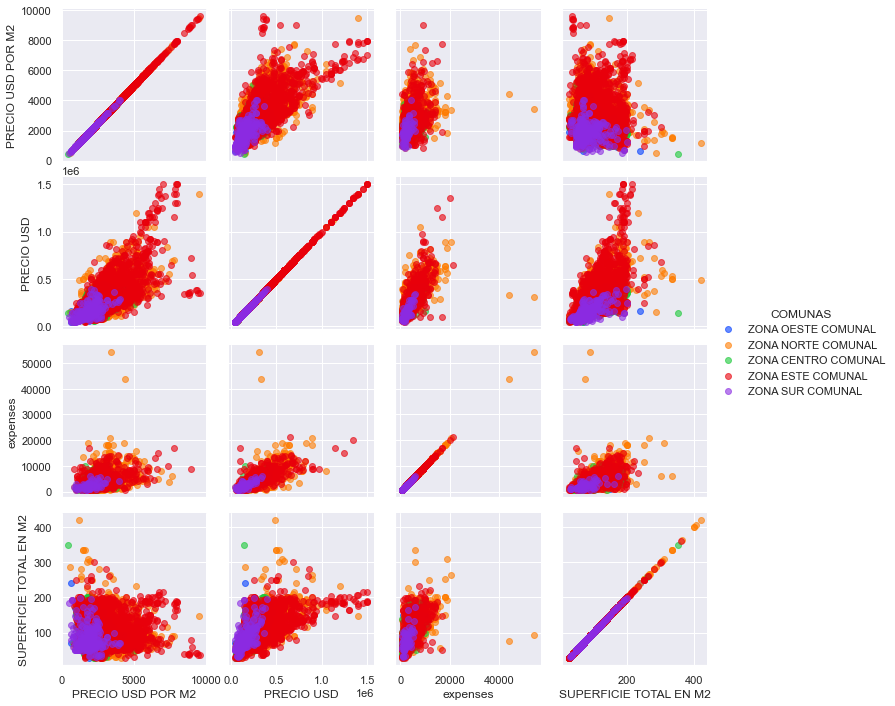

In [403]:
correlation_plotter(df_corr_capitalfederal_apartment,['PRECIO USD POR M2','PRECIO USD','expenses','SUPERFICIE TOTAL EN M2'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones DEPARTAMENTOS:
  
   * Las zonas comunales Norte y Este son las que presentan los departamentos mas caros, mientras que la Zona comunal Sur, es la que presenta los mas                economicos.
   
   * Las Zona comunales Norte y Este, tambien son los que presentan los departamentos con mas SUPERFICIE TOTAL EN M2.

   * Podemos ver que logicamente hay una correlacion `POSITIVA` con el PRECIO USD.
   
   * Podemos ver que hay una correlacion `POSITIVA` con el valor de las EXPENSAS del departamento, departamentos ubicados en zonas mas costosas o que tienen        mas amenities, suelen tener un PRECIO USD POR M2 mayor.
   
   * Podemos ver que hay una correlacion `POSITIVA` con el valor de SUPERFICIE del departamento.

##### CORRELACION EN CASAS UBICADAS EN CAPITAL FEDERAL

In [404]:
df_corr_capitalfederal_houses = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','rooms','expenses','PLACE NAME','COMUNAS']]
df_corr_capitalfederal_houses.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,rooms,expenses
PRECIO USD POR M2,1.000,0.569,-0.139,0.070,0.020,0.372
PRECIO USD,0.569,1.000,0.584,0.677,0.382,-0.457
SUPERFICIE TOTAL EN M2,-0.139,0.584,1.000,0.775,0.376,-0.171
SUPERFICIE CUBIERTA EN M2,0.070,0.677,0.775,1.000,0.543,-0.449
rooms,0.020,0.382,0.376,0.543,1.000,NaN
expenses,0.372,-0.457,-0.171,-0.449,NaN,1.000


In [405]:
drop=df_corr_capitalfederal_houses[df_corr_capitalfederal_houses['PLACE NAME']=='sanjose'].index
df=df.drop(drop)

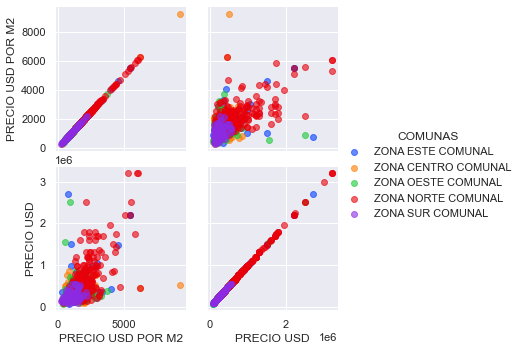

In [406]:
correlation_plotter(df_corr_capitalfederal_houses,['PRECIO USD POR M2','PRECIO USD'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones CASAS:

   * Al igual que con los departamentos, las casas mas caras, las encontramos en la Zona Comunal Norte.

   * Podemos ver que logicamente hay una correlacion `POSITIVA` con el PRECIO USD.
   

##### CORRELACION EN PHs UBICADOS EN CAPITAL FEDERAL

In [407]:
df_corr_capitalfederal_ph = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='ph')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','rooms','expenses','PLACE NAME',"COMUNAS"]]
df_corr_capitalfederal_ph.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,rooms,expenses
PRECIO USD POR M2,1.000,0.208,-0.482,-0.359,-0.281,0.179
PRECIO USD,0.208,1.000,0.689,0.647,0.486,0.244
SUPERFICIE TOTAL EN M2,-0.482,0.689,1.000,0.843,0.619,0.132
SUPERFICIE CUBIERTA EN M2,-0.359,0.647,0.843,1.000,0.628,0.288
rooms,-0.281,0.486,0.619,0.628,1.000,0.016
expenses,0.179,0.244,0.132,0.288,0.016,1.000


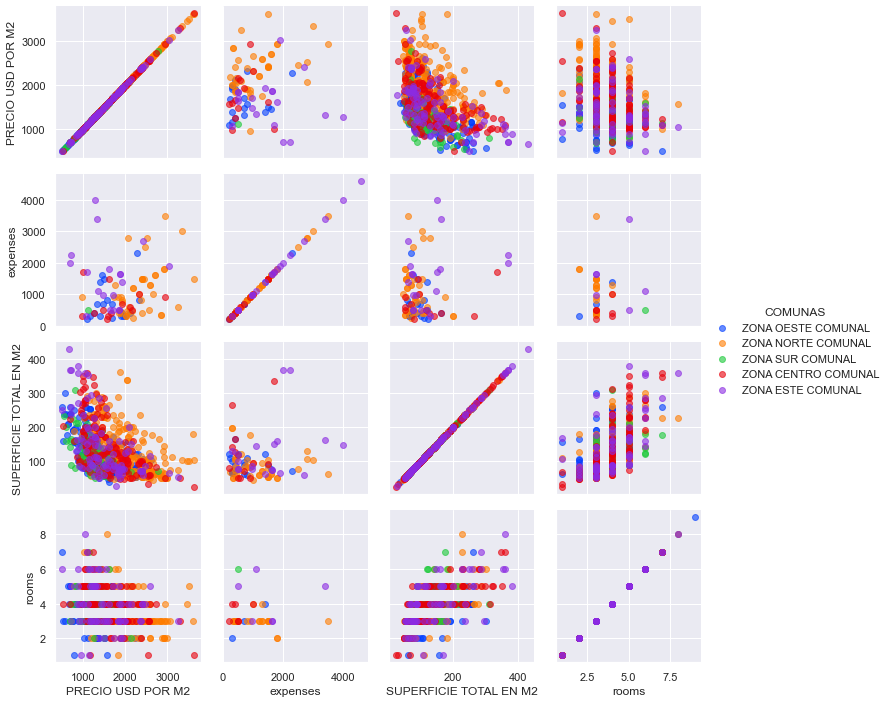

In [408]:
correlation_plotter(df_corr_capitalfederal_ph,['PRECIO USD POR M2','expenses','SUPERFICIE TOTAL EN M2','rooms'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones PHs:
   
   * Los PH que mayores EXPENSAS pagan, se encuentran en la ZONA ESTE COMUNAL y la ZONA NORTE COMUNAL.
   
   * Los PH de mayores dimensiones los encontramos en la ZONA ESTE COMUNAL y la ZONA NORTE COMUNAL.
   
   * Podemos ver que hay una correlacion `NEGATIVA` entre el PRECIO USD POR M2 y las SUPERFICIES que ocupa el PH, a medida que aumentan las dimensiones de los      PH, el PRECIO USD POR M2, va disminuyendo.
    
   * Podemos ver que hay una correlacion `NEGATIVA` entre el PRECIO USD POR M2 y la cantidad de ambientes del PH, lo cual esta relacionado con la conclusion        anterior sobre las dimensiones del PH.
   
   * Podemos ver que hay una correlacion `POSITIVA` entre el PRECIO USD POR M2 y las EXPENSAS que paga el PH, esto se debe probablemente, porque                    PHs ubicados en zonas mas costosas pagan mayores expensas.

##### CORRELACION EN DEPOSITOS UBICADOS EN CAPITAL FEDERAL

In [409]:
df_corr_capitalfederal_depositos = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='deposito')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','rooms','expenses','PLACE NAME',"COMUNAS"]]
df_corr_capitalfederal_depositos.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,rooms,expenses
PRECIO USD POR M2,1.000,0.228,-0.290,-0.307,-0.214,0.289
PRECIO USD,0.228,1.000,0.772,0.590,0.469,0.510
SUPERFICIE TOTAL EN M2,-0.290,0.772,1.000,0.940,0.593,0.473
SUPERFICIE CUBIERTA EN M2,-0.307,0.590,0.940,1.000,0.689,0.562
rooms,-0.214,0.469,0.593,0.689,1.000,0.544
expenses,0.289,0.510,0.473,0.562,0.544,1.000


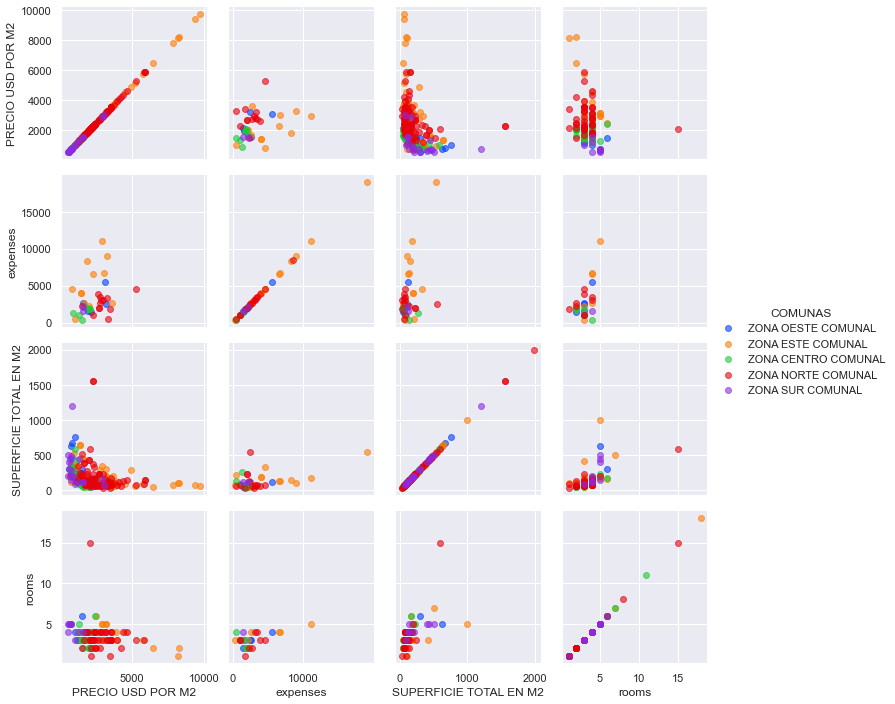

In [410]:
correlation_plotter(df_corr_capitalfederal_depositos,['PRECIO USD POR M2','expenses','SUPERFICIE TOTAL EN M2','rooms'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones DEPOSITOS:

*nota: Se tomo como Deposito desde Naves Industriales, hasta inmuebles que ofrecian un Deposito.*

   * Los depositos que mas expensas pagan, se encuentran en la ZONA COMUNAL ESTE.

   * Hay una pequeña correlacion `NEGATIVA`, entre el PRECIO USD POR M2 y las dimensiones del deposito.
       
   * Pareciera existir una correlacion `POSITIVA` entre el PRECIO USD POR M2 y las EXPENSAS que paga el DEPOSITO, pero al ser una cantidad pequeña de datos,        hay que tener cuidado con esta conclusion, no sabemos si es representativa.

##### CORRELACION EN STORES UBICADOS EN CAPITAL FEDERAL

In [411]:
df_corr_capitalfederal_stores = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','rooms','expenses','PLACE NAME',"COMUNAS"]]
df_corr_capitalfederal_stores.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,rooms,expenses
PRECIO USD POR M2,1.000,0.167,-0.210,-0.208,-0.343,-0.129
PRECIO USD,0.167,1.000,0.816,0.754,0.012,0.092
SUPERFICIE TOTAL EN M2,-0.210,0.816,1.000,0.997,0.484,0.051
SUPERFICIE CUBIERTA EN M2,-0.208,0.754,0.997,1.000,0.431,0.040
rooms,-0.343,0.012,0.484,0.431,1.000,0.997
expenses,-0.129,0.092,0.051,0.040,0.997,1.000


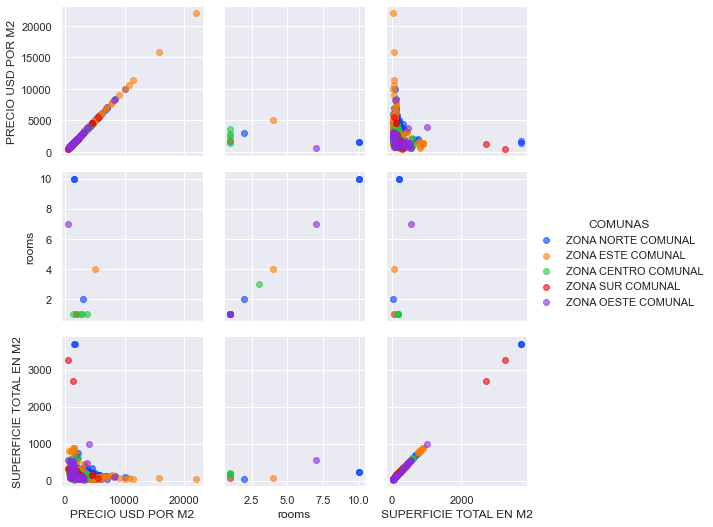

In [412]:
correlation_plotter(df_corr_capitalfederal_stores,['PRECIO USD POR M2','rooms','SUPERFICIE TOTAL EN M2'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones STORES:

   * Pareciera haber una correlacion `NEGATIVA` entre el PRECIO USD POR M2 y la SUPERFICIE, Stores de mayores superficies, su PRECIO USD POR M2 va                  disminuyendo.
   
   * Pareciera haber una correlacion `NEGATIVA` entre el PRECIO USD POR M2 y la cantidad de AMBIENTES del STORE, pero al ser una cantidad pequeña de datos, hay      que tener cuidado con esta conclusion, puede no ser representativa.

##### CORRELACION EN PISOS/SEMI-PISOS/PENTHOUSES UBICADOS EN CAPITAL FEDERAL

In [364]:
df_corr_capitalfederal_pisos = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','rooms','expenses','PLACE NAME',"COMUNAS"]]
df_corr_capitalfederal_pisos.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,rooms,expenses
PRECIO USD POR M2,1.000,0.899,0.179,0.309,-0.097,0.536
PRECIO USD,0.899,1.000,0.503,0.514,0.021,0.604
SUPERFICIE TOTAL EN M2,0.179,0.503,1.000,0.830,0.317,0.326
SUPERFICIE CUBIERTA EN M2,0.309,0.514,0.830,1.000,0.406,0.469
rooms,-0.097,0.021,0.317,0.406,1.000,0.156
expenses,0.536,0.604,0.326,0.469,0.156,1.000


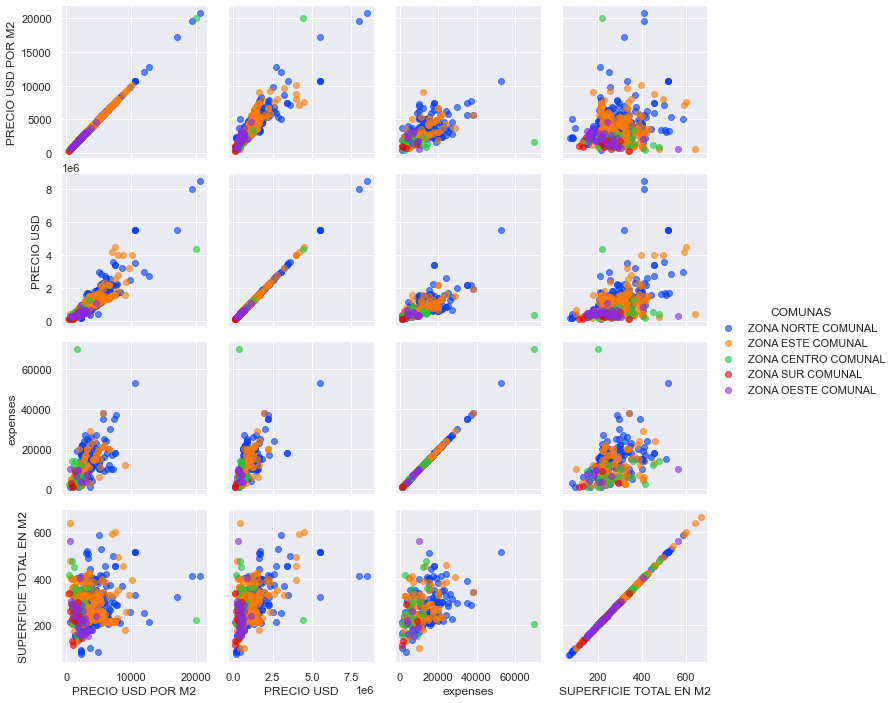

In [414]:
correlation_plotter(df_corr_capitalfederal_pisos,['PRECIO USD POR M2','PRECIO USD','expenses','SUPERFICIE TOTAL EN M2'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones PISOS/SEMI-PISOS/PENTHOUSES:

   * Los PISOS mas costosos, se encuentran en la ZONA NORTE COMUNAL
   
   * Los PISOS que mayor costos de expensas tienen, se encuentran en la ZONA NORTE COMUNAL.
   
   * Los PISOS de mayores dimensiones se encuentran en la ZONA ESTE COMUNAL.

   * Podemos ver que hay una correlacion `POSITIVA` con el PRECIO USD.
   
   * Podemos ver que hay una correlacion `POSITIVA` con el valor de las EXPENSAS del PISO, inmuebles ubicados en zonas mas costosas o que tienen mas amenities,      suelen tener un PRECIO USD POR M2 mayor.
   
   * A diferencia de otras propiedades, donde el PRECIO USD POR M2, disminuia conforme aumentaban las dimensiones de la propiedad, en este caso, podemos ver        que hay una correlacion `POSITIVA` entre las SUPERFICIES y el PRECIO USD POR M2, similar a lo que ocurre con los apartamentos, al aumentar la superficie        del inmueble, el PRECIO USD POR M2, tiene a aumentar.


## 8) Analisis y Operacion Sobre Datos Faltantes

In [366]:
df[['PLACE NAME','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRICE','CURRENCY','PRECIO USD','TIPO DE PROPIEDAD']].isnull().sum()/df.shape[0]*100

PLACE NAME                0.001
SUPERFICIE TOTAL EN M2   34.918
PRECIO USD POR M2        44.793
PRICE                    14.152
CURRENCY                 14.152
PRECIO USD               17.706
TIPO DE PROPIEDAD         0.000
dtype: float64

En primer lugar, vemos que podemos imputar algunos valores de PRECIO USD POR M2, a partir de SUPERFICIE TOTAL EN M2 y PRECIO USD

In [367]:
df_PRECIO_USD_POR_M2_NULL_mask=df['PRECIO USD POR M2'].isnull()


df.loc[df_PRECIO_USD_POR_M2_NULL_mask,'PRECIO USD POR M2'] = df[['PRECIO USD','SUPERFICIE TOTAL EN M2']].apply(lambda x: x['PRECIO USD']/x['SUPERFICIE TOTAL EN M2'], axis=1)

In [368]:
df[['PLACE NAME','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRICE','CURRENCY','PRECIO USD','TIPO DE PROPIEDAD']].isnull().sum()/df.shape[0]*100

PLACE NAME                0.001
SUPERFICIE TOTAL EN M2   34.918
PRECIO USD POR M2        43.082
PRICE                    14.152
CURRENCY                 14.152
PRECIO USD               17.706
TIPO DE PROPIEDAD         0.000
dtype: float64

Logramos bajar un 1% aproximadamente

## SUPERFICIE TOTAL EN M2 - IMPUTACION

De acuerdo, y en mi caso lo pensaría así. Ya en parte 'afectaste' el target en aquellos registros que se calcularon dividiendo el PRICE por la mediana imputada. (y tal vez sería más estricto, por ej, tomando además de la zona para calcular la mediana, la cantidad de ambientes, por ej) Una vez hecho eso, vería cuánto se afectó el target, es decir cómo quedó la nueva distribución respecto de la original (por ejemplo, comparando un scatterplot de USD_por_m2 contra Sup_m2 antes y después de imputar). Si no cambió,  y la cantidad de datos recupetados lo amerita, me quedo con la imputación (y este criterio lo miraría por barrio). Sino, no. Si luego me quedaron nans, es porque no los pude rescatar de ninguna manera, con lo cual lo único que voy a hacer si imputo es generar datos totalmente inventados en función de una mediana, 'matando' la varianza que pudiera haber. Eso último no lo haría.
para mirar si cambió o no la distribución despuués de imputar, podés hacer un gráfico de antes y después de los precios

In [369]:
444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444

444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444

### Floor

Sabemos que los departamentos que se encuentran en los pisos superiores de los edificios, suelen tener precios superiores a los que se encuentran cerca de la planta baja, pero nuestra columna floor, esta muy vacia, vamos a ver si podemos completarla con la informacion que encontramos en la columna 'description'

In [370]:
df.property_type.value_counts()

house        31831
apartment    29239
ph            3866
store         2587
Name: property_type, dtype: int64

In [371]:
departamento_mask = df.property_type=='apartment'
patron_piso = re.compile(r'(\d+(º)?(\s)?(piso))|((piso)(\s)?\d+(º)?)')

encuentra_piso=df.loc[departamento_mask,'description'].apply(lambda x: re.search(patron_piso,str(x)))

encuentra_piso_mask=encuentra_piso.notnull()

pisos=encuentra_piso[encuentra_piso_mask].apply(lambda x: x.group())


In [372]:
# pisos.shape
pisos.sample(10)

64459    piso15º
10802     1ºpiso
19938      piso7
71404      piso7
62267     3ºpiso
10803     1ºpiso
4143       piso4
7402      4ºpiso
78507      2piso
24031     piso11
Name: description, dtype: object

Nuestro REGEX matchea dentro de todo bastante bien, solo debemos filtrar algunos valores altos. Pero primero, vamos a filtrar y convertir a int, nuestra variable pisos

In [373]:
pisos_sin_piso=pisos.replace("piso"," ",regex=True)
pisos_sin_piso = pisos_sin_piso.apply(lambda x: str(x).strip())
pisos_clean_str = pisos_sin_piso.replace("º","",regex=True)
pisos_int = pisos_clean_str.apply(lambda y: int(y))
pisos_int.sample(5)

76969     6
67071    23
10971     5
47956     8
6498      7
Name: description, dtype: int64

Ahora, voy a intentar sacarme de encima a los pocos valores que el regex me tomo por error, primero defino con mi criterio, que los edificios no pueden tener mas de 40 pisos

In [374]:
pisos_filtrado_mask = pisos_int <= 50

pisos_filtrado_menor50=pisos_int[pisos_filtrado_mask]

Text(0, 0.5, 'CANTIDAD DE DEPARTAMENTOS')

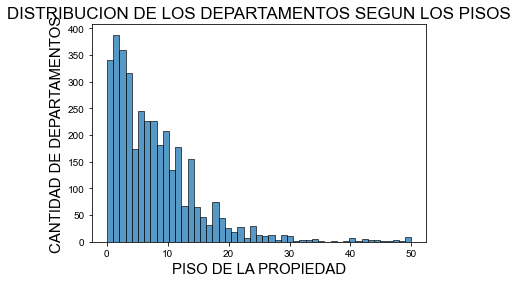

In [375]:
g=sns.histplot(pisos_filtrado_menor50)
sns.set(rc = {'figure.figsize':(15,6)})
g.set_title("DISTRIBUCION DE LOS DEPARTAMENTOS SEGUN LOS PISOS", fontsize = 17)
g.set_xlabel("PISO DE LA PROPIEDAD", fontsize = 15)
g.set_ylabel("CANTIDAD DE DEPARTAMENTOS", fontsize = 15)

La gran mayoria de los departamentos, rondan entre el 2do y 10mo piso

In [376]:
pisos_filtrado_menor50.median()

7.0

Porcentaje de valores faltantes en floor para viviendas tipo departamento

In [377]:
df.floor[departamento_mask].isnull().sum()/df.floor[departamento_mask].shape[0]*100

89.42508293717295

Ahora con estos valores de pisos, voy a imputar mi columna floor, en las filas donde property_type sea apartment y floor tenga valor nan

In [378]:
null_floor_mask = df.floor.isnull()
departamento_mask
departamento_y_floor_null=np.logical_and(departamento_mask,null_floor_mask)

df.loc[departamento_y_floor_null,'floor']=pisos_filtrado_menor50

In [379]:
df.floor[departamento_mask].isnull().sum()/df.floor[departamento_mask].shape[0]*100

78.56629843701906

Bajo el porcentaje de nulos, pero aun sigue siendo muy alto para tomar esta columna como relevante.

### Rooms

Es posible que la cantidad de ambientes en los departamentos, que se encuentren en la misma zona (place_name), influya en el valor del inmueble, pero tenemos un 60.9% de columnas Null, veremos si podemos obtener alguna informacion de la columna description, como hicimos con floor.

In [380]:
patron_ambientes = re.compile(r'\d+(\s)?(ambiente(s)?)|\d+(\s)?(amb(\.)?)')


encuentra_ambientes=df.loc[departamento_mask,'description'].apply(lambda x: re.search(patron_ambientes,str(x)))

encuentra_ambientes_mask=encuentra_ambientes.notnull()

ambientes=encuentra_ambientes[encuentra_ambientes_mask].apply(lambda x: x.group())
ambientes.sample(30)
# ambientes.shape
ambientes.value_counts()

3ambientes        4741
2ambientes        2698
4ambientes        2073
3amb               884
2amb               587
                  ... 
1525 amb             1
42026amb             1
310amb               1
16003amb             1
77003ambientes       1
Name: description, Length: 89, dtype: int64

Podemos ver que nuestro Regex funciono bastante bien, pero hay alguno valores que hay que filtrar, para esto primero vamos a convertir a dato numerico 

In [381]:
ambientes_sin_ambientes=ambientes.replace("ambientes"," ",regex=True)
ambientes_sin_ambientes_sin_ambiente=ambientes_sin_ambientes.replace("ambiente"," ",regex=True)
ambientes_sin_ambientes_sin_ambiente_sin_amb=ambientes_sin_ambientes_sin_ambiente.replace("amb(\.)?"," ",regex=True)

ambientes_clean_str = ambientes_sin_ambientes_sin_ambiente_sin_amb.apply(lambda x: str(x).strip())
ambientes_int = ambientes_clean_str.apply(lambda y: int(y))
ambientes_int.sample(5)

58128    2
28879    2
24609    4
83922    4
71168    2
Name: description, dtype: int64

Voy a tomar un criterio de que mas de 10 ambientes, en un departamento, es un valor incorrecto

In [382]:
ambientes_menor_10=ambientes_int<10
ambientes_clean=ambientes_int[ambientes_menor_10]

Text(0, 0.5, 'CANTIDAD DE DEPARTAMENTOS')

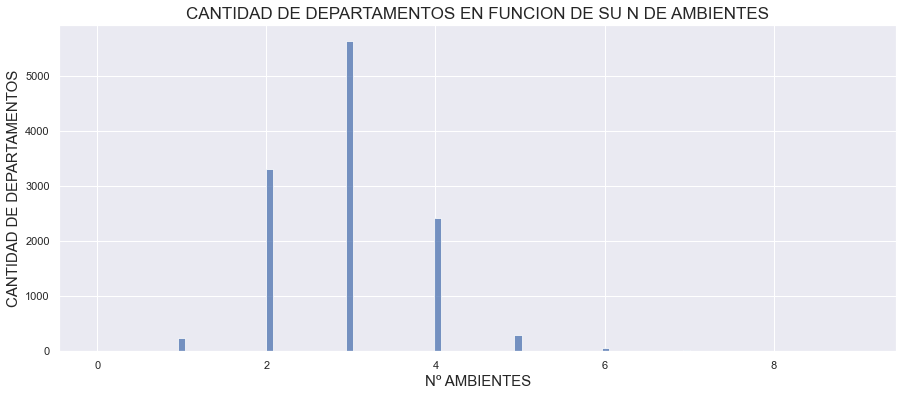

In [383]:
g1=sns.histplot(ambientes_clean)
sns.set(rc = {'figure.figsize':(15,6)})
g1.set_title("CANTIDAD DE DEPARTAMENTOS EN FUNCION DE SU N DE AMBIENTES", fontsize = 17)
g1.set_xlabel("Nº AMBIENTES", fontsize = 15)
g1.set_ylabel("CANTIDAD DE DEPARTAMENTOS", fontsize = 15)

Podemos observar que la gran mayoria de los departamentos en venta, tienen 2 y 3 ambientes

Porcentaje de valores faltantes en la columna rooms, para viviendas tipo departamento.

In [384]:
df.rooms[departamento_mask].isnull().sum()/df.rooms[departamento_mask].shape[0]*100

50.09405246417457

Ahora vamos a imputar con ambientes_clean, algunos de los valores faltantes de rooms

In [385]:
rooms_null_mask=df.rooms.isnull()
departamento_rooms_null_mask = np.logical_and(rooms_null_mask,departamento_mask)

df.loc[departamento_rooms_null_mask,'rooms']=ambientes_clean

df.rooms[departamento_mask].isnull().sum()/df.rooms[departamento_mask].shape[0]*100

32.58661376928075

Podemos ver como bajamos casi un 20% el valor de NaN rows en los inmuebles tipo departamento

## 10) Generacion de nuevas variables explicativas

### Cocheras

Vamos a filtrar los departamentos que tengan cochera, para estudiar si el precio por m2 aumenta en estos casos.

In [386]:
df_departamentos = df[departamento_mask]

patron_cochera = re.compile(r'cochera(s)?|garage(s)?|garaje(s)?')

encuentra_cochera=df.loc[departamento_mask,'description'].apply(lambda x: re.search(patron_cochera,str(x)))

departamentos_con_cochera_mask=encuentra_cochera.notnull()


departamentos_con_cochera = df_departamentos[departamentos_con_cochera_mask]
departamentos_con_cochera.sample(3)

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,COMUNAS
60510,sell,apartment,tigre,|argentina|bsasgbazonanorte|tigre|,argentina,bsasgbazonanorte,3427753.000,NaN,NaN,NaN,105000.000,usd,1852672.500,105000.000,53.000,53.000,1981.132,1981.132,NaN,2.000,1020.000,http://wwwproperaticomar/1ayxl_venta_departamento_tigre_balcon_parrilla_piscina_sum_luminoso_garage_impecable_apto-credito-hipotecario_inmobiliaria-pastura_ggi,"preciosodepartamento2ambientesenimpecableestadoymuyluminoso,ubicadoatrescuadrasdelpuertodefrutos,casinodetigreyparquedelacostacuentacon:cocina,livingcomedor,bañoybalconconparrillacocheracubierta,sumypiscinaaptocréditocódigodelapropiedad:iap381833todalainformaciónymedidasprovistasonaproximadasypodránverificarseconladocumentaciónpertinentelaventadelapropiedadestásupeditadaaqueelpropietarioobtengaelnumerodecoticorrespondientenicoláspasturamartilleroycorredorpúblicocsin°:6092pasturanegociosinmobiliariosdir:boulevarddelmirador430-oficina101nordeltatel:mail:web:horarios:lunasab10a18hs",departamento-tigre,https://thumbs4properaticom/8/7blpectq6bwlclooqiyfh2_yfaa=/trim/198x0/smart/filters:strip_icc()/tbcns3-accelerateamazonawscom/pictures/21200544261863548859412701202823030059439146245674855738176104287768973085661jpg,tigre,53.000,53.000,1981.132,105000.000,usd,105000.000,apartment,NaN
26260,sell,apartment,palermosoho,|argentina|capitalfederal|palermo|palermosoho|,argentina,capitalfederal,3430234.000,NaN,NaN,NaN,295000.000,usd,5205127.500,295000.000,105.000,90.000,2809.524,3277.778,NaN,3.000,NaN,http://wwwproperaticomar/18f30_venta_departamento_palermo-soho_balcon_parrilla_terraza_luminoso_garage_placard_mpinus,"contacto:ana11-departamentoendúplexde105m2totales,muyluminosoubicadoenmodernoedificiode6añosdeantigüedadenlaconocidazonadepalermosoho,muypróximoalpologastronómicopresentaennivel1:entrada,lcconsalidaabalcónterrazade15m2condeckyparrilla,cocinaintegrada,bañocompleto,1dormitorioconplacardnivel2:hall,1dormitorioprincipalconamplioplacardybañosuiteyseingresaporescritoriodegenerosasmedidascomunicantealdormitorioprincipalpisosdeporcellanatoenlcycocina,pisosdemaderaendormitorioscalefacciónyaaademásincluyecocherafijaexpensasaprox$2600-importante:noesaptocredito",moderno3ambconescritorio-terrazaconparrilla-uriarte1700-palermo,https://thumbs4properaticom/4/lje6w5pyxolzynji56iapcvoeh0=/trim/198x0/smart/filters:strip_icc()/staticsumapropcom/12111/629353/files/6415205jpg,palermosoho,90.000,105.000,2809.524,295000.000,usd,295000.000,apartment,ZONA NORTE COMUNAL
48271,sell,apartment,olivos,|argentina|bsasgbazonanorte|vicentelópez|olivos|,argentina,bsasgbazonanorte,3430310.000,NaN,NaN,NaN,400000.000,usd,7057800.000,400000.000,NaN,93.000,NaN,4301.075,NaN,NaN,4200.000,http://wwwproperaticomar/1aav1_venta_departamento_olivos_balcon_baulera_gimnasio_lavadero_piscina_terraza_sauna_garage_castro-feijoo-propiedades_gcl,"torrerio,balcon33m2valorcocherau$s30000aceptacedinesalquiladohastaabrildel2017por22,500pesosexclusivatorreinspiradaenlanaturalezaydiseñadaenfuncióndelconfort,laseguridadyelvalorestéticodesarrolladasobreunexcepcionalterrenode3600m2,seproyectacomounedificioemblemáticoydereferenciaenelpuertodeolivostorremayorcuentaconunidadesde70a150m2todasexternasyconampliasterrazaslaubicaciónesestrategica:ametrosdelpuertodeolivos,conimpactantesvistasdelríodelaplatayalpintorescopuerto,sinningúnobstáculoentrelaintimidadyelhorizontecocherafijacubierta(valoru$s30000-)ybauleraplantabajaparquizadade3000m2granterrazaconmirador,piscinaclimatizadaysolariumcondeckgym,saunas,vestuarios,jauladegolf,puttinggreen,salóndeusosmultiplesmicrocine,laundry,cocheradecortesiam,areaderecr

## Piscinas

Vamos a ver de todas las propiedades, cuales tienen pileta, para ver si esto afecta al valor por metro cuadrado de la propiedad

In [387]:
patron_pileta = re.compile(r'piscina|pileta')

encuentra_pileta=df['description'].apply(lambda x: re.search(patron_pileta,str(x)))

inmuebles_con_pileta_mask=encuentra_pileta.notnull()


inmuebles_con_pileta = df[inmuebles_con_pileta_mask]

In [388]:
list(inmuebles_con_pileta.description.sample(1))

['cómodacasaestilochaletbºcºsanandres-villanuevaconvistaalalagunadelbarrio!!sevendeconrentahastaagosto2018pb:granlivingcomedorconchimenea,cocinaconmueblesaltosybajos,bañocompleto,dependenciadeservicio,3dormitoriosprincipalsuiteconbañocompleto,otrosdosconplacardybañocompartidoexterior:pileta,cocheraygaleríadetalles:calefacciónporradiadores,dormitorioprincipalconaireacondicionadosupcubierta:160m²suptotal:800m²precioventau$s260000matriculado:blancagaitancmcpsi5938cel+5491157512210']